In [16]:
# evaluation based likelihood weighting

from daphne import daphne
from primitives import eval_env
import torch
import pickle

ENV = None

def likelihood_weighting_with_report(ast, L):
    result = likelihood_weighting(ast, L)
    returns = torch.stack(result['returns']).float()
    log_weights = torch.stack(result['log_weights'])
    M = torch.max(log_weights)
    normalized_weights = torch.exp(log_weights - M)/torch.sum(torch.exp(log_weights - M))
    
    if returns.dim() == 2:
        weighted_returns = normalized_weights.unsqueeze(dim=1)*returns
        expectation = torch.sum(weighted_returns, dim=0)
        var00 = torch.sum(normalized_weights*returns[:,0]**2) - expectation[0]**2
        var00 = torch.sum(normalized_weights*returns[:,1]**2) - expectation[1]**2
        var01 = torch.sum(normalized_weights*returns[:,0]*returns[:,1]) - expectation[0]*expectation[1]
        variance = torch.tensor([[var00, var01],[var01, var11]])
    else:
        weighted_returns = normalized_weights*returns
        expectation = torch.sum(weighted_returns)
        variance = torch.sum(normalized_weights*returns**2) - expectation**2

    
    print(expectation)
    print(variance)

def likelihood_weighting_and_save(ast, L, filename):
    result = likelihood_weighting(ast, L)
    f = open(filename, 'wb')
    pickle.dump(result, f)
    f.close()


def likelihood_weighting(ast, L):
    """
    Generate likelihood weighted samples from a program desugared by Daphne.
    Args:
        ast: json FOPPL program
        L: number of samples to generate
    Return:
        L samples and likelihood weights in a dictionary
    """
    returns = [None]*L
    log_weights = [None]*L

    for l in range(L):
        print(l)
        returns[l], log_weights[l] = evaluate_program(ast)
        print('\n\n')

    return {'returns': returns, 'log_weights': log_weights}


def evaluate_program(ast):
    """Evaluate a program as desugared by daphne, generate a sample from the prior
    Args:
        ast: json FOPPL program
    Returns: 
        samples with likelihood weights
    """
    global ENV
    ENV = eval_env()
    for defn in ast[:-1]:
        f_name = defn[1]
        f_v_is = defn[2]
        f_expr = defn[3]
        ENV.update({f_name: (f_v_is, f_expr)})
    l = {}
    sig = {'logW': 0}
    ret, sig = evaluate(ast[-1], l, sig)
    return ret, sig['logW']

# inspired by https://norvig.com/lispy.html
def evaluate(e, l, sig):
    # variable reference OR procedure OR just a string
    if isinstance(e, str):        
        # global procedures take precedence over locally defined vars
        if e in ENV:
            return ENV[e], sig
        elif e in l:
            return l[e], sig
        # could allow for hashmaps with string keys; for debugging setting this to fail
        else:
            assert False, "Unknown symbol: {}".format(e)
    # constant number
    elif isinstance(e, (int, float)):   
        return torch.tensor(float(e)), sig
    # if statements
    elif e[0] == 'if':
        (_, test, conseq, alt) = e
        test_value, sig = evaluate(test, l, sig)
        expr = (conseq if test_value else alt)
        return evaluate(expr, l, sig)
    # let statements
    elif e[0] == 'let':
        # get symbol
        symbol = e[1][0]
        # get value of e1
        value, sig = evaluate(e[1][1], l, sig)
        # evaluate e2 with value 
        return evaluate(e[2], {**l, symbol: value}, sig)
    # sample statement
    if e[0] == 'sample':
        dist, sig = evaluate(e[1], l, sig)
        # make sure it is a distribution object
        assert getattr(dist, '__module__', None).split('.')[:2] == ['torch', 'distributions']
        return dist.sample(), sig
    # observe statements
    if e[0] == 'observe':
        dist, sig = evaluate(e[1], l, sig) # get dist
        y, sig = evaluate(e[2], l, sig)    # get observed value
        # make sure it is a distribution object
        assert getattr(dist, '__module__', None).split('.')[:2] == ['torch', 'distributions']
        print("dist: {}".format(dist))
        print("y: {}".format(y))
        print("log_prob: {}".format(dist.log_prob(y)))
        print("sig: {}".format(sig['logW'] + dist.log_prob(y)))
        sig['logW'] = sig['logW'] + dist.log_prob(y)
        return y, sig
    # procedure call, either primitive or user-defined
    else:            
        proc, sig = evaluate(e[0], l, sig)
        # primitives are functions
        if callable(proc):
            args = [None]*len(e[1:])
            for i, arg in enumerate(e[1:]):
                result, sig = evaluate(arg, l, sig)
                args[i] = result
            result = proc(*args)
            return result, sig
        # user defined functions are not
        else:
            # as written in algorithm 6
            v_is, e0 = proc 
            assert(len(v_is) == len(e[1:]))
            c_is = [None]*len(e[1:])
            for i, arg in enumerate(e[1:]):
                result, sig = evaluate(arg, l, sig)
                c_is[i] = result
            l_proc = dict(zip(v_is, c_is))
            return evaluate(e0, {**l, **l_proc}, sig)

In [17]:
import json
f = open('asts/1.json', 'rb')
ast1 = json.load(f)
f.close()
#print(ast1)
#print('\n\n')

f = open('asts/2.json', 'rb')
ast2 = json.load(f)
f.close()
#print(ast2)
#print('\n\n')

f = open('asts/3.json', 'rb')
ast3 = json.load(f)
f.close()
#print(ast3)
#print('\n\n')

f = open('asts/4.json', 'rb')
ast4 = json.load(f)
f.close()
#print(ast4)
#print('\n\n')

f = open('asts/5.json', 'rb')
ast5 = json.load(f)
f.close()
#print(ast5)
#print('\n\n')

In [53]:
result = likelihood_weighting(ast3, 10000)

0
dist: Normal(loc: 12.516910552978516, scale: 0.6084456443786621)
y: 1.100000023841858
log_prob: -176.46707153320312
sig: -176.46707153320312
dist: Normal(loc: -7.64070987701416, scale: 0.3781433403491974)
y: 2.0999999046325684
log_prob: -331.7173156738281
sig: -508.18438720703125
dist: Normal(loc: 0.6548444032669067, scale: 1.0484392642974854)
y: 2.0
log_prob: -1.7892954349517822
sig: -509.97369384765625
dist: Normal(loc: 0.6548444032669067, scale: 1.0484392642974854)
y: 1.899999976158142
log_prob: -1.6714709997177124
sig: -511.6451721191406
dist: Normal(loc: 0.6548444032669067, scale: 1.0484392642974854)
y: 0.0
log_prob: -1.16129732131958
sig: -512.8064575195312
dist: Normal(loc: 0.6548444032669067, scale: 1.0484392642974854)
y: -0.10000000149011612
log_prob: -1.225419282913208
sig: -514.0318603515625
dist: Normal(loc: -7.64070987701416, scale: 0.3781433403491974)
y: -0.05000000074505806
log_prob: -201.42176818847656
sig: -715.45361328125



1
dist: Normal(loc: -16.842697143554688, 

log_prob: -200.66029357910156
sig: -6910.01220703125



24
dist: Normal(loc: 11.49813175201416, scale: 2.6178650856018066)
y: 1.100000023841858
log_prob: -9.769646644592285
sig: -9.769646644592285
dist: Normal(loc: -15.126182556152344, scale: 1.9281837940216064)
y: 2.0999999046325684
log_prob: -41.48271560668945
sig: -51.25236129760742
dist: Normal(loc: 11.49813175201416, scale: 2.6178650856018066)
y: 2.0
log_prob: -8.46320629119873
sig: -59.71556854248047
dist: Normal(loc: -13.416740417480469, scale: 0.10892575234174728)
y: 1.899999976158142
log_prob: -9885.1787109375
sig: -9944.89453125
dist: Normal(loc: 11.49813175201416, scale: 2.6178650856018066)
y: 0.0
log_prob: -11.526915550231934
sig: -9956.421875
dist: Normal(loc: 11.49813175201416, scale: 2.6178650856018066)
y: -0.10000000149011612
log_prob: -11.695422172546387
sig: -9968.1171875
dist: Normal(loc: 11.49813175201416, scale: 2.6178650856018066)
y: -0.05000000074505806
log_prob: -11.610986709594727
sig: -9979.728515625



25
dis

log_prob: -1670.0325927734375
sig: -1670.0325927734375
dist: Normal(loc: 10.618009567260742, scale: 0.11606862396001816)
y: 2.0999999046325684
log_prob: -2691.642578125
sig: -4361.67529296875
dist: Normal(loc: -9.128283500671387, scale: 0.17693738639354706)
y: 2.0
log_prob: -1977.0086669921875
sig: -6338.68408203125
dist: Normal(loc: -3.538217306137085, scale: 1.6811490058898926)
y: 1.899999976158142
log_prob: -6.6704511642456055
sig: -6345.3544921875
dist: Normal(loc: -9.128283500671387, scale: 0.17693738639354706)
y: 0.0
log_prob: -1329.9754638671875
sig: -7675.330078125
dist: Normal(loc: -9.128283500671387, scale: 0.17693738639354706)
y: -0.10000000149011612
log_prob: -1300.9775390625
sig: -8976.3076171875
dist: Normal(loc: -9.128283500671387, scale: 0.17693738639354706)
y: -0.05000000074505806
log_prob: -1315.4365234375
sig: -10291.744140625



51
dist: Normal(loc: -6.723553657531738, scale: 0.5311050415039062)
y: 1.100000023841858
log_prob: -108.78302001953125
sig: -108.7830200195

sig: -3199.8193359375
dist: Normal(loc: -0.923496425151825, scale: 0.8338561058044434)
y: 1.899999976158142
log_prob: -6.46998405456543
sig: -3206.289306640625
dist: Normal(loc: -0.923496425151825, scale: 0.8338561058044434)
y: 0.0
log_prob: -1.3505232334136963
sig: -3207.639892578125
dist: Normal(loc: -0.923496425151825, scale: 0.8338561058044434)
y: -0.10000000149011612
log_prob: -1.2248973846435547
sig: -3208.86474609375
dist: Normal(loc: 12.04423713684082, scale: 0.17673873901367188)
y: -0.05000000074505806
log_prob: -2340.5205078125
sig: -5549.38525390625



77
dist: Normal(loc: 1.5336635112762451, scale: 0.4765247404575348)
y: 1.100000023841858
log_prob: -0.5918024778366089
sig: -0.5918024778366089
dist: Normal(loc: 1.5336635112762451, scale: 0.4765247404575348)
y: 2.0999999046325684
log_prob: -0.8839359879493713
sig: -1.475738525390625
dist: Normal(loc: 4.342777252197266, scale: 2.2279539108276367)
y: 2.0
log_prob: -2.272887706756592
sig: -3.748626232147217
dist: Normal(loc: 1.5

log_prob: -3876.292236328125
sig: -7026.357421875
dist: Normal(loc: -8.052653312683105, scale: 0.11528869718313217)
y: 2.0
log_prob: -3800.284423828125
sig: -10826.6416015625
dist: Normal(loc: -3.5300073623657227, scale: 1.9700442552566528)
y: 1.899999976158142
log_prob: -5.3955535888671875
sig: -10832.037109375
dist: Normal(loc: -3.5300073623657227, scale: 1.9700442552566528)
y: 0.0
log_prob: -3.202342987060547
sig: -10835.2392578125
dist: Normal(loc: -3.5300073623657227, scale: 1.9700442552566528)
y: -0.10000000149011612
log_prob: -3.1126766204833984
sig: -10838.3515625
dist: Normal(loc: -3.5300073623657227, scale: 1.9700442552566528)
y: -0.05000000074505806
log_prob: -3.1571879386901855
sig: -10841.5087890625



102
dist: Normal(loc: -4.883792877197266, scale: 0.6155844330787659)
y: 1.100000023841858
log_prob: -47.677879333496094
sig: -47.677879333496094
dist: Normal(loc: -9.79173755645752, scale: 0.41055166721343994)
y: 2.0999999046325684
log_prob: -419.52191162109375
sig: -467.199

sig: -202.30648803710938
dist: Normal(loc: 7.991359710693359, scale: 0.5251700282096863)
y: 2.0
log_prob: -65.35091400146484
sig: -267.65740966796875
dist: Normal(loc: 14.973220825195312, scale: 0.8481643795967102)
y: 1.899999976158142
log_prob: -119.54296875
sig: -387.20037841796875
dist: Normal(loc: 14.973220825195312, scale: 0.8481643795967102)
y: 0.0
log_prob: -156.58042907714844
sig: -543.7808227539062
dist: Normal(loc: -1.4645589590072632, scale: 0.12387969344854355)
y: -0.10000000149011612
log_prob: -59.49774932861328
sig: -603.278564453125
dist: Normal(loc: 14.973220825195312, scale: 0.8481643795967102)
y: -0.05000000074505806
log_prob: -157.6228790283203
sig: -760.9014282226562



128
dist: Normal(loc: -0.5752728581428528, scale: 0.28821995854377747)
y: 1.100000023841858
log_prob: -16.567373275756836
sig: -16.567373275756836
dist: Normal(loc: 0.8938688039779663, scale: 2.4034998416900635)
y: 2.0999999046325684
log_prob: -1.9217774868011475
sig: -18.489151000976562
dist: Normal

dist: Normal(loc: 6.300272464752197, scale: 1.4777398109436035)
y: 1.100000023841858
log_prob: -7.5013861656188965
sig: -7.5013861656188965
dist: Normal(loc: 6.300272464752197, scale: 1.4777398109436035)
y: 2.0999999046325684
log_prob: -5.348965644836426
sig: -12.850351333618164
dist: Normal(loc: 6.300272464752197, scale: 1.4777398109436035)
y: 2.0
log_prob: -5.543600559234619
sig: -18.393951416015625
dist: Normal(loc: -2.716188907623291, scale: 0.2602924704551697)
y: 1.899999976158142
log_prob: -156.83143615722656
sig: -175.2253875732422
dist: Normal(loc: -2.716188907623291, scale: 0.2602924704551697)
y: 0.0
log_prob: -54.01908493041992
sig: -229.24447631835938
dist: Normal(loc: 6.300272464752197, scale: 1.4777398109436035)
y: -0.10000000149011612
log_prob: -10.688763618469238
sig: -239.93324279785156
dist: Normal(loc: 6.300272464752197, scale: 1.4777398109436035)
y: -0.05000000074505806
log_prob: -10.542791366577148
sig: -250.4760284423828



155
dist: Normal(loc: -6.789444923400879,

dist: Normal(loc: 6.232346534729004, scale: 0.640147864818573)
y: 2.0
log_prob: -22.32893943786621
sig: -214.93463134765625
dist: Normal(loc: 6.232346534729004, scale: 0.640147864818573)
y: 1.899999976158142
log_prob: -23.373950958251953
sig: -238.30857849121094
dist: Normal(loc: -15.723669052124023, scale: 0.9992663264274597)
y: 0.0
log_prob: -124.7166748046875
sig: -363.0252685546875
dist: Normal(loc: -0.6684916615486145, scale: 0.5845740437507629)
y: -0.10000000149011612
log_prob: -0.8549337387084961
sig: -363.88018798828125
dist: Normal(loc: -0.6684916615486145, scale: 0.5845740437507629)
y: -0.05000000074505806
log_prob: -0.9417709112167358
sig: -364.82196044921875



182
dist: Normal(loc: -1.7979241609573364, scale: 1.133642315864563)
y: 1.100000023841858
log_prob: -4.311696529388428
sig: -4.311696529388428
dist: Normal(loc: -1.7979241609573364, scale: 1.133642315864563)
y: 2.0999999046325684
log_prob: -6.9556965827941895
sig: -11.267393112182617
dist: Normal(loc: -1.797924160957

dist: Normal(loc: -18.378765106201172, scale: 0.8426918387413025)
y: 2.0
log_prob: -293.1550598144531
sig: -12475.5966796875
dist: Normal(loc: -7.7986907958984375, scale: 0.08526266366243362)
y: 1.899999976158142
log_prob: -6468.07177734375
sig: -18943.66796875
dist: Normal(loc: -7.7986907958984375, scale: 0.08526266366243362)
y: 0.0
log_prob: -4181.53125
sig: -23125.19921875
dist: Normal(loc: -7.7986907958984375, scale: 0.08526266366243362)
y: -0.10000000149011612
log_prob: -4074.943115234375
sig: -27200.142578125
dist: Normal(loc: -7.7986907958984375, scale: 0.08526266366243362)
y: -0.05000000074505806
log_prob: -4128.06494140625
sig: -31328.20703125



209
dist: Normal(loc: -10.445430755615234, scale: 2.5569584369659424)
y: 1.100000023841858
log_prob: -12.051718711853027
sig: -12.051718711853027
dist: Normal(loc: -10.445430755615234, scale: 2.5569584369659424)
y: 2.0999999046325684
log_prob: -13.894082069396973
sig: -25.94580078125
dist: Normal(loc: 9.103588104248047, scale: 4.00861

sig: -3722.25390625
dist: Normal(loc: -2.207634925842285, scale: 0.9621639847755432)
y: 0.0
log_prob: -3.512613296508789
sig: -3725.7666015625
dist: Normal(loc: 19.299747467041016, scale: 0.19987240433692932)
y: -0.10000000149011612
log_prob: -4709.6953125
sig: -8435.4619140625
dist: Normal(loc: 1.2540712356567383, scale: 0.24055719375610352)
y: -0.05000000074505806
log_prob: -14.188002586364746
sig: -8449.650390625



234
dist: Normal(loc: 12.359039306640625, scale: 2.577235460281372)
y: 1.100000023841858
log_prob: -11.40820598602295
sig: -11.40820598602295
dist: Normal(loc: 12.359039306640625, scale: 2.577235460281372)
y: 2.0999999046325684
log_prob: -9.78839111328125
sig: -21.196598052978516
dist: Normal(loc: 12.359039306640625, scale: 2.577235460281372)
y: 2.0
log_prob: -9.943597793579102
sig: -31.140195846557617
dist: Normal(loc: 3.1369211673736572, scale: 0.7820571064949036)
y: 1.899999976158142
log_prob: -1.9238799810409546
sig: -33.0640754699707
dist: Normal(loc: 12.35903930664

log_prob: -70.67091369628906
sig: -292.4130554199219
dist: Normal(loc: -8.096685409545898, scale: 0.17614634335041046)
y: 2.0
log_prob: -1641.9661865234375
sig: -1934.3792724609375
dist: Normal(loc: -4.009939193725586, scale: 0.24237574636936188)
y: 1.899999976158142
log_prob: -296.7762451171875
sig: -2231.155517578125
dist: Normal(loc: -4.009939193725586, scale: 0.24237574636936188)
y: 0.0
log_prob: -136.3587646484375
sig: -2367.51416015625
dist: Normal(loc: -4.009939193725586, scale: 0.24237574636936188)
y: -0.10000000149011612
log_prob: -129.61798095703125
sig: -2497.132080078125
dist: Normal(loc: -4.009939193725586, scale: 0.24237574636936188)
y: -0.05000000074505806
log_prob: -132.9670867919922
sig: -2630.09912109375



262
dist: Normal(loc: -2.9284868240356445, scale: 0.17133580148220062)
y: 1.100000023841858
log_prob: -275.5672912597656
sig: -275.5672912597656
dist: Normal(loc: 14.738459587097168, scale: 0.8611847758293152)
y: 2.0999999046325684
log_prob: -108.45708465576172
sig

dist: Normal(loc: -6.455469608306885, scale: 1.1172459125518799)
y: 1.100000023841858
log_prob: -23.896076202392578
sig: -23.896076202392578
dist: Normal(loc: -6.455469608306885, scale: 1.1172459125518799)
y: 2.0999999046325684
log_prob: -30.349546432495117
sig: -54.24562072753906
dist: Normal(loc: -0.8225128650665283, scale: 0.27096524834632874)
y: 2.0
log_prob: -53.86503982543945
sig: -108.11065673828125
dist: Normal(loc: -6.455469608306885, scale: 1.1172459125518799)
y: 1.899999976158142
log_prob: -28.994762420654297
sig: -137.1054229736328
dist: Normal(loc: -0.8225128650665283, scale: 0.27096524834632874)
y: 0.0
log_prob: -4.220280170440674
sig: -141.32569885253906
dist: Normal(loc: -0.8225128650665283, scale: 0.27096524834632874)
y: -0.10000000149011612
log_prob: -3.1681275367736816
sig: -144.4938201904297
dist: Normal(loc: -6.455469608306885, scale: 1.1172459125518799)
y: -0.05000000074505806
log_prob: -17.464981079101562
sig: -161.95880126953125



290
dist: Normal(loc: 20.03285

log_prob: -63.01660919189453
sig: -10197.5830078125



316
dist: Normal(loc: 14.197412490844727, scale: 0.8214687705039978)
y: 1.100000023841858
log_prob: -127.826171875
sig: -127.826171875
dist: Normal(loc: 14.197412490844727, scale: 0.8214687705039978)
y: 2.0999999046325684
log_prob: -109.15811157226562
sig: -236.98428344726562
dist: Normal(loc: 14.197412490844727, scale: 0.8214687705039978)
y: 2.0
log_prob: -110.95823669433594
sig: -347.9425048828125
dist: Normal(loc: -26.375194549560547, scale: 2.1982436180114746)
y: 1.899999976158142
log_prob: -84.43022155761719
sig: -432.37274169921875
dist: Normal(loc: 12.138567924499512, scale: 0.2031889110803604)
y: 0.0
log_prob: -1783.7774658203125
sig: -2216.150146484375
dist: Normal(loc: -26.375194549560547, scale: 2.1982436180114746)
y: -0.10000000149011612
log_prob: -73.14146423339844
sig: -2289.29150390625
dist: Normal(loc: -26.375194549560547, scale: 2.1982436180114746)
y: -0.05000000074505806
log_prob: -73.41360473632812
sig: -2362.705

log_prob: -0.6620147824287415
sig: -14.40402603149414



344
dist: Normal(loc: 7.095909595489502, scale: 0.19433380663394928)
y: 1.100000023841858
log_prob: -475.2549743652344
sig: -475.2549743652344
dist: Normal(loc: -10.227322578430176, scale: 0.07584144175052643)
y: 2.0999999046325684
log_prob: -13208.0830078125
sig: -13683.337890625
dist: Normal(loc: 7.095909595489502, scale: 0.19433380663394928)
y: 2.0
log_prob: -343.0893249511719
sig: -14026.4267578125
dist: Normal(loc: -10.227322578430176, scale: 0.07584144175052643)
y: 1.899999976158142
log_prob: -12782.9267578125
sig: -26809.353515625
dist: Normal(loc: 7.095909595489502, scale: 0.19433380663394928)
y: 0.0
log_prob: -665.9177856445312
sig: -27475.271484375
dist: Normal(loc: -10.227322578430176, scale: 0.07584144175052643)
y: -0.10000000149011612
log_prob: -8913.84765625
sig: -36389.1171875
dist: Normal(loc: 7.095909595489502, scale: 0.19433380663394928)
y: -0.05000000074505806
log_prob: -675.3455810546875
sig: -37064.4609375







370
dist: Normal(loc: -13.103290557861328, scale: 0.4697699546813965)
y: 1.100000023841858
log_prob: -457.2279357910156
sig: -457.2279357910156
dist: Normal(loc: -13.103290557861328, scale: 0.4697699546813965)
y: 2.0999999046325684
log_prob: -523.85400390625
sig: -981.0819091796875
dist: Normal(loc: 7.09589958190918, scale: 0.8516849875450134)
y: 2.0
log_prob: -18.658430099487305
sig: -999.7403564453125
dist: Normal(loc: -5.710709095001221, scale: 1.567826271057129)
y: 1.899999976158142
log_prob: -13.150774002075195
sig: -1012.89111328125
dist: Normal(loc: -13.103290557861328, scale: 0.4697699546813965)
y: 0.0
log_prob: -389.1729736328125
sig: -1402.0640869140625
dist: Normal(loc: -13.103290557861328, scale: 0.4697699546813965)
y: -0.10000000149011612
log_prob: -383.2580261230469
sig: -1785.3221435546875
dist: Normal(loc: -13.103290557861328, scale: 0.4697699546813965)
y: -0.05000000074505806
log_prob: -386.2098083496094
sig: -2171.531982421875



371
dist: Normal(loc: -5.9329147338

log_prob: -2.1580429077148438
sig: -2.1580429077148438
dist: Normal(loc: 2.9958105087280273, scale: 1.4250752925872803)
y: 2.0999999046325684
log_prob: -1.470735788345337
sig: -3.6287786960601807
dist: Normal(loc: 2.9958105087280273, scale: 1.4250752925872803)
y: 2.0
log_prob: -1.5173081159591675
sig: -5.146086692810059
dist: Normal(loc: -5.377030849456787, scale: 1.7557125091552734)
y: 1.899999976158142
log_prob: -10.071388244628906
sig: -15.217474937438965
dist: Normal(loc: -5.377030849456787, scale: 1.7557125091552734)
y: 0.0
log_prob: -6.171547889709473
sig: -21.389022827148438
dist: Normal(loc: -5.377030849456787, scale: 1.7557125091552734)
y: -0.10000000149011612
log_prob: -5.998733997344971
sig: -27.38775634765625
dist: Normal(loc: -12.938431739807129, scale: 0.6009294390678406)
y: -0.05000000074505806
log_prob: -230.40719604492188
sig: -257.7949523925781



398
dist: Normal(loc: 4.763712406158447, scale: 1.9550714492797852)
y: 1.100000023841858
log_prob: -3.3452157974243164
sig

dist: Normal(loc: -3.9659056663513184, scale: 0.09988983720541)
y: 2.0
log_prob: -1782.1441650390625
sig: -3704.92919921875
dist: Normal(loc: 3.2815515995025635, scale: 1.6239922046661377)
y: 1.899999976158142
log_prob: -1.7656824588775635
sig: -3706.69482421875
dist: Normal(loc: -3.9659056663513184, scale: 0.09988983720541)
y: 0.0
log_prob: -786.7711791992188
sig: -4493.4658203125
dist: Normal(loc: 3.2815515995025635, scale: 1.6239922046661377)
y: -0.10000000149011612
log_prob: -3.571700096130371
sig: -4497.03759765625
dist: Normal(loc: -3.9659056663513184, scale: 0.09988983720541)
y: -0.05000000074505806
log_prob: -767.0231323242188
sig: -5264.060546875



425
dist: Normal(loc: -7.53251838684082, scale: 0.16496160626411438)
y: 1.100000023841858
log_prob: -1368.3560791015625
sig: -1368.3560791015625
dist: Normal(loc: -2.6230785846710205, scale: 2.2167296409606934)
y: 2.0999999046325684
log_prob: -3.984809398651123
sig: -1372.3409423828125
dist: Normal(loc: -7.53251838684082, scale: 0.

dist: Normal(loc: 21.501596450805664, scale: 1.4675570726394653)
y: 2.0
log_prob: -89.59432983398438
sig: -318565.875
dist: Normal(loc: 11.60704231262207, scale: 1.527774691581726)
y: 1.899999976158142
log_prob: -21.527587890625
sig: -318587.40625
dist: Normal(loc: 11.60704231262207, scale: 1.527774691581726)
y: 0.0
log_prob: -30.2026309967041
sig: -318617.59375
dist: Normal(loc: 9.406583786010742, scale: 0.009155357256531715)
y: -0.10000000149011612
log_prob: -539095.125
sig: -857712.75
dist: Normal(loc: 21.501596450805664, scale: 1.4675570726394653)
y: -0.05000000074505806
log_prob: -109.13235473632812
sig: -857821.875



452
dist: Normal(loc: -1.8599368333816528, scale: 3.746474504470825)
y: 1.100000023841858
log_prob: -2.5518507957458496
sig: -2.5518507957458496
dist: Normal(loc: 15.182052612304688, scale: 1.0627793073654175)
y: 2.0999999046325684
log_prob: -76.73905944824219
sig: -79.29090881347656
dist: Normal(loc: 15.182052612304688, scale: 1.0627793073654175)
y: 2.0
log_prob: -

log_prob: 0.5293149948120117
sig: -200.64031982421875



479
dist: Normal(loc: -0.9923339486122131, scale: 0.7176623344421387)
y: 1.100000023841858
log_prob: -4.837210178375244
sig: -4.837210178375244
dist: Normal(loc: -0.9923339486122131, scale: 0.7176623344421387)
y: 2.0999999046325684
log_prob: -9.870484352111816
sig: -14.707695007324219
dist: Normal(loc: -0.9923339486122131, scale: 0.7176623344421387)
y: 2.0
log_prob: -9.279786109924316
sig: -23.98748016357422
dist: Normal(loc: 0.3190077841281891, scale: 0.8431615233421326)
y: 1.899999976158142
log_prob: -2.5062975883483887
sig: -26.493778228759766
dist: Normal(loc: -0.9923339486122131, scale: 0.7176623344421387)
y: 0.0
log_prob: -1.5431549549102783
sig: -28.03693389892578
dist: Normal(loc: -0.9923339486122131, scale: 0.7176623344421387)
y: -0.10000000149011612
log_prob: -1.3601913452148438
sig: -29.397125244140625
dist: Normal(loc: -0.9923339486122131, scale: 0.7176623344421387)
y: -0.05000000074505806
log_prob: -1.449246168136596

dist: Normal(loc: -11.78843879699707, scale: 1.8370916843414307)
y: 0.0
log_prob: -22.115440368652344
sig: -260.0635986328125
dist: Normal(loc: -11.78843879699707, scale: 1.8370916843414307)
y: -0.10000000149011612
log_prob: -21.76762580871582
sig: -281.83123779296875
dist: Normal(loc: -11.78843879699707, scale: 1.8370916843414307)
y: -0.05000000074505806
log_prob: -21.941162109375
sig: -303.77239990234375



506
dist: Normal(loc: -1.2606475353240967, scale: 0.5187705755233765)
y: 1.100000023841858
log_prob: -10.61601448059082
sig: -10.61601448059082
dist: Normal(loc: -0.6910997629165649, scale: 0.6661319732666016)
y: 2.0999999046325684
log_prob: -9.290762901306152
sig: -19.906776428222656
dist: Normal(loc: -0.6910997629165649, scale: 0.6661319732666016)
y: 2.0
log_prob: -8.67302417755127
sig: -28.57979965209961
dist: Normal(loc: -0.6910997629165649, scale: 0.6661319732666016)
y: 1.899999976158142
log_prob: -8.077823638916016
sig: -36.657623291015625
dist: Normal(loc: -1.26064753532409

log_prob: -7.32464075088501
sig: -56.02070236206055



533
dist: Normal(loc: -17.043344497680664, scale: 0.7009230852127075)
y: 1.100000023841858
log_prob: -335.5783996582031
sig: -335.5783996582031
dist: Normal(loc: -9.59617805480957, scale: 1.167815089225769)
y: 2.0999999046325684
log_prob: -51.22856140136719
sig: -386.80694580078125
dist: Normal(loc: -9.59617805480957, scale: 1.167815089225769)
y: 2.0
log_prob: -50.374603271484375
sig: -437.1815490722656
dist: Normal(loc: -9.59617805480957, scale: 1.167815089225769)
y: 1.899999976158142
log_prob: -49.527976989746094
sig: -486.70953369140625
dist: Normal(loc: -17.043344497680664, scale: 0.7009230852127075)
y: 0.0
log_prob: -296.18707275390625
sig: -782.8966064453125
dist: Normal(loc: -9.59617805480957, scale: 1.167815089225769)
y: -0.10000000149011612
log_prob: -34.13534164428711
sig: -817.0319213867188
dist: Normal(loc: -17.043344497680664, scale: 0.7009230852127075)
y: -0.05000000074505806
log_prob: -294.4551086425781
sig: -1111.48

dist: Normal(loc: 0.982480525970459, scale: 0.5384950041770935)
y: 1.899999976158142
log_prob: -1.7515288591384888
sig: -12.822953224182129
dist: Normal(loc: 7.412186145782471, scale: 3.165574550628662)
y: 0.0
log_prob: -4.812579154968262
sig: -17.63553237915039
dist: Normal(loc: 0.982480525970459, scale: 0.5384950041770935)
y: -0.10000000149011612
log_prob: -2.3204054832458496
sig: -19.9559383392334
dist: Normal(loc: 7.412186145782471, scale: 3.165574550628662)
y: -0.05000000074505806
log_prob: -4.8496880531311035
sig: -24.805625915527344



560
dist: Normal(loc: -18.276803970336914, scale: 4.070034980773926)
y: 1.100000023841858
log_prob: -13.655409812927246
sig: -13.655409812927246
dist: Normal(loc: 3.038367986679077, scale: 0.4543912410736084)
y: 2.0999999046325684
log_prob: -2.262482166290283
sig: -15.917892456054688
dist: Normal(loc: 3.038367986679077, scale: 0.4543912410736084)
y: 2.0
log_prob: -2.7411766052246094
sig: -18.659069061279297
dist: Normal(loc: -18.276803970336914, s

log_prob: -1883.268798828125
sig: -1883.268798828125
dist: Normal(loc: -12.605561256408691, scale: 0.22328460216522217)
y: 2.0999999046325684
log_prob: -2168.2001953125
sig: -4051.468994140625
dist: Normal(loc: -12.605561256408691, scale: 0.22328460216522217)
y: 2.0
log_prob: -2138.8046875
sig: -6190.2734375
dist: Normal(loc: -12.605561256408691, scale: 0.22328460216522217)
y: 1.899999976158142
log_prob: -2109.609375
sig: -8299.8828125
dist: Normal(loc: -6.000582695007324, scale: 1.762386441230774)
y: 0.0
log_prob: -7.281957149505615
sig: -8307.1650390625
dist: Normal(loc: -6.000582695007324, scale: 1.762386441230774)
y: -0.10000000149011612
log_prob: -7.090373992919922
sig: -8314.255859375
dist: Normal(loc: 5.967607498168945, scale: 2.874063491821289)
y: -0.05000000074505806
log_prob: -4.1665873527526855
sig: -8318.4228515625



587
dist: Normal(loc: -9.26356315612793, scale: 0.2078411728143692)
y: 1.100000023841858
log_prob: -1242.50244140625
sig: -1242.50244140625
dist: Normal(loc: 

dist: Normal(loc: -9.218354225158691, scale: 0.08312543481588364)
y: 2.0
log_prob: -9105.119140625
sig: -9127.6025390625
dist: Normal(loc: 4.1530351638793945, scale: 0.33017322421073914)
y: 1.899999976158142
log_prob: -23.092905044555664
sig: -9150.6953125
dist: Normal(loc: -9.218354225158691, scale: 0.08312543481588364)
y: 0.0
log_prob: -6147.49462890625
sig: -15298.189453125
dist: Normal(loc: -9.218354225158691, scale: 0.08312543481588364)
y: -0.10000000149011612
log_prob: -6014.80859375
sig: -21312.998046875
dist: Normal(loc: 4.1530351638793945, scale: 0.33017322421073914)
y: -0.05000000074505806
log_prob: -80.83456420898438
sig: -21393.83203125



614
dist: Normal(loc: -21.29016876220703, scale: 0.894793689250946)
y: 1.100000023841858
log_prob: -313.8759460449219
sig: -313.8759460449219
dist: Normal(loc: -21.29016876220703, scale: 0.894793689250946)
y: 2.0999999046325684
log_prob: -342.4652404785156
sig: -656.3411865234375
dist: Normal(loc: -21.29016876220703, scale: 0.894793689250

log_prob: -3.578371524810791
sig: -173.63296508789062
dist: Normal(loc: 6.611473560333252, scale: 1.1581860780715942)
y: -0.05000000074505806
log_prob: -17.606494903564453
sig: -191.2394561767578



640
dist: Normal(loc: -5.731715202331543, scale: 0.35698050260543823)
y: 1.100000023841858
log_prob: -183.01087951660156
sig: -183.01087951660156
dist: Normal(loc: -5.731715202331543, scale: 0.35698050260543823)
y: 2.0999999046325684
log_prob: -240.5438232421875
sig: -423.5546875
dist: Normal(loc: -5.731715202331543, scale: 0.35698050260543823)
y: 2.0
log_prob: -234.43740844726562
sig: -657.9920654296875
dist: Normal(loc: -5.731715202331543, scale: 0.35698050260543823)
y: 1.899999976158142
log_prob: -228.4094696044922
sig: -886.4015502929688
dist: Normal(loc: -5.731715202331543, scale: 0.35698050260543823)
y: 0.0
log_prob: -128.78807067871094
sig: -1015.1896362304688
dist: Normal(loc: -5.731715202331543, scale: 0.35698050260543823)
y: -0.10000000149011612
log_prob: -124.32955169677734
sig: 

dist: Normal(loc: -1.2486060857772827, scale: 0.6294805407524109)
y: 1.100000023841858
log_prob: -7.416342735290527
sig: -7.416342735290527
dist: Normal(loc: -4.434601783752441, scale: 1.234187364578247)
y: 2.0999999046325684
log_prob: -15.146060943603516
sig: -22.56240463256836
dist: Normal(loc: -1.2486060857772827, scale: 0.6294805407524109)
y: 2.0
log_prob: -13.772867202758789
sig: -36.33527374267578
dist: Normal(loc: -1.2486060857772827, scale: 0.6294805407524109)
y: 1.899999976158142
log_prob: -12.965639114379883
sig: -49.30091094970703
dist: Normal(loc: -1.2486060857772827, scale: 0.6294805407524109)
y: 0.0
log_prob: -2.4233133792877197
sig: -51.72422409057617
dist: Normal(loc: -1.2486060857772827, scale: 0.6294805407524109)
y: -0.10000000149011612
log_prob: -2.1208226680755615
sig: -53.84504699707031
dist: Normal(loc: -4.434601783752441, scale: 1.234187364578247)
y: -0.05000000074505806
log_prob: -7.439914703369141
sig: -61.28496170043945



666
dist: Normal(loc: 15.143730163574

log_prob: -15.373356819152832
sig: -51683.296875
dist: Normal(loc: -6.805323600769043, scale: 0.5139023065567017)
y: -0.10000000149011612
log_prob: -85.37649536132812
sig: -51768.671875
dist: Normal(loc: 1.8494031429290771, scale: 0.33153828978538513)
y: -0.05000000074505806
log_prob: -16.225996017456055
sig: -51784.8984375



693
dist: Normal(loc: 8.978439331054688, scale: 2.048189401626587)
y: 1.100000023841858
log_prob: -9.033824920654297
sig: -9.033824920654297
dist: Normal(loc: 8.978439331054688, scale: 2.048189401626587)
y: 2.0999999046325684
log_prob: -7.274991989135742
sig: -16.30881690979004
dist: Normal(loc: 8.978439331054688, scale: 2.048189401626587)
y: 2.0
log_prob: -7.440148830413818
sig: -23.748966217041016
dist: Normal(loc: -4.778191566467285, scale: 0.233700692653656)
y: 1.899999976158142
log_prob: -407.7543029785156
sig: -431.5032653808594
dist: Normal(loc: 8.978439331054688, scale: 2.048189401626587)
y: 0.0
log_prob: -11.243861198425293
sig: -442.74713134765625
dist:

log_prob: -2770.43408203125
sig: -2779.33349609375
dist: Normal(loc: 13.75224494934082, scale: 2.0505576133728027)
y: -0.05000000074505806
log_prob: -24.2900390625
sig: -2803.62353515625



720
dist: Normal(loc: -1.430962324142456, scale: 0.019447261467576027)
y: 1.100000023841858
log_prob: -8465.8291015625
sig: -8465.8291015625
dist: Normal(loc: 1.6423786878585815, scale: 1.538504958152771)
y: 2.0999999046325684
log_prob: -1.393986463546753
sig: -8467.22265625
dist: Normal(loc: 1.6423786878585815, scale: 1.538504958152771)
y: 2.0
log_prob: -1.376765489578247
sig: -8468.599609375
dist: Normal(loc: 1.6423786878585815, scale: 1.538504958152771)
y: 1.899999976158142
log_prob: -1.363769292831421
sig: -8469.962890625
dist: Normal(loc: 5.971660614013672, scale: 1.2339524030685425)
y: 0.0
log_prob: -12.839337348937988
sig: -8482.8017578125
dist: Normal(loc: -1.430962324142456, scale: 0.019447261467576027)
y: -0.10000000149011612
log_prob: -2338.966552734375
sig: -10821.7685546875
dist: Normal

sig: -67.2420883178711
dist: Normal(loc: 9.916568756103516, scale: 0.763962984085083)
y: 2.0999999046325684
log_prob: -52.99258804321289
sig: -120.23468017578125
dist: Normal(loc: 9.916568756103516, scale: 0.763962984085083)
y: 2.0
log_prob: -54.34043502807617
sig: -174.5751190185547
dist: Normal(loc: 7.356407165527344, scale: 0.15636755526065826)
y: 1.899999976158142
log_prob: -607.8853149414062
sig: -782.46044921875
dist: Normal(loc: 7.356407165527344, scale: 0.15636755526065826)
y: 0.0
log_prob: -1105.7081298828125
sig: -1888.1685791015625
dist: Normal(loc: 9.916568756103516, scale: 0.763962984085083)
y: -0.10000000149011612
log_prob: -86.60316467285156
sig: -1974.771728515625
dist: Normal(loc: 7.356407165527344, scale: 0.15636755526065826)
y: -0.05000000074505806
log_prob: -1120.8026123046875
sig: -3095.57421875



748
dist: Normal(loc: 4.406803131103516, scale: 0.8242534399032593)
y: 1.100000023841858
log_prob: -8.773239135742188
sig: -8.773239135742188
dist: Normal(loc: 3.4846992

log_prob: -5.275698661804199
sig: -11.995271682739258
dist: Normal(loc: 3.538336753845215, scale: 0.9875440001487732)
y: 1.899999976158142
log_prob: -2.2825469970703125
sig: -14.27781867980957
dist: Normal(loc: -7.748348236083984, scale: 3.999377727508545)
y: 0.0
log_prob: -4.181814193725586
sig: -18.459632873535156
dist: Normal(loc: -7.748348236083984, scale: 3.999377727508545)
y: -0.10000000149011612
log_prob: -4.1336846351623535
sig: -22.59331703186035
dist: Normal(loc: -7.748348236083984, scale: 3.999377727508545)
y: -0.05000000074505806
log_prob: -4.1576714515686035
sig: -26.750988006591797



774
dist: Normal(loc: 12.669173240661621, scale: 0.34583383798599243)
y: 1.100000023841858
log_prob: -559.408203125
sig: -559.408203125
dist: Normal(loc: 12.669173240661621, scale: 0.34583383798599243)
y: 2.0999999046325684
log_prob: -466.857421875
sig: -1026.265625
dist: Normal(loc: 12.669173240661621, scale: 0.34583383798599243)
y: 2.0
log_prob: -475.7362060546875
sig: -1502.0018310546875


dist: Normal(loc: 4.831684112548828, scale: 1.0826210975646973)
y: 1.100000023841858
log_prob: -6.938876152038574
sig: -6.938876152038574
dist: Normal(loc: 4.831684112548828, scale: 1.0826210975646973)
y: 2.0999999046325684
log_prob: -4.181626796722412
sig: -11.120502471923828
dist: Normal(loc: 4.831684112548828, scale: 1.0826210975646973)
y: 2.0
log_prob: -4.418957710266113
sig: -15.539460182189941
dist: Normal(loc: 4.831684112548828, scale: 1.0826210975646973)
y: 1.899999976158142
log_prob: -4.664820671081543
sig: -20.204280853271484
dist: Normal(loc: 4.831684112548828, scale: 1.0826210975646973)
y: 0.0
log_prob: -10.95728588104248
sig: -31.16156768798828
dist: Normal(loc: 4.831684112548828, scale: 1.0826210975646973)
y: -0.10000000149011612
log_prob: -11.373786926269531
sig: -42.53535461425781
dist: Normal(loc: 4.831684112548828, scale: 1.0826210975646973)
y: -0.05000000074505806
log_prob: -11.164470672607422
sig: -53.699825286865234



802
dist: Normal(loc: -6.8869829177856445, sca

dist: Normal(loc: 0.14738035202026367, scale: 0.24466584622859955)
y: 1.100000023841858
log_prob: -7.0909576416015625
sig: -7.0909576416015625
dist: Normal(loc: 0.14738035202026367, scale: 0.24466584622859955)
y: 2.0999999046325684
log_prob: -31.357345581054688
sig: -38.44830322265625
dist: Normal(loc: 0.14738035202026367, scale: 0.24466584622859955)
y: 2.0
log_prob: -28.178972244262695
sig: -66.62727355957031
dist: Normal(loc: 0.14738035202026367, scale: 0.24466584622859955)
y: 1.899999976158142
log_prob: -25.167648315429688
sig: -91.794921875
dist: Normal(loc: 0.14738035202026367, scale: 0.24466584622859955)
y: 0.0
log_prob: 0.30749619007110596
sig: -91.4874267578125
dist: Normal(loc: 2.8105688095092773, scale: 0.1771927922964096)
y: -0.10000000149011612
log_prob: -134.09515380859375
sig: -225.58258056640625
dist: Normal(loc: 0.14738035202026367, scale: 0.24466584622859955)
y: -0.05000000074505806
log_prob: 0.16351330280303955
sig: -225.4190673828125



829
dist: Normal(loc: -2.83390

dist: Normal(loc: -0.7141625881195068, scale: 0.14505209028720856)
y: 1.100000023841858
log_prob: -77.20046997070312
sig: -77.20046997070312
dist: Normal(loc: -0.7141625881195068, scale: 0.14505209028720856)
y: 2.0999999046325684
log_prob: -187.18861389160156
sig: -264.38909912109375
dist: Normal(loc: -0.7141625881195068, scale: 0.14505209028720856)
y: 2.0
log_prob: -174.05104064941406
sig: -438.44012451171875
dist: Normal(loc: -2.190404176712036, scale: 1.0516037940979004)
y: 1.899999976158142
log_prob: -8.534067153930664
sig: -446.97418212890625
dist: Normal(loc: -0.7141625881195068, scale: 0.14505209028720856)
y: 0.0
log_prob: -11.10865592956543
sig: -458.08282470703125
dist: Normal(loc: -2.190404176712036, scale: 1.0516037940979004)
y: -0.10000000149011612
log_prob: -2.944979190826416
sig: -461.0278015136719
dist: Normal(loc: -0.7141625881195068, scale: 0.14505209028720856)
y: -0.05000000074505806
log_prob: -9.47092056274414
sig: -470.49871826171875



857
dist: Normal(loc: 5.72926

dist: Normal(loc: -9.802216529846191, scale: 1.1246798038482666)
y: 1.100000023841858
log_prob: -48.019554138183594
sig: -48.019554138183594
dist: Normal(loc: -0.8292310237884521, scale: 1.7228251695632935)
y: 2.0999999046325684
log_prob: -2.9083266258239746
sig: -50.927879333496094
dist: Normal(loc: -18.068506240844727, scale: 0.9864837527275085)
y: 2.0
log_prob: -207.8337860107422
sig: -258.76165771484375
dist: Normal(loc: -9.802216529846191, scale: 1.1246798038482666)
y: 1.899999976158142
log_prob: -55.1677360534668
sig: -313.92938232421875
dist: Normal(loc: -0.8292310237884521, scale: 1.7228251695632935)
y: 0.0
log_prob: -1.5787386894226074
sig: -315.50811767578125
dist: Normal(loc: -0.8292310237884521, scale: 1.7228251695632935)
y: -0.10000000149011612
log_prob: -1.5524853467941284
sig: -317.06060791015625
dist: Normal(loc: -18.068506240844727, scale: 0.9864837527275085)
y: -0.05000000074505806
log_prob: -167.71751403808594
sig: -484.77813720703125



884
dist: Normal(loc: 0.51380

log_prob: -3.5780301094055176
sig: -17.16522216796875
dist: Normal(loc: 9.00307846069336, scale: 0.12079808115959167)
y: -0.05000000074505806
log_prob: -2807.09912109375
sig: -2824.264404296875



910
dist: Normal(loc: 10.205942153930664, scale: 0.07523859292268753)
y: 1.100000023841858
log_prob: -7322.16455078125
sig: -7322.16455078125
dist: Normal(loc: 18.98888397216797, scale: 0.5775026679039001)
y: 2.0999999046325684
log_prob: -427.9956970214844
sig: -7750.16015625
dist: Normal(loc: 18.98888397216797, scale: 0.5775026679039001)
y: 2.0
log_prob: -433.0747375488281
sig: -8183.23486328125
dist: Normal(loc: 18.98888397216797, scale: 0.5775026679039001)
y: 1.899999976158142
log_prob: -438.1836853027344
sig: -8621.4189453125
dist: Normal(loc: 10.205942153930664, scale: 0.07523859292268753)
y: 0.0
log_prob: -9198.4814453125
sig: -17819.900390625
dist: Normal(loc: 3.4142634868621826, scale: 0.13707737624645233)
y: -0.10000000149011612
log_prob: -327.5616149902344
sig: -18147.462890625
dist

sig: -2731.56298828125
dist: Normal(loc: 8.795567512512207, scale: 0.6986484527587891)
y: -0.10000000149011612
log_prob: -81.61909484863281
sig: -2813.18212890625
dist: Normal(loc: -10.992801666259766, scale: 0.3348029851913452)
y: -0.05000000074505806
log_prob: -533.9564819335938
sig: -3347.138671875



937
dist: Normal(loc: -20.63385772705078, scale: 0.10369833558797836)
y: 1.100000023841858
log_prob: -21962.078125
sig: -21962.078125
dist: Normal(loc: -2.1363136768341064, scale: 0.3918580710887909)
y: 2.0999999046325684
log_prob: -58.41918182373047
sig: -22020.498046875
dist: Normal(loc: -20.63385772705078, scale: 0.10369833558797836)
y: 2.0
log_prob: -23818.751953125
sig: -45839.25
dist: Normal(loc: -2.1363136768341064, scale: 0.3918580710887909)
y: 1.899999976158142
log_prob: -53.03169250488281
sig: -45892.28125
dist: Normal(loc: -2.1363136768341064, scale: 0.3918580710887909)
y: 0.0
log_prob: -14.84289264678955
sig: -45907.125
dist: Normal(loc: -2.1363136768341064, scale: 0.391858

dist: Normal(loc: -2.969433307647705, scale: 1.1110416650772095)
y: 2.0999999046325684
log_prob: -11.433694839477539
sig: -2858.174072265625
dist: Normal(loc: 16.936351776123047, scale: 0.20985397696495056)
y: 2.0
log_prob: -2532.29638671875
sig: -5390.470703125
dist: Normal(loc: -17.344226837158203, scale: 0.2624136209487915)
y: 1.899999976158142
log_prob: -2688.62646484375
sig: -8079.09716796875
dist: Normal(loc: 16.936351776123047, scale: 0.20985397696495056)
y: 0.0
log_prob: -3256.039306640625
sig: -11335.13671875
dist: Normal(loc: -2.969433307647705, scale: 1.1110416650772095)
y: -0.10000000149011612
log_prob: -4.359281063079834
sig: -11339.49609375
dist: Normal(loc: -2.969433307647705, scale: 1.1110416650772095)
y: -0.05000000074505806
log_prob: -4.47652006149292
sig: -11343.97265625



964
dist: Normal(loc: -19.14252471923828, scale: 0.16399355232715607)
y: 1.100000023841858
log_prob: -7617.19580078125
sig: -7617.19580078125
dist: Normal(loc: -19.14252471923828, scale: 0.1639935

dist: Normal(loc: 8.95675277709961, scale: 1.8510740995407104)
y: 1.100000023841858
log_prob: -10.5422945022583
sig: -10.5422945022583
dist: Normal(loc: -5.866709232330322, scale: 0.8660850524902344)
y: 2.0999999046325684
log_prob: -43.081642150878906
sig: -53.62393569946289
dist: Normal(loc: 3.5677695274353027, scale: 1.1554898023605347)
y: 2.0
log_prob: -1.9839171171188354
sig: -55.607852935791016
dist: Normal(loc: 8.95675277709961, scale: 1.8510740995407104)
y: 1.899999976158142
log_prob: -8.80132007598877
sig: -64.40917205810547
dist: Normal(loc: 3.5677695274353027, scale: 1.1554898023605347)
y: 0.0
log_prob: -5.830311298370361
sig: -70.23948669433594
dist: Normal(loc: 3.5677695274353027, scale: 1.1554898023605347)
y: -0.10000000149011612
log_prob: -6.101273059844971
sig: -76.34075927734375
dist: Normal(loc: 8.95675277709961, scale: 1.8510740995407104)
y: -0.05000000074505806
log_prob: -13.372174263000488
sig: -89.71293640136719



990
dist: Normal(loc: -0.8259919881820679, scale: 

log_prob: -2027.4727783203125
sig: -6236.5888671875



1017
dist: Normal(loc: -13.88649845123291, scale: 0.2671082615852356)
y: 1.100000023841858
log_prob: -1573.5662841796875
sig: -1573.5662841796875
dist: Normal(loc: -13.88649845123291, scale: 0.2671082615852356)
y: 2.0999999046325684
log_prob: -1790.6253662109375
sig: -3364.191650390625
dist: Normal(loc: -13.88649845123291, scale: 0.2671082615852356)
y: 2.0
log_prob: -1768.288818359375
sig: -5132.48046875
dist: Normal(loc: -13.88649845123291, scale: 0.2671082615852356)
y: 1.899999976158142
log_prob: -1746.0921630859375
sig: -6878.57275390625
dist: Normal(loc: -2.0482163429260254, scale: 0.1127501130104065)
y: 0.0
log_prob: -163.73777770996094
sig: -7042.310546875
dist: Normal(loc: -13.88649845123291, scale: 0.2671082615852356)
y: -0.10000000149011612
log_prob: -1331.595947265625
sig: -8373.90625
dist: Normal(loc: -2.0482163429260254, scale: 0.1127501130104065)
y: -0.05000000074505806
log_prob: -155.78025817871094
sig: -8529.68652343

dist: Normal(loc: -5.441425323486328, scale: 0.8461028337478638)
y: 2.0
log_prob: -39.42732620239258
sig: -488.1968994140625
dist: Normal(loc: -5.441425323486328, scale: 0.8461028337478638)
y: 1.899999976158142
log_prob: -38.39484786987305
sig: -526.5917358398438
dist: Normal(loc: -5.441425323486328, scale: 0.8461028337478638)
y: 0.0
log_prob: -21.431753158569336
sig: -548.0234985351562
dist: Normal(loc: -5.441425323486328, scale: 0.8461028337478638)
y: -0.10000000149011612
log_prob: -20.678646087646484
sig: -568.7021484375
dist: Normal(loc: 9.68398666381836, scale: 0.2621247470378876)
y: -0.05000000074505806
log_prob: -689.0819702148438
sig: -1257.7841796875



1044
dist: Normal(loc: -2.530618667602539, scale: 0.16742178797721863)
y: 1.100000023841858
log_prob: -234.2613067626953
sig: -234.2613067626953
dist: Normal(loc: -2.530618667602539, scale: 0.16742178797721863)
y: 2.0999999046325684
log_prob: -381.625244140625
sig: -615.8865356445312
dist: Normal(loc: -2.530618667602539, scale:

sig: -84.8360366821289
dist: Normal(loc: -7.046836853027344, scale: 1.7341797351837158)
y: 0.0
log_prob: -9.725482940673828
sig: -94.5615234375
dist: Normal(loc: -5.389857769012451, scale: 0.8033106327056885)
y: -0.10000000149011612
log_prob: -22.381507873535156
sig: -116.94303131103516
dist: Normal(loc: -7.046836853027344, scale: 1.7341797351837158)
y: -0.05000000074505806
log_prob: -9.608738899230957
sig: -126.55177307128906



1071
dist: Normal(loc: 7.271357536315918, scale: 0.3263758420944214)
y: 1.100000023841858
log_prob: -178.56956481933594
sig: -178.56956481933594
dist: Normal(loc: 2.617844581604004, scale: 1.1944717168807983)
y: 2.0999999046325684
log_prob: -1.190618634223938
sig: -179.7601776123047
dist: Normal(loc: 2.617844581604004, scale: 1.1944717168807983)
y: 2.0
log_prob: -1.230418086051941
sig: -180.9906005859375
dist: Normal(loc: 2.617844581604004, scale: 1.1944717168807983)
y: 1.899999976158142
log_prob: -1.277226448059082
sig: -182.267822265625
dist: Normal(loc: 2.6

dist: Normal(loc: -4.708847999572754, scale: 2.4761240482330322)
y: -0.05000000074505806
log_prob: -3.595669746398926
sig: -1932.916748046875



1098
dist: Normal(loc: 11.276269912719727, scale: 1.9441860914230347)
y: 1.100000023841858
log_prob: -15.282236099243164
sig: -15.282236099243164
dist: Normal(loc: 11.276269912719727, scale: 1.9441860914230347)
y: 2.0999999046325684
log_prob: -12.722281455993652
sig: -28.0045166015625
dist: Normal(loc: 11.276269912719727, scale: 1.9441860914230347)
y: 2.0
log_prob: -12.9663724899292
sig: -40.970890045166016
dist: Normal(loc: 11.276269912719727, scale: 1.9441860914230347)
y: 1.899999976158142
log_prob: -13.213109016418457
sig: -54.183998107910156
dist: Normal(loc: 11.276269912719727, scale: 1.9441860914230347)
y: 0.0
log_prob: -18.40375328063965
sig: -72.58775329589844
dist: Normal(loc: -22.47433090209961, scale: 0.32755810022354126)
y: -0.10000000149011612
log_prob: -2332.688232421875
sig: -2405.27587890625
dist: Normal(loc: -22.47433090209961

dist: Normal(loc: 1.173748254776001, scale: 0.2634871304035187)
y: -0.10000000149011612
log_prob: -11.26991081237793
sig: -133.57958984375
dist: Normal(loc: 7.21240234375, scale: 0.6629651784896851)
y: -0.05000000074505806
log_prob: -60.50761795043945
sig: -194.0872039794922



1126
dist: Normal(loc: -6.072960376739502, scale: 1.474403738975525)
y: 1.100000023841858
log_prob: -13.14125919342041
sig: -13.14125919342041
dist: Normal(loc: -6.072960376739502, scale: 1.474403738975525)
y: 2.0999999046325684
log_prob: -16.670896530151367
sig: -29.812156677246094
dist: Normal(loc: 13.024112701416016, scale: 0.27373751997947693)
y: 2.0
log_prob: -810.5631713867188
sig: -840.3753051757812
dist: Normal(loc: -6.072960376739502, scale: 1.474403738975525)
y: 1.899999976158142
log_prob: -15.928169250488281
sig: -856.303466796875
dist: Normal(loc: 13.024112701416016, scale: 0.27373751997947693)
y: 0.0
log_prob: -1131.4962158203125
sig: -1987.7996826171875
dist: Normal(loc: -6.072960376739502, scale: 

log_prob: -41.71702575683594
sig: -42294.51953125
dist: Normal(loc: -2.516055107116699, scale: 0.27422428131103516)
y: -0.10000000149011612
log_prob: -38.43765640258789
sig: -42332.95703125
dist: Normal(loc: -2.516055107116699, scale: 0.27422428131103516)
y: -0.05000000074505806
log_prob: -40.06071853637695
sig: -42373.01953125



1153
dist: Normal(loc: 0.8740658164024353, scale: 1.8892958164215088)
y: 1.100000023841858
log_prob: -1.5622931718826294
sig: -1.5622931718826294
dist: Normal(loc: -1.6679435968399048, scale: 0.21597672998905182)
y: 2.0999999046325684
log_prob: -151.56890869140625
sig: -153.13119506835938
dist: Normal(loc: 6.481044769287109, scale: 0.8062239289283752)
y: 2.0
log_prob: -16.149585723876953
sig: -169.28077697753906
dist: Normal(loc: -1.6679435968399048, scale: 0.21597672998905182)
y: 1.899999976158142
log_prob: -135.84219360351562
sig: -305.12298583984375
dist: Normal(loc: 0.8740658164024353, scale: 1.8892958164215088)
y: 0.0
log_prob: -1.662161111831665
sig: -3

dist: Normal(loc: 9.307731628417969, scale: 0.7672120928764343)
y: -0.10000000149011612
log_prob: -75.8351058959961
sig: -240.90908813476562
dist: Normal(loc: 9.307731628417969, scale: 0.7672120928764343)
y: -0.05000000074505806
log_prob: -75.03807830810547
sig: -315.9471740722656



1180
dist: Normal(loc: -20.142372131347656, scale: 0.9201000928878784)
y: 1.100000023841858
log_prob: -267.34100341796875
sig: -267.34100341796875
dist: Normal(loc: -20.142372131347656, scale: 0.9201000928878784)
y: 2.0999999046325684
log_prob: -293.0234680175781
sig: -560.364501953125
dist: Normal(loc: 0.332446813583374, scale: 0.5945006608963013)
y: 2.0
log_prob: -4.332817554473877
sig: -564.6973266601562
dist: Normal(loc: -10.298240661621094, scale: 0.3506118655204773)
y: 1.899999976158142
log_prob: -605.0879516601562
sig: -1169.7852783203125
dist: Normal(loc: -20.142372131347656, scale: 0.9201000928878784)
y: 0.0
log_prob: -240.45457458496094
sig: -1410.2398681640625
dist: Normal(loc: -10.2982406616210

log_prob: -2891.503173828125
sig: -9060.1806640625
dist: Normal(loc: 12.36369514465332, scale: 0.4756658673286438)
y: 0.0
log_prob: -337.97821044921875
sig: -9398.1591796875
dist: Normal(loc: -14.689188957214355, scale: 0.21812376379966736)
y: -0.10000000149011612
log_prob: -2236.19189453125
sig: -11634.3515625
dist: Normal(loc: -14.689188957214355, scale: 0.21812376379966736)
y: -0.05000000074505806
log_prob: -2251.550048828125
sig: -13885.9013671875



1207
dist: Normal(loc: -1.3329648971557617, scale: 1.6771565675735474)
y: 1.100000023841858
log_prob: -2.4882290363311768
sig: -2.4882290363311768
dist: Normal(loc: -1.3329648971557617, scale: 1.6771565675735474)
y: 2.0999999046325684
log_prob: -3.5309300422668457
sig: -6.019159317016602
dist: Normal(loc: 6.735886573791504, scale: 0.7468358874320984)
y: 2.0
log_prob: -20.732868194580078
sig: -26.75202751159668
dist: Normal(loc: -1.3329648971557617, scale: 1.6771565675735474)
y: 1.899999976158142
log_prob: -3.2939491271972656
sig: -30.0

sig: -11285.69921875



1233
dist: Normal(loc: -2.1794679164886475, scale: 0.3434012830257416)
y: 1.100000023841858
log_prob: -45.45093536376953
sig: -45.45093536376953
dist: Normal(loc: -16.67597770690918, scale: 0.39585211873054504)
y: 2.0999999046325684
log_prob: -1124.8800048828125
sig: -1170.3309326171875
dist: Normal(loc: -2.1794679164886475, scale: 0.3434012830257416)
y: 2.0
log_prob: -73.91426086425781
sig: -1244.2452392578125
dist: Normal(loc: -2.1794679164886475, scale: 0.3434012830257416)
y: 1.899999976158142
log_prob: -70.4124526977539
sig: -1314.65771484375
dist: Normal(loc: -16.67597770690918, scale: 0.39585211873054504)
y: 0.0
log_prob: -887.3253173828125
sig: -2201.98291015625
dist: Normal(loc: -13.79307746887207, scale: 1.7225301265716553)
y: -0.10000000149011612
log_prob: -33.05919647216797
sig: -2235.0419921875
dist: Normal(loc: -2.1794679164886475, scale: 0.3434012830257416)
y: -0.05000000074505806
log_prob: -19.076942443847656
sig: -2254.118896484375



1234
dist: 

sig: -14066.400390625
dist: Normal(loc: -6.73259162902832, scale: 0.8472913503646851)
y: 0.0
log_prob: -32.32282257080078
sig: -14098.7236328125
dist: Normal(loc: -24.83543586730957, scale: 0.16161660850048065)
y: -0.10000000149011612
log_prob: -11711.2607421875
sig: -25809.984375
dist: Normal(loc: -6.73259162902832, scale: 0.8472913503646851)
y: -0.05000000074505806
log_prob: -31.855653762817383
sig: -25841.83984375



1260
dist: Normal(loc: -19.455005645751953, scale: 0.2853119373321533)
y: 1.100000023841858
log_prob: -2594.831787109375
sig: -2594.831787109375
dist: Normal(loc: -19.455005645751953, scale: 0.2853119373321533)
y: 2.0999999046325684
log_prob: -2853.483642578125
sig: -5448.3154296875
dist: Normal(loc: 1.2626510858535767, scale: 0.9944170713424683)
y: 2.0
log_prob: -1.1882426738739014
sig: -5449.50390625
dist: Normal(loc: -19.455005645751953, scale: 0.2853119373321533)
y: 1.899999976158142
log_prob: -2800.770263671875
sig: -8250.2744140625
dist: Normal(loc: -19.4550056457

log_prob: -15155.685546875
sig: -15165.251953125
dist: Normal(loc: 3.0484251976013184, scale: 0.44817742705345154)
y: 2.0
log_prob: -2.8525543212890625
sig: -15168.1044921875
dist: Normal(loc: 5.618396759033203, scale: 0.020206881687045097)
y: 1.899999976158142
log_prob: -16928.025390625
sig: -32096.12890625
dist: Normal(loc: 3.0484251976013184, scale: 0.44817742705345154)
y: 0.0
log_prob: -23.248794555664062
sig: -32119.376953125
dist: Normal(loc: 3.0484251976013184, scale: 0.44817742705345154)
y: -0.10000000149011612
log_prob: -24.791349411010742
sig: -32144.16796875
dist: Normal(loc: -1.663862943649292, scale: 0.18120679259300232)
y: -0.05000000074505806
log_prob: -38.870975494384766
sig: -32183.0390625



1288
dist: Normal(loc: -3.211432695388794, scale: 1.226808786392212)
y: 1.100000023841858
log_prob: -7.298675060272217
sig: -7.298675060272217
dist: Normal(loc: -2.4141530990600586, scale: 0.2772427797317505)
y: 2.0999999046325684
log_prob: -132.19290161132812
sig: -139.4915771484

dist: Normal(loc: 16.097522735595703, scale: 0.36592212319374084)
y: 2.0999999046325684
log_prob: -731.5494995117188
sig: -735.7157592773438
dist: Normal(loc: 16.097522735595703, scale: 0.36592212319374084)
y: 2.0
log_prob: -742.0406494140625
sig: -1477.75634765625
dist: Normal(loc: 16.097522735595703, scale: 0.36592212319374084)
y: 1.899999976158142
log_prob: -752.6065063476562
sig: -2230.36279296875
dist: Normal(loc: -1.2972748279571533, scale: 0.9304030537605286)
y: 0.0
log_prob: -1.8188581466674805
sig: -2232.181640625
dist: Normal(loc: -1.2972748279571533, scale: 0.9304030537605286)
y: -0.10000000149011612
log_prob: -1.6747727394104004
sig: -2233.8564453125
dist: Normal(loc: -1.2972748279571533, scale: 0.9304030537605286)
y: -0.05000000074505806
log_prob: -1.7453714609146118
sig: -2235.601806640625



1315
dist: Normal(loc: 4.837728500366211, scale: 0.2519729733467102)
y: 1.100000023841858
log_prob: -109.56202697753906
sig: -109.56202697753906
dist: Normal(loc: -7.821026802062988,

dist: Normal(loc: -10.673097610473633, scale: 0.24896179139614105)
y: 1.899999976158142
log_prob: -1274.7603759765625
sig: -2534.91064453125
dist: Normal(loc: 7.5441575050354, scale: 0.12896601855754852)
y: 0.0
log_prob: -1709.8348388671875
sig: -4244.74560546875
dist: Normal(loc: -10.673097610473633, scale: 0.24896179139614105)
y: -0.10000000149011612
log_prob: -901.3260498046875
sig: -5146.07177734375
dist: Normal(loc: 7.5441575050354, scale: 0.12896601855754852)
y: -0.05000000074505806
log_prob: -1732.58935546875
sig: -6878.6611328125



1341
dist: Normal(loc: 8.83820915222168, scale: 0.5607956051826477)
y: 1.100000023841858
log_prob: -95.54158782958984
sig: -95.54158782958984
dist: Normal(loc: -2.3949544429779053, scale: 1.4534271955490112)
y: 2.0999999046325684
log_prob: -6.075131416320801
sig: -101.6167221069336
dist: Normal(loc: -2.3949544429779053, scale: 1.4534271955490112)
y: 2.0
log_prob: -5.864715576171875
sig: -107.48143768310547
dist: Normal(loc: -2.3949544429779053, scal

dist: Normal(loc: 7.5170207023620605, scale: 1.8458114862442017)
y: 1.100000023841858
log_prob: -7.574991703033447
sig: -7.574991703033447
dist: Normal(loc: 7.5170207023620605, scale: 1.8458114862442017)
y: 2.0999999046325684
log_prob: -5.8382768630981445
sig: -13.41326904296875
dist: Normal(loc: 7.5170207023620605, scale: 1.8458114862442017)
y: 2.0
log_prob: -5.998740196228027
sig: -19.412010192871094
dist: Normal(loc: 7.5170207023620605, scale: 1.8458114862442017)
y: 1.899999976158142
log_prob: -6.16213846206665
sig: -25.574148178100586
dist: Normal(loc: 7.5170207023620605, scale: 1.8458114862442017)
y: 0.0
log_prob: -9.824382781982422
sig: -35.398529052734375
dist: Normal(loc: 7.5170207023620605, scale: 1.8458114862442017)
y: -0.10000000149011612
log_prob: -10.046483993530273
sig: -45.44501495361328
dist: Normal(loc: 0.35835328698158264, scale: 0.6343656778335571)
y: -0.05000000074505806
log_prob: -0.6709959506988525
sig: -46.11601257324219



1368
dist: Normal(loc: 4.62437868118286

dist: Normal(loc: 8.639103889465332, scale: 0.1527104526758194)
y: 2.0999999046325684
log_prob: -915.8277587890625
sig: -2133.49755859375
dist: Normal(loc: 6.778808116912842, scale: 2.59667706489563)
y: 2.0
log_prob: -3.566624641418457
sig: -2137.064208984375
dist: Normal(loc: 8.639103889465332, scale: 0.1527104526758194)
y: 1.899999976158142
log_prob: -972.7656860351562
sig: -3109.829833984375
dist: Normal(loc: 14.043978691101074, scale: 0.2560516893863678)
y: 0.0
log_prob: -1503.7200927734375
sig: -4613.5498046875
dist: Normal(loc: 8.639103889465332, scale: 0.1527104526758194)
y: -0.10000000149011612
log_prob: -1636.4830322265625
sig: -6250.03271484375
dist: Normal(loc: 14.043978691101074, scale: 0.2560516893863678)
y: -0.05000000074505806
log_prob: -1514.4495849609375
sig: -7764.482421875



1395
dist: Normal(loc: 8.272762298583984, scale: 0.44184619188308716)
y: 1.100000023841858
log_prob: -131.86734008789062
sig: -131.86734008789062
dist: Normal(loc: 12.410058975219727, scale: 1.3

sig: -495.7623596191406
dist: Normal(loc: -6.418376445770264, scale: 0.12860645353794098)
y: 2.0999999046325684
log_prob: -2192.471435546875
sig: -2688.23388671875
dist: Normal(loc: -16.634000778198242, scale: 0.5633862018585205)
y: 2.0
log_prob: -547.3231201171875
sig: -3235.55712890625
dist: Normal(loc: -16.634000778198242, scale: 0.5633862018585205)
y: 1.899999976158142
log_prob: -541.4681396484375
sig: -3777.025390625
dist: Normal(loc: -16.634000778198242, scale: 0.5633862018585205)
y: 0.0
log_prob: -436.20916748046875
sig: -4213.234375
dist: Normal(loc: -16.634000778198242, scale: 0.5633862018585205)
y: -0.10000000149011612
log_prob: -430.9842834472656
sig: -4644.21875
dist: Normal(loc: -6.418376445770264, scale: 0.12860645353794098)
y: -0.05000000074505806
log_prob: -1224.9002685546875
sig: -5869.119140625



1422
dist: Normal(loc: -4.234188079833984, scale: 0.7302930951118469)
y: 1.100000023841858
log_prob: -27.280109405517578
sig: -27.280109405517578
dist: Normal(loc: -4.234188

dist: Normal(loc: -1.3842191696166992, scale: 1.5171177387237549)
y: 1.100000023841858
log_prob: -2.6763877868652344
sig: -2.6763877868652344
dist: Normal(loc: -1.3842191696166992, scale: 1.5171177387237549)
y: 2.0999999046325684
log_prob: -3.9729466438293457
sig: -6.64933443069458
dist: Normal(loc: -1.3842191696166992, scale: 1.5171177387237549)
y: 2.0
log_prob: -3.823739528656006
sig: -10.473073959350586
dist: Normal(loc: -6.607625484466553, scale: 0.7736631631851196)
y: 1.899999976158142
log_prob: -61.12437438964844
sig: -71.59745025634766
dist: Normal(loc: -1.3842191696166992, scale: 1.5171177387237549)
y: 0.0
log_prob: -1.7519882917404175
sig: -73.34944152832031
dist: Normal(loc: -6.607625484466553, scale: 0.7736631631851196)
y: -0.10000000149011612
log_prob: -36.03852844238281
sig: -109.38796997070312
dist: Normal(loc: -6.607625484466553, scale: 0.7736631631851196)
y: -0.05000000074505806
log_prob: -36.584224700927734
sig: -145.97219848632812



1449
dist: Normal(loc: 7.027680397

dist: Normal(loc: -1.4556719064712524, scale: 0.577887237071991)
y: 1.100000023841858
log_prob: -10.149552345275879
sig: -10.149552345275879
dist: Normal(loc: -14.107766151428223, scale: 0.21865326166152954)
y: 2.0999999046325684
log_prob: -2746.6875
sig: -2756.837158203125
dist: Normal(loc: -1.4556719064712524, scale: 0.577887237071991)
y: 2.0
log_prob: -18.24979019165039
sig: -2775.0869140625
dist: Normal(loc: -1.4556719064712524, scale: 0.577887237071991)
y: 1.899999976158142
log_prob: -17.2299861907959
sig: -2792.31689453125
dist: Normal(loc: -1.4556719064712524, scale: 0.577887237071991)
y: 0.0
log_prob: -3.5431289672851562
sig: -2795.860107421875
dist: Normal(loc: -1.4556719064712524, scale: 0.577887237071991)
y: -0.10000000149011612
log_prob: -3.1222105026245117
sig: -2798.982421875
dist: Normal(loc: -1.4556719064712524, scale: 0.577887237071991)
y: -0.05000000074505806
log_prob: -3.3289270401000977
sig: -2802.311279296875



1477
dist: Normal(loc: -3.4827542304992676, scale: 0.

log_prob: -0.3229314088821411
sig: -148.91192626953125
dist: Normal(loc: -18.21834373474121, scale: 1.016785979270935)
y: -0.10000000149011612
log_prob: -159.69805908203125
sig: -308.6099853515625
dist: Normal(loc: -18.21834373474121, scale: 1.016785979270935)
y: -0.05000000074505806
log_prob: -160.57554626464844
sig: -469.185546875



1503
dist: Normal(loc: -18.739437103271484, scale: 2.800248146057129)
y: 1.100000023841858
log_prob: -27.04644775390625
sig: -27.04644775390625
dist: Normal(loc: 8.64246940612793, scale: 0.30866819620132446)
y: 2.0999999046325684
log_prob: -224.37442016601562
sig: -251.42086791992188
dist: Normal(loc: -18.739437103271484, scale: 2.800248146057129)
y: 2.0
log_prob: -29.37517738342285
sig: -280.7960510253906
dist: Normal(loc: -18.739437103271484, scale: 2.800248146057129)
y: 1.899999976158142
log_prob: -29.111330032348633
sig: -309.9073791503906
dist: Normal(loc: -12.379129409790039, scale: 0.4444192051887512)
y: 0.0
log_prob: -388.0480041503906
sig: -697.

log_prob: -4.456754207611084
sig: -7.5741801261901855
dist: Normal(loc: -1.8952398300170898, scale: 1.6154555082321167)
y: 2.0
log_prob: -4.305578231811523
sig: -11.879758834838867
dist: Normal(loc: 0.17792737483978271, scale: 1.9613587856292725)
y: 1.899999976158142
log_prob: -1.978017807006836
sig: -13.857776641845703
dist: Normal(loc: -1.8952398300170898, scale: 1.6154555082321167)
y: 0.0
log_prob: -2.086745500564575
sig: -15.9445219039917
dist: Normal(loc: -1.8952398300170898, scale: 1.6154555082321167)
y: -0.10000000149011612
log_prob: -2.016038417816162
sig: -17.960559844970703
dist: Normal(loc: 0.17792737483978271, scale: 1.9613587856292725)
y: -0.05000000074505806
log_prob: -1.5993282794952393
sig: -19.55988883972168



1530
dist: Normal(loc: -3.348817825317383, scale: 0.904464066028595)
y: 1.100000023841858
log_prob: -12.915495872497559
sig: -12.915495872497559
dist: Normal(loc: -3.348817825317383, scale: 0.904464066028595)
y: 2.0999999046325684
log_prob: -18.964984893798828
s

log_prob: -7432.20703125
sig: -7432.20703125
dist: Normal(loc: 19.224855422973633, scale: 0.10469502955675125)
y: 2.0999999046325684
log_prob: -13376.060546875
sig: -20808.267578125
dist: Normal(loc: -4.186206817626953, scale: 0.04335162788629532)
y: 2.0
log_prob: -10179.1923828125
sig: -30987.4609375
dist: Normal(loc: 19.224855422973633, scale: 0.10469502955675125)
y: 1.899999976158142
log_prob: -13690.3544921875
sig: -44677.81640625
dist: Normal(loc: -4.186206817626953, scale: 0.04335162788629532)
y: 0.0
log_prob: -4660.08447265625
sig: -49337.90234375
dist: Normal(loc: -4.186206817626953, scale: 0.04335162788629532)
y: -0.10000000149011612
log_prob: -4439.9990234375
sig: -53777.90234375
dist: Normal(loc: 19.224855422973633, scale: 0.10469502955675125)
y: -0.05000000074505806
log_prob: -16945.9453125
sig: -70723.84375



1557
dist: Normal(loc: -10.413050651550293, scale: 0.30452510714530945)
y: 1.100000023841858
log_prob: -714.3983764648438
sig: -714.3983764648438
dist: Normal(loc: -

log_prob: -3.9879188537597656
sig: -2264751.5
dist: Normal(loc: -5.413870334625244, scale: 0.4206034243106842)
y: -0.05000000074505806
log_prob: -81.36978912353516
sig: -2264832.75



1582
dist: Normal(loc: 7.421330451965332, scale: 0.3133668601512909)
y: 1.100000023841858
log_prob: -203.2194366455078
sig: -203.2194366455078
dist: Normal(loc: 3.301374673843384, scale: 0.05444006249308586)
y: 2.0999999046325684
log_prob: -241.50314331054688
sig: -444.72259521484375
dist: Normal(loc: 7.421330451965332, scale: 0.3133668601512909)
y: 2.0
log_prob: -149.40818786621094
sig: -594.1307983398438
dist: Normal(loc: 3.301374673843384, scale: 0.05444006249308586)
y: 1.899999976158142
log_prob: -329.323486328125
sig: -923.4542846679688
dist: Normal(loc: 3.301374673843384, scale: 0.05444006249308586)
y: 0.0
log_prob: -1836.757080078125
sig: -2760.21142578125
dist: Normal(loc: 7.421330451965332, scale: 0.3133668601512909)
y: -0.10000000149011612
log_prob: -287.7988586425781
sig: -3048.01025390625
dist

log_prob: -1.7769744396209717
sig: -1.7769744396209717
dist: Normal(loc: 8.645859718322754, scale: 1.0654774904251099)
y: 2.0999999046325684
log_prob: -19.854228973388672
sig: -21.631202697753906
dist: Normal(loc: 8.645859718322754, scale: 1.0654774904251099)
y: 2.0
log_prob: -20.43523597717285
sig: -42.066436767578125
dist: Normal(loc: 8.645859718322754, scale: 1.0654774904251099)
y: 1.899999976158142
log_prob: -21.025053024291992
sig: -63.09149169921875
dist: Normal(loc: 8.645859718322754, scale: 1.0654774904251099)
y: 0.0
log_prob: -33.905242919921875
sig: -96.99673461914062
dist: Normal(loc: -0.15675464272499084, scale: 1.8912875652313232)
y: -0.10000000149011612
log_prob: -1.5566465854644775
sig: -98.55338287353516
dist: Normal(loc: -0.15675464272499084, scale: 1.8912875652313232)
y: -0.05000000074505806
log_prob: -1.5577894449234009
sig: -100.11117553710938



1609
dist: Normal(loc: 10.434549331665039, scale: 0.3929280638694763)
y: 1.100000023841858
log_prob: -282.1676330566406
s

dist: Normal(loc: -9.104741096496582, scale: 2.7146685123443604)
y: -0.05000000074505806
log_prob: -7.480344772338867
sig: -87.42875671386719



1635
dist: Normal(loc: 3.053506851196289, scale: 1.129868745803833)
y: 1.100000023841858
log_prob: -2.535705089569092
sig: -2.535705089569092
dist: Normal(loc: 9.64045524597168, scale: 1.6855990886688232)
y: 2.0999999046325684
log_prob: -11.446969985961914
sig: -13.982675552368164
dist: Normal(loc: 9.64045524597168, scale: 1.6855990886688232)
y: 2.0
log_prob: -11.71412181854248
sig: -25.696796417236328
dist: Normal(loc: -9.98574447631836, scale: 0.07514896988868713)
y: 1.899999976158142
log_prob: -12506.009765625
sig: -12531.70703125
dist: Normal(loc: -9.98574447631836, scale: 0.07514896988868713)
y: 0.0
log_prob: -8826.7890625
sig: -21358.49609375
dist: Normal(loc: -9.98574447631836, scale: 0.07514896988868713)
y: -0.10000000149011612
log_prob: -8650.8515625
sig: -30009.34765625
dist: Normal(loc: 9.64045524597168, scale: 1.6855990886688232)
y

sig: -602.4931640625
dist: Normal(loc: -1.7740790843963623, scale: 2.385911703109741)
y: -0.05000000074505806
log_prob: -2.0496010780334473
sig: -604.5427856445312



1662
dist: Normal(loc: -20.1740665435791, scale: 1.2573796510696411)
y: 1.100000023841858
log_prob: -144.2804718017578
sig: -144.2804718017578
dist: Normal(loc: -20.1740665435791, scale: 1.2573796510696411)
y: 2.0999999046325684
log_prob: -158.05276489257812
sig: -302.333251953125
dist: Normal(loc: -12.572617530822754, scale: 1.781008243560791)
y: 2.0
log_prob: -34.970550537109375
sig: -337.3038024902344
dist: Normal(loc: -20.1740665435791, scale: 1.2573796510696411)
y: 1.899999976158142
log_prob: -155.24769592285156
sig: -492.551513671875
dist: Normal(loc: 4.099147796630859, scale: 1.9590709209442139)
y: 0.0
log_prob: -3.7804646492004395
sig: -496.33197021484375
dist: Normal(loc: -12.572617530822754, scale: 1.781008243560791)
y: -0.10000000149011612
log_prob: -26.01797103881836
sig: -522.3499145507812
dist: Normal(loc: -

sig: -3526.26806640625
dist: Normal(loc: 4.588425159454346, scale: 4.507359504699707)
y: 1.899999976158142
log_prob: -2.602527618408203
sig: -3528.87060546875
dist: Normal(loc: 4.588425159454346, scale: 4.507359504699707)
y: 0.0
log_prob: -2.9427971839904785
sig: -3531.8134765625
dist: Normal(loc: 4.588425159454346, scale: 4.507359504699707)
y: -0.10000000149011612
log_prob: -2.965628147125244
sig: -3534.779052734375
dist: Normal(loc: -1.8261069059371948, scale: 0.0348566509783268)
y: -0.05000000074505806
log_prob: -1295.7484130859375
sig: -4830.52734375



1689
dist: Normal(loc: -0.10487104952335358, scale: 1.18083655834198)
y: 1.100000023841858
log_prob: -1.6057225465774536
sig: -1.6057225465774536
dist: Normal(loc: -0.10487104952335358, scale: 1.18083655834198)
y: 2.0999999046325684
log_prob: -2.828400135040283
sig: -4.434122562408447
dist: Normal(loc: -0.10487104952335358, scale: 1.18083655834198)
y: 2.0
log_prob: -2.6738598346710205
sig: -7.107982635498047
dist: Normal(loc: -0.104

log_prob: -24.815326690673828
sig: -203.6289520263672



1715
dist: Normal(loc: -11.127246856689453, scale: 2.367042064666748)
y: 1.100000023841858
log_prob: -15.12240982055664
sig: -15.12240982055664
dist: Normal(loc: -41.15687561035156, scale: 1.3532416820526123)
y: 2.0999999046325684
log_prob: -512.1138916015625
sig: -527.236328125
dist: Normal(loc: -4.5380425453186035, scale: 4.685205936431885)
y: 2.0
log_prob: -3.4370102882385254
sig: -530.67333984375
dist: Normal(loc: -4.5380425453186035, scale: 4.685205936431885)
y: 1.899999976158142
log_prob: -3.4074535369873047
sig: -534.080810546875
dist: Normal(loc: -4.5380425453186035, scale: 4.685205936431885)
y: 0.0
log_prob: -2.932431697845459
sig: -537.0132446289062
dist: Normal(loc: -41.15687561035156, scale: 1.3532416820526123)
y: -0.10000000149011612
log_prob: -461.46856689453125
sig: -998.4818115234375
dist: Normal(loc: -11.127246856689453, scale: 2.367042064666748)
y: -0.05000000074505806
log_prob: -12.7307710647583
sig: -1011.2125

dist: Normal(loc: -14.78880500793457, scale: 0.16401360929012299)
y: -0.10000000149011612
log_prob: -4009.468994140625
sig: -4052.0830078125
dist: Normal(loc: 1.961393117904663, scale: 1.4398713111877441)
y: -0.05000000074505806
log_prob: -2.259192943572998
sig: -4054.34228515625



1742
dist: Normal(loc: -1.9849156141281128, scale: 0.6792219877243042)
y: 1.100000023841858
log_prob: -10.846273422241211
sig: -10.846273422241211
dist: Normal(loc: -1.9849156141281128, scale: 0.6792219877243042)
y: 2.0999999046325684
log_prob: -18.61688804626465
sig: -29.46316146850586
dist: Normal(loc: 7.953183174133301, scale: 0.955498218536377)
y: 2.0
log_prob: -20.282665252685547
sig: -49.745826721191406
dist: Normal(loc: -1.9849156141281128, scale: 0.6792219877243042)
y: 1.899999976158142
log_prob: -16.889358520507812
sig: -66.63518524169922
dist: Normal(loc: 7.953183174133301, scale: 0.955498218536377)
y: 0.0
log_prob: -35.51456069946289
sig: -102.14974975585938
dist: Normal(loc: 7.953183174133301, s

sig: -269.86334228515625
dist: Normal(loc: 8.311588287353516, scale: 1.3367788791656494)
y: 0.0
log_prob: -20.53862190246582
sig: -290.4019775390625
dist: Normal(loc: -11.120626449584961, scale: 0.5445849299430847)
y: -0.10000000149011612
log_prob: -205.0741424560547
sig: -495.47613525390625
dist: Normal(loc: -11.120626449584961, scale: 0.5445849299430847)
y: -0.05000000074505806
log_prob: -206.9363555908203
sig: -702.4124755859375



1769
dist: Normal(loc: -4.250573635101318, scale: 0.8303253054618835)
y: 1.100000023841858
log_prob: -21.495235443115234
sig: -21.495235443115234
dist: Normal(loc: -4.250573635101318, scale: 0.8303253054618835)
y: 2.0999999046325684
log_prob: -29.981212615966797
sig: -51.47644805908203
dist: Normal(loc: -4.250573635101318, scale: 0.8303253054618835)
y: 2.0
log_prob: -29.067346572875977
sig: -80.54379272460938
dist: Normal(loc: 26.41799545288086, scale: 0.0803079903125763)
y: 1.899999976158142
log_prob: -46602.3125
sig: -46682.85546875
dist: Normal(loc: 26

dist: Normal(loc: -15.656723022460938, scale: 0.9384858012199402)
y: -0.10000000149011612
log_prob: -138.24407958984375
sig: -5529.7099609375
dist: Normal(loc: -15.656723022460938, scale: 0.9384858012199402)
y: -0.05000000074505806
log_prob: -139.128662109375
sig: -5668.8388671875



1795
dist: Normal(loc: -8.283968925476074, scale: 0.23268254101276398)
y: 1.100000023841858
log_prob: -812.6950073242188
sig: -812.6950073242188
dist: Normal(loc: 9.497783660888672, scale: 0.06079374626278877)
y: 2.0999999046325684
log_prob: -7401.931640625
sig: -8214.626953125
dist: Normal(loc: -8.283968925476074, scale: 0.23268254101276398)
y: 2.0
log_prob: -976.1670532226562
sig: -9190.7939453125
dist: Normal(loc: -8.283968925476074, scale: 0.23268254101276398)
y: 1.899999976158142
log_prob: -957.2646484375
sig: -10148.05859375
dist: Normal(loc: -8.283968925476074, scale: 0.23268254101276398)
y: 0.0
log_prob: -633.2128295898438
sig: -10781.271484375
dist: Normal(loc: 9.497783660888672, scale: 0.06079374

dist: Normal(loc: 1.3804042339324951, scale: 0.029131291434168816)
y: -0.10000000149011612
log_prob: -1288.6356201171875
sig: -1767.7919921875
dist: Normal(loc: 1.3804042339324951, scale: 0.029131291434168816)
y: -0.05000000074505806
log_prob: -1202.8853759765625
sig: -2970.67724609375



1823
dist: Normal(loc: 1.2617284059524536, scale: 1.7112632989883423)
y: 1.100000023841858
log_prob: -1.4606362581253052
sig: -1.4606362581253052
dist: Normal(loc: -3.410954713821411, scale: 1.3186445236206055)
y: 2.0999999046325684
log_prob: -9.92863941192627
sig: -11.389275550842285
dist: Normal(loc: 1.2617284059524536, scale: 1.7112632989883423)
y: 2.0
log_prob: -1.5492315292358398
sig: -12.938507080078125
dist: Normal(loc: 1.2617284059524536, scale: 1.7112632989883423)
y: 1.899999976158142
log_prob: -1.525728464126587
sig: -14.464235305786133
dist: Normal(loc: -3.410954713821411, scale: 1.3186445236206055)
y: 0.0
log_prob: -4.541084289550781
sig: -19.005319595336914
dist: Normal(loc: -3.4109547138

dist: Normal(loc: 14.696466445922852, scale: 0.02271914854645729)
y: 1.100000023841858
log_prob: -179073.390625
sig: -179073.390625
dist: Normal(loc: 14.696466445922852, scale: 0.02271914854645729)
y: 2.0999999046325684
log_prob: -153700.5
sig: -332773.875
dist: Normal(loc: 14.696466445922852, scale: 0.02271914854645729)
y: 2.0
log_prob: -156150.609375
sig: -488924.5
dist: Normal(loc: 2.326314926147461, scale: 0.8389526605606079)
y: 1.899999976158142
log_prob: -0.8724464178085327
sig: -488925.375
dist: Normal(loc: 14.696466445922852, scale: 0.02271914854645729)
y: 0.0
log_prob: -209221.28125
sig: -698146.625
dist: Normal(loc: 14.696466445922852, scale: 0.02271914854645729)
y: -0.10000000149011612
log_prob: -212078.234375
sig: -910224.875
dist: Normal(loc: 14.696466445922852, scale: 0.02271914854645729)
y: -0.05000000074505806
log_prob: -210647.34375
sig: -1120872.25



1851
dist: Normal(loc: 14.463279724121094, scale: 1.256824016571045)
y: 1.100000023841858
log_prob: -57.67338180541992

dist: Normal(loc: 5.491050720214844, scale: 0.7251402735710144)
y: -0.10000000149011612
log_prob: -30.321928024291992
sig: -639.30712890625
dist: Normal(loc: 5.491050720214844, scale: 0.7251402735710144)
y: -0.05000000074505806
log_prob: -29.792665481567383
sig: -669.0997924804688



1877
dist: Normal(loc: -10.915136337280273, scale: 0.3474424481391907)
y: 1.100000023841858
log_prob: -597.8074340820312
sig: -597.8074340820312
dist: Normal(loc: -10.915136337280273, scale: 0.3474424481391907)
y: 2.0999999046325684
log_prob: -701.4814453125
sig: -1299.288818359375
dist: Normal(loc: -10.915136337280273, scale: 0.3474424481391907)
y: 2.0
log_prob: -690.7412719726562
sig: -1990.030029296875
dist: Normal(loc: -10.915136337280273, scale: 0.3474424481391907)
y: 1.899999976158142
log_prob: -680.0838623046875
sig: -2670.11376953125
dist: Normal(loc: -10.915136337280273, scale: 0.3474424481391907)
y: 0.0
log_prob: -493.3338623046875
sig: -3163.44775390625
dist: Normal(loc: -10.915136337280273, sca

dist: Normal(loc: -2.1529488563537598, scale: 0.7347986102104187)
y: -0.05000000074505806
log_prob: -4.706128120422363
sig: -80.73692321777344



1903
dist: Normal(loc: 13.751391410827637, scale: 1.665885329246521)
y: 1.100000023841858
log_prob: -30.266712188720703
sig: -30.266712188720703
dist: Normal(loc: -1.3720221519470215, scale: 0.9613719582557678)
y: 2.0999999046325684
log_prob: -7.401113033294678
sig: -37.667823791503906
dist: Normal(loc: 0.7823874950408936, scale: 1.743142008781433)
y: 2.0
log_prob: -1.7185900211334229
sig: -39.38641357421875
dist: Normal(loc: 0.7823874950408936, scale: 1.743142008781433)
y: 1.899999976158142
log_prob: -1.6801632642745972
sig: -41.06657791137695
dist: Normal(loc: 13.751391410827637, scale: 1.665885329246521)
y: 0.0
log_prob: -35.49937057495117
sig: -76.56594848632812
dist: Normal(loc: 0.7823874950408936, scale: 1.743142008781433)
y: -0.10000000149011612
log_prob: -1.6027495861053467
sig: -78.168701171875
dist: Normal(loc: -1.3720221519470215, 

dist: Normal(loc: -11.827949523925781, scale: 0.8630921244621277)
y: -0.05000000074505806
log_prob: -93.88143920898438
sig: -703.0970458984375



1930
dist: Normal(loc: -3.804927349090576, scale: 2.3536341190338135)
y: 1.100000023841858
log_prob: -3.9463863372802734
sig: -3.9463863372802734
dist: Normal(loc: -3.804927349090576, scale: 2.3536341190338135)
y: 2.0999999046325684
log_prob: -4.922076225280762
sig: -8.868462562561035
dist: Normal(loc: 15.190028190612793, scale: 0.2976604700088501)
y: 2.0
log_prob: -981.498291015625
sig: -990.3667602539062
dist: Normal(loc: 15.190028190612793, scale: 0.2976604700088501)
y: 1.899999976158142
log_prob: -996.4417114257812
sig: -1986.8084716796875
dist: Normal(loc: 15.190028190612793, scale: 0.2976604700088501)
y: 0.0
log_prob: -1301.8087158203125
sig: -3288.6171875
dist: Normal(loc: 1.7482364177703857, scale: 0.7469924688339233)
y: -0.10000000149011612
log_prob: -3.6881628036499023
sig: -3292.305419921875
dist: Normal(loc: -3.804927349090576, sc

log_prob: -19.749279022216797
sig: -9978386.0



1957
dist: Normal(loc: 4.235084533691406, scale: 0.5806401371955872)
y: 1.100000023841858
log_prob: -14.95185375213623
sig: -14.95185375213623
dist: Normal(loc: 4.235084533691406, scale: 0.5806401371955872)
y: 2.0999999046325684
log_prob: -7.135928153991699
sig: -22.08778190612793
dist: Normal(loc: 10.941014289855957, scale: 0.1359243094921112)
y: 2.0
log_prob: -2162.385498046875
sig: -2184.473388671875
dist: Normal(loc: 4.235084533691406, scale: 0.5806401371955872)
y: 1.899999976158142
log_prob: -8.461824417114258
sig: -2192.935302734375
dist: Normal(loc: 10.941014289855957, scale: 0.1359243094921112)
y: 0.0
log_prob: -3238.52001953125
sig: -5431.455078125
dist: Normal(loc: 4.235084533691406, scale: 0.5806401371955872)
y: -0.10000000149011612
log_prob: -28.246213912963867
sig: -5459.701171875
dist: Normal(loc: 4.235084533691406, scale: 0.5806401371955872)
y: -0.05000000074505806
log_prob: -27.607011795043945
sig: -5487.30810546875



19

log_prob: -5481.9892578125
sig: -20604.958984375



1984
dist: Normal(loc: -12.319751739501953, scale: 3.931713819503784)
y: 1.100000023841858
log_prob: -8.113003730773926
sig: -8.113003730773926
dist: Normal(loc: -5.936735153198242, scale: 0.5619953274726868)
y: 2.0999999046325684
log_prob: -102.59281921386719
sig: -110.70582580566406
dist: Normal(loc: -5.936735153198242, scale: 0.5619953274726868)
y: 2.0
log_prob: -100.06407165527344
sig: -210.7698974609375
dist: Normal(loc: -5.936735153198242, scale: 0.5619953274726868)
y: 1.899999976158142
log_prob: -97.56700134277344
sig: -308.3369140625
dist: Normal(loc: -12.972604751586914, scale: 3.067058801651001)
y: 0.0
log_prob: -10.98465347290039
sig: -319.3215637207031
dist: Normal(loc: -12.972604751586914, scale: 3.067058801651001)
y: -0.10000000149011612
log_prob: -10.84727954864502
sig: -330.1688537597656
dist: Normal(loc: -5.936735153198242, scale: 0.5619953274726868)
y: -0.05000000074505806
log_prob: -55.202388763427734
sig: -385.3712

sig: -2560.3623046875
dist: Normal(loc: 16.725311279296875, scale: 0.46928611397743225)
y: -0.05000000074505806
log_prob: -639.0665893554688
sig: -3199.428955078125



2011
dist: Normal(loc: 3.7915782928466797, scale: 0.9605534076690674)
y: 1.100000023841858
log_prob: -4.8046088218688965
sig: -4.8046088218688965
dist: Normal(loc: 3.7915782928466797, scale: 0.9605534076690674)
y: 2.0999999046325684
log_prob: -2.4293336868286133
sig: -7.23394250869751
dist: Normal(loc: 3.7915782928466797, scale: 0.9605534076690674)
y: 2.0
log_prob: -2.618089199066162
sig: -9.852031707763672
dist: Normal(loc: 3.7915782928466797, scale: 0.9605534076690674)
y: 1.899999976158142
log_prob: -2.817683219909668
sig: -12.66971492767334
dist: Normal(loc: 3.7915782928466797, scale: 0.9605534076690674)
y: 0.0
log_prob: -8.66922378540039
sig: -21.338939666748047
dist: Normal(loc: 3.7915782928466797, scale: 0.9605534076690674)
y: -0.10000000149011612
log_prob: -9.085579872131348
sig: -30.424518585205078
dist: Normal(l

dist: Normal(loc: -12.228151321411133, scale: 0.5871771574020386)
y: 1.899999976158142
log_prob: -289.8556823730469
sig: -9528.615234375
dist: Normal(loc: -12.228151321411133, scale: 0.5871771574020386)
y: 0.0
log_prob: -217.23345947265625
sig: -9745.8486328125
dist: Normal(loc: 15.606937408447266, scale: 0.11030715703964233)
y: -0.10000000149011612
log_prob: -10136.560546875
sig: -19882.41015625
dist: Normal(loc: -12.228151321411133, scale: 0.5871771574020386)
y: -0.05000000074505806
log_prob: -215.46372985839844
sig: -20097.873046875



2038
dist: Normal(loc: -25.55354118347168, scale: 1.1462392807006836)
y: 1.100000023841858
log_prob: -271.4072265625
sig: -271.4072265625
dist: Normal(loc: -25.55354118347168, scale: 1.1462392807006836)
y: 2.0999999046325684
log_prob: -292.07415771484375
sig: -563.4813842773438
dist: Normal(loc: -8.854680061340332, scale: 0.3492428660392761)
y: 2.0
log_prob: -482.8689880371094
sig: -1046.350341796875
dist: Normal(loc: -25.55354118347168, scale: 1.1462

dist: Normal(loc: 11.361169815063477, scale: 2.812650680541992)
y: -0.05000000074505806
log_prob: -10.183045387268066
sig: -383.0412292480469



2064
dist: Normal(loc: -23.014917373657227, scale: 0.12740103900432587)
y: 1.100000023841858
log_prob: -17912.982421875
sig: -17912.982421875
dist: Normal(loc: -3.7025787830352783, scale: 0.521195113658905)
y: 2.0999999046325684
log_prob: -62.2415771484375
sig: -17975.224609375
dist: Normal(loc: -23.014917373657227, scale: 0.12740103900432587)
y: 2.0
log_prob: -19275.091796875
sig: -37250.31640625
dist: Normal(loc: -23.014917373657227, scale: 0.12740103900432587)
y: 1.899999976158142
log_prob: -19121.283203125
sig: -56371.6015625
dist: Normal(loc: -23.014917373657227, scale: 0.12740103900432587)
y: 0.0
log_prob: -16315.955078125
sig: -72687.5546875
dist: Normal(loc: -23.014917373657227, scale: 0.12740103900432587)
y: -0.10000000149011612
log_prob: -16174.46875
sig: -88862.0234375
dist: Normal(loc: -23.014917373657227, scale: 0.1274010390043258

dist: Normal(loc: -21.26502227783203, scale: 0.4502400755882263)
y: 1.100000023841858
log_prob: -1233.8516845703125
sig: -1233.8516845703125
dist: Normal(loc: -1.7195582389831543, scale: 0.23285101354122162)
y: 2.0999999046325684
log_prob: -133.998046875
sig: -1367.8497314453125
dist: Normal(loc: -1.7195582389831543, scale: 0.23285101354122162)
y: 2.0
log_prob: -127.04564666748047
sig: -1494.8953857421875
dist: Normal(loc: -21.26502227783203, scale: 0.4502400755882263)
y: 1.899999976158142
log_prob: -1323.691650390625
sig: -2818.5869140625
dist: Normal(loc: -1.7195582389831543, scale: 0.23285101354122162)
y: 0.0
log_prob: -26.729217529296875
sig: -2845.316162109375
dist: Normal(loc: -1.7195582389831543, scale: 0.23285101354122162)
y: -0.10000000149011612
log_prob: -23.649967193603516
sig: -2868.966064453125
dist: Normal(loc: -21.26502227783203, scale: 0.4502400755882263)
y: -0.05000000074505806
log_prob: -1110.2379150390625
sig: -3979.2041015625



2092
dist: Normal(loc: -1.52890157699

dist: Normal(loc: 5.757138729095459, scale: 2.064098358154297)
y: 2.0
log_prob: -3.300255298614502
sig: -27.288145065307617
dist: Normal(loc: 5.757138729095459, scale: 2.064098358154297)
y: 1.899999976158142
log_prob: -3.3896141052246094
sig: -30.677759170532227
dist: Normal(loc: 8.242680549621582, scale: 1.4392719268798828)
y: 0.0
log_prob: -17.682220458984375
sig: -48.35997772216797
dist: Normal(loc: 8.242680549621582, scale: 1.4392719268798828)
y: -0.10000000149011612
log_prob: -18.08254623413086
sig: -66.44252014160156
dist: Normal(loc: 8.242680549621582, scale: 1.4392719268798828)
y: -0.05000000074505806
log_prob: -17.88178062438965
sig: -84.32430267333984



2119
dist: Normal(loc: -9.501410484313965, scale: 0.025373069569468498)
y: 1.100000023841858
log_prob: -87284.6015625
sig: -87284.6015625
dist: Normal(loc: -22.070398330688477, scale: 3.789728879928589)
y: 2.0999999046325684
log_prob: -22.589845657348633
sig: -87307.1953125
dist: Normal(loc: -22.070398330688477, scale: 3.7897

sig: -205.77960205078125
dist: Normal(loc: -12.08846664428711, scale: 0.7168771028518677)
y: 0.0
log_prob: -142.76101684570312
sig: -348.5406188964844
dist: Normal(loc: -12.08846664428711, scale: 0.7168771028518677)
y: -0.10000000149011612
log_prob: -140.4185028076172
sig: -488.9591064453125
dist: Normal(loc: -12.08846664428711, scale: 0.7168771028518677)
y: -0.05000000074505806
log_prob: -141.58731079101562
sig: -630.54638671875



2146
dist: Normal(loc: 5.049936294555664, scale: 0.5761889219284058)
y: 1.100000023841858
log_prob: -23.86505126953125
sig: -23.86505126953125
dist: Normal(loc: -2.870466947555542, scale: 0.4000839293003082)
y: 2.0999999046325684
log_prob: -77.1752700805664
sig: -101.04032135009766
dist: Normal(loc: -2.870466947555542, scale: 0.4000839293003082)
y: 2.0
log_prob: -74.10128784179688
sig: -175.1416015625
dist: Normal(loc: -2.870466947555542, scale: 0.4000839293003082)
y: 1.899999976158142
log_prob: -71.0897445678711
sig: -246.23135375976562
dist: Normal(loc: -

dist: Normal(loc: 6.223015785217285, scale: 0.006275148596614599)
y: 1.100000023841858
log_prob: -333248.3125
sig: -333248.3125
dist: Normal(loc: 6.223015785217285, scale: 0.006275148596614599)
y: 2.0999999046325684
log_prob: -215845.8125
sig: -549094.125
dist: Normal(loc: 0.919683039188385, scale: 1.3874164819717407)
y: 2.0
log_prob: -1.5495326519012451
sig: -549095.6875
dist: Normal(loc: 0.919683039188385, scale: 1.3874164819717407)
y: 1.899999976158142
log_prob: -1.4960075616836548
sig: -549097.1875
dist: Normal(loc: 6.223015785217285, scale: 0.006275148596614599)
y: 0.0
log_prob: -491722.53125
sig: -1040819.75
dist: Normal(loc: 6.223015785217285, scale: 0.006275148596614599)
y: -0.10000000149011612
log_prob: -507652.96875
sig: -1548472.75
dist: Normal(loc: 6.223015785217285, scale: 0.006275148596614599)
y: -0.05000000074505806
log_prob: -499656.0625
sig: -2048128.75



2173
dist: Normal(loc: 1.001641035079956, scale: 0.06397435814142227)
y: 1.100000023841858
log_prob: 0.64841938018

log_prob: -4.060737609863281
sig: -14.331205368041992
dist: Normal(loc: 2.9048209190368652, scale: 1.2423912286758423)
y: -0.05000000074505806
log_prob: -3.964211940765381
sig: -18.29541778564453



2199
dist: Normal(loc: 20.647167205810547, scale: 1.430538535118103)
y: 1.100000023841858
log_prob: -94.63218688964844
sig: -94.63218688964844
dist: Normal(loc: 20.647167205810547, scale: 1.430538535118103)
y: 2.0999999046325684
log_prob: -85.32472229003906
sig: -179.9569091796875
dist: Normal(loc: 20.647167205810547, scale: 1.430538535118103)
y: 2.0
log_prob: -86.23348236083984
sig: -266.1903991699219
dist: Normal(loc: 6.3483781814575195, scale: 0.3355683982372284)
y: 1.899999976158142
log_prob: -87.69107055664062
sig: -353.8814697265625
dist: Normal(loc: 20.647167205810547, scale: 1.430538535118103)
y: 0.0
log_prob: -105.43478393554688
sig: -459.3162536621094
dist: Normal(loc: 20.647167205810547, scale: 1.430538535118103)
y: -0.10000000149011612
log_prob: -106.4461669921875
sig: -565.7624

log_prob: -3.1590213775634766
sig: -239.0355682373047
dist: Normal(loc: -1.073746919631958, scale: 1.6643338203430176)
y: 0.0
log_prob: -1.6364734172821045
sig: -240.6720428466797
dist: Normal(loc: 5.941689491271973, scale: 2.4742748737335205)
y: -0.10000000149011612
log_prob: -4.806084632873535
sig: -245.47813415527344
dist: Normal(loc: -1.073746919631958, scale: 1.6643338203430176)
y: -0.05000000074505806
log_prob: -1.6175429821014404
sig: -247.09567260742188



2226
dist: Normal(loc: -0.6801323890686035, scale: 0.1127919852733612)
y: 1.100000023841858
log_prob: -123.27938079833984
sig: -123.27938079833984
dist: Normal(loc: -0.6801323890686035, scale: 0.1127919852733612)
y: 2.0999999046325684
log_prob: -302.50640869140625
sig: -425.7857971191406
dist: Normal(loc: -0.6801323890686035, scale: 0.1127919852733612)
y: 2.0
log_prob: -281.04656982421875
sig: -706.8323974609375
dist: Normal(loc: -0.6801323890686035, scale: 0.1127919852733612)
y: 1.899999976158142
log_prob: -260.3727416992187

sig: -1374.80517578125
dist: Normal(loc: -9.238116264343262, scale: 0.20119544863700867)
y: 2.0
log_prob: -1559.3016357421875
sig: -2934.10693359375
dist: Normal(loc: 13.869976043701172, scale: 1.129228949546814)
y: 1.899999976158142
log_prob: -57.22187805175781
sig: -2991.328857421875
dist: Normal(loc: -9.238116264343262, scale: 0.20119544863700867)
y: 0.0
log_prob: -1053.4609375
sig: -4044.789794921875
dist: Normal(loc: 13.869976043701172, scale: 1.129228949546814)
y: -0.10000000149011612
log_prob: -77.56441497802734
sig: -4122.35400390625
dist: Normal(loc: -9.238116264343262, scale: 0.20119544863700867)
y: -0.05000000074505806
log_prob: -1042.0809326171875
sig: -5164.43505859375



2252
dist: Normal(loc: 0.3508198857307434, scale: 0.017032912001013756)
y: 1.100000023841858
log_prob: -964.1542358398438
sig: -964.1542358398438
dist: Normal(loc: 0.3508198857307434, scale: 0.017032912001013756)
y: 2.0999999046325684
log_prob: -5269.888671875
sig: -6234.04296875
dist: Normal(loc: 11.3964

log_prob: -305.3036193847656
sig: -561.014404296875
dist: Normal(loc: -2.3750131130218506, scale: 0.07118739932775497)
y: 2.0
log_prob: -1886.8004150390625
sig: -2447.81494140625
dist: Normal(loc: 15.408526420593262, scale: 0.8570069074630737)
y: 1.899999976158142
log_prob: -124.99201202392578
sig: -2572.806884765625
dist: Normal(loc: -2.3750131130218506, scale: 0.07118739932775497)
y: 0.0
log_prob: -554.815673828125
sig: -3127.62255859375
dist: Normal(loc: -2.3750131130218506, scale: 0.07118739932775497)
y: -0.10000000149011612
log_prob: -508.9361877441406
sig: -3636.558837890625
dist: Normal(loc: -9.683026313781738, scale: 0.47698307037353516)
y: -0.05000000074505806
log_prob: -204.11260986328125
sig: -3840.67138671875



2279
dist: Normal(loc: 19.42380714416504, scale: 0.001763835665769875)
y: 1.100000023841858
log_prob: -53961636.0
sig: -53961636.0
dist: Normal(loc: -2.7613213062286377, scale: 1.4363319873809814)
y: 2.0999999046325684
log_prob: -7.008583068847656
sig: -53961644.0
d

log_prob: -24.936323165893555
sig: -39.657997131347656
dist: Normal(loc: 2.67651104927063, scale: 0.5745422840118408)
y: 2.0
log_prob: -1.057984471321106
sig: -40.715980529785156
dist: Normal(loc: -2.134103298187256, scale: 0.6046184301376343)
y: 1.899999976158142
log_prob: -22.674556732177734
sig: -63.39053726196289
dist: Normal(loc: -2.134103298187256, scale: 0.6046184301376343)
y: 0.0
log_prob: -6.645064830780029
sig: -70.03559875488281
dist: Normal(loc: -2.134103298187256, scale: 0.6046184301376343)
y: -0.10000000149011612
log_prob: -6.074957847595215
sig: -76.11055755615234
dist: Normal(loc: 2.67651104927063, scale: 0.5745422840118408)
y: -0.05000000074505806
log_prob: -11.624812126159668
sig: -87.73536682128906



2306
dist: Normal(loc: 17.43317413330078, scale: 1.6657135486602783)
y: 1.100000023841858
log_prob: -49.50321960449219
sig: -49.50321960449219
dist: Normal(loc: 17.43317413330078, scale: 1.6657135486602783)
y: 2.0999999046325684
log_prob: -43.7967529296875
sig: -93.2999

log_prob: -13119.314453125
sig: -37932.6015625
dist: Normal(loc: -12.196931838989258, scale: 0.08763928711414337)
y: 1.899999976158142
log_prob: -12935.125
sig: -50867.7265625
dist: Normal(loc: -12.196931838989258, scale: 0.08763928711414337)
y: 0.0
log_prob: -9682.90234375
sig: -60550.62890625
dist: Normal(loc: -5.904070854187012, scale: 1.1736712455749512)
y: -0.10000000149011612
log_prob: -13.306711196899414
sig: -60563.9375
dist: Normal(loc: -12.196931838989258, scale: 0.08763928711414337)
y: -0.05000000074505806
log_prob: -9603.6640625
sig: -70167.6015625



2332
dist: Normal(loc: -13.595943450927734, scale: 0.7416951656341553)
y: 1.100000023841858
log_prob: -196.91732788085938
sig: -196.91732788085938
dist: Normal(loc: 3.7284059524536133, scale: 2.3351829051971436)
y: 2.0999999046325684
log_prob: -2.010167121887207
sig: -198.927490234375
dist: Normal(loc: 12.473774909973145, scale: 1.0472007989883423)
y: 2.0
log_prob: -50.981929779052734
sig: -249.909423828125
dist: Normal(loc: -

dist: Normal(loc: -8.516406059265137, scale: 0.993583619594574)
y: 2.0999999046325684
log_prob: -57.996734619140625
sig: -378.3494873046875
dist: Normal(loc: -8.516406059265137, scale: 0.993583619594574)
y: 2.0
log_prob: -56.92640686035156
sig: -435.27587890625
dist: Normal(loc: -0.3605966567993164, scale: 0.057529740035533905)
y: 1.899999976158142
log_prob: -770.0885009765625
sig: -1205.3643798828125
dist: Normal(loc: 5.049765586853027, scale: 0.6185594797134399)
y: 0.0
log_prob: -33.76198959350586
sig: -1239.1263427734375
dist: Normal(loc: 5.049765586853027, scale: 0.6185594797134399)
y: -0.10000000149011612
log_prob: -35.09485626220703
sig: -1274.22119140625
dist: Normal(loc: -8.516406059265137, scale: 0.993583619594574)
y: -0.05000000074505806
log_prob: -37.2169075012207
sig: -1311.4381103515625



2359
dist: Normal(loc: 7.376761436462402, scale: 0.4846278131008148)
y: 1.100000023841858
log_prob: -84.06803131103516
sig: -84.06803131103516
dist: Normal(loc: 7.376761436462402, scale:

sig: -175.79605102539062
dist: Normal(loc: 7.3453288078308105, scale: 0.5796823501586914)
y: 0.0
log_prob: -80.65458679199219
sig: -256.45062255859375
dist: Normal(loc: 7.3453288078308105, scale: 0.5796823501586914)
y: -0.10000000149011612
log_prob: -82.8553695678711
sig: -339.3059997558594
dist: Normal(loc: -4.307407379150391, scale: 0.7512025237083435)
y: -0.05000000074505806
log_prob: -16.692886352539062
sig: -355.9989013671875



2385
dist: Normal(loc: -15.721869468688965, scale: 0.8402051329612732)
y: 1.100000023841858
log_prob: -201.16796875
sig: -201.16796875
dist: Normal(loc: -7.151083946228027, scale: 0.5200547575950623)
y: 2.0999999046325684
log_prob: -158.48355102539062
sig: -359.6515197753906
dist: Normal(loc: -7.151083946228027, scale: 0.5200547575950623)
y: 2.0
log_prob: -155.08152770996094
sig: -514.7330322265625
dist: Normal(loc: -7.151083946228027, scale: 0.5200547575950623)
y: 1.899999976158142
log_prob: -151.7164306640625
sig: -666.449462890625
dist: Normal(loc: -7.1

dist: Normal(loc: -20.832656860351562, scale: 0.23408499360084534)
y: -0.05000000074505806
log_prob: -3940.635498046875
sig: -30480.486328125



2410
dist: Normal(loc: 12.841510772705078, scale: 0.09580578655004501)
y: 1.100000023841858
log_prob: -7508.4794921875
sig: -7508.4794921875
dist: Normal(loc: 13.810734748840332, scale: 0.5228586196899414)
y: 2.0999999046325684
log_prob: -251.09490966796875
sig: -7759.57421875
dist: Normal(loc: 13.810734748840332, scale: 0.5228586196899414)
y: 2.0
log_prob: -255.39683532714844
sig: -8014.97119140625
dist: Normal(loc: 12.841510772705078, scale: 0.09580578655004501)
y: 1.899999976158142
log_prob: -6519.978515625
sig: -14534.94921875
dist: Normal(loc: 12.841510772705078, scale: 0.09580578655004501)
y: 0.0
log_prob: -8981.51953125
sig: -23516.46875
dist: Normal(loc: 13.810734748840332, scale: 0.5228586196899414)
y: -0.10000000149011612
log_prob: -354.1876525878906
sig: -23870.65625
dist: Normal(loc: 13.810734748840332, scale: 0.5228586196899414)
y

log_prob: -6.975218296051025
sig: -24.815078735351562
dist: Normal(loc: -9.22207260131836, scale: 1.8061872720718384)
y: 2.0
log_prob: -20.811635971069336
sig: -45.62671661376953
dist: Normal(loc: -9.22207260131836, scale: 1.8061872720718384)
y: 1.899999976158142
log_prob: -20.46917724609375
sig: -66.09589385986328
dist: Normal(loc: -2.2907204627990723, scale: 1.2888816595077515)
y: 0.0
log_prob: -2.752098798751831
sig: -68.84799194335938
dist: Normal(loc: -9.22207260131836, scale: 1.8061872720718384)
y: -0.10000000149011612
log_prob: -14.263718605041504
sig: -83.11170959472656
dist: Normal(loc: -9.22207260131836, scale: 1.8061872720718384)
y: -0.05000000074505806
log_prob: -14.403911590576172
sig: -97.515625



2438
dist: Normal(loc: 18.849567413330078, scale: 0.652500331401825)
y: 1.100000023841858
log_prob: -370.4769287109375
sig: -370.4769287109375
dist: Normal(loc: -2.107755661010742, scale: 0.28971242904663086)
y: 2.0999999046325684
log_prob: -105.15196990966797
sig: -475.6289062

log_prob: -3.7820544242858887
sig: -8.605485916137695
dist: Normal(loc: 2.2097361087799072, scale: 1.4103895425796509)
y: -0.10000000149011612
log_prob: -2.603766441345215
sig: -11.20925235748291
dist: Normal(loc: 2.2097361087799072, scale: 1.4103895425796509)
y: -0.05000000074505806
log_prob: -2.5463380813598633
sig: -13.755590438842773



2465
dist: Normal(loc: 3.272184371948242, scale: 0.4914727509021759)
y: 1.100000023841858
log_prob: -9.975664138793945
sig: -9.975664138793945
dist: Normal(loc: 17.614065170288086, scale: 0.8836950659751892)
y: 2.0999999046325684
log_prob: -154.90016174316406
sig: -164.87582397460938
dist: Normal(loc: 3.272184371948242, scale: 0.4914727509021759)
y: 2.0
log_prob: -3.558793544769287
sig: -168.4346160888672
dist: Normal(loc: 17.614065170288086, scale: 0.8836950659751892)
y: 1.899999976158142
log_prob: -158.89907836914062
sig: -327.33367919921875
dist: Normal(loc: 3.272184371948242, scale: 0.4914727509021759)
y: 0.0
log_prob: -22.372512817382812
sig: -

sig: -918.4689331054688
dist: Normal(loc: -5.632248878479004, scale: 0.49106743931770325)
y: 2.0999999046325684
log_prob: -124.17283630371094
sig: -1042.6417236328125
dist: Normal(loc: -5.632248878479004, scale: 0.49106743931770325)
y: 2.0
log_prob: -120.98713684082031
sig: -1163.62890625
dist: Normal(loc: -3.706970453262329, scale: 0.11207900941371918)
y: 1.899999976158142
log_prob: -1250.077880859375
sig: -2413.706787109375
dist: Normal(loc: -3.706970453262329, scale: 0.11207900941371918)
y: 0.0
log_prob: -545.6956176757812
sig: -2959.40234375
dist: Normal(loc: -22.368629455566406, scale: 0.04102180525660515)
y: -0.10000000149011612
log_prob: -147340.03125
sig: -150299.4375
dist: Normal(loc: -3.706970453262329, scale: 0.11207900941371918)
y: -0.05000000074505806
log_prob: -531.0401000976562
sig: -150830.484375



2493
dist: Normal(loc: -4.505196571350098, scale: 0.3853209912776947)
y: 1.100000023841858
log_prob: -105.77029418945312
sig: -105.77029418945312
dist: Normal(loc: -4.505196




2519
dist: Normal(loc: -8.66480541229248, scale: 0.6597146391868591)
y: 1.100000023841858
log_prob: -110.04608154296875
sig: -110.04608154296875
dist: Normal(loc: -8.66480541229248, scale: 0.6597146391868591)
y: 2.0999999046325684
log_prob: -133.63119506835938
sig: -243.67727661132812
dist: Normal(loc: -8.66480541229248, scale: 0.6597146391868591)
y: 2.0
log_prob: -131.1693115234375
sig: -374.8465881347656
dist: Normal(loc: -8.66480541229248, scale: 0.6597146391868591)
y: 1.899999976158142
log_prob: -128.73036193847656
sig: -503.57696533203125
dist: Normal(loc: 4.858125686645508, scale: 0.24978430569171906)
y: 0.0
log_prob: -188.66909790039062
sig: -692.24609375
dist: Normal(loc: -8.66480541229248, scale: 0.6597146391868591)
y: -0.10000000149011612
log_prob: -84.77682495117188
sig: -777.02294921875
dist: Normal(loc: -8.66480541229248, scale: 0.6597146391868591)
y: -0.05000000074505806
log_prob: -85.7636489868164
sig: -862.78662109375



2520
dist: Normal(loc: -0.4787415862083435, sc

dist: Normal(loc: -0.7104936242103577, scale: 0.057220254093408585)
y: -0.10000000149011612
log_prob: -54.97386932373047
sig: -2877.914794921875
dist: Normal(loc: -0.7104936242103577, scale: 0.057220254093408585)
y: -0.05000000074505806
log_prob: -64.67855834960938
sig: -2942.59326171875



2547
dist: Normal(loc: 5.578324794769287, scale: 0.08993493765592575)
y: 1.100000023841858
log_prob: -1238.2894287109375
sig: -1238.2894287109375
dist: Normal(loc: 7.498611927032471, scale: 2.584068775177002)
y: 2.0999999046325684
log_prob: -4.050662040710449
sig: -1242.340087890625
dist: Normal(loc: 7.498611927032471, scale: 2.584068775177002)
y: 2.0
log_prob: -4.132259845733643
sig: -1246.4722900390625
dist: Normal(loc: 5.578324794769287, scale: 0.08993493765592575)
y: 1.899999976158142
log_prob: -834.9088134765625
sig: -2081.381103515625
dist: Normal(loc: 7.498611927032471, scale: 2.584068775177002)
y: 0.0
log_prob: -6.07870626449585
sig: -2087.459716796875
dist: Normal(loc: -13.189291000366211, 

dist: Normal(loc: 13.258210182189941, scale: 0.7989324331283569)
y: 2.0
log_prob: -99.98059844970703
sig: -136.43896484375
dist: Normal(loc: 9.273298263549805, scale: 1.001845121383667)
y: 1.899999976158142
log_prob: -28.003507614135742
sig: -164.44247436523438
dist: Normal(loc: 9.273298263549805, scale: 1.001845121383667)
y: 0.0
log_prob: -43.759578704833984
sig: -208.20205688476562
dist: Normal(loc: 13.258210182189941, scale: 0.7989324331283569)
y: -0.10000000149011612
log_prob: -140.4749298095703
sig: -348.677001953125
dist: Normal(loc: 13.258210182189941, scale: 0.7989324331283569)
y: -0.05000000074505806
log_prob: -139.43048095703125
sig: -488.10748291015625



2574
dist: Normal(loc: 3.900099754333496, scale: 0.8915546536445618)
y: 1.100000023841858
log_prob: -5.7361273765563965
sig: -5.7361273765563965
dist: Normal(loc: 3.900099754333496, scale: 0.8915546536445618)
y: 2.0999999046325684
log_prob: -2.8424458503723145
sig: -8.578573226928711
dist: Normal(loc: 3.900099754333496, sca

dist: Normal(loc: -0.8226555585861206, scale: 0.5826583504676819)
y: 0.0
log_prob: -1.3755156993865967
sig: -43.56739807128906
dist: Normal(loc: 5.304608345031738, scale: 0.31830736994743347)
y: -0.10000000149011612
log_prob: -143.9210205078125
sig: -187.48841857910156
dist: Normal(loc: -0.8226555585861206, scale: 0.5826583504676819)
y: -0.05000000074505806
log_prob: -1.2580373287200928
sig: -188.7464599609375



2600
dist: Normal(loc: -6.037606239318848, scale: 1.3647871017456055)
y: 1.100000023841858
log_prob: -14.905505180358887
sig: -14.905505180358887
dist: Normal(loc: -1.7378960847854614, scale: 0.5569876432418823)
y: 2.0999999046325684
log_prob: -24.072879791259766
sig: -38.97838592529297
dist: Normal(loc: -6.037606239318848, scale: 1.3647871017456055)
y: 2.0
log_prob: -18.571714401245117
sig: -57.55010223388672
dist: Normal(loc: -6.037606239318848, scale: 1.3647871017456055)
y: 1.899999976158142
log_prob: -18.142885208129883
sig: -75.69298553466797
dist: Normal(loc: -6.03760623

dist: Normal(loc: 4.465171813964844, scale: 0.53861403465271)
y: 1.100000023841858
log_prob: -19.817907333374023
sig: -19.817907333374023
dist: Normal(loc: 4.465171813964844, scale: 0.53861403465271)
y: 2.0999999046325684
log_prob: -9.941581726074219
sig: -29.759489059448242
dist: Normal(loc: 4.465171813964844, scale: 0.53861403465271)
y: 2.0
log_prob: -10.77409839630127
sig: -40.53358840942383
dist: Normal(loc: -7.997602462768555, scale: 0.897274374961853)
y: 1.899999976158142
log_prob: -61.64917755126953
sig: -102.18276977539062
dist: Normal(loc: -7.997602462768555, scale: 0.897274374961853)
y: 0.0
log_prob: -40.53327560424805
sig: -142.71604919433594
dist: Normal(loc: 4.465171813964844, scale: 0.53861403465271)
y: -0.10000000149011612
log_prob: -36.21957015991211
sig: -178.9356231689453
dist: Normal(loc: -7.997602462768555, scale: 0.897274374961853)
y: -0.05000000074505806
log_prob: -40.038143157958984
sig: -218.97377014160156



2627
dist: Normal(loc: -6.968910217285156, scale: 0.4

log_prob: -19.314449310302734
sig: -35.44116973876953
dist: Normal(loc: -8.5534029006958, scale: 1.7846992015838623)
y: 2.0
log_prob: -18.981550216674805
sig: -54.42272186279297
dist: Normal(loc: 2.5172834396362305, scale: 3.2228598594665527)
y: 1.899999976158142
log_prob: -2.1075501441955566
sig: -56.5302734375
dist: Normal(loc: -8.5534029006958, scale: 1.7846992015838623)
y: 0.0
log_prob: -12.98283863067627
sig: -69.51311492919922
dist: Normal(loc: -8.5534029006958, scale: 1.7846992015838623)
y: -0.10000000149011612
log_prob: -12.715868949890137
sig: -82.2289810180664
dist: Normal(loc: -4.9499053955078125, scale: 3.3089141845703125)
y: -0.05000000074505806
log_prob: -3.211972236633301
sig: -85.44095611572266



2652
dist: Normal(loc: -9.885427474975586, scale: 0.30974602699279785)
y: 1.100000023841858
log_prob: -628.6627197265625
sig: -628.6627197265625
dist: Normal(loc: -9.885427474975586, scale: 0.30974602699279785)
y: 2.0999999046325684
log_prob: -748.3741455078125
sig: -1377.0368

log_prob: -9.91948127746582
sig: -76.27722930908203



2675
dist: Normal(loc: -5.904597282409668, scale: 1.7554527521133423)
y: 1.100000023841858
log_prob: -9.442489624023438
sig: -9.442489624023438
dist: Normal(loc: 1.826040506362915, scale: 2.0695624351501465)
y: 2.0999999046325684
log_prob: -1.6550374031066895
sig: -11.097526550292969
dist: Normal(loc: -5.904597282409668, scale: 1.7554527521133423)
y: 2.0
log_prob: -11.619641304016113
sig: -22.717166900634766
dist: Normal(loc: -5.904597282409668, scale: 1.7554527521133423)
y: 1.899999976158142
log_prob: -11.364755630493164
sig: -34.08192443847656
dist: Normal(loc: 1.826040506362915, scale: 2.0695624351501465)
y: 0.0
log_prob: -2.0355303287506104
sig: -36.117454528808594
dist: Normal(loc: -5.904597282409668, scale: 1.7554527521133423)
y: -0.10000000149011612
log_prob: -6.948500156402588
sig: -43.065956115722656
dist: Normal(loc: 1.826040506362915, scale: 2.0695624351501465)
y: -0.05000000074505806
log_prob: -2.0571389198303223
sig: -

log_prob: -204.14913940429688
sig: -204.14913940429688
dist: Normal(loc: -10.582225799560547, scale: 0.3067120611667633)
y: 2.0999999046325684
log_prob: -854.6055908203125
sig: -1058.7547607421875
dist: Normal(loc: -7.802944660186768, scale: 0.44070789217948914)
y: 2.0
log_prob: -247.48916625976562
sig: -1306.243896484375
dist: Normal(loc: -7.802944660186768, scale: 0.44070789217948914)
y: 1.899999976158142
log_prob: -242.46768188476562
sig: -1548.7115478515625
dist: Normal(loc: -7.802944660186768, scale: 0.44070789217948914)
y: 0.0
log_prob: -156.84158325195312
sig: -1705.5531005859375
dist: Normal(loc: -10.582225799560547, scale: 0.3067120611667633)
y: -0.10000000149011612
log_prob: -583.7404174804688
sig: -2289.29345703125
dist: Normal(loc: -9.020651817321777, scale: 0.2753882110118866)
y: -0.05000000074505806
log_prob: -530.1805419921875
sig: -2819.47412109375



2701
dist: Normal(loc: -13.907392501831055, scale: 0.1676965355873108)
y: 1.100000023841858
log_prob: -4003.486083984375

sig: -1249.7603759765625



2725
dist: Normal(loc: 23.987934112548828, scale: 1.7829968929290771)
y: 1.100000023841858
log_prob: -83.8886489868164
sig: -83.8886489868164
dist: Normal(loc: 23.987934112548828, scale: 1.7829968929290771)
y: 2.0999999046325684
log_prob: -76.84638214111328
sig: -160.7350311279297
dist: Normal(loc: 16.7329044342041, scale: 0.6197022795677185)
y: 2.0
log_prob: -283.0458984375
sig: -443.78094482421875
dist: Normal(loc: -5.926153182983398, scale: 2.261427640914917)
y: 1.899999976158142
log_prob: -7.723203659057617
sig: -451.504150390625
dist: Normal(loc: 16.7329044342041, scale: 0.6197022795677185)
y: 0.0
log_prob: -364.98150634765625
sig: -816.4856567382812
dist: Normal(loc: 16.7329044342041, scale: 0.6197022795677185)
y: -0.10000000149011612
log_prob: -369.3517150878906
sig: -1185.83740234375
dist: Normal(loc: 16.7329044342041, scale: 0.6197022795677185)
y: -0.05000000074505806
log_prob: -367.163330078125
sig: -1553.000732421875



2726
dist: Normal(loc: 0.14

dist: Normal(loc: -6.068801403045654, scale: 0.6146934628486633)
y: 0.0
log_prob: -49.169288635253906
sig: -228.22689819335938
dist: Normal(loc: -6.0625104904174805, scale: 4.237990379333496)
y: -0.10000000149011612
log_prob: -3.352738857269287
sig: -231.5796356201172
dist: Normal(loc: -6.068801403045654, scale: 0.6146934628486633)
y: -0.05000000074505806
log_prob: -48.3695182800293
sig: -279.94915771484375



2747
dist: Normal(loc: -5.410170555114746, scale: 0.24011695384979248)
y: 1.100000023841858
log_prob: -367.0361022949219
sig: -367.0361022949219
dist: Normal(loc: -11.21426010131836, scale: 0.2325882911682129)
y: 2.0999999046325684
log_prob: -1637.892333984375
sig: -2004.928466796875
dist: Normal(loc: -5.410170555114746, scale: 0.24011695384979248)
y: 2.0
log_prob: -475.682861328125
sig: -2480.611328125
dist: Normal(loc: -11.21426010131836, scale: 0.2325882911682129)
y: 1.899999976158142
log_prob: -1589.03857421875
sig: -4069.64990234375
dist: Normal(loc: -11.21426010131836, scal

dist: Normal(loc: -10.629077911376953, scale: 1.8323650360107422)
y: 1.100000023841858
log_prob: -22.011329650878906
sig: -22.011329650878906
dist: Normal(loc: -10.629077911376953, scale: 1.8323650360107422)
y: 2.0999999046325684
log_prob: -25.653579711914062
sig: -47.66490936279297
dist: Normal(loc: -10.629077911376953, scale: 1.8323650360107422)
y: 2.0
log_prob: -25.275949478149414
sig: -72.94085693359375
dist: Normal(loc: -10.629077911376953, scale: 1.8323650360107422)
y: 1.899999976158142
log_prob: -24.90130043029785
sig: -97.84215545654297
dist: Normal(loc: -8.489931106567383, scale: 0.542939305305481)
y: 0.0
log_prob: -122.56576538085938
sig: -220.40792846679688
dist: Normal(loc: -8.489931106567383, scale: 0.542939305305481)
y: -0.10000000149011612
log_prob: -119.70264434814453
sig: -340.1105651855469
dist: Normal(loc: -8.489931106567383, scale: 0.542939305305481)
y: -0.05000000074505806
log_prob: -121.12996673583984
sig: -461.24053955078125



2771
dist: Normal(loc: 10.368425369

log_prob: -165.8356475830078
sig: -337.60528564453125
dist: Normal(loc: 7.548907279968262, scale: 0.30443868041038513)
y: 1.899999976158142
log_prob: -171.87655639648438
sig: -509.4818420410156
dist: Normal(loc: 7.548907279968262, scale: 0.30443868041038513)
y: 0.0
log_prob: -307.1541748046875
sig: -816.635986328125
dist: Normal(loc: -3.7262604236602783, scale: 0.3056725859642029)
y: -0.10000000149011612
log_prob: -70.10166931152344
sig: -886.7376708984375
dist: Normal(loc: 7.548907279968262, scale: 0.30443868041038513)
y: -0.05000000074505806
log_prob: -311.2401123046875
sig: -1197.977783203125



2795
dist: Normal(loc: -16.030193328857422, scale: 0.2568858563899994)
y: 1.100000023841858
log_prob: -2222.942138671875
sig: -2222.942138671875
dist: Normal(loc: -16.030193328857422, scale: 0.2568858563899994)
y: 2.0999999046325684
log_prob: -2490.10546875
sig: -4713.0478515625
dist: Normal(loc: 7.605597972869873, scale: 0.5124005079269409)
y: 2.0
log_prob: -60.09073257446289
sig: -4773.138

dist: Normal(loc: -4.496538162231445, scale: 0.5266014337539673)
y: 1.100000023841858
log_prob: -56.75114440917969
sig: -56.75114440917969
dist: Normal(loc: 0.6734895706176758, scale: 0.6279491186141968)
y: 2.0999999046325684
log_prob: -3.0339465141296387
sig: -59.785091400146484
dist: Normal(loc: 0.6734895706176758, scale: 0.6279491186141968)
y: 2.0
log_prob: -2.6848626136779785
sig: -62.46995544433594
dist: Normal(loc: -4.496538162231445, scale: 0.5266014337539673)
y: 1.899999976158142
log_prob: -74.05037689208984
sig: -136.52032470703125
dist: Normal(loc: -4.496538162231445, scale: 0.5266014337539673)
y: 0.0
log_prob: -36.73307800292969
sig: -173.25340270996094
dist: Normal(loc: -4.496538162231445, scale: 0.5266014337539673)
y: -0.10000000149011612
log_prob: -35.12961959838867
sig: -208.38302612304688
dist: Normal(loc: -5.53790807723999, scale: 0.27695727348327637)
y: -0.05000000074505806
log_prob: -195.95213317871094
sig: -404.33514404296875



2822
dist: Normal(loc: 3.939209938049

dist: Normal(loc: -4.731390476226807, scale: 0.8665484189987183)
y: 1.100000023841858
log_prob: -23.418418884277344
sig: -23.418418884277344
dist: Normal(loc: 4.467850208282471, scale: 2.2726550102233887)
y: 2.0999999046325684
log_prob: -2.282651901245117
sig: -25.70107078552246
dist: Normal(loc: -4.731390476226807, scale: 0.8665484189987183)
y: 2.0
log_prob: -30.946990966796875
sig: -56.64806365966797
dist: Normal(loc: 4.467850208282471, scale: 2.2726550102233887)
y: 1.899999976158142
log_prob: -2.3782129287719727
sig: -59.026275634765625
dist: Normal(loc: -4.731390476226807, scale: 0.8665484189987183)
y: 0.0
log_prob: -15.68172836303711
sig: -74.7080078125
dist: Normal(loc: -4.731390476226807, scale: 0.8665484189987183)
y: -0.10000000149011612
log_prob: -15.058298110961914
sig: -89.76630401611328
dist: Normal(loc: -4.731390476226807, scale: 0.8665484189987183)
y: -0.05000000074505806
log_prob: -15.36834716796875
sig: -105.13465118408203



2849
dist: Normal(loc: 19.489229202270508, s

log_prob: -1819.6224365234375
sig: -10162.3974609375
dist: Normal(loc: -5.604909896850586, scale: 0.19421015679836273)
y: 2.0
log_prob: -765.96044921875
sig: -10928.357421875
dist: Normal(loc: 2.977412223815918, scale: 0.014531255699694157)
y: 1.899999976158142
log_prob: -2745.388671875
sig: -13673.74609375
dist: Normal(loc: 2.977412223815918, scale: 0.014531255699694157)
y: 0.0
log_prob: -20988.095703125
sig: -34661.84375
dist: Normal(loc: 2.977412223815918, scale: 0.014531255699694157)
y: -0.10000000149011612
log_prob: -22421.818359375
sig: -57083.6640625
dist: Normal(loc: 2.977412223815918, scale: 0.014531255699694157)
y: -0.05000000074505806
log_prob: -21699.037109375
sig: -78782.703125



2876
dist: Normal(loc: 0.06593353301286697, scale: 0.241254061460495)
y: 1.100000023841858
log_prob: -8.682847023010254
sig: -8.682847023010254
dist: Normal(loc: -2.967087745666504, scale: 2.2198233604431152)
y: 2.0999999046325684
log_prob: -4.321619987487793
sig: -13.004467010498047
dist: Normal

log_prob: -59012.65234375
sig: -62697.6484375
dist: Normal(loc: 7.906010627746582, scale: 0.1183958575129509)
y: 0.0
log_prob: -2228.307373046875
sig: -64925.95703125
dist: Normal(loc: 7.906010627746582, scale: 0.1183958575129509)
y: -0.10000000149011612
log_prob: -2285.06494140625
sig: -67211.0234375
dist: Normal(loc: 7.906010627746582, scale: 0.1183958575129509)
y: -0.05000000074505806
log_prob: -2256.596923828125
sig: -69467.6171875



2902
dist: Normal(loc: -6.225820541381836, scale: 1.0183169841766357)
y: 1.100000023841858
log_prob: -26.814247131347656
sig: -26.814247131347656
dist: Normal(loc: -6.225820541381836, scale: 1.0183169841766357)
y: 2.0999999046325684
log_prob: -34.3610725402832
sig: -61.17531967163086
dist: Normal(loc: -6.225820541381836, scale: 1.0183169841766357)
y: 2.0
log_prob: -33.56298828125
sig: -94.73831176757812
dist: Normal(loc: -6.225820541381836, scale: 1.0183169841766357)
y: 1.899999976158142
log_prob: -32.77455139160156
sig: -127.51286315917969
dist: Norm

sig: -1092.7945556640625
dist: Normal(loc: -6.355996608734131, scale: 1.6397392749786377)
y: 2.0
log_prob: -14.39772891998291
sig: -1107.1922607421875
dist: Normal(loc: -6.355996608734131, scale: 1.6397392749786377)
y: 1.899999976158142
log_prob: -14.088810920715332
sig: -1121.2811279296875
dist: Normal(loc: -6.355996608734131, scale: 1.6397392749786377)
y: 0.0
log_prob: -8.926032066345215
sig: -1130.2071533203125
dist: Normal(loc: -14.145313262939453, scale: 0.32828855514526367)
y: -0.10000000149011612
log_prob: -915.0162963867188
sig: -2045.223388671875
dist: Normal(loc: -6.355996608734131, scale: 1.6397392749786377)
y: -0.05000000074505806
log_prob: -8.808300018310547
sig: -2054.03173828125



2928
dist: Normal(loc: 19.783370971679688, scale: 0.7409659028053284)
y: 1.100000023841858
log_prob: -318.51434326171875
sig: -318.51434326171875
dist: Normal(loc: -16.075735092163086, scale: 0.0881727784872055)
y: 2.0999999046325684
log_prob: -21244.87109375
sig: -21563.384765625
dist: Normal

log_prob: -5021.44921875
sig: -5099.19189453125
dist: Normal(loc: 5.75251579284668, scale: 1.362998604774475)
y: 0.0
log_prob: -10.134875297546387
sig: -5109.32666015625
dist: Normal(loc: 5.75251579284668, scale: 1.362998604774475)
y: -0.10000000149011612
log_prob: -10.447213172912598
sig: -5119.77392578125
dist: Normal(loc: 8.098670959472656, scale: 0.061842698603868484)
y: -0.05000000074505806
log_prob: -8679.0751953125
sig: -13798.849609375



2953
dist: Normal(loc: -1.8534635305404663, scale: 1.4277117252349854)
y: 1.100000023841858
log_prob: -3.414708137512207
sig: -3.414708137512207
dist: Normal(loc: -1.8534635305404663, scale: 1.4277117252349854)
y: 2.0999999046325684
log_prob: -5.108943939208984
sig: -8.523652076721191
dist: Normal(loc: -1.8534635305404663, scale: 1.4277117252349854)
y: 2.0
log_prob: -4.917443752288818
sig: -13.441095352172852
dist: Normal(loc: -1.8534635305404663, scale: 1.4277117252349854)
y: 1.899999976158142
log_prob: -4.730849266052246
sig: -18.17194366455

sig: -10.545595169067383
dist: Normal(loc: -3.404092788696289, scale: 1.2914117574691772)
y: 2.0
log_prob: -9.930279731750488
sig: -20.475875854492188
dist: Normal(loc: 3.5460104942321777, scale: 0.629385769367218)
y: 1.899999976158142
log_prob: -3.875732898712158
sig: -24.351608276367188
dist: Normal(loc: 3.5460104942321777, scale: 0.629385769367218)
y: 0.0
log_prob: -16.327362060546875
sig: -40.67897033691406
dist: Normal(loc: 4.512547492980957, scale: 1.5851317644119263)
y: -0.10000000149011612
log_prob: -5.613314628601074
sig: -46.29228591918945
dist: Normal(loc: 3.5460104942321777, scale: 0.629385769367218)
y: -0.05000000074505806
log_prob: -16.77810287475586
sig: -63.07038879394531



2980
dist: Normal(loc: -5.966801643371582, scale: 0.40823301672935486)
y: 1.100000023841858
log_prob: -149.85328674316406
sig: -149.85328674316406
dist: Normal(loc: -3.9081907272338867, scale: 0.3602890074253082)
y: 2.0999999046325684
log_prob: -138.94309997558594
sig: -288.79638671875
dist: Normal(

dist: Normal(loc: -10.687031745910645, scale: 0.19823093712329865)
y: 1.100000023841858
log_prob: -1767.112548828125
sig: -1767.112548828125
dist: Normal(loc: 9.342583656311035, scale: 1.1830487251281738)
y: 2.0999999046325684
log_prob: -19.826265335083008
sig: -1786.9388427734375
dist: Normal(loc: -10.687031745910645, scale: 0.19823093712329865)
y: 2.0
log_prob: -2047.3817138671875
sig: -3834.320556640625
dist: Normal(loc: -10.687031745910645, scale: 0.19823093712329865)
y: 1.899999976158142
log_prob: -2015.222900390625
sig: -5849.54345703125
dist: Normal(loc: 10.157342910766602, scale: 0.4924582242965698)
y: 0.0
log_prob: -212.92233276367188
sig: -6062.4658203125
dist: Normal(loc: -10.687031745910645, scale: 0.19823093712329865)
y: -0.10000000149011612
log_prob: -1425.484619140625
sig: -7487.9501953125
dist: Normal(loc: -10.687031745910645, scale: 0.19823093712329865)
y: -0.05000000074505806
log_prob: -1438.9874267578125
sig: -8926.9375



3007
dist: Normal(loc: 8.562826156616211, sc

log_prob: -11.433791160583496
sig: -107363.9609375
dist: Normal(loc: -10.037372589111328, scale: 2.2799620628356934)
y: -0.10000000149011612
log_prob: -11.241660118103027
sig: -107375.203125
dist: Normal(loc: -10.037372589111328, scale: 2.2799620628356934)
y: -0.05000000074505806
log_prob: -11.337484359741211
sig: -107386.5390625



3033
dist: Normal(loc: -7.319029808044434, scale: 1.2765403985977173)
y: 1.100000023841858
log_prob: -22.911375045776367
sig: -22.911375045776367
dist: Normal(loc: -7.319029808044434, scale: 1.2765403985977173)
y: 2.0999999046325684
log_prob: -28.384660720825195
sig: -51.29603576660156
dist: Normal(loc: 5.87660551071167, scale: 0.6793189644813538)
y: 2.0
log_prob: -16.81494903564453
sig: -68.1109848022461
dist: Normal(loc: -7.319029808044434, scale: 1.2765403985977173)
y: 1.899999976158142
log_prob: -27.24091148376465
sig: -95.35189819335938
dist: Normal(loc: 5.87660551071167, scale: 0.6793189644813538)
y: 0.0
log_prob: -37.94984436035156
sig: -133.30174255

sig: -8.400519371032715
dist: Normal(loc: -13.204207420349121, scale: 0.14677613973617554)
y: 2.0
log_prob: -5364.20947265625
sig: -5372.60986328125
dist: Normal(loc: -13.204207420349121, scale: 0.14677613973617554)
y: 1.899999976158142
log_prob: -5293.86572265625
sig: -10666.4755859375
dist: Normal(loc: -13.204207420349121, scale: 0.14677613973617554)
y: 0.0
log_prob: -4045.539306640625
sig: -14712.0146484375
dist: Normal(loc: 12.136066436767578, scale: 1.5945473909378052)
y: -0.10000000149011612
log_prob: -30.82830810546875
sig: -14742.8427734375
dist: Normal(loc: -13.204207420349121, scale: 0.14677613973617554)
y: -0.05000000074505806
log_prob: -4014.95166015625
sig: -18757.794921875



3060
dist: Normal(loc: -9.526843070983887, scale: 0.16528087854385376)
y: 1.100000023841858
log_prob: -2066.0849609375
sig: -2066.0849609375
dist: Normal(loc: -9.526843070983887, scale: 0.16528087854385376)
y: 2.0999999046325684
log_prob: -2473.396240234375
sig: -4539.4814453125
dist: Normal(loc: -9.

dist: Normal(loc: -5.981176376342773, scale: 2.2758688926696777)
y: 1.100000023841858
log_prob: -6.581757545471191
sig: -6.581757545471191
dist: Normal(loc: 13.440136909484863, scale: 0.4468042254447937)
y: 2.0999999046325684
log_prob: -322.19952392578125
sig: -328.7812805175781
dist: Normal(loc: -5.981176376342773, scale: 2.2758688926696777)
y: 2.0
log_prob: -7.890369415283203
sig: -336.6716613769531
dist: Normal(loc: 13.440136909484863, scale: 0.4468042254447937)
y: 1.899999976158142
log_prob: -333.6606140136719
sig: -670.332275390625
dist: Normal(loc: -5.981176376342773, scale: 2.2758688926696777)
y: 0.0
log_prob: -5.1947150230407715
sig: -675.5269775390625
dist: Normal(loc: 13.440136909484863, scale: 0.4468042254447937)
y: -0.10000000149011612
log_prob: -459.2918395996094
sig: -1134.81884765625
dist: Normal(loc: -5.981176376342773, scale: 2.2758688926696777)
y: -0.05000000074505806
log_prob: -5.137218475341797
sig: -1139.9560546875



3087
dist: Normal(loc: 4.082970142364502, scale

dist: Normal(loc: -6.350436687469482, scale: 0.5244278907775879)
y: -0.10000000149011612
log_prob: -71.2997817993164
sig: -994.7271118164062
dist: Normal(loc: 12.223759651184082, scale: 0.5315166115760803)
y: -0.05000000074505806
log_prob: -266.9062194824219
sig: -1261.63330078125



3113
dist: Normal(loc: 11.980023384094238, scale: 0.27900421619415283)
y: 1.100000023841858
log_prob: -759.9828491210938
sig: -759.9828491210938
dist: Normal(loc: 11.980023384094238, scale: 0.27900421619415283)
y: 2.0999999046325684
log_prob: -626.637939453125
sig: -1386.620849609375
dist: Normal(loc: 11.980023384094238, scale: 0.27900421619415283)
y: 2.0
log_prob: -639.394287109375
sig: -2026.01513671875
dist: Normal(loc: 8.353166580200195, scale: 0.2944287657737732)
y: 1.899999976158142
log_prob: -239.88641357421875
sig: -2265.901611328125
dist: Normal(loc: 11.980023384094238, scale: 0.27900421619415283)
y: 0.0
log_prob: -921.4999389648438
sig: -3187.401611328125
dist: Normal(loc: 8.353166580200195, scal

log_prob: -20.61629295349121
sig: -20.61629295349121
dist: Normal(loc: 11.511131286621094, scale: 1.6810553073883057)
y: 2.0999999046325684
log_prob: -17.109102249145508
sig: -37.72539520263672
dist: Normal(loc: 12.457399368286133, scale: 1.2695541381835938)
y: 2.0
log_prob: -35.082218170166016
sig: -72.8076171875
dist: Normal(loc: 12.457399368286133, scale: 1.2695541381835938)
y: 1.899999976158142
log_prob: -35.73413848876953
sig: -108.54175567626953
dist: Normal(loc: 11.511131286621094, scale: 1.6810553073883057)
y: 0.0
log_prob: -24.882917404174805
sig: -133.42466735839844
dist: Normal(loc: 12.457399368286133, scale: 1.2695541381835938)
y: -0.10000000149011612
log_prob: -50.07541275024414
sig: -183.5000762939453
dist: Normal(loc: 11.511131286621094, scale: 1.6810553073883057)
y: -0.05000000074505806
log_prob: -25.087026596069336
sig: -208.58709716796875



3140
dist: Normal(loc: -5.433099746704102, scale: 0.03011900931596756)
y: 1.100000023841858
log_prob: -23522.28515625
sig: -2352

sig: -3945.853271484375



3166
dist: Normal(loc: -9.47113037109375, scale: 0.8316126465797424)
y: 1.100000023841858
log_prob: -81.52699279785156
sig: -81.52699279785156
dist: Normal(loc: -4.974125862121582, scale: 3.656057596206665)
y: 2.0999999046325684
log_prob: -4.087253570556641
sig: -85.61424255371094
dist: Normal(loc: -9.47113037109375, scale: 0.8316126465797424)
y: 2.0
log_prob: -95.86954498291016
sig: -181.48379516601562
dist: Normal(loc: -4.974125862121582, scale: 3.656057596206665)
y: 1.899999976158142
log_prob: -3.982903480529785
sig: -185.46670532226562
dist: Normal(loc: -4.974125862121582, scale: 3.656057596206665)
y: 0.0
log_prob: -3.1408262252807617
sig: -188.60752868652344
dist: Normal(loc: -4.974125862121582, scale: 3.656057596206665)
y: -0.10000000149011612
log_prob: -3.103987693786621
sig: -191.71151733398438
dist: Normal(loc: -9.47113037109375, scale: 0.8316126465797424)
y: -0.05000000074505806
log_prob: -64.90481567382812
sig: -256.6163330078125



3167
dist: Norm

dist: Normal(loc: -6.566605091094971, scale: 0.7255836725234985)
y: 2.0
log_prob: -70.29489135742188
sig: -198.64608764648438
dist: Normal(loc: 6.518523693084717, scale: 1.0898457765579224)
y: 1.899999976158142
log_prob: -9.984352111816406
sig: -208.63043212890625
dist: Normal(loc: 6.518523693084717, scale: 1.0898457765579224)
y: 0.0
log_prob: -18.892011642456055
sig: -227.52244567871094
dist: Normal(loc: 6.518523693084717, scale: 1.0898457765579224)
y: -0.10000000149011612
log_prob: -19.44502830505371
sig: -246.96746826171875
dist: Normal(loc: -6.566605091094971, scale: 0.7255836725234985)
y: -0.05000000074505806
log_prob: -40.929046630859375
sig: -287.8965148925781



3194
dist: Normal(loc: -4.974847793579102, scale: 0.06464891880750656)
y: 1.100000023841858
log_prob: -4413.0537109375
sig: -4413.0537109375
dist: Normal(loc: -4.974847793579102, scale: 0.06464891880750656)
y: 2.0999999046325684
log_prob: -5986.17822265625
sig: -10399.232421875
dist: Normal(loc: 18.920166015625, scale: 

log_prob: -22.2772159576416
sig: -108.04076385498047



3220
dist: Normal(loc: 15.263996124267578, scale: 2.1528847217559814)
y: 1.100000023841858
log_prob: -23.327878952026367
sig: -23.327878952026367
dist: Normal(loc: 2.6580121517181396, scale: 0.9327736496925354)
y: 2.0999999046325684
log_prob: -1.0282847881317139
sig: -24.356163024902344
dist: Normal(loc: 2.6580121517181396, scale: 0.9327736496925354)
y: 2.0
log_prob: -1.09816575050354
sig: -25.454328536987305
dist: Normal(loc: 2.6580121517181396, scale: 0.9327736496925354)
y: 1.899999976158142
log_prob: -1.1795402765274048
sig: -26.633869171142578
dist: Normal(loc: 2.6580121517181396, scale: 0.9327736496925354)
y: 0.0
log_prob: -4.909395694732666
sig: -31.543264389038086
dist: Normal(loc: 2.6580121517181396, scale: 0.9327736496925354)
y: -0.10000000149011612
log_prob: -5.220637321472168
sig: -36.76390075683594
dist: Normal(loc: 2.6278510093688965, scale: 0.10623855143785477)
y: -0.05000000074505806
log_prob: -316.34857177734375
si




3246
dist: Normal(loc: -6.039829730987549, scale: 0.06948819756507874)
y: 1.100000023841858
log_prob: -5276.91162109375
sig: -5276.91162109375
dist: Normal(loc: -6.039829730987549, scale: 0.06948819756507874)
y: 2.0999999046325684
log_prob: -6859.1123046875
sig: -12136.0234375
dist: Normal(loc: 19.48914337158203, scale: 0.7038992047309875)
y: 2.0
log_prob: -309.23193359375
sig: -12445.255859375
dist: Normal(loc: -3.396941661834717, scale: 0.6085302829742432)
y: 1.899999976158142
log_prob: -38.306243896484375
sig: -12483.5625
dist: Normal(loc: -3.396941661834717, scale: 0.6085302829742432)
y: 0.0
log_prob: -16.002742767333984
sig: -12499.5654296875
dist: Normal(loc: -3.396941661834717, scale: 0.6085302829742432)
y: -0.10000000149011612
log_prob: -15.098921775817871
sig: -12514.6640625
dist: Normal(loc: -3.396941661834717, scale: 0.6085302829742432)
y: -0.05000000074505806
log_prob: -15.547456741333008
sig: -12530.2119140625



3247
dist: Normal(loc: 3.282806873321533, scale: 0.983774

dist: Normal(loc: 10.963886260986328, scale: 0.882182776927948)
y: 1.100000023841858
log_prob: -63.303497314453125
sig: -63.303497314453125
dist: Normal(loc: 10.963886260986328, scale: 0.882182776927948)
y: 2.0999999046325684
log_prob: -51.27146911621094
sig: -114.57496643066406
dist: Normal(loc: 10.963886260986328, scale: 0.882182776927948)
y: 2.0
log_prob: -52.41685485839844
sig: -166.9918212890625
dist: Normal(loc: 10.963886260986328, scale: 0.882182776927948)
y: 1.899999976158142
log_prob: -53.57508850097656
sig: -220.56690979003906
dist: Normal(loc: 10.963886260986328, scale: 0.882182776927948)
y: 0.0
log_prob: -78.02284240722656
sig: -298.5897521972656
dist: Normal(loc: 10.963886260986328, scale: 0.882182776927948)
y: -0.10000000149011612
log_prob: -79.43806457519531
sig: -378.02783203125
dist: Normal(loc: 10.963886260986328, scale: 0.882182776927948)
y: -0.05000000074505806
log_prob: -78.72885131835938
sig: -456.7566833496094



3273
dist: Normal(loc: -3.1397058963775635, scale:

log_prob: -2914.4541015625
sig: -9652.4140625



3298
dist: Normal(loc: -5.687447547912598, scale: 1.8910751342773438)
y: 1.100000023841858
log_prob: -7.997263431549072
sig: -7.997263431549072
dist: Normal(loc: -5.687447547912598, scale: 1.8910751342773438)
y: 2.0999999046325684
log_prob: -10.035046577453613
sig: -18.032310485839844
dist: Normal(loc: -5.687447547912598, scale: 1.8910751342773438)
y: 2.0
log_prob: -9.818684577941895
sig: -27.850994110107422
dist: Normal(loc: 0.5090784430503845, scale: 0.28325480222702026)
y: 1.899999976158142
log_prob: -11.714015007019043
sig: -39.56501007080078
dist: Normal(loc: -5.687447547912598, scale: 1.8910751342773438)
y: 0.0
log_prob: -6.078674793243408
sig: -45.64368438720703
dist: Normal(loc: -5.687447547912598, scale: 1.8910751342773438)
y: -0.10000000149011612
log_prob: -5.921035289764404
sig: -51.564720153808594
dist: Normal(loc: -5.687447547912598, scale: 1.8910751342773438)
y: -0.05000000074505806
log_prob: -5.999505043029785
sig: -57.564

dist: Normal(loc: 1.5774649381637573, scale: 1.0801509618759155)
y: -0.05000000074505806
log_prob: -2.1311140060424805
sig: -11.694497108459473



3324
dist: Normal(loc: 8.098894119262695, scale: 0.47890523076057434)
y: 1.100000023841858
log_prob: -106.97246551513672
sig: -106.97246551513672
dist: Normal(loc: 8.098894119262695, scale: 0.47890523076057434)
y: 2.0999999046325684
log_prob: -78.6363525390625
sig: -185.60882568359375
dist: Normal(loc: -11.76875114440918, scale: 2.0059471130371094)
y: 2.0
log_prob: -25.172061920166016
sig: -210.7808837890625
dist: Normal(loc: 8.098894119262695, scale: 0.47890523076057434)
y: 1.899999976158142
log_prob: -83.95475769042969
sig: -294.73565673828125
dist: Normal(loc: 8.098894119262695, scale: 0.47890523076057434)
y: 0.0
log_prob: -143.17816162109375
sig: -437.913818359375
dist: Normal(loc: 8.098894119262695, scale: 0.47890523076057434)
y: -0.10000000149011612
log_prob: -146.73121643066406
sig: -584.64501953125
dist: Normal(loc: 8.098894119262695

sig: -381.77569580078125
dist: Normal(loc: -14.642528533935547, scale: 1.0295206308364868)
y: 0.0
log_prob: -102.09015655517578
sig: -483.8658447265625
dist: Normal(loc: -17.57431411743164, scale: 1.5027297735214233)
y: -0.10000000149011612
log_prob: -68.93583679199219
sig: -552.8016967773438
dist: Normal(loc: -17.57431411743164, scale: 1.5027297735214233)
y: -0.05000000074505806
log_prob: -69.32331085205078
sig: -622.125



3351
dist: Normal(loc: -13.50832462310791, scale: 0.48987746238708496)
y: 1.100000023841858
log_prob: -444.83245849609375
sig: -444.83245849609375
dist: Normal(loc: -13.50832462310791, scale: 0.48987746238708496)
y: 2.0999999046325684
log_prob: -507.7890319824219
sig: -952.6214599609375
dist: Normal(loc: -7.079782485961914, scale: 0.5758588314056396)
y: 2.0
log_prob: -124.67211151123047
sig: -1077.2935791015625
dist: Normal(loc: -13.50832462310791, scale: 0.48987746238708496)
y: 1.899999976158142
log_prob: -494.8643493652344
sig: -1572.157958984375
dist: Normal(loc

log_prob: -8.010722160339355
sig: -33.66448974609375
dist: Normal(loc: -11.118544578552246, scale: 0.1886378675699234)
y: 0.0
log_prob: -1736.2841796875
sig: -1769.94873046875
dist: Normal(loc: 7.342312335968018, scale: 0.2634737491607666)
y: -0.10000000149011612
log_prob: -398.5283508300781
sig: -2168.47705078125
dist: Normal(loc: 6.713755130767822, scale: 1.302695631980896)
y: -0.05000000074505806
log_prob: -14.662443161010742
sig: -2183.139404296875



3378
dist: Normal(loc: 14.8275146484375, scale: 0.22633913159370422)
y: 1.100000023841858
log_prob: -1838.65673828125
sig: -1838.65673828125
dist: Normal(loc: 14.8275146484375, scale: 0.22633913159370422)
y: 2.0999999046325684
log_prob: -1580.4552001953125
sig: -3419.11181640625
dist: Normal(loc: 14.8275146484375, scale: 0.22633913159370422)
y: 2.0
log_prob: -1605.3970947265625
sig: -5024.5087890625
dist: Normal(loc: 0.5587363243103027, scale: 0.7712106108665466)
y: 1.899999976158142
log_prob: -2.171494960784912
sig: -5026.68017578125

dist: Normal(loc: -7.492247581481934, scale: 2.041452407836914)
y: 2.0999999046325684
log_prob: -12.671661376953125
sig: -4359.86181640625
dist: Normal(loc: -7.492247581481934, scale: 2.041452407836914)
y: 2.0
log_prob: -12.442696571350098
sig: -4372.3046875
dist: Normal(loc: -7.492247581481934, scale: 2.041452407836914)
y: 1.899999976158142
log_prob: -12.2161283493042
sig: -4384.52099609375
dist: Normal(loc: 18.29074478149414, scale: 0.18434731662273407)
y: 0.0
log_prob: -4921.42626953125
sig: -9305.947265625
dist: Normal(loc: -7.492247581481934, scale: 2.041452407836914)
y: -0.10000000149011612
log_prob: -8.18868350982666
sig: -9314.1357421875
dist: Normal(loc: 18.29074478149414, scale: 0.18434731662273407)
y: -0.05000000074505806
log_prob: -4948.3740234375
sig: -14262.509765625



3404
dist: Normal(loc: -6.120586395263672, scale: 1.5625783205032349)
y: 1.100000023841858
log_prob: -12.041834831237793
sig: -12.041834831237793
dist: Normal(loc: -4.304724216461182, scale: 1.449814677238

dist: Normal(loc: 17.210968017578125, scale: 1.030360221862793)
y: 2.0999999046325684
log_prob: -108.49041748046875
sig: -31978.544921875
dist: Normal(loc: 22.63296890258789, scale: 0.08528781682252884)
y: 2.0
log_prob: -29261.498046875
sig: -61240.04296875
dist: Normal(loc: -0.27609583735466003, scale: 1.1980808973312378)
y: 1.899999976158142
log_prob: -2.7491648197174072
sig: -61242.79296875
dist: Normal(loc: -0.27609583735466003, scale: 1.1980808973312378)
y: 0.0
log_prob: -1.1262128353118896
sig: -61243.91796875
dist: Normal(loc: 22.63296890258789, scale: 0.08528781682252884)
y: -0.10000000149011612
log_prob: -35521.3515625
sig: -96765.265625
dist: Normal(loc: 22.63296890258789, scale: 0.08528781682252884)
y: -0.05000000074505806
log_prob: -35365.2578125
sig: -132130.53125



3430
dist: Normal(loc: -17.265716552734375, scale: 1.2403061389923096)
y: 1.100000023841858
log_prob: -110.7639389038086
sig: -110.7639389038086
dist: Normal(loc: -5.310261249542236, scale: 0.5807225108146667)

sig: -2580.592041015625
dist: Normal(loc: 6.297249794006348, scale: 0.27464011311531067)
y: -0.05000000074505806
log_prob: -266.68939208984375
sig: -2847.281494140625



3456
dist: Normal(loc: -6.061594486236572, scale: 0.9006756544113159)
y: 1.100000023841858
log_prob: -32.42637252807617
sig: -32.42637252807617
dist: Normal(loc: -6.061594486236572, scale: 0.9006756544113159)
y: 2.0999999046325684
log_prob: -41.87094497680664
sig: -74.29731750488281
dist: Normal(loc: -6.061594486236572, scale: 0.9006756544113159)
y: 2.0
log_prob: -40.871009826660156
sig: -115.16832733154297
dist: Normal(loc: -6.061594486236572, scale: 0.9006756544113159)
y: 1.899999976158142
log_prob: -39.88341522216797
sig: -155.05174255371094
dist: Normal(loc: -6.061594486236572, scale: 0.9006756544113159)
y: 0.0
log_prob: -23.461130142211914
sig: -178.51287841796875
dist: Normal(loc: -6.061594486236572, scale: 0.9006756544113159)
y: -0.10000000149011612
log_prob: -22.720073699951172
sig: -201.2329559326172
dist: Nor

sig: -1230.4698486328125



3483
dist: Normal(loc: 6.177191257476807, scale: 1.9184520244598389)
y: 1.100000023841858
log_prob: -5.072449684143066
sig: -5.072449684143066
dist: Normal(loc: 6.177191257476807, scale: 1.9184520244598389)
y: 2.0999999046325684
log_prob: -3.8288021087646484
sig: -8.901251792907715
dist: Normal(loc: 20.657957077026367, scale: 1.1365596055984497)
y: 2.0
log_prob: -135.7922821044922
sig: -144.6935272216797
dist: Normal(loc: 6.177191257476807, scale: 1.9184520244598389)
y: 1.899999976158142
log_prob: -4.055795192718506
sig: -148.74932861328125
dist: Normal(loc: 20.657957077026367, scale: 1.1365596055984497)
y: 0.0
log_prob: -166.22804260253906
sig: -314.97735595703125
dist: Normal(loc: 20.657957077026367, scale: 1.1365596055984497)
y: -0.10000000149011612
log_prob: -167.83111572265625
sig: -482.8084716796875
dist: Normal(loc: 6.177191257476807, scale: 1.9184520244598389)
y: -0.05000000074505806
log_prob: -6.8385396003723145
sig: -489.6470031738281



3484
dist:

log_prob: -1470.921142578125
sig: -4161.5341796875
dist: Normal(loc: -3.6673972606658936, scale: 0.511317789554596)
y: -0.05000000074505806
log_prob: -25.27355194091797
sig: -4186.8076171875



3509
dist: Normal(loc: -13.835531234741211, scale: 2.2983336448669434)
y: 1.100000023841858
log_prob: -22.865835189819336
sig: -22.865835189819336
dist: Normal(loc: 20.207136154174805, scale: 0.6699802875518799)
y: 2.0999999046325684
log_prob: -365.7308044433594
sig: -388.5966491699219
dist: Normal(loc: -13.835531234741211, scale: 2.2983336448669434)
y: 2.0
log_prob: -25.48720932006836
sig: -414.0838623046875
dist: Normal(loc: 8.630681991577148, scale: 1.4529350996017456)
y: 1.899999976158142
log_prob: -12.022425651550293
sig: -426.1062927246094
dist: Normal(loc: -13.835531234741211, scale: 2.2983336448669434)
y: 0.0
log_prob: -19.870174407958984
sig: -445.9764709472656
dist: Normal(loc: -13.835531234741211, scale: 2.2983336448669434)
y: -0.10000000149011612
log_prob: -19.609201431274414
sig: -4

dist: Normal(loc: -10.18815803527832, scale: 0.5845810770988464)
y: 1.100000023841858
log_prob: -186.81675720214844
sig: -186.81675720214844
dist: Normal(loc: -10.18815803527832, scale: 0.5845810770988464)
y: 2.0999999046325684
log_prob: -221.31178283691406
sig: -408.1285400390625
dist: Normal(loc: -10.18815803527832, scale: 0.5845810770988464)
y: 2.0
log_prob: -217.73057556152344
sig: -625.859130859375
dist: Normal(loc: 13.011680603027344, scale: 0.22911275923252106)
y: 1.899999976158142
log_prob: -1175.509521484375
sig: -1801.36865234375
dist: Normal(loc: -10.18815803527832, scale: 0.5845810770988464)
y: 0.0
log_prob: -152.2520294189453
sig: -1953.6207275390625
dist: Normal(loc: 13.011680603027344, scale: 0.22911275923252106)
y: -0.10000000149011612
log_prob: -1636.971435546875
sig: -3590.59228515625
dist: Normal(loc: -10.18815803527832, scale: 0.5845810770988464)
y: -0.05000000074505806
log_prob: -150.76502990722656
sig: -3741.357421875



3536
dist: Normal(loc: 20.594703674316406, 

sig: -47646.41796875
dist: Normal(loc: 9.424985885620117, scale: 0.026967523619532585)
y: 2.0999999046325684
log_prob: -36886.69140625
sig: -84533.109375
dist: Normal(loc: -1.6680386066436768, scale: 0.6392459273338318)
y: 2.0
log_prob: -16.934202194213867
sig: -84550.046875
dist: Normal(loc: -1.6680386066436768, scale: 0.6392459273338318)
y: 1.899999976158142
log_prob: -16.04880714416504
sig: -84566.09375
dist: Normal(loc: 9.424985885620117, scale: 0.026967523619532585)
y: 0.0
log_prob: -61070.30859375
sig: -145636.40625
dist: Normal(loc: 9.424985885620117, scale: 0.026967523619532585)
y: -0.10000000149011612
log_prob: -62373.171875
sig: -208009.578125
dist: Normal(loc: -1.6680386066436768, scale: 0.6392459273338318)
y: -0.05000000074505806
log_prob: -3.674877643585205
sig: -208013.25



3562
dist: Normal(loc: -19.551753997802734, scale: 0.5558002591133118)
y: 1.100000023841858
log_prob: -690.6452026367188
sig: -690.6452026367188
dist: Normal(loc: -4.115649223327637, scale: 0.19620110

log_prob: -2184.28955078125
sig: -2184.28955078125
dist: Normal(loc: 18.272340774536133, scale: 0.25978660583496094)
y: 2.0999999046325684
log_prob: -1937.2518310546875
sig: -4121.54150390625
dist: Normal(loc: 3.5122432708740234, scale: 0.028317654505372047)
y: 2.0
log_prob: -1423.28662109375
sig: -5544.828125
dist: Normal(loc: 2.080612897872925, scale: 0.13733631372451782)
y: 1.899999976158142
log_prob: 0.201621413230896
sig: -5544.62646484375
dist: Normal(loc: 18.272340774536133, scale: 0.25978660583496094)
y: 0.0
log_prob: -2473.14501953125
sig: -8017.771484375
dist: Normal(loc: 18.272340774536133, scale: 0.25978660583496094)
y: -0.10000000149011612
log_prob: -2500.29345703125
sig: -10518.064453125
dist: Normal(loc: 3.5122432708740234, scale: 0.028317654505372047)
y: -0.05000000074505806
log_prob: -7909.6513671875
sig: -18427.71484375



3588
dist: Normal(loc: -0.05741067975759506, scale: 0.43322238326072693)
y: 1.100000023841858
log_prob: -3.651243209838867
sig: -3.651243209838867


log_prob: -4330.21484375
sig: -11427.5634765625



3614
dist: Normal(loc: 0.9620009660720825, scale: 0.10742823034524918)
y: 1.100000023841858
log_prob: 0.48693394660949707
sig: 0.48693394660949707
dist: Normal(loc: -0.7774534821510315, scale: 0.45167839527130127)
y: 2.0999999046325684
log_prob: -20.416296005249023
sig: -19.92936134338379
dist: Normal(loc: 0.9620009660720825, scale: 0.10742823034524918)
y: 2.0
log_prob: -45.36759948730469
sig: -65.29695892333984
dist: Normal(loc: 0.9620009660720825, scale: 0.10742823034524918)
y: 1.899999976158142
log_prob: -36.80669403076172
sig: -102.10365295410156
dist: Normal(loc: 0.9620009660720825, scale: 0.10742823034524918)
y: 0.0
log_prob: -38.782447814941406
sig: -140.8861083984375
dist: Normal(loc: 0.9620009660720825, scale: 0.10742823034524918)
y: -0.10000000149011612
log_prob: -47.55133056640625
sig: -188.43743896484375
dist: Normal(loc: -0.7774534821510315, scale: 0.45167839527130127)
y: -0.05000000074505806
log_prob: -1.4210994243621826





3641
dist: Normal(loc: -4.322446823120117, scale: 2.283078193664551)
y: 1.100000023841858
log_prob: -4.564917087554932
sig: -4.564917087554932
dist: Normal(loc: -4.242278099060059, scale: 0.04532749950885773)
y: 2.0999999046325684
log_prob: -9786.796875
sig: -9791.361328125
dist: Normal(loc: -4.242278099060059, scale: 0.04532749950885773)
y: 2.0
log_prob: -9480.541015625
sig: -19271.90234375
dist: Normal(loc: -4.242278099060059, scale: 0.04532749950885773)
y: 1.899999976158142
log_prob: -9179.15234375
sig: -28451.0546875
dist: Normal(loc: -4.242278099060059, scale: 0.04532749950885773)
y: 0.0
log_prob: -4377.529296875
sig: -32828.5859375
dist: Normal(loc: -4.242278099060059, scale: 0.04532749950885773)
y: -0.10000000149011612
log_prob: -4173.48388671875
sig: -37002.0703125
dist: Normal(loc: 1.6483943462371826, scale: 0.1128293126821518)
y: -0.05000000074505806
log_prob: -112.03008270263672
sig: -37114.1015625



3642
dist: Normal(loc: 14.685200691223145, scale: 0.028858643025159836)

log_prob: -218.2151641845703
sig: -403.8992614746094
dist: Normal(loc: 1.3293277025222778, scale: 1.5481200218200684)
y: 2.0
log_prob: -1.4498183727264404
sig: -405.3490905761719
dist: Normal(loc: 1.3293277025222778, scale: 1.5481200218200684)
y: 1.899999976158142
log_prob: -1.4239212274551392
sig: -406.77301025390625
dist: Normal(loc: 1.3293277025222778, scale: 1.5481200218200684)
y: 0.0
log_prob: -1.724638819694519
sig: -408.4976501464844
dist: Normal(loc: 1.3293277025222778, scale: 1.5481200218200684)
y: -0.10000000149011612
log_prob: -1.7821905612945557
sig: -410.27984619140625
dist: Normal(loc: -10.768817901611328, scale: 0.6166162490844727)
y: -0.05000000074505806
log_prob: -151.52479553222656
sig: -561.8046264648438



3669
dist: Normal(loc: 3.7632761001586914, scale: 0.7748911380767822)
y: 1.100000023841858
log_prob: -6.570281028747559
sig: -6.570281028747559
dist: Normal(loc: -10.599223136901855, scale: 0.7440789341926575)
y: 2.0999999046325684
log_prob: -146.26519775390625
si

log_prob: -36030.23828125
sig: -36030.23828125
dist: Normal(loc: -10.800895690917969, scale: 0.0937267541885376)
y: 2.0999999046325684
log_prob: -9471.443359375
sig: -45501.6796875
dist: Normal(loc: -16.43355369567871, scale: 0.0653146281838417)
y: 2.0
log_prob: -39824.234375
sig: -85325.9140625
dist: Normal(loc: -16.43355369567871, scale: 0.0653146281838417)
y: 1.899999976158142
log_prob: -39393.30078125
sig: -124719.21875
dist: Normal(loc: -16.43355369567871, scale: 0.0653146281838417)
y: 0.0
log_prob: -31650.982421875
sig: -156370.203125
dist: Normal(loc: -10.800895690917969, scale: 0.0937267541885376)
y: -0.10000000149011612
log_prob: -6516.08203125
sig: -162886.28125
dist: Normal(loc: -16.43355369567871, scale: 0.0653146281838417)
y: -0.05000000074505806
log_prob: -31458.669921875
sig: -194344.953125



3695
dist: Normal(loc: 0.7607032060623169, scale: 0.2430942952632904)
y: 1.100000023841858
log_prob: -0.4786800742149353
sig: -0.4786800742149353
dist: Normal(loc: 0.21311977505683

log_prob: -16407.080078125
sig: -41040.3671875



3721
dist: Normal(loc: -19.519277572631836, scale: 1.0595648288726807)
y: 1.100000023841858
log_prob: -190.32528686523438
sig: -190.32528686523438
dist: Normal(loc: -19.519277572631836, scale: 1.0595648288726807)
y: 2.0999999046325684
log_prob: -209.13681030273438
sig: -399.46209716796875
dist: Normal(loc: -19.519277572631836, scale: 1.0595648288726807)
y: 2.0
log_prob: -207.215576171875
sig: -606.6776733398438
dist: Normal(loc: -19.519277572631836, scale: 1.0595648288726807)
y: 1.899999976158142
log_prob: -205.30322265625
sig: -811.9808959960938
dist: Normal(loc: -0.5444755554199219, scale: 0.6728429794311523)
y: 0.0
log_prob: -0.8501107692718506
sig: -812.8309936523438
dist: Normal(loc: -19.519277572631836, scale: 1.0595648288726807)
y: -0.10000000149011612
log_prob: -168.92721557617188
sig: -981.7581787109375
dist: Normal(loc: -1.476935625076294, scale: 0.23673905432224274)
y: -0.05000000074505806
log_prob: -17.643291473388672
sig: -

sig: -2807.978271484375
dist: Normal(loc: 15.674625396728516, scale: 2.4951865673065186)
y: 0.0
log_prob: -21.564720153808594
sig: -2829.54296875
dist: Normal(loc: 15.674625396728516, scale: 2.4951865673065186)
y: -0.10000000149011612
log_prob: -21.81728744506836
sig: -2851.3603515625
dist: Normal(loc: 15.674625396728516, scale: 2.4951865673065186)
y: -0.05000000074505806
log_prob: -21.69080352783203
sig: -2873.05126953125



3747
dist: Normal(loc: -9.378484725952148, scale: 1.582888126373291)
y: 1.100000023841858
log_prob: -23.289409637451172
sig: -23.289409637451172
dist: Normal(loc: -9.378484725952148, scale: 1.582888126373291)
y: 2.0999999046325684
log_prob: -27.671100616455078
sig: -50.96051025390625
dist: Normal(loc: -9.378484725952148, scale: 1.582888126373291)
y: 2.0
log_prob: -27.214969635009766
sig: -78.17547607421875
dist: Normal(loc: -9.378484725952148, scale: 1.582888126373291)
y: 1.899999976158142
log_prob: -26.76283073425293
sig: -104.93830871582031
dist: Normal(loc: -9.

dist: Normal(loc: -3.4781382083892822, scale: 0.6318328976631165)
y: -0.10000000149011612
log_prob: -14.75270938873291
sig: -266.4814758300781
dist: Normal(loc: 9.401759147644043, scale: 0.7801163792610168)
y: -0.05000000074505806
log_prob: -74.06732177734375
sig: -340.5487976074219



3774
dist: Normal(loc: -0.9084927439689636, scale: 0.12383799999952316)
y: 1.100000023841858
log_prob: -130.35345458984375
sig: -130.35345458984375
dist: Normal(loc: -7.6275835037231445, scale: 1.3836843967437744)
y: 2.0999999046325684
log_prob: -25.955568313598633
sig: -156.30902099609375
dist: Normal(loc: -0.9084927439689636, scale: 0.12383799999952316)
y: 2.0
log_prob: -274.63262939453125
sig: -430.941650390625
dist: Normal(loc: -18.871559143066406, scale: 1.9061065912246704)
y: 1.899999976158142
log_prob: -60.940391540527344
sig: -491.8820495605469
dist: Normal(loc: -18.871559143066406, scale: 1.9061065912246704)
y: 0.0
log_prob: -50.57473373413086
sig: -542.456787109375
dist: Normal(loc: -7.62758350

sig: -52.75323486328125



3801
dist: Normal(loc: 7.799624443054199, scale: 0.13280300796031952)
y: 1.100000023841858
log_prob: -1271.3922119140625
sig: -1271.3922119140625
dist: Normal(loc: 7.799624443054199, scale: 0.13280300796031952)
y: 2.0999999046325684
log_prob: -919.8726806640625
sig: -2191.264892578125
dist: Normal(loc: 7.799624443054199, scale: 0.13280300796031952)
y: 2.0
log_prob: -952.4730834960938
sig: -3143.738037109375
dist: Normal(loc: 7.799624443054199, scale: 0.13280300796031952)
y: 1.899999976158142
log_prob: -985.6405639648438
sig: -4129.37841796875
dist: Normal(loc: 20.179636001586914, scale: 0.9651708602905273)
y: 0.0
log_prob: -219.4523468017578
sig: -4348.83056640625
dist: Normal(loc: 20.179636001586914, scale: 0.9651708602905273)
y: -0.10000000149011612
log_prob: -221.6239471435547
sig: -4570.45458984375
dist: Normal(loc: 20.179636001586914, scale: 0.9651708602905273)
y: -0.05000000074505806
log_prob: -220.53677368164062
sig: -4790.9912109375



3802
dist: Norm

log_prob: -142.03005981445312
sig: -142.03005981445312
dist: Normal(loc: -13.520976066589355, scale: 0.8698940873146057)
y: 2.0999999046325684
log_prob: -162.01242065429688
sig: -304.04248046875
dist: Normal(loc: -10.931716918945312, scale: 0.34483158588409424)
y: 2.0
log_prob: -703.0371704101562
sig: -1007.0796508789062
dist: Normal(loc: -5.096006870269775, scale: 0.44768545031547546)
y: 1.899999976158142
log_prob: -122.21776580810547
sig: -1129.29736328125
dist: Normal(loc: -10.931716918945312, scale: 0.34483158588409424)
y: 0.0
log_prob: -502.3503112792969
sig: -1631.647705078125
dist: Normal(loc: -13.520976066589355, scale: 0.8698940873146057)
y: -0.10000000149011612
log_prob: -119.79557800292969
sig: -1751.4432373046875
dist: Normal(loc: -10.931716918945312, scale: 0.34483158588409424)
y: -0.05000000074505806
log_prob: -497.7641296386719
sig: -2249.207275390625



3829
dist: Normal(loc: -8.66970443725586, scale: 0.850800633430481)
y: 1.100000023841858
log_prob: -66.68648529052734


sig: -1333.5394287109375
dist: Normal(loc: -13.236340522766113, scale: 0.636074960231781)
y: -0.10000000149011612
log_prob: -213.72296142578125
sig: -1547.262451171875
dist: Normal(loc: -5.0304131507873535, scale: 2.1397552490234375)
y: -0.05000000074505806
log_prob: -4.388402462005615
sig: -1551.65087890625



3854
dist: Normal(loc: 6.069531440734863, scale: 1.3800641298294067)
y: 1.100000023841858
log_prob: -7.724461555480957
sig: -7.724461555480957
dist: Normal(loc: 6.069531440734863, scale: 1.3800641298294067)
y: 2.0999999046325684
log_prob: -5.377730369567871
sig: -13.102191925048828
dist: Normal(loc: 6.069531440734863, scale: 1.3800641298294067)
y: 2.0
log_prob: -5.588775634765625
sig: -18.690967559814453
dist: Normal(loc: -17.1077880859375, scale: 1.3990809917449951)
y: 1.899999976158142
log_prob: -93.54322052001953
sig: -112.23419189453125
dist: Normal(loc: 6.069531440734863, scale: 1.3800641298294067)
y: 0.0
log_prob: -10.912300109863281
sig: -123.14649200439453
dist: Normal(l

dist: Normal(loc: -8.157340049743652, scale: 1.9392422437667847)
y: 1.100000023841858
log_prob: -12.97529125213623
sig: -12.97529125213623
dist: Normal(loc: 2.516672372817993, scale: 0.4604961574077606)
y: 2.0999999046325684
log_prob: -0.5528498291969299
sig: -13.528141021728516
dist: Normal(loc: -8.157340049743652, scale: 1.9392422437667847)
y: 2.0
log_prob: -15.29844856262207
sig: -28.826589584350586
dist: Normal(loc: -8.157340049743652, scale: 1.9392422437667847)
y: 1.899999976158142
log_prob: -15.029682159423828
sig: -43.85626983642578
dist: Normal(loc: -8.157340049743652, scale: 1.9392422437667847)
y: 0.0
log_prob: -10.428378105163574
sig: -54.28464889526367
dist: Normal(loc: -8.157340049743652, scale: 1.9392422437667847)
y: -0.10000000149011612
log_prob: -10.212794303894043
sig: -64.49744415283203
dist: Normal(loc: -8.157340049743652, scale: 1.9392422437667847)
y: -0.05000000074505806
log_prob: -10.3202543258667
sig: -74.81769561767578



3881
dist: Normal(loc: -2.232625246047973

dist: Normal(loc: 0.7473864555358887, scale: 0.40335598587989807)
y: -0.05000000074505806
log_prob: -1.9650304317474365
sig: -3223.612548828125



3906
dist: Normal(loc: -3.476531982421875, scale: 0.7051706314086914)
y: 1.100000023841858
log_prob: -21.629438400268555
sig: -21.629438400268555
dist: Normal(loc: -3.476531982421875, scale: 0.7051706314086914)
y: 2.0999999046325684
log_prob: -31.83833122253418
sig: -53.467769622802734
dist: Normal(loc: -3.476531982421875, scale: 0.7051706314086914)
y: 2.0
log_prob: -30.72694969177246
sig: -84.19471740722656
dist: Normal(loc: -14.79388427734375, scale: 0.4573498070240021)
y: 1.899999976158142
log_prob: -666.310791015625
sig: -750.5054931640625
dist: Normal(loc: 15.027105331420898, scale: 0.2478100210428238)
y: 0.0
log_prob: -1838.10546875
sig: -2588.61083984375
dist: Normal(loc: -3.476531982421875, scale: 0.7051706314086914)
y: -0.10000000149011612
log_prob: -12.033284187316895
sig: -2600.64404296875
dist: Normal(loc: -14.79388427734375, sca

log_prob: -60.00788497924805
sig: -60.00788497924805
dist: Normal(loc: 0.35862448811531067, scale: 0.1938454806804657)
y: 2.0999999046325684
log_prob: -39.62823486328125
sig: -99.63612365722656
dist: Normal(loc: 0.35862448811531067, scale: 0.1938454806804657)
y: 2.0
log_prob: -35.127037048339844
sig: -134.76315307617188
dist: Normal(loc: -16.66582679748535, scale: 1.6411395072937012)
y: 1.899999976158142
log_prob: -65.40365600585938
sig: -200.16680908203125
dist: Normal(loc: -16.66582679748535, scale: 1.6411395072937012)
y: 0.0
log_prob: -52.9766845703125
sig: -253.14349365234375
dist: Normal(loc: -16.66582679748535, scale: 1.6411395072937012)
y: -0.10000000149011612
log_prob: -52.35975646972656
sig: -305.50323486328125
dist: Normal(loc: -6.816516399383545, scale: 0.2075144201517105)
y: -0.05000000074505806
log_prob: -530.96923828125
sig: -836.4724731445312



3927
dist: Normal(loc: 22.332550048828125, scale: 0.2676357626914978)
y: 1.100000023841858
log_prob: -3146.523193359375
sig: -3

log_prob: -10.146134376525879
sig: -43.869422912597656
dist: Normal(loc: 5.354237079620361, scale: 0.7942317128181458)
y: 0.0
log_prob: -23.41182518005371
sig: -67.28125
dist: Normal(loc: 5.354237079620361, scale: 0.7942317128181458)
y: -0.10000000149011612
log_prob: -24.26854705810547
sig: -91.54979705810547
dist: Normal(loc: 5.354237079620361, scale: 0.7942317128181458)
y: -0.05000000074505806
log_prob: -23.838205337524414
sig: -115.38800048828125



3948
dist: Normal(loc: -3.7639923095703125, scale: 1.498747706413269)
y: 1.100000023841858
log_prob: -6.589784622192383
sig: -6.589784622192383
dist: Normal(loc: -3.7639923095703125, scale: 1.498747706413269)
y: 2.0999999046325684
log_prob: -8.977766990661621
sig: -15.567551612854004
dist: Normal(loc: -3.7639923095703125, scale: 1.498747706413269)
y: 2.0
log_prob: -8.718935012817383
sig: -24.286487579345703
dist: Normal(loc: 12.51701545715332, scale: 1.433940052986145)
y: 1.899999976158142
log_prob: -28.68960952758789
sig: -52.9760971069

sig: -51.74473190307617
dist: Normal(loc: 6.924631595611572, scale: 1.1848450899124146)
y: 0.0
log_prob: -18.166675567626953
sig: -69.91140747070312
dist: Normal(loc: 6.924631595611572, scale: 1.1848450899124146)
y: -0.10000000149011612
log_prob: -18.663494110107422
sig: -88.57490539550781
dist: Normal(loc: -3.050440549850464, scale: 1.0351957082748413)
y: -0.05000000074505806
log_prob: -5.15397310256958
sig: -93.7288818359375



3972
dist: Normal(loc: 0.5419067144393921, scale: 3.3554060459136963)
y: 1.100000023841858
log_prob: -2.143343448638916
sig: -2.143343448638916
dist: Normal(loc: -6.9629998207092285, scale: 0.28795677423477173)
y: 2.0999999046325684
log_prob: -494.9637451171875
sig: -497.1070861816406
dist: Normal(loc: 9.8611478805542, scale: 2.3789267539978027)
y: 2.0
log_prob: -7.245426654815674
sig: -504.3525085449219
dist: Normal(loc: 0.5419067144393921, scale: 3.3554060459136963)
y: 1.899999976158142
log_prob: -2.2114217281341553
sig: -506.5639343261719
dist: Normal(loc: 

sig: -32.56702423095703
dist: Normal(loc: -22.165403366088867, scale: 0.2264794409275055)
y: 0.0
log_prob: -4788.64208984375
sig: -4821.208984375
dist: Normal(loc: 5.841850280761719, scale: 1.0809154510498047)
y: -0.10000000149011612
log_prob: -16.105545043945312
sig: -4837.314453125
dist: Normal(loc: 5.841850280761719, scale: 1.0809154510498047)
y: -0.05000000074505806
log_prob: -15.852339744567871
sig: -4853.1669921875



3994
dist: Normal(loc: 1.3122029304504395, scale: 0.09052899479866028)
y: 1.100000023841858
log_prob: -1.2640975713729858
sig: -1.2640975713729858
dist: Normal(loc: -15.232268333435059, scale: 1.8442223072052002)
y: 2.0999999046325684
log_prob: -45.69355392456055
sig: -46.9576530456543
dist: Normal(loc: -12.050503730773926, scale: 0.7510479092597961)
y: 2.0
log_prob: -175.62478637695312
sig: -222.5824432373047
dist: Normal(loc: -12.050503730773926, scale: 0.7510479092597961)
y: 1.899999976158142
log_prob: -173.1427459716797
sig: -395.7251892089844
dist: Normal(loc: 

log_prob: -6.654475212097168
sig: -83.59229278564453
dist: Normal(loc: 0.7551093101501465, scale: 0.30789223313331604)
y: 0.0
log_prob: -2.748340129852295
sig: -86.34062957763672
dist: Normal(loc: 0.7551093101501465, scale: 0.30789223313331604)
y: -0.10000000149011612
log_prob: -3.597632884979248
sig: -89.93826293945312
dist: Normal(loc: 0.7551093101501465, scale: 0.30789223313331604)
y: -0.05000000074505806
log_prob: -3.1598005294799805
sig: -93.09806060791016



4014
dist: Normal(loc: 10.955449104309082, scale: 0.5360866189002991)
y: 1.100000023841858
log_prob: -169.28231811523438
sig: -169.28231811523438
dist: Normal(loc: 1.5353174209594727, scale: 1.3648509979248047)
y: 2.0999999046325684
log_prob: -1.3155708312988281
sig: -170.59788513183594
dist: Normal(loc: 1.5353174209594727, scale: 1.3648509979248047)
y: 2.0
log_prob: -1.2879416942596436
sig: -171.88583374023438
dist: Normal(loc: 1.5353174209594727, scale: 1.3648509979248047)
y: 1.899999976158142
log_prob: -1.2656805515289307


sig: -460.7478942871094



4034
dist: Normal(loc: 2.262540578842163, scale: 0.7294094562530518)
y: 1.100000023841858
log_prob: -1.8735346794128418
sig: -1.8735346794128418
dist: Normal(loc: 9.515246391296387, scale: 0.6325810551643372)
y: 2.0999999046325684
log_prob: -69.16606903076172
sig: -71.03960418701172
dist: Normal(loc: 5.784223556518555, scale: 0.2695920169353485)
y: 2.0
log_prob: -98.12471771240234
sig: -169.16432189941406
dist: Normal(loc: 2.262540578842163, scale: 0.7294094562530518)
y: 1.899999976158142
log_prob: -0.7269393801689148
sig: -169.89126586914062
dist: Normal(loc: 2.262540578842163, scale: 0.7294094562530518)
y: 0.0
log_prob: -5.414248466491699
sig: -175.30551147460938
dist: Normal(loc: 5.784223556518555, scale: 0.2695920169353485)
y: -0.10000000149011612
log_prob: -237.80397033691406
sig: -413.1094970703125
dist: Normal(loc: 9.515246391296387, scale: 0.6325810551643372)
y: -0.05000000074505806
log_prob: -114.78303527832031
sig: -527.8925170898438



4035
dist: N

sig: -331.7015380859375
dist: Normal(loc: -16.10057258605957, scale: 0.7222455143928528)
y: 0.0
log_prob: -249.0686798095703
sig: -580.7702026367188
dist: Normal(loc: -16.10057258605957, scale: 0.7222455143928528)
y: -0.10000000149011612
log_prob: -245.99172973632812
sig: -826.761962890625
dist: Normal(loc: 6.489345550537109, scale: 1.6450270414352417)
y: -0.05000000074505806
log_prob: -9.317885398864746
sig: -836.079833984375



4057
dist: Normal(loc: 2.1320838928222656, scale: 0.22429469227790833)
y: 1.100000023841858
log_prob: -10.01087760925293
sig: -10.01087760925293
dist: Normal(loc: 7.403833866119385, scale: 0.3215014338493347)
y: 2.0999999046325684
log_prob: -135.86097717285156
sig: -145.87185668945312
dist: Normal(loc: 12.969900131225586, scale: 0.6287652850151062)
y: 2.0
log_prob: -152.64918518066406
sig: -298.52105712890625
dist: Normal(loc: 7.403833866119385, scale: 0.3215014338493347)
y: 1.899999976158142
log_prob: -146.31698608398438
sig: -444.8380432128906
dist: Normal(l




4078
dist: Normal(loc: 12.879303932189941, scale: 0.5972068309783936)
y: 1.100000023841858
log_prob: -194.9214324951172
sig: -194.9214324951172
dist: Normal(loc: 12.879303932189941, scale: 0.5972068309783936)
y: 2.0999999046325684
log_prob: -163.29627990722656
sig: -358.21771240234375
dist: Normal(loc: 4.854928016662598, scale: 1.7472914457321167)
y: 2.0
log_prob: -2.8118467330932617
sig: -361.0295715332031
dist: Normal(loc: 12.879303932189941, scale: 0.5972068309783936)
y: 1.899999976158142
log_prob: -169.39700317382812
sig: -530.4265747070312
dist: Normal(loc: 12.879303932189941, scale: 0.5972068309783936)
y: 0.0
log_prob: -232.94752502441406
sig: -763.3740844726562
dist: Normal(loc: 4.854928016662598, scale: 1.7472914457321167)
y: -0.10000000149011612
log_prob: -5.497819423675537
sig: -768.8718872070312
dist: Normal(loc: 8.698623657226562, scale: 0.9547420740127563)
y: -0.05000000074505806
log_prob: -42.85600280761719
sig: -811.7279052734375



4079
dist: Normal(loc: 10.216364860




4103
dist: Normal(loc: -0.022932039573788643, scale: 0.4759654104709625)
y: 1.100000023841858
log_prob: -2.959611415863037
sig: -2.959611415863037
dist: Normal(loc: -0.022932039573788643, scale: 0.4759654104709625)
y: 2.0999999046325684
log_prob: -10.123512268066406
sig: -13.083124160766602
dist: Normal(loc: -0.022932039573788643, scale: 0.4759654104709625)
y: 2.0
log_prob: -9.20848560333252
sig: -22.291610717773438
dist: Normal(loc: -0.022932039573788643, scale: 0.4759654104709625)
y: 1.899999976158142
log_prob: -8.337597846984863
sig: -30.629207611083984
dist: Normal(loc: -0.022932039573788643, scale: 0.4759654104709625)
y: 0.0
log_prob: -0.1776890754699707
sig: -30.806896209716797
dist: Normal(loc: 13.989523887634277, scale: 0.886444628238678)
y: -0.10000000149011612
log_prob: -127.11471557617188
sig: -157.92161560058594
dist: Normal(loc: -0.022932039573788643, scale: 0.4759654104709625)
y: -0.05000000074505806
log_prob: -0.17814546823501587
sig: -158.09976196289062



4104
dist:

log_prob: -4.983122825622559
sig: -10.472403526306152
dist: Normal(loc: 12.56056022644043, scale: 4.653433322906494)
y: 2.0
log_prob: -5.031660556793213
sig: -15.504064559936523
dist: Normal(loc: 12.56056022644043, scale: 4.653433322906494)
y: 1.899999976158142
log_prob: -5.080660343170166
sig: -20.58472442626953
dist: Normal(loc: 12.56056022644043, scale: 4.653433322906494)
y: 0.0
log_prob: -6.099391937255859
sig: -26.68411636352539
dist: Normal(loc: 6.781445026397705, scale: 1.0171635150909424)
y: -0.10000000149011612
log_prob: -23.820789337158203
sig: -50.504905700683594
dist: Normal(loc: 12.56056022644043, scale: 4.653433322906494)
y: -0.05000000074505806
log_prob: -6.128451824188232
sig: -56.633358001708984



4128
dist: Normal(loc: 3.575408935546875, scale: 2.491198778152466)
y: 1.100000023841858
log_prob: -2.3253843784332275
sig: -2.3253843784332275
dist: Normal(loc: -26.88692855834961, scale: 1.4798775911331177)
y: 2.0999999046325684
log_prob: -193.1436767578125
sig: -195.46905

log_prob: -738.4580078125
sig: -738.4580078125
dist: Normal(loc: 6.77626895904541, scale: 0.14760223031044006)
y: 2.0999999046325684
log_prob: -500.86639404296875
sig: -1239.324462890625
dist: Normal(loc: 5.234320640563965, scale: 0.9386575818061829)
y: 2.0
log_prob: -6.792015075683594
sig: -1246.116455078125
dist: Normal(loc: 6.77626895904541, scale: 0.14760223031044006)
y: 1.899999976158142
log_prob: -544.712646484375
sig: -1790.8291015625
dist: Normal(loc: 6.77626895904541, scale: 0.14760223031044006)
y: 0.0
log_prob: -1052.8233642578125
sig: -2843.65234375
dist: Normal(loc: 6.77626895904541, scale: 0.14760223031044006)
y: -0.10000000149011612
log_prob: -1084.156005859375
sig: -3927.808349609375
dist: Normal(loc: 6.77626895904541, scale: 0.14760223031044006)
y: -0.05000000074505806
log_prob: -1068.432373046875
sig: -4996.24072265625



4153
dist: Normal(loc: 9.636903762817383, scale: 0.0036956488620489836)
y: 1.100000023841858
log_prob: -2668017.25
sig: -2668017.25
dist: Normal(loc:

log_prob: -115.58978271484375
sig: -49025348.0



4178
dist: Normal(loc: 0.4156273305416107, scale: 0.2893267571926117)
y: 1.100000023841858
log_prob: -2.4762916564941406
sig: -2.4762916564941406
dist: Normal(loc: 0.4156273305416107, scale: 0.2893267571926117)
y: 2.0999999046325684
log_prob: -16.624813079833984
sig: -19.101104736328125
dist: Normal(loc: 0.4156273305416107, scale: 0.2893267571926117)
y: 2.0
log_prob: -14.672394752502441
sig: -33.77349853515625
dist: Normal(loc: -6.515821933746338, scale: 1.3991973400115967)
y: 1.899999976158142
log_prob: -19.34344482421875
sig: -53.116943359375
dist: Normal(loc: 0.4156273305416107, scale: 0.2893267571926117)
y: 0.0
log_prob: -0.7105529308319092
sig: -53.82749557495117
dist: Normal(loc: -5.509500980377197, scale: 1.3296235799789429)
y: -0.10000000149011612
log_prob: -9.479958534240723
sig: -63.30745315551758
dist: Normal(loc: 0.4156273305416107, scale: 0.2893267571926117)
y: -0.05000000074505806
log_prob: -0.9737399816513062
sig: -64.281

log_prob: -8.550317764282227
sig: -342.1690979003906
dist: Normal(loc: -2.9273154735565186, scale: 1.2822918891906738)
y: 1.899999976158142
log_prob: -8.253691673278809
sig: -350.42279052734375
dist: Normal(loc: -2.9273154735565186, scale: 1.2822918891906738)
y: 0.0
log_prob: -3.77335262298584
sig: -354.1961364746094
dist: Normal(loc: 3.5690784454345703, scale: 0.021214181557297707)
y: -0.10000000149011612
log_prob: -14953.615234375
sig: -15307.8115234375
dist: Normal(loc: -1.2113295793533325, scale: 0.15589384734630585)
y: -0.05000000074505806
log_prob: -26.80780601501465
sig: -15334.619140625



4205
dist: Normal(loc: 10.977182388305664, scale: 2.381744146347046)
y: 1.100000023841858
log_prob: -10.385730743408203
sig: -10.385730743408203
dist: Normal(loc: 10.977182388305664, scale: 2.381744146347046)
y: 2.0999999046325684
log_prob: -8.732695579528809
sig: -19.118427276611328
dist: Normal(loc: -3.763998508453369, scale: 1.2409822940826416)
y: 2.0
log_prob: -11.921490669250488
sig: -31

log_prob: -1315.2452392578125
sig: -6122.06298828125
dist: Normal(loc: 5.048213005065918, scale: 0.48001062870025635)
y: -0.05000000074505806
log_prob: -56.588260650634766
sig: -6178.6513671875



4231
dist: Normal(loc: -2.9983808994293213, scale: 0.17092512547969818)
y: 1.100000023841858
log_prob: -286.615966796875
sig: -286.615966796875
dist: Normal(loc: -6.353643417358398, scale: 0.7487436532974243)
y: 2.0999999046325684
log_prob: -64.3665771484375
sig: -350.9825439453125
dist: Normal(loc: -6.353643417358398, scale: 0.7487436532974243)
y: 2.0
log_prob: -62.86756896972656
sig: -413.85009765625
dist: Normal(loc: -6.353643417358398, scale: 0.7487436532974243)
y: 1.899999976158142
log_prob: -61.38640213012695
sig: -475.23651123046875
dist: Normal(loc: -7.077949047088623, scale: 0.2549791634082794)
y: 0.0
log_prob: -384.83148193359375
sig: -860.0679931640625
dist: Normal(loc: -2.9983808994293213, scale: 0.17092512547969818)
y: -0.10000000149011612
log_prob: -142.92271423339844
sig: -1002

sig: -128.2451171875
dist: Normal(loc: 25.73674774169922, scale: 3.1930365562438965)
y: -0.10000000149011612
log_prob: -34.816837310791016
sig: -163.06195068359375
dist: Normal(loc: 25.73674774169922, scale: 3.1930365562438965)
y: -0.05000000074505806
log_prob: -34.690250396728516
sig: -197.752197265625



4257
dist: Normal(loc: 9.017637252807617, scale: 2.880979537963867)
y: 1.100000023841858
log_prob: -5.753493785858154
sig: -5.753493785858154
dist: Normal(loc: -0.7175753116607666, scale: 1.3076122999191284)
y: 2.0999999046325684
log_prob: -3.5086112022399902
sig: -9.262104988098145
dist: Normal(loc: 9.017637252807617, scale: 2.880979537963867)
y: 2.0
log_prob: -4.94375467300415
sig: -14.205860137939453
dist: Normal(loc: -17.67742347717285, scale: 0.07180576026439667)
y: 1.899999976158142
log_prob: -37165.7109375
sig: -37179.91796875
dist: Normal(loc: 9.017637252807617, scale: 2.880979537963867)
y: 0.0
log_prob: -6.875704765319824
sig: -37186.79296875
dist: Normal(loc: -0.71757531166

log_prob: -17.676809310913086
sig: -17.676809310913086
dist: Normal(loc: 3.4146883487701416, scale: 0.984758734703064)
y: 2.0999999046325684
log_prob: -1.7947405576705933
sig: -19.47154998779297
dist: Normal(loc: 4.01824951171875, scale: 0.4200150966644287)
y: 2.0
log_prob: -11.596365928649902
sig: -31.067916870117188
dist: Normal(loc: -4.8361897468566895, scale: 1.026167631149292)
y: 1.899999976158142
log_prob: -22.49053955078125
sig: -53.55845642089844
dist: Normal(loc: 4.01824951171875, scale: 0.4200150966644287)
y: 0.0
log_prob: -45.814422607421875
sig: -99.37287902832031
dist: Normal(loc: 4.01824951171875, scale: 0.4200150966644287)
y: -0.10000000149011612
log_prob: -48.120513916015625
sig: -147.49339294433594
dist: Normal(loc: 4.01824951171875, scale: 0.4200150966644287)
y: -0.05000000074505806
log_prob: -46.96038818359375
sig: -194.4537811279297



4283
dist: Normal(loc: -5.9377899169921875, scale: 0.3321843445301056)
y: 1.100000023841858
log_prob: -224.24862670898438
sig: -224.

sig: -117.88716125488281
dist: Normal(loc: 5.991608619689941, scale: 0.30348578095436096)
y: 1.899999976158142
log_prob: -90.60926055908203
sig: -208.49642944335938
dist: Normal(loc: 5.991608619689941, scale: 0.30348578095436096)
y: 0.0
log_prob: -194.6123046875
sig: -403.1087341308594
dist: Normal(loc: 9.287032127380371, scale: 1.4276069402694702)
y: -0.10000000149011612
log_prob: -22.892629623413086
sig: -426.0013732910156
dist: Normal(loc: 5.991608619689941, scale: 0.30348578095436096)
y: -0.05000000074505806
log_prob: -197.87855529785156
sig: -623.8799438476562



4307
dist: Normal(loc: -13.40777587890625, scale: 1.644623041152954)
y: 1.100000023841858
log_prob: -40.32445526123047
sig: -40.32445526123047
dist: Normal(loc: -21.370967864990234, scale: 0.2693769335746765)
y: 2.0999999046325684
log_prob: -3795.476318359375
sig: -3835.80078125
dist: Normal(loc: -13.240885734558105, scale: 0.21380379796028137)
y: 2.0
log_prob: -2540.1123046875
sig: -6375.9130859375
dist: Normal(loc: -21.

sig: -9.270463943481445
dist: Normal(loc: 0.10945260524749756, scale: 1.685467004776001)
y: -0.10000000149011612
log_prob: -1.4487026929855347
sig: -10.71916675567627
dist: Normal(loc: -1.8852852582931519, scale: 2.3112237453460693)
y: -0.05000000074505806
log_prob: -2.071993350982666
sig: -12.791160583496094



4332
dist: Normal(loc: 17.90660858154297, scale: 1.7507086992263794)
y: 1.100000023841858
log_prob: -47.557884216308594
sig: -47.557884216308594
dist: Normal(loc: 17.90660858154297, scale: 1.7507086992263794)
y: 2.0999999046325684
log_prob: -42.23759078979492
sig: -89.79547119140625
dist: Normal(loc: 17.90660858154297, scale: 1.7507086992263794)
y: 2.0
log_prob: -42.754940032958984
sig: -132.5504150390625
dist: Normal(loc: 17.90660858154297, scale: 1.7507086992263794)
y: 1.899999976158142
log_prob: -43.275550842285156
sig: -175.82595825195312
dist: Normal(loc: 17.90660858154297, scale: 1.7507086992263794)
y: 0.0
log_prob: -53.787052154541016
sig: -229.61300659179688
dist: Norma

log_prob: -2161.238037109375
sig: -2161.238037109375
dist: Normal(loc: 4.2310261726379395, scale: 0.047599997371435165)
y: 2.0999999046325684
log_prob: -1000.0264282226562
sig: -3161.264404296875
dist: Normal(loc: 4.2310261726379395, scale: 0.047599997371435165)
y: 2.0
log_prob: -1096.2864990234375
sig: -4257.55078125
dist: Normal(loc: 4.2310261726379395, scale: 0.047599997371435165)
y: 1.899999976158142
log_prob: -1196.960205078125
sig: -5454.5107421875
dist: Normal(loc: 4.2310261726379395, scale: 0.047599997371435165)
y: 0.0
log_prob: -3948.333251953125
sig: -9402.84375
dist: Normal(loc: 4.2310261726379395, scale: 0.047599997371435165)
y: -0.10000000149011612
log_prob: -4137.27734375
sig: -13540.12109375
dist: Normal(loc: 4.2310261726379395, scale: 0.047599997371435165)
y: -0.05000000074505806
log_prob: -4042.25390625
sig: -17582.375



4359
dist: Normal(loc: 20.173938751220703, scale: 0.8955985307693481)
y: 1.100000023841858
log_prob: -227.59873962402344
sig: -227.59873962402344
dis

dist: Normal(loc: 0.609819769859314, scale: 0.8067361116409302)
y: 0.0
log_prob: -0.9898797273635864
sig: -52.536643981933594
dist: Normal(loc: 9.594183921813965, scale: 1.1451784372329712)
y: -0.10000000149011612
log_prob: -36.88444900512695
sig: -89.42109680175781
dist: Normal(loc: 0.609819769859314, scale: 0.8067361116409302)
y: -0.05000000074505806
log_prob: -1.0386502742767334
sig: -90.45974731445312



4385
dist: Normal(loc: 9.290627479553223, scale: 3.2975378036499023)
y: 1.100000023841858
log_prob: -5.196898460388184
sig: -5.196898460388184
dist: Normal(loc: 0.44095906615257263, scale: 0.012250006198883057)
y: 2.0999999046325684
log_prob: -9167.4072265625
sig: -9172.6044921875
dist: Normal(loc: 0.44095906615257263, scale: 0.012250006198883057)
y: 2.0
log_prob: -8095.162109375
sig: -17267.765625
dist: Normal(loc: -5.553264141082764, scale: 1.588970422744751)
y: 1.899999976158142
log_prob: -12.38300609588623
sig: -17280.1484375
dist: Normal(loc: 9.290627479553223, scale: 3.297537

sig: -34699.21875
dist: Normal(loc: -20.516464233398438, scale: 0.14589156210422516)
y: -0.10000000149011612
log_prob: -9790.978515625
sig: -44490.1953125
dist: Normal(loc: 4.176259517669678, scale: 1.1010559797286987)
y: -0.05000000074505806
log_prob: -8.38174819946289
sig: -44498.578125



4412
dist: Normal(loc: -0.44323408603668213, scale: 1.573441743850708)
y: 1.100000023841858
log_prob: -1.8531897068023682
sig: -1.8531897068023682
dist: Normal(loc: 2.4187114238739014, scale: 0.9058250188827515)
y: 2.0999999046325684
log_prob: -0.8819274306297302
sig: -2.735117197036743
dist: Normal(loc: -0.44323408603668213, scale: 1.573441743850708)
y: 2.0
log_prob: -2.577791690826416
sig: -5.312909126281738
dist: Normal(loc: 2.4187114238739014, scale: 0.9058250188827515)
y: 1.899999976158142
log_prob: -0.98398756980896
sig: -6.296896934509277
dist: Normal(loc: 2.4187114238739014, scale: 0.9058250188827515)
y: 0.0
log_prob: -4.384946823120117
sig: -10.681843757629395
dist: Normal(loc: 2.418711423

log_prob: -2625.00634765625
sig: -29870.7265625



4439
dist: Normal(loc: 13.171772956848145, scale: 0.4673740863800049)
y: 1.100000023841858
log_prob: -333.7251281738281
sig: -333.7251281738281
dist: Normal(loc: 13.171772956848145, scale: 0.4673740863800049)
y: 2.0999999046325684
log_prob: -280.7502136230469
sig: -614.475341796875
dist: Normal(loc: 13.171772956848145, scale: 0.4673740863800049)
y: 2.0
log_prob: -285.8416748046875
sig: -900.3170166015625
dist: Normal(loc: 16.484111785888672, scale: 1.3064892292022705)
y: 1.899999976158142
log_prob: -63.490631103515625
sig: -963.8076171875
dist: Normal(loc: 13.171772956848145, scale: 0.4673740863800049)
y: 0.0
log_prob: -397.28515625
sig: -1361.0927734375
dist: Normal(loc: 13.171772956848145, scale: 0.4673740863800049)
y: -0.10000000149011612
log_prob: -403.3380432128906
sig: -1764.4307861328125
dist: Normal(loc: 13.171772956848145, scale: 0.4673740863800049)
y: -0.05000000074505806
log_prob: -400.3058776855469
sig: -2164.736572265625






4466
dist: Normal(loc: -6.980251312255859, scale: 0.49650976061820984)
y: 1.100000023841858
log_prob: -132.64202880859375
sig: -132.64202880859375
dist: Normal(loc: -6.980251312255859, scale: 0.49650976061820984)
y: 2.0999999046325684
log_prob: -167.447265625
sig: -300.08929443359375
dist: Normal(loc: -6.980251312255859, scale: 0.49650976061820984)
y: 2.0
log_prob: -163.7841796875
sig: -463.87347412109375
dist: Normal(loc: -0.9447160959243774, scale: 0.16774435341358185)
y: 1.899999976158142
log_prob: -142.93136596679688
sig: -606.8048095703125
dist: Normal(loc: 3.518577814102173, scale: 0.0026147346943616867)
y: 0.0
log_prob: -905412.875
sig: -906019.6875
dist: Normal(loc: -6.980251312255859, scale: 0.49650976061820984)
y: -0.10000000149011612
log_prob: -96.23023986816406
sig: -906115.9375
dist: Normal(loc: -6.980251312255859, scale: 0.49650976061820984)
y: -0.05000000074505806
log_prob: -97.63076782226562
sig: -906213.5625



4467
dist: Normal(loc: 4.281696796417236, scale: 0.2391

log_prob: -280.5576171875
sig: -280.5576171875
dist: Normal(loc: -2.721419095993042, scale: 1.0446618795394897)
y: 2.0999999046325684
log_prob: -11.61308765411377
sig: -292.17071533203125
dist: Normal(loc: 6.640463829040527, scale: 0.2336719036102295)
y: 2.0
log_prob: -196.6527862548828
sig: -488.823486328125
dist: Normal(loc: 6.640463829040527, scale: 0.2336719036102295)
y: 1.899999976158142
log_prob: -205.2429656982422
sig: -694.0664672851562
dist: Normal(loc: -2.721419095993042, scale: 1.0446618795394897)
y: 0.0
log_prob: -4.355830669403076
sig: -698.4223022460938
dist: Normal(loc: 6.640463829040527, scale: 0.2336719036102295)
y: -0.10000000149011612
log_prob: -415.50653076171875
sig: -1113.9288330078125
dist: Normal(loc: 6.640463829040527, scale: 0.2336719036102295)
y: -0.05000000074505806
log_prob: -409.357177734375
sig: -1523.2860107421875



4492
dist: Normal(loc: -13.771342277526855, scale: 0.20453530550003052)
y: 1.100000023841858
log_prob: -2642.55517578125
sig: -2642.5551757

log_prob: -106.5611343383789
sig: -179.57252502441406
dist: Normal(loc: -14.825105667114258, scale: 0.7822199463844299)
y: 2.0
log_prob: -232.00112915039062
sig: -411.57366943359375
dist: Normal(loc: -3.7054946422576904, scale: 0.3976658284664154)
y: 1.899999976158142
log_prob: -99.34529113769531
sig: -510.9189453125
dist: Normal(loc: -3.7054946422576904, scale: 0.3976658284664154)
y: 0.0
log_prob: -43.410400390625
sig: -554.329345703125
dist: Normal(loc: -3.7054946422576904, scale: 0.3976658284664154)
y: -0.10000000149011612
log_prob: -41.09881591796875
sig: -595.4281616210938
dist: Normal(loc: -3.7054946422576904, scale: 0.3976658284664154)
y: -0.05000000074505806
log_prob: -42.2467041015625
sig: -637.6748657226562



4518
dist: Normal(loc: 8.883516311645508, scale: 0.03495316579937935)
y: 1.100000023841858
log_prob: -24791.6796875
sig: -24791.6796875
dist: Normal(loc: 8.883516311645508, scale: 0.03495316579937935)
y: 2.0999999046325684
log_prob: -18830.009765625
sig: -43621.6875
dis

log_prob: -6277.0302734375
sig: -25578.6875
dist: Normal(loc: 0.5554369688034058, scale: 0.5055535435676575)
y: 0.0
log_prob: -0.840376079082489
sig: -25579.52734375
dist: Normal(loc: 15.899303436279297, scale: 0.12493214011192322)
y: -0.10000000149011612
log_prob: -8199.02734375
sig: -33778.5546875
dist: Normal(loc: 15.899303436279297, scale: 0.12493214011192322)
y: -0.05000000074505806
log_prob: -8147.85302734375
sig: -41926.40625



4541
dist: Normal(loc: -1.818617582321167, scale: 0.12712779641151428)
y: 1.100000023841858
log_prob: -262.39447021484375
sig: -262.39447021484375
dist: Normal(loc: -1.769063949584961, scale: 0.11391092091798782)
y: 2.0999999046325684
log_prob: -575.5808715820312
sig: -837.975341796875
dist: Normal(loc: -1.818617582321167, scale: 0.12712779641151428)
y: 2.0
log_prob: -449.9859619140625
sig: -1287.9613037109375
dist: Normal(loc: -1.769063949584961, scale: 0.11391092091798782)
y: 1.899999976158142
log_prob: -517.4867553710938
sig: -1805.447998046875
dist: 

dist: Normal(loc: 0.7185653448104858, scale: 1.7206611633300781)
y: 1.100000023841858
log_prob: -1.486217975616455
sig: -1.486217975616455
dist: Normal(loc: 0.7185653448104858, scale: 1.7206611633300781)
y: 2.0999999046325684
log_prob: -1.7839319705963135
sig: -3.2701499462127686
dist: Normal(loc: 0.7185653448104858, scale: 1.7206611633300781)
y: 2.0
log_prob: -1.7389614582061768
sig: -5.009111404418945
dist: Normal(loc: 4.117534160614014, scale: 2.5821192264556885)
y: 1.899999976158142
log_prob: -2.236320972442627
sig: -7.245432376861572
dist: Normal(loc: 0.7185653448104858, scale: 1.7206611633300781)
y: 0.0
log_prob: -1.5488462448120117
sig: -8.794279098510742
dist: Normal(loc: 0.7185653448104858, scale: 1.7206611633300781)
y: -0.10000000149011612
log_prob: -1.5748053789138794
sig: -10.369084358215332
dist: Normal(loc: 0.7185653448104858, scale: 1.7206611633300781)
y: -0.05000000074505806
log_prob: -1.561403512954712
sig: -11.930487632751465



4567
dist: Normal(loc: 5.72820758819580

dist: Normal(loc: -3.5562820434570312, scale: 0.9669839143753052)
y: 1.100000023841858
log_prob: -12.478744506835938
sig: -12.478744506835938
dist: Normal(loc: -3.5562820434570312, scale: 0.9669839143753052)
y: 2.0999999046325684
log_prob: -17.99314308166504
sig: -30.471887588500977
dist: Normal(loc: -14.520586013793945, scale: 1.9819772243499756)
y: 2.0
log_prob: -36.342533111572266
sig: -66.81442260742188
dist: Normal(loc: -13.348669052124023, scale: 2.157012462615967)
y: 1.899999976158142
log_prob: -26.675493240356445
sig: -93.48991394042969
dist: Normal(loc: -3.5562820434570312, scale: 0.9669839143753052)
y: 0.0
log_prob: -7.6481242179870605
sig: -101.1380386352539
dist: Normal(loc: -13.348669052124023, scale: 2.157012462615967)
y: -0.10000000149011612
log_prob: -20.55059242248535
sig: -121.68862915039062
dist: Normal(loc: -14.520586013793945, scale: 1.9819772243499756)
y: -0.05000000074505806
log_prob: -28.25596046447754
sig: -149.94459533691406



4590
dist: Normal(loc: -2.762134

dist: Normal(loc: -5.689382076263428, scale: 2.629046678543091)
y: 0.0
log_prob: -4.227110862731934
sig: -529.373779296875
dist: Normal(loc: -3.247251033782959, scale: 0.31060317158699036)
y: -0.10000000149011612
log_prob: -51.0855827331543
sig: -580.4593505859375
dist: Normal(loc: -3.247251033782959, scale: 0.31060317158699036)
y: -0.05000000074505806
log_prob: -52.72966766357422
sig: -633.1890258789062



4616
dist: Normal(loc: 0.847383439540863, scale: 0.3396182954311371)
y: 1.100000023841858
log_prob: -0.1156434416770935
sig: -0.1156434416770935
dist: Normal(loc: 0.847383439540863, scale: 0.3396182954311371)
y: 2.0999999046325684
log_prob: -6.64080810546875
sig: -6.756451606750488
dist: Normal(loc: -8.112129211425781, scale: 1.4871389865875244)
y: 2.0
log_prob: -24.433889389038086
sig: -31.19034194946289
dist: Normal(loc: 0.847383439540863, scale: 0.3396182954311371)
y: 1.899999976158142
log_prob: -4.642179012298584
sig: -35.83251953125
dist: Normal(loc: -8.112129211425781, scale: 

log_prob: -3.037492275238037
sig: -83.72743225097656
dist: Normal(loc: -10.213396072387695, scale: 4.560375690460205)
y: 2.0
log_prob: -6.022602558135986
sig: -89.75003814697266
dist: Normal(loc: -10.213396072387695, scale: 4.560375690460205)
y: 1.899999976158142
log_prob: -5.964116096496582
sig: -95.71415710449219
dist: Normal(loc: 7.13515043258667, scale: 5.275618553161621)
y: 0.0
log_prob: -3.4966306686401367
sig: -99.21078491210938
dist: Normal(loc: -10.213396072387695, scale: 4.560375690460205)
y: -0.10000000149011612
log_prob: -4.895367622375488
sig: -104.10615539550781
dist: Normal(loc: 9.523836135864258, scale: 0.6652203798294067)
y: -0.05000000074505806
log_prob: -104.07579803466797
sig: -208.18194580078125



4641
dist: Normal(loc: 12.396001815795898, scale: 0.6257326602935791)
y: 1.100000023841858
log_prob: -163.39541625976562
sig: -163.39541625976562
dist: Normal(loc: 12.396001815795898, scale: 0.6257326602935791)
y: 2.0999999046325684
log_prob: -135.8223419189453
sig: -299

sig: -3367.6455078125
dist: Normal(loc: -17.821449279785156, scale: 0.3347647488117218)
y: 2.0
log_prob: -1752.74169921875
sig: -5120.38720703125
dist: Normal(loc: -17.821449279785156, scale: 0.3347647488117218)
y: 1.899999976158142
log_prob: -1735.09912109375
sig: -6855.486328125
dist: Normal(loc: -17.821449279785156, scale: 0.3347647488117218)
y: 0.0
log_prob: -1416.8466796875
sig: -8272.3330078125
dist: Normal(loc: -17.821449279785156, scale: 0.3347647488117218)
y: -0.10000000149011612
log_prob: -1400.9886474609375
sig: -9673.3212890625
dist: Normal(loc: -17.821449279785156, scale: 0.3347647488117218)
y: -0.05000000074505806
log_prob: -1408.9066162109375
sig: -11082.2275390625



4665
dist: Normal(loc: -18.650863647460938, scale: 1.0301671028137207)
y: 1.100000023841858
log_prob: -184.7407684326172
sig: -184.7407684326172
dist: Normal(loc: 8.265928268432617, scale: 0.7378884553909302)
y: 2.0999999046325684
log_prob: -35.5278434753418
sig: -220.26861572265625
dist: Normal(loc: 8.2659

log_prob: -669.443359375
sig: -1611.381103515625
dist: Normal(loc: 10.781153678894043, scale: 0.3076634109020233)
y: -0.10000000149011612
log_prob: -625.1550903320312
sig: -2236.5361328125
dist: Normal(loc: 10.143113136291504, scale: 0.27712851762771606)
y: -0.05000000074505806
log_prob: -676.063232421875
sig: -2912.599365234375



4691
dist: Normal(loc: 10.77973461151123, scale: 1.0647205114364624)
y: 1.100000023841858
log_prob: -42.307865142822266
sig: -42.307865142822266
dist: Normal(loc: 10.77973461151123, scale: 1.0647205114364624)
y: 2.0999999046325684
log_prob: -34.21022415161133
sig: -76.5180892944336
dist: Normal(loc: 10.77973461151123, scale: 1.0647205114364624)
y: 2.0
log_prob: -34.980289459228516
sig: -111.49838256835938
dist: Normal(loc: 10.77973461151123, scale: 1.0647205114364624)
y: 1.899999976158142
log_prob: -35.75918197631836
sig: -147.257568359375
dist: Normal(loc: 10.77973461151123, scale: 1.0647205114364624)
y: 0.0
log_prob: -52.234130859375
sig: -199.49169921875


log_prob: -49.83464050292969
sig: -49.83464050292969
dist: Normal(loc: 8.246761322021484, scale: 0.7201410531997681)
y: 2.0999999046325684
log_prob: -37.01797866821289
sig: -86.85261535644531
dist: Normal(loc: -5.828359127044678, scale: 4.136149883270264)
y: 2.0
log_prob: -4.129800319671631
sig: -90.98241424560547
dist: Normal(loc: -5.828359127044678, scale: 4.136149883270264)
y: 1.899999976158142
log_prob: -4.084333419799805
sig: -95.0667495727539
dist: Normal(loc: -5.828359127044678, scale: 4.136149883270264)
y: 0.0
log_prob: -3.3315229415893555
sig: -98.39826965332031
dist: Normal(loc: -5.828359127044678, scale: 4.136149883270264)
y: -0.10000000149011612
log_prob: -3.2977466583251953
sig: -101.69601440429688
dist: Normal(loc: -5.828359127044678, scale: 4.136149883270264)
y: -0.05000000074505806
log_prob: -3.314561367034912
sig: -105.01057434082031



4715
dist: Normal(loc: 10.897117614746094, scale: 0.85639888048172)
y: 1.100000023841858
log_prob: -66.1995620727539
sig: -66.19956207

log_prob: -16.4371395111084
sig: -51.428672790527344
dist: Normal(loc: -10.269488334655762, scale: 2.2627084255218506)
y: 1.899999976158142
log_prob: -16.198469161987305
sig: -67.62714385986328
dist: Normal(loc: -10.269488334655762, scale: 2.2627084255218506)
y: 0.0
log_prob: -12.034866333007812
sig: -79.6620101928711
dist: Normal(loc: -10.269488334655762, scale: 2.2627084255218506)
y: -0.10000000149011612
log_prob: -11.835260391235352
sig: -91.49726867675781
dist: Normal(loc: -10.269488334655762, scale: 2.2627084255218506)
y: -0.05000000074505806
log_prob: -11.934819221496582
sig: -103.43209075927734



4741
dist: Normal(loc: 1.555967926979065, scale: 1.4497039318084717)
y: 1.100000023841858
log_prob: -1.3397607803344727
sig: -1.3397607803344727
dist: Normal(loc: -3.466346025466919, scale: 1.241889476776123)
y: 2.0999999046325684
log_prob: -11.18044662475586
sig: -12.520207405090332
dist: Normal(loc: 1.555967926979065, scale: 1.4497039318084717)
y: 2.0
log_prob: -1.337205171585083
sig

dist: Normal(loc: 21.550243377685547, scale: 1.4350718259811401)
y: 2.0
log_prob: -94.07568359375
sig: -182.73622131347656
dist: Normal(loc: 21.550243377685547, scale: 1.4350718259811401)
y: 1.899999976158142
log_prob: -95.02742004394531
sig: -277.7636413574219
dist: Normal(loc: 21.550243377685547, scale: 1.4350718259811401)
y: 0.0
log_prob: -114.03289031982422
sig: -391.7965393066406
dist: Normal(loc: 1.198134422302246, scale: 0.1257971227169037)
y: -0.10000000149011612
log_prob: -52.089515686035156
sig: -443.88604736328125
dist: Normal(loc: 21.550243377685547, scale: 1.4350718259811401)
y: -0.05000000074505806
log_prob: -114.55670166015625
sig: -558.4427490234375



4767
dist: Normal(loc: 20.32464027404785, scale: 0.08247054368257523)
y: 1.100000023841858
log_prob: -27168.365234375
sig: -27168.365234375
dist: Normal(loc: 20.32464027404785, scale: 0.08247054368257523)
y: 2.0999999046325684
log_prob: -24415.3046875
sig: -51583.671875
dist: Normal(loc: 20.32464027404785, scale: 0.082470

dist: Normal(loc: 12.86668872833252, scale: 0.8287218809127808)
y: 0.0
log_prob: -121.25851440429688
sig: -1400.021484375
dist: Normal(loc: 15.15455150604248, scale: 0.4105951488018036)
y: -0.10000000149011612
log_prob: -690.1753540039062
sig: -2090.19677734375
dist: Normal(loc: 15.15455150604248, scale: 0.4105951488018036)
y: -0.05000000074505806
log_prob: -685.6585083007812
sig: -2775.855224609375



4792
dist: Normal(loc: 17.054697036743164, scale: 0.7837360501289368)
y: 1.100000023841858
log_prob: -207.8837127685547
sig: -207.8837127685547
dist: Normal(loc: -3.0156774520874023, scale: 3.1668546199798584)
y: 2.0999999046325684
log_prob: -3.376405715942383
sig: -211.26011657714844
dist: Normal(loc: 17.054697036743164, scale: 0.7837360501289368)
y: 2.0
log_prob: -185.16592407226562
sig: -396.426025390625
dist: Normal(loc: -3.0156774520874023, scale: 3.1668546199798584)
y: 1.899999976158142
log_prob: -3.2763819694519043
sig: -399.702392578125
dist: Normal(loc: 17.054697036743164, scale

log_prob: -144.05215454101562
sig: -144.05215454101562
dist: Normal(loc: -3.7965729236602783, scale: 1.2383880615234375)
y: 2.0999999046325684
log_prob: -12.468646049499512
sig: -156.5207977294922
dist: Normal(loc: 9.98775577545166, scale: 0.5241178870201111)
y: 2.0
log_prob: -116.40747833251953
sig: -272.92828369140625
dist: Normal(loc: -3.7965729236602783, scale: 1.2383880615234375)
y: 1.899999976158142
log_prob: -11.7127046585083
sig: -284.6409912109375
dist: Normal(loc: -3.7965729236602783, scale: 1.2383880615234375)
y: 0.0
log_prob: -5.832122802734375
sig: -290.4731140136719
dist: Normal(loc: -3.7965729236602783, scale: 1.2383880615234375)
y: -0.10000000149011612
log_prob: -5.58782434463501
sig: -296.0609436035156
dist: Normal(loc: 1.433113932609558, scale: 1.1686747074127197)
y: -0.05000000074505806
log_prob: -1.8800606727600098
sig: -297.9410095214844



4819
dist: Normal(loc: -3.2151308059692383, scale: 1.6179455518722534)
y: 1.100000023841858
log_prob: -4.956655979156494
sig: 

dist: Normal(loc: -1.3456289768218994, scale: 0.5294727087020874)
y: 2.0999999046325684
log_prob: -21.457889556884766
sig: -32.40848922729492
dist: Normal(loc: -11.18678092956543, scale: 0.054459940642118454)
y: 2.0
log_prob: -29313.234375
sig: -29345.642578125
dist: Normal(loc: -1.3456289768218994, scale: 0.5294727087020874)
y: 1.899999976158142
log_prob: -19.071062088012695
sig: -29364.712890625
dist: Normal(loc: -11.18678092956543, scale: 0.054459940642118454)
y: 0.0
log_prob: -21095.26171875
sig: -50459.9765625
dist: Normal(loc: -9.09722900390625, scale: 0.8900824189186096)
y: -0.10000000149011612
log_prob: -51.89146041870117
sig: -50511.8671875
dist: Normal(loc: -9.09722900390625, scale: 0.8900824189186096)
y: -0.05000000074505806
log_prob: -52.46086883544922
sig: -50564.328125



4843
dist: Normal(loc: -0.5063836574554443, scale: 2.8508543968200684)
y: 1.100000023841858
log_prob: -2.1253089904785156
sig: -2.1253089904785156
dist: Normal(loc: -0.5063836574554443, scale: 2.85085439

sig: -9.633034706115723
dist: Normal(loc: -7.100338459014893, scale: 2.0506021976470947)
y: 2.0999999046325684
log_prob: -11.702095031738281
sig: -21.335128784179688
dist: Normal(loc: 6.449718475341797, scale: 0.1358417123556137)
y: 2.0
log_prob: -535.4215087890625
sig: -556.7566528320312
dist: Normal(loc: -7.100338459014893, scale: 2.0506021976470947)
y: 1.899999976158142
log_prob: -11.269258499145508
sig: -568.0259399414062
dist: Normal(loc: 6.449718475341797, scale: 0.1358417123556137)
y: 0.0
log_prob: -1126.0819091796875
sig: -1694.10791015625
dist: Normal(loc: -7.100338459014893, scale: 2.0506021976470947)
y: -0.10000000149011612
log_prob: -7.464075565338135
sig: -1701.572021484375
dist: Normal(loc: -7.100338459014893, scale: 2.0506021976470947)
y: -0.05000000074505806
log_prob: -7.547611236572266
sig: -1709.11962890625



4868
dist: Normal(loc: -6.68984842300415, scale: 0.6677672863006592)
y: 1.100000023841858
log_prob: -68.5572280883789
sig: -68.5572280883789
dist: Normal(loc: 1

sig: -7.093090057373047
dist: Normal(loc: -0.7165456414222717, scale: 1.597906470298767)
y: -0.10000000149011612
log_prob: -1.462071418762207
sig: -8.555161476135254
dist: Normal(loc: 2.013291120529175, scale: 0.7585164904594421)
y: -0.05000000074505806
log_prob: -4.342200756072998
sig: -12.897361755371094



4892
dist: Normal(loc: 1.1604695320129395, scale: 1.343735933303833)
y: 1.100000023841858
log_prob: -1.215404748916626
sig: -1.215404748916626
dist: Normal(loc: -20.587982177734375, scale: 0.01761838234961033)
y: 2.0999999046325684
log_prob: -829140.375
sig: -829141.5625
dist: Normal(loc: 1.1604695320129395, scale: 1.343735933303833)
y: 2.0
log_prob: -1.4095631837844849
sig: -829143.0
dist: Normal(loc: 4.0661516189575195, scale: 0.8849119544029236)
y: 1.899999976158142
log_prob: -3.7927112579345703
sig: -829146.8125
dist: Normal(loc: 1.1604695320129395, scale: 1.343735933303833)
y: 0.0
log_prob: -1.587307095527649
sig: -829148.375
dist: Normal(loc: 1.1604695320129395, scale: 1.343

y: -0.05000000074505806
log_prob: -91.00874328613281
sig: -4221.65771484375



4916
dist: Normal(loc: -9.8912992477417, scale: 0.12631309032440186)
y: 1.100000023841858
log_prob: -3784.769287109375
sig: -3784.769287109375
dist: Normal(loc: 9.872125625610352, scale: 0.8251582980155945)
y: 2.0999999046325684
log_prob: -45.085079193115234
sig: -3829.854248046875
dist: Normal(loc: 9.872125625610352, scale: 0.8251582980155945)
y: 2.0
log_prob: -46.23389434814453
sig: -3876.088134765625
dist: Normal(loc: 9.872125625610352, scale: 0.8251582980155945)
y: 1.899999976158142
log_prob: -47.397396087646484
sig: -3923.485595703125
dist: Normal(loc: 9.872125625610352, scale: 0.8251582980155945)
y: 0.0
log_prob: -72.29441833496094
sig: -3995.780029296875
dist: Normal(loc: 9.872125625610352, scale: 0.8251582980155945)
y: -0.10000000149011612
log_prob: -73.75166320800781
sig: -4069.53173828125
dist: Normal(loc: -9.8912992477417, scale: 0.12631309032440186)
y: -0.05000000074505806
log_prob: -3033.9855957

dist: Normal(loc: 13.199501037597656, scale: 0.3951976001262665)
y: -0.05000000074505806
log_prob: -561.9959716796875
sig: -1992.0208740234375



4937
dist: Normal(loc: 5.024692535400391, scale: 0.7291845679283142)
y: 1.100000023841858
log_prob: -15.087705612182617
sig: -15.087705612182617
dist: Normal(loc: 5.024692535400391, scale: 0.7291845679283142)
y: 2.0999999046325684
log_prob: -8.646803855895996
sig: -23.734508514404297
dist: Normal(loc: -10.1766357421875, scale: 0.3338758647441864)
y: 2.0
log_prob: -664.8724365234375
sig: -688.60693359375
dist: Normal(loc: -10.1766357421875, scale: 0.3338758647441864)
y: 1.899999976158142
log_prob: -653.9938354492188
sig: -1342.600830078125
dist: Normal(loc: 5.024692535400391, scale: 0.7291845679283142)
y: 0.0
log_prob: -24.344932556152344
sig: -1366.94580078125
dist: Normal(loc: 5.024692535400391, scale: 0.7291845679283142)
y: -0.10000000149011612
log_prob: -25.299339294433594
sig: -1392.2451171875
dist: Normal(loc: 5.024692535400391, scale: 0

log_prob: -433.765380859375
sig: -3134.920166015625



4961
dist: Normal(loc: -9.87150764465332, scale: 0.36161068081855774)
y: 1.100000023841858
log_prob: -460.1797180175781
sig: -460.1797180175781
dist: Normal(loc: -9.87150764465332, scale: 0.36161068081855774)
y: 2.0999999046325684
log_prob: -547.9076538085938
sig: -1008.08740234375
dist: Normal(loc: -9.87150764465332, scale: 0.36161068081855774)
y: 2.0
log_prob: -538.7906494140625
sig: -1546.8780517578125
dist: Normal(loc: -9.87150764465332, scale: 0.36161068081855774)
y: 1.899999976158142
log_prob: -529.750244140625
sig: -2076.62841796875
dist: Normal(loc: -9.87150764465332, scale: 0.36161068081855774)
y: 0.0
log_prob: -372.5117492675781
sig: -2449.14013671875
dist: Normal(loc: -9.87150764465332, scale: 0.36161068081855774)
y: -0.10000000149011612
log_prob: -365.0007629394531
sig: -2814.140869140625
dist: Normal(loc: 4.392934799194336, scale: 1.541953682899475)
y: -0.05000000074505806
log_prob: -5.503127574920654
sig: -2819.644042

sig: -35099.6796875
dist: Normal(loc: -4.237061500549316, scale: 0.3640444576740265)
y: 1.899999976158142
log_prob: -142.00454711914062
sig: -35241.68359375
dist: Normal(loc: -13.632588386535645, scale: 1.6332780122756958)
y: 0.0
log_prob: -36.2437744140625
sig: -35277.92578125
dist: Normal(loc: -4.237061500549316, scale: 0.3640444576740265)
y: -0.10000000149011612
log_prob: -64.48059844970703
sig: -35342.40625
dist: Normal(loc: -13.632588386535645, scale: 1.6332780122756958)
y: -0.05000000074505806
log_prob: -35.98871994018555
sig: -35378.39453125



4986
dist: Normal(loc: -9.181078910827637, scale: 1.1814299821853638)
y: 1.100000023841858
log_prob: -38.950096130371094
sig: -38.950096130371094
dist: Normal(loc: -9.181078910827637, scale: 1.1814299821853638)
y: 2.0999999046325684
log_prob: -46.67416000366211
sig: -85.62425231933594
dist: Normal(loc: 6.211390972137451, scale: 0.059273622930049896)
y: 2.0
log_prob: -2522.144287109375
sig: -2607.7685546875
dist: Normal(loc: 6.211390972137

dist: Normal(loc: 0.915999710559845, scale: 2.9500391483306885)
y: -0.10000000149011612
log_prob: -2.060063362121582
sig: -32.82587432861328
dist: Normal(loc: -8.76813793182373, scale: 2.8710410594940186)
y: -0.05000000074505806
log_prob: -6.584013938903809
sig: -39.409889221191406



5010
dist: Normal(loc: -6.248757839202881, scale: 0.6568741798400879)
y: 1.100000023841858
log_prob: -63.0783805847168
sig: -63.0783805847168
dist: Normal(loc: -6.248757839202881, scale: 0.6568741798400879)
y: 2.0999999046325684
log_prob: -81.26853942871094
sig: -144.346923828125
dist: Normal(loc: -6.612212657928467, scale: 3.505091905593872)
y: 2.0
log_prob: -5.191721439361572
sig: -149.5386505126953
dist: Normal(loc: -6.248757839202881, scale: 0.6568741798400879)
y: 1.899999976158142
log_prob: -77.44509887695312
sig: -226.98374938964844
dist: Normal(loc: -6.248757839202881, scale: 0.6568741798400879)
y: 0.0
log_prob: -45.74601364135742
sig: -272.7297668457031
dist: Normal(loc: -6.612212657928467, scale:

log_prob: -40.38665771484375
sig: -40.38665771484375
dist: Normal(loc: 7.590363502502441, scale: 0.72759610414505)
y: 2.0999999046325684
log_prob: -29.071191787719727
sig: -69.45784759521484
dist: Normal(loc: -10.254207611083984, scale: 1.0007871389389038)
y: 2.0
log_prob: -75.88446807861328
sig: -145.34231567382812
dist: Normal(loc: -10.254207611083984, scale: 1.0007871389389038)
y: 1.899999976158142
log_prob: -74.66595458984375
sig: -220.00827026367188
dist: Normal(loc: -10.254207611083984, scale: 1.0007871389389038)
y: 0.0
log_prob: -53.411441802978516
sig: -273.4197082519531
dist: Normal(loc: -10.254207611083984, scale: 1.0007871389389038)
y: -0.10000000149011612
log_prob: -52.39262390136719
sig: -325.81231689453125
dist: Normal(loc: -10.254207611083984, scale: 1.0007871389389038)
y: -0.05000000074505806
log_prob: -52.90078353881836
sig: -378.7131042480469



5035
dist: Normal(loc: 12.33110523223877, scale: 0.09014113992452621)
y: 1.100000023841858
log_prob: -7760.427734375
sig: -7

log_prob: -298.3277893066406
sig: -628.2218017578125
dist: Normal(loc: 0.11642929166555405, scale: 1.6659971475601196)
y: 2.0
log_prob: -2.0684866905212402
sig: -630.290283203125
dist: Normal(loc: 0.11642929166555405, scale: 1.6659971475601196)
y: 1.899999976158142
log_prob: -2.002425193786621
sig: -632.292724609375
dist: Normal(loc: 0.11642929166555405, scale: 1.6659971475601196)
y: 0.0
log_prob: -1.4318044185638428
sig: -633.7245483398438
dist: Normal(loc: 0.11642929166555405, scale: 1.6659971475601196)
y: -0.10000000149011612
log_prob: -1.437800645828247
sig: -635.162353515625
dist: Normal(loc: 0.11642929166555405, scale: 1.6659971475601196)
y: -0.05000000074505806
log_prob: -1.434352159500122
sig: -636.5966796875



5058
dist: Normal(loc: 4.351442337036133, scale: 3.147913694381714)
y: 1.100000023841858
log_prob: -2.599107265472412
sig: -2.599107265472412
dist: Normal(loc: 9.958898544311523, scale: 0.7493572235107422)
y: 2.0999999046325684
log_prob: -55.62443161010742
sig: -58.2235

dist: Normal(loc: -2.2756919860839844, scale: 0.3562075197696686)
y: -0.10000000149011612
log_prob: -18.54012680053711
sig: -603.5879516601562
dist: Normal(loc: -19.37289810180664, scale: 1.3674250841140747)
y: -0.05000000074505806
log_prob: -101.0725326538086
sig: -704.6604614257812



5080
dist: Normal(loc: 5.125753879547119, scale: 0.271541953086853)
y: 1.100000023841858
log_prob: -109.51349639892578
sig: -109.51349639892578
dist: Normal(loc: 5.125753879547119, scale: 0.271541953086853)
y: 2.0999999046325684
log_prob: -61.696956634521484
sig: -171.21044921875
dist: Normal(loc: 5.125753879547119, scale: 0.271541953086853)
y: 2.0
log_prob: -65.8683090209961
sig: -237.07876586914062
dist: Normal(loc: 5.125753879547119, scale: 0.271541953086853)
y: 1.899999976158142
log_prob: -70.17528533935547
sig: -307.2540588378906
dist: Normal(loc: 5.125753879547119, scale: 0.271541953086853)
y: 0.0
log_prob: -177.77589416503906
sig: -485.02996826171875
dist: Normal(loc: 5.125753879547119, scale: 0.

log_prob: -47983.05078125
sig: -47983.05078125
dist: Normal(loc: 5.792051315307617, scale: 0.45323053002357483)
y: 2.0999999046325684
log_prob: -33.30687713623047
sig: -48016.359375
dist: Normal(loc: -15.775790214538574, scale: 0.05447486415505409)
y: 2.0
log_prob: -53237.70703125
sig: -101254.0625
dist: Normal(loc: 9.412128448486328, scale: 2.823847532272339)
y: 1.899999976158142
log_prob: -5.495492458343506
sig: -101259.5546875
dist: Normal(loc: 5.792051315307617, scale: 0.45323053002357483)
y: 0.0
log_prob: -81.78516387939453
sig: -101341.34375
dist: Normal(loc: 5.792051315307617, scale: 0.45323053002357483)
y: -0.10000000149011612
log_prob: -84.62914276123047
sig: -101425.9765625
dist: Normal(loc: 9.412128448486328, scale: 2.823847532272339)
y: -0.05000000074505806
log_prob: -7.570945739746094
sig: -101433.546875



5105
dist: Normal(loc: -8.202166557312012, scale: 1.993463397026062)
y: 1.100000023841858
log_prob: -12.496150970458984
sig: -12.496150970458984
dist: Normal(loc: -8.20

dist: Normal(loc: 13.925107955932617, scale: 0.8532875776290894)
y: 1.899999976158142
log_prob: -100.06208038330078
sig: -535.5428466796875
dist: Normal(loc: 13.925107955932617, scale: 0.8532875776290894)
y: 0.0
log_prob: -133.92105102539062
sig: -669.4638671875
dist: Normal(loc: 13.925107955932617, scale: 0.8532875776290894)
y: -0.10000000149011612
log_prob: -135.8404541015625
sig: -805.3043212890625
dist: Normal(loc: 13.925107955932617, scale: 0.8532875776290894)
y: -0.05000000074505806
log_prob: -134.87904357910156
sig: -940.183349609375



5129
dist: Normal(loc: 0.8976598978042603, scale: 0.47589540481567383)
y: 1.100000023841858
log_prob: -0.2667694091796875
sig: -0.2667694091796875
dist: Normal(loc: 0.8976598978042603, scale: 0.47589540481567383)
y: 2.0999999046325684
log_prob: -3.3679308891296387
sig: -3.634700298309326
dist: Normal(loc: 0.8976598978042603, scale: 0.47589540481567383)
y: 2.0
log_prob: -2.859118938446045
sig: -6.493819236755371
dist: Normal(loc: 0.897659897804260

sig: -41508.40625
dist: Normal(loc: 15.844259262084961, scale: 0.0736757218837738)
y: 0.0
log_prob: -23122.423828125
sig: -64630.828125
dist: Normal(loc: 14.205231666564941, scale: 1.249720811843872)
y: -0.10000000149011612
log_prob: -66.65581512451172
sig: -64697.484375
dist: Normal(loc: -20.16588592529297, scale: 0.19994300603866577)
y: -0.05000000074505806
log_prob: -5060.3046875
sig: -69757.7890625



5153
dist: Normal(loc: 10.085199356079102, scale: 0.02940557897090912)
y: 1.100000023841858
log_prob: -46681.1640625
sig: -46681.1640625
dist: Normal(loc: 10.303606033325195, scale: 0.26604294776916504)
y: 2.0999999046325684
log_prob: -475.01336669921875
sig: -47156.17578125
dist: Normal(loc: 10.085199356079102, scale: 0.02940557897090912)
y: 2.0
log_prob: -37797.40625
sig: -84953.578125
dist: Normal(loc: 10.303606033325195, scale: 0.26604294776916504)
y: 1.899999976158142
log_prob: -498.4769287109375
sig: -85452.0546875
dist: Normal(loc: 10.085199356079102, scale: 0.02940557897090912

sig: -232.8466796875



5177
dist: Normal(loc: 1.6370229721069336, scale: 0.6178414821624756)
y: 1.100000023841858
log_prob: -0.8151626586914062
sig: -0.8151626586914062
dist: Normal(loc: 1.6370229721069336, scale: 0.6178414821624756)
y: 2.0999999046325684
log_prob: -0.7181747555732727
sig: -1.5333373546600342
dist: Normal(loc: 1.6370229721069336, scale: 0.6178414821624756)
y: 2.0
log_prob: -0.6099886894226074
sig: -2.1433260440826416
dist: Normal(loc: 1.6370229721069336, scale: 0.6178414821624756)
y: 1.899999976158142
log_prob: -0.5279991626739502
sig: -2.671325206756592
dist: Normal(loc: 1.6370229721069336, scale: 0.6178414821624756)
y: 0.0
log_prob: -3.9475631713867188
sig: -6.6188883781433105
dist: Normal(loc: 1.6370229721069336, scale: 0.6178414821624756)
y: -0.10000000149011612
log_prob: -4.389507293701172
sig: -11.00839614868164
dist: Normal(loc: -2.945997476577759, scale: 0.6254799365997314)
y: -0.05000000074505806
log_prob: -11.168340682983398
sig: -22.17673683166504



5178
d

log_prob: -206.8417205810547
sig: -2765.26953125
dist: Normal(loc: -14.049328804016113, scale: 2.1052253246307373)
y: 0.0
log_prob: -23.931503295898438
sig: -2789.200927734375
dist: Normal(loc: 15.63144588470459, scale: 0.6759842038154602)
y: -0.10000000149011612
log_prob: -271.318359375
sig: -3060.519287109375
dist: Normal(loc: -14.049328804016113, scale: 2.1052253246307373)
y: -0.05000000074505806
log_prob: -23.773284912109375
sig: -3084.29248046875



5201
dist: Normal(loc: -7.621967315673828, scale: 0.08138594031333923)
y: 1.100000023841858
log_prob: -5740.8994140625
sig: -5740.8994140625
dist: Normal(loc: -7.621967315673828, scale: 0.08138594031333923)
y: 2.0999999046325684
log_prob: -7133.17333984375
sig: -12874.072265625
dist: Normal(loc: 5.346531867980957, scale: 0.011744881048798561)
y: 2.0
log_prob: -40590.55078125
sig: -53464.625
dist: Normal(loc: -7.621967315673828, scale: 0.08138594031333923)
y: 1.899999976158142
log_prob: -6842.6396484375
sig: -60307.265625
dist: Normal(l

sig: -38.617401123046875
dist: Normal(loc: -1.2864525318145752, scale: 1.6086944341659546)
y: -0.10000000149011612
log_prob: -1.6663330793380737
sig: -40.28373336791992
dist: Normal(loc: -1.2864525318145752, scale: 1.6086944341659546)
y: -0.05000000074505806
log_prob: -1.6897392272949219
sig: -41.973472595214844



5225
dist: Normal(loc: -3.6840715408325195, scale: 0.7635785341262817)
y: 1.100000023841858
log_prob: -20.276378631591797
sig: -20.276378631591797
dist: Normal(loc: -15.759028434753418, scale: 0.33662277460098267)
y: 2.0999999046325684
log_prob: -1407.1690673828125
sig: -1427.4454345703125
dist: Normal(loc: -15.759028434753418, scale: 0.33662277460098267)
y: 2.0
log_prob: -1391.4527587890625
sig: -2818.898193359375
dist: Normal(loc: -15.759028434753418, scale: 0.33662277460098267)
y: 1.899999976158142
log_prob: -1375.8245849609375
sig: -4194.72265625
dist: Normal(loc: -15.759028434753418, scale: 0.33662277460098267)
y: 0.0
log_prob: -1095.656982421875
sig: -5290.3798828125
d

log_prob: -8028.76806640625
sig: -46262.46484375
dist: Normal(loc: -20.728652954101562, scale: 0.16278229653835297)
y: -0.05000000074505806
log_prob: -8067.74072265625
sig: -54330.20703125



5250
dist: Normal(loc: 5.452829360961914, scale: 1.3627159595489502)
y: 1.100000023841858
log_prob: -6.329974174499512
sig: -6.329974174499512
dist: Normal(loc: 5.452829360961914, scale: 1.3627159595489502)
y: 2.0999999046325684
log_prob: -4.2552080154418945
sig: -10.585182189941406
dist: Normal(loc: 5.452829360961914, scale: 1.3627159595489502)
y: 2.0
log_prob: -4.438451766967773
sig: -15.02363395690918
dist: Normal(loc: 4.498622894287109, scale: 0.491776704788208)
y: 1.899999976158142
log_prob: -14.170339584350586
sig: -29.193973541259766
dist: Normal(loc: 5.452829360961914, scale: 1.3627159595489502)
y: 0.0
log_prob: -9.2341890335083
sig: -38.42816162109375
dist: Normal(loc: 5.452829360961914, scale: 1.3627159595489502)
y: -0.10000000149011612
log_prob: -9.530518531799316
sig: -47.9586791992187

log_prob: -5.998861312866211
sig: -36.110328674316406
dist: Normal(loc: 13.027700424194336, scale: 1.573269248008728)
y: 2.0
log_prob: -25.93805694580078
sig: -62.04838562011719
dist: Normal(loc: 11.167278289794922, scale: 3.2455029487609863)
y: 1.899999976158142
log_prob: -6.172924995422363
sig: -68.2213134765625
dist: Normal(loc: 11.167278289794922, scale: 3.2455029487609863)
y: 0.0
log_prob: -8.015922546386719
sig: -76.23723602294922
dist: Normal(loc: 13.027700424194336, scale: 1.573269248008728)
y: -0.10000000149011612
log_prob: -36.18507766723633
sig: -112.42231750488281
dist: Normal(loc: 13.027700424194336, scale: 1.573269248008728)
y: -0.05000000074505806
log_prob: -35.92039489746094
sig: -148.34271240234375



5277
dist: Normal(loc: -9.348807334899902, scale: 0.3857514262199402)
y: 1.100000023841858
log_prob: -366.8162841796875
sig: -366.8162841796875
dist: Normal(loc: -9.348807334899902, scale: 0.3857514262199402)
y: 2.0999999046325684
log_prob: -440.3948669433594
sig: -807.21

dist: Normal(loc: 5.8121113777160645, scale: 0.47660720348358154)
y: 1.100000023841858
log_prob: -49.052101135253906
sig: -49.052101135253906
dist: Normal(loc: 5.8121113777160645, scale: 0.47660720348358154)
y: 2.0999999046325684
log_prob: -30.5091609954834
sig: -79.56126403808594
dist: Normal(loc: 5.8121113777160645, scale: 0.47660720348358154)
y: 2.0
log_prob: -32.16535186767578
sig: -111.72661590576172
dist: Normal(loc: 5.8121113777160645, scale: 0.47660720348358154)
y: 1.899999976158142
log_prob: -33.865562438964844
sig: -145.59217834472656
dist: Normal(loc: 5.8121113777160645, scale: 0.47660720348358154)
y: 0.0
log_prob: -74.53398132324219
sig: -220.12615966796875
dist: Normal(loc: 5.8121113777160645, scale: 0.47660720348358154)
y: -0.10000000149011612
log_prob: -77.1146469116211
sig: -297.2408142089844
dist: Normal(loc: 5.8121113777160645, scale: 0.47660720348358154)
y: -0.05000000074505806
log_prob: -75.81881713867188
sig: -373.05963134765625



5304
dist: Normal(loc: -2.9209361

log_prob: -130.4553985595703
sig: -130.4553985595703
dist: Normal(loc: -1.8631678819656372, scale: 1.3258323669433594)
y: 2.0999999046325684
log_prob: -5.668614387512207
sig: -136.12400817871094
dist: Normal(loc: -8.754986763000488, scale: 0.6111123561859131)
y: 2.0
log_prob: -155.28944396972656
sig: -291.4134521484375
dist: Normal(loc: -8.754986763000488, scale: 0.6111123561859131)
y: 1.899999976158142
log_prob: -152.42298889160156
sig: -443.83642578125
dist: Normal(loc: -8.754986763000488, scale: 0.6111123561859131)
y: 0.0
log_prob: -103.04808044433594
sig: -546.884521484375
dist: Normal(loc: -1.8631678819656372, scale: 1.3258323669433594)
y: -0.10000000149011612
log_prob: -2.0852394104003906
sig: -548.9697875976562
dist: Normal(loc: -8.754986763000488, scale: 0.6111123561859131)
y: -0.05000000074505806
log_prob: -101.8792724609375
sig: -650.8490600585938



5329
dist: Normal(loc: 1.3907999992370605, scale: 2.0824198722839355)
y: 1.100000023841858
log_prob: -1.662219524383545
sig: -1

sig: -38.89619064331055
dist: Normal(loc: 6.630216121673584, scale: 0.6307336688041687)
y: 2.0999999046325684
log_prob: -26.25189781188965
sig: -65.14808654785156
dist: Normal(loc: 6.630216121673584, scale: 0.6307336688041687)
y: 2.0
log_prob: -27.403209686279297
sig: -92.55130004882812
dist: Normal(loc: -10.732898712158203, scale: 1.2497985363006592)
y: 1.899999976158142
log_prob: -52.22722244262695
sig: -144.7785186767578
dist: Normal(loc: 6.630216121673584, scale: 0.6307336688041687)
y: 0.0
log_prob: -55.70819854736328
sig: -200.48672485351562
dist: Normal(loc: 6.630216121673584, scale: 0.6307336688041687)
y: -0.10000000149011612
log_prob: -57.38738250732422
sig: -257.8741149902344
dist: Normal(loc: 6.630216121673584, scale: 0.6307336688041687)
y: -0.05000000074505806
log_prob: -56.54465103149414
sig: -314.41876220703125



5354
dist: Normal(loc: 0.07396934926509857, scale: 0.212615504860878)
y: 1.100000023841858
log_prob: -11.014631271362305
sig: -11.014631271362305
dist: Normal(lo

sig: -13.477631568908691
dist: Normal(loc: 0.625144362449646, scale: 0.6497729420661926)
y: 1.899999976158142
log_prob: -2.4125313758850098
sig: -15.89016342163086
dist: Normal(loc: 4.006943225860596, scale: 1.5833402872085571)
y: 0.0
log_prob: -4.5806708335876465
sig: -20.470834732055664
dist: Normal(loc: 4.006943225860596, scale: 1.5833402872085571)
y: -0.10000000149011612
log_prob: -4.742497444152832
sig: -25.213333129882812
dist: Normal(loc: 4.006943225860596, scale: 1.5833402872085571)
y: -0.05000000074505806
log_prob: -4.661086082458496
sig: -29.874420166015625



5379
dist: Normal(loc: 14.22488784790039, scale: 0.8567720651626587)
y: 1.100000023841858
log_prob: -118.10015869140625
sig: -118.10015869140625
dist: Normal(loc: 14.22488784790039, scale: 0.8567720651626587)
y: 2.0999999046325684
log_prob: -100.90141296386719
sig: -219.00157165527344
dist: Normal(loc: 14.22488784790039, scale: 0.8567720651626587)
y: 2.0
log_prob: -102.55998229980469
sig: -321.5615539550781
dist: Normal

dist: Normal(loc: 13.737573623657227, scale: 0.6145238876342773)
y: 1.100000023841858
log_prob: -211.887939453125
sig: -211.887939453125
dist: Normal(loc: 13.737573623657227, scale: 0.6145238876342773)
y: 2.0999999046325684
log_prob: -179.747314453125
sig: -391.63525390625
dist: Normal(loc: 13.737573623657227, scale: 0.6145238876342773)
y: 2.0
log_prob: -182.84222412109375
sig: -574.4774780273438
dist: Normal(loc: 13.737573623657227, scale: 0.6145238876342773)
y: 1.899999976158142
log_prob: -185.963623046875
sig: -760.4411010742188
dist: Normal(loc: 5.326524257659912, scale: 2.215646743774414)
y: 0.0
log_prob: -4.604209899902344
sig: -765.0452880859375
dist: Normal(loc: 5.326524257659912, scale: 2.215646743774414)
y: -0.10000000149011612
log_prob: -4.713731288909912
sig: -769.759033203125
dist: Normal(loc: 13.737573623657227, scale: 0.6145238876342773)
y: -0.05000000074505806
log_prob: -252.12332153320312
sig: -1021.88232421875



5404
dist: Normal(loc: -3.6832544803619385, scale: 1.27

log_prob: -70.56629180908203
sig: -610.2130126953125
dist: Normal(loc: -4.298395156860352, scale: 0.5227559208869934)
y: 0.0
log_prob: -34.075592041015625
sig: -644.28857421875
dist: Normal(loc: -4.298395156860352, scale: 0.5227559208869934)
y: -0.10000000149011612
log_prob: -32.520965576171875
sig: -676.8095703125
dist: Normal(loc: -4.298395156860352, scale: 0.5227559208869934)
y: -0.05000000074505806
log_prob: -33.293704986572266
sig: -710.103271484375



5430
dist: Normal(loc: -6.811283111572266, scale: 0.23047322034835815)
y: 1.100000023841858
log_prob: -588.5972900390625
sig: -588.5972900390625
dist: Normal(loc: -1.1589254140853882, scale: 4.323341369628906)
y: 2.0999999046325684
log_prob: -2.6670727729797363
sig: -591.2643432617188
dist: Normal(loc: -1.1589254140853882, scale: 4.323341369628906)
y: 2.0
log_prob: -2.649904727935791
sig: -593.9142456054688
dist: Normal(loc: -10.192098617553711, scale: 0.018369222059845924)
y: 1.899999976158142
log_prob: -216663.4375
sig: -217257.35

dist: Normal(loc: -14.627026557922363, scale: 0.6637865304946899)
y: 1.100000023841858
log_prob: -281.1858825683594
sig: -281.1858825683594
dist: Normal(loc: 11.074813842773438, scale: 1.5111632347106934)
y: 2.0999999046325684
log_prob: -18.967737197875977
sig: -300.15362548828125
dist: Normal(loc: 11.074813842773438, scale: 1.5111632347106934)
y: 2.0
log_prob: -19.362937927246094
sig: -319.5165710449219
dist: Normal(loc: -14.627026557922363, scale: 0.6637865304946899)
y: 1.899999976158142
log_prob: -310.4670104980469
sig: -629.9835815429688
dist: Normal(loc: 11.074813842773438, scale: 1.5111632347106934)
y: 0.0
log_prob: -28.186506271362305
sig: -658.1701049804688
dist: Normal(loc: 11.074813842773438, scale: 1.5111632347106934)
y: -0.10000000149011612
log_prob: -28.673664093017578
sig: -686.84375
dist: Normal(loc: 11.074813842773438, scale: 1.5111632347106934)
y: -0.05000000074505806
log_prob: -28.42953872680664
sig: -715.2733154296875



5457
dist: Normal(loc: -0.8323287963867188, sc

log_prob: -2770.189697265625
sig: -5151.19921875
dist: Normal(loc: 10.682424545288086, scale: 0.15805266797542572)
y: 2.0
log_prob: -1507.93212890625
sig: -6659.13134765625
dist: Normal(loc: 10.682424545288086, scale: 0.15805266797542572)
y: 1.899999976158142
log_prob: -1542.8890380859375
sig: -8202.0205078125
dist: Normal(loc: -11.621079444885254, scale: 0.1843138486146927)
y: 0.0
log_prob: -1986.91015625
sig: -10188.9306640625
dist: Normal(loc: -11.621079444885254, scale: 0.1843138486146927)
y: -0.10000000149011612
log_prob: -1952.8489990234375
sig: -12141.779296875
dist: Normal(loc: 2.745968818664551, scale: 0.7359098196029663)
y: -0.05000000074505806
log_prob: -7.829768180847168
sig: -12149.609375



5483
dist: Normal(loc: -15.705085754394531, scale: 4.115171432495117)
y: 1.100000023841858
log_prob: -10.671883583068848
sig: -10.671883583068848
dist: Normal(loc: 17.49142837524414, scale: 0.10087309777736664)
y: 2.0999999046325684
log_prob: -11639.2724609375
sig: -11649.9443359375
di

dist: Normal(loc: 11.078142166137695, scale: 0.7644418478012085)
y: 0.0
log_prob: -105.65653991699219
sig: -405.5914306640625
dist: Normal(loc: 11.078142166137695, scale: 0.7644418478012085)
y: -0.10000000149011612
log_prob: -107.56083679199219
sig: -513.1522827148438
dist: Normal(loc: -6.469061851501465, scale: 0.7559240460395813)
y: -0.05000000074505806
log_prob: -36.69340133666992
sig: -549.845703125



5509
dist: Normal(loc: 1.8467377424240112, scale: 0.4260457158088684)
y: 1.100000023841858
log_prob: -1.6017391681671143
sig: -1.6017391681671143
dist: Normal(loc: 1.1972516775131226, scale: 0.36159446835517883)
y: 2.0999999046325684
log_prob: -3.018153190612793
sig: -4.619892120361328
dist: Normal(loc: 1.1972516775131226, scale: 0.36159446835517883)
y: 2.0
log_prob: -2.3659591674804688
sig: -6.985851287841797
dist: Normal(loc: 1.8467377424240112, scale: 0.4260457158088684)
y: 1.899999976158142
log_prob: -0.07354432344436646
sig: -7.059395790100098
dist: Normal(loc: 1.846737742424011

sig: -50763.09765625
dist: Normal(loc: 7.731557846069336, scale: 1.5614495277404785)
y: -0.05000000074505806
log_prob: -13.782426834106445
sig: -50776.87890625



5535
dist: Normal(loc: -27.025224685668945, scale: 0.31822165846824646)
y: 1.100000023841858
log_prob: -3905.5068359375
sig: -3905.5068359375
dist: Normal(loc: -27.025224685668945, scale: 0.31822165846824646)
y: 2.0999999046325684
log_prob: -4188.18359375
sig: -8093.6904296875
dist: Normal(loc: -27.025224685668945, scale: 0.31822165846824646)
y: 2.0
log_prob: -4159.47119140625
sig: -12253.162109375
dist: Normal(loc: -27.025224685668945, scale: 0.31822165846824646)
y: 1.899999976158142
log_prob: -4130.85791015625
sig: -16384.01953125
dist: Normal(loc: -27.025224685668945, scale: 0.31822165846824646)
y: 0.0
log_prob: -3605.96875
sig: -19989.98828125
dist: Normal(loc: -27.025224685668945, scale: 0.31822165846824646)
y: -0.10000000149011612
log_prob: -3579.330322265625
sig: -23569.318359375
dist: Normal(loc: -27.025224685668945, 

dist: Normal(loc: -21.027448654174805, scale: 2.9426321983337402)
y: 2.0999999046325684
log_prob: -32.883663177490234
sig: -63.154178619384766
dist: Normal(loc: -21.027448654174805, scale: 2.9426321983337402)
y: 2.0
log_prob: -32.617149353027344
sig: -95.77133178710938
dist: Normal(loc: -21.027448654174805, scale: 2.9426321983337402)
y: 1.899999976158142
log_prob: -32.35179138183594
sig: -128.1231231689453
dist: Normal(loc: -21.027448654174805, scale: 2.9426321983337402)
y: 0.0
log_prob: -27.52943992614746
sig: -155.65255737304688
dist: Normal(loc: 15.977819442749023, scale: 4.672544956207275)
y: -0.10000000149011612
log_prob: -8.380582809448242
sig: -164.03314208984375
dist: Normal(loc: 15.977819442749023, scale: 4.672544956207275)
y: -0.05000000074505806
log_prob: -8.343818664550781
sig: -172.376953125



5562
dist: Normal(loc: 0.29514679312705994, scale: 0.5345459580421448)
y: 1.100000023841858
log_prob: -1.4261314868927002
sig: -1.4261314868927002
dist: Normal(loc: 6.65894079208374

dist: Normal(loc: 13.38198471069336, scale: 0.36531978845596313)
y: 0.0
log_prob: -670.8225708007812
sig: -1523.3040771484375
dist: Normal(loc: -1.3516062498092651, scale: 0.11908400803804398)
y: -0.10000000149011612
log_prob: -54.02400207519531
sig: -1577.328125
dist: Normal(loc: -1.3516062498092651, scale: 0.11908400803804398)
y: -0.05000000074505806
log_prob: -58.52511978149414
sig: -1635.853271484375



5587
dist: Normal(loc: -1.7966382503509521, scale: 0.891228437423706)
y: 1.100000023841858
log_prob: -6.085566520690918
sig: -6.085566520690918
dist: Normal(loc: -1.7966382503509521, scale: 0.891228437423706)
y: 2.0999999046325684
log_prob: -10.361896514892578
sig: -16.447463989257812
dist: Normal(loc: -1.7966382503509521, scale: 0.891228437423706)
y: 2.0
log_prob: -9.877609252929688
sig: -26.3250732421875
dist: Normal(loc: -6.650897026062012, scale: 0.050674133002758026)
y: 1.899999976158142
log_prob: -14235.0087890625
sig: -14261.333984375
dist: Normal(loc: -6.902289390563965, sca

sig: -5398.10498046875
dist: Normal(loc: -12.40228271484375, scale: 0.13688915967941284)
y: 1.899999976158142
log_prob: -5457.0439453125
sig: -10855.1484375
dist: Normal(loc: 22.758792877197266, scale: 0.664890468120575)
y: 0.0
log_prob: -586.3362426757812
sig: -11441.484375
dist: Normal(loc: 10.572759628295898, scale: 0.8520733118057251)
y: -0.10000000149011612
log_prob: -79.20463562011719
sig: -11520.689453125
dist: Normal(loc: 22.758792877197266, scale: 0.664890468120575)
y: -0.05000000074505806
log_prob: -588.9131469726562
sig: -12109.6025390625



5614
dist: Normal(loc: 6.2764668464660645, scale: 0.355307012796402)
y: 1.100000023841858
log_prob: -106.01200866699219
sig: -106.01200866699219
dist: Normal(loc: 6.2764668464660645, scale: 0.355307012796402)
y: 2.0999999046325684
log_prob: -68.96865844726562
sig: -174.9806671142578
dist: Normal(loc: 6.291524887084961, scale: 0.9092033505439758)
y: 2.0
log_prob: -11.963394165039062
sig: -186.94406127929688
dist: Normal(loc: 6.27646684646

dist: Normal(loc: -11.772649765014648, scale: 0.41173702478408813)
y: -0.05000000074505806
log_prob: -405.33636474609375
sig: -873.9099731445312



5640
dist: Normal(loc: -14.683633804321289, scale: 0.3958093523979187)
y: 1.100000023841858
log_prob: -795.0740966796875
sig: -795.0740966796875
dist: Normal(loc: 9.55514907836914, scale: 1.9087345600128174)
y: 2.0999999046325684
log_prob: -9.19304370880127
sig: -804.2671508789062
dist: Normal(loc: 16.30413055419922, scale: 1.2722845077514648)
y: 2.0
log_prob: -64.36082458496094
sig: -868.6279907226562
dist: Normal(loc: 16.30413055419922, scale: 1.2722845077514648)
y: 1.899999976158142
log_prob: -65.24759674072266
sig: -933.8756103515625
dist: Normal(loc: 16.30413055419922, scale: 1.2722845077514648)
y: 0.0
log_prob: -83.2698974609375
sig: -1017.1455078125
dist: Normal(loc: 16.30413055419922, scale: 1.2722845077514648)
y: -0.10000000149011612
log_prob: -84.28022003173828
sig: -1101.42578125
dist: Normal(loc: -14.683633804321289, scale: 0.39

log_prob: -19.112131118774414
sig: -19.112131118774414
dist: Normal(loc: -1.3361262083053589, scale: 1.1526819467544556)
y: 2.0999999046325684
log_prob: -5.504162311553955
sig: -24.61629295349121
dist: Normal(loc: 5.049618721008301, scale: 0.7604641318321228)
y: 2.0
log_prob: -8.685993194580078
sig: -33.302284240722656
dist: Normal(loc: -8.735574722290039, scale: 1.6535508632659912)
y: 1.899999976158142
log_prob: -22.106922149658203
sig: -55.40920639038086
dist: Normal(loc: -8.735574722290039, scale: 1.6535508632659912)
y: 0.0
log_prob: -15.37647819519043
sig: -70.78568267822266
dist: Normal(loc: -8.735574722290039, scale: 1.6535508632659912)
y: -0.10000000149011612
log_prob: -15.058815956115723
sig: -85.84449768066406
dist: Normal(loc: -8.735574722290039, scale: 1.6535508632659912)
y: -0.05000000074505806
log_prob: -15.217188835144043
sig: -101.06168365478516



5666
dist: Normal(loc: 3.8523473739624023, scale: 1.089272379875183)
y: 1.100000023841858
log_prob: -4.196747303009033
sig: 

dist: Normal(loc: -15.375622749328613, scale: 1.8222239017486572)
y: -0.05000000074505806
log_prob: -36.88636779785156
sig: -289.9803466796875



5692
dist: Normal(loc: -5.477046012878418, scale: 0.055576082319021225)
y: 1.100000023841858
log_prob: -7000.57421875
sig: -7000.57421875
dist: Normal(loc: -5.477046012878418, scale: 0.055576082319021225)
y: 2.0999999046325684
log_prob: -9291.84375
sig: -16292.41796875
dist: Normal(loc: -5.477046012878418, scale: 0.055576082319021225)
y: 2.0
log_prob: -9048.1474609375
sig: -25340.56640625
dist: Normal(loc: -5.477046012878418, scale: 0.055576082319021225)
y: 1.899999976158142
log_prob: -8807.689453125
sig: -34148.2578125
dist: Normal(loc: -5.477046012878418, scale: 0.055576082319021225)
y: 0.0
log_prob: -4854.12109375
sig: -39002.37890625
dist: Normal(loc: -5.477046012878418, scale: 0.055576082319021225)
y: -0.10000000149011612
log_prob: -4678.4150390625
sig: -43680.79296875
dist: Normal(loc: -5.477046012878418, scale: 0.055576082319021225)
y:

dist: Normal(loc: -1.8029680252075195, scale: 0.9304173588752747)
y: 1.899999976158142
log_prob: -8.766618728637695
sig: -12.961816787719727
dist: Normal(loc: -2.7866806983947754, scale: 0.054277267307043076)
y: 0.0
log_prob: -1315.9842529296875
sig: -1328.946044921875
dist: Normal(loc: -2.7866806983947754, scale: 0.054277267307043076)
y: -0.10000000149011612
log_prob: -1223.0902099609375
sig: -2552.0361328125
dist: Normal(loc: -2.7866806983947754, scale: 0.054277267307043076)
y: -0.05000000074505806
log_prob: -1269.1129150390625
sig: -3821.14892578125



5719
dist: Normal(loc: 8.53930950164795, scale: 0.9922923445701599)
y: 1.100000023841858
log_prob: -29.01441192626953
sig: -29.01441192626953
dist: Normal(loc: 8.53930950164795, scale: 0.9922923445701599)
y: 2.0999999046325684
log_prob: -21.966880798339844
sig: -50.981292724609375
dist: Normal(loc: 8.53930950164795, scale: 0.9922923445701599)
y: 2.0
log_prob: -22.625932693481445
sig: -73.60722351074219
dist: Normal(loc: -0.12623889744

dist: Normal(loc: -4.583623886108398, scale: 1.4248666763305664)
y: -0.10000000149011612
log_prob: -6.223868370056152
sig: -6889.57470703125
dist: Normal(loc: 7.831949234008789, scale: 0.24069489538669586)
y: -0.05000000074505806
log_prob: -535.6659545898438
sig: -7425.24072265625



5743
dist: Normal(loc: -3.870548725128174, scale: 0.7560369968414307)
y: 1.100000023841858
log_prob: -22.25115394592285
sig: -22.25115394592285
dist: Normal(loc: -3.870548725128174, scale: 0.7560369968414307)
y: 2.0999999046325684
log_prob: -31.82187843322754
sig: -54.07303237915039
dist: Normal(loc: -3.870548725128174, scale: 0.7560369968414307)
y: 2.0
log_prob: -30.78607749938965
sig: -84.8591079711914
dist: Normal(loc: -8.988651275634766, scale: 0.7608989477157593)
y: 1.899999976158142
log_prob: -103.0372543334961
sig: -187.8963623046875
dist: Normal(loc: -3.870548725128174, scale: 0.7560369968414307)
y: 0.0
log_prob: -13.74403190612793
sig: -201.64039611816406
dist: Normal(loc: -3.870548725128174, scal

log_prob: -50.52798843383789
sig: -264.98480224609375
dist: Normal(loc: -9.446011543273926, scale: 0.9478039145469666)
y: -0.10000000149011612
log_prob: -49.4820442199707
sig: -314.46685791015625
dist: Normal(loc: 5.846578598022461, scale: 0.7358048558235168)
y: -0.05000000074505806
log_prob: -32.72248840332031
sig: -347.1893310546875



5768
dist: Normal(loc: 7.3316240310668945, scale: 0.20694930851459503)
y: 1.100000023841858
log_prob: -452.7050476074219
sig: -452.7050476074219
dist: Normal(loc: -3.5438499450683594, scale: 0.11169599741697311)
y: 2.0999999046325684
log_prob: -1275.2999267578125
sig: -1728.0050048828125
dist: Normal(loc: 7.3316240310668945, scale: 0.20694930851459503)
y: 2.0
log_prob: -331.2083740234375
sig: -2059.21337890625
dist: Normal(loc: 7.3316240310668945, scale: 0.20694930851459503)
y: 1.899999976158142
log_prob: -343.7740173339844
sig: -2402.9873046875
dist: Normal(loc: 7.3316240310668945, scale: 0.20694930851459503)
y: 0.0
log_prob: -626.8851318359375
sig: -

log_prob: -5.923060894012451
sig: -2114209.0



5794
dist: Normal(loc: 7.941741466522217, scale: 1.3991183042526245)
y: 1.100000023841858
log_prob: -13.211016654968262
sig: -13.211016654968262
dist: Normal(loc: 7.941741466522217, scale: 1.3991183042526245)
y: 2.0999999046325684
log_prob: -9.971354484558105
sig: -23.182371139526367
dist: Normal(loc: -4.796010971069336, scale: 1.4132397174835205)
y: 2.0
log_prob: -12.82718276977539
sig: -36.009552001953125
dist: Normal(loc: -4.796010971069336, scale: 1.4132397174835205)
y: 1.899999976158142
log_prob: -12.48941707611084
sig: -48.49897003173828
dist: Normal(loc: -6.138302803039551, scale: 0.03813708573579788)
y: 0.0
log_prob: -12950.689453125
sig: -12999.1884765625
dist: Normal(loc: 7.941741466522217, scale: 1.3991183042526245)
y: -0.10000000149011612
log_prob: -17.772926330566406
sig: -13016.9609375
dist: Normal(loc: 7.941741466522217, scale: 1.3991183042526245)
y: -0.05000000074505806
log_prob: -17.568161010742188
sig: -13034.529296875



log_prob: -59.625362396240234
sig: -707.0032958984375
dist: Normal(loc: -3.43533992767334, scale: 0.28399911522865295)
y: -0.05000000074505806
log_prob: -70.70631408691406
sig: -777.7095947265625



5821
dist: Normal(loc: 2.3887248039245605, scale: 0.17747096717357635)
y: 1.100000023841858
log_prob: -25.555471420288086
sig: -25.555471420288086
dist: Normal(loc: 2.3887248039245605, scale: 0.17747096717357635)
y: 2.0999999046325684
log_prob: -0.5133681297302246
sig: -26.06884002685547
dist: Normal(loc: 5.205257415771484, scale: 1.563130497932434)
y: 2.0
log_prob: -3.4679808616638184
sig: -29.536821365356445
dist: Normal(loc: 5.205257415771484, scale: 1.563130497932434)
y: 1.899999976158142
log_prob: -3.601208209991455
sig: -33.138031005859375
dist: Normal(loc: 2.3887248039245605, scale: 0.17747096717357635)
y: 0.0
log_prob: -89.77317810058594
sig: -122.91120910644531
dist: Normal(loc: 2.3887248039245605, scale: 0.17747096717357635)
y: -0.10000000149011612
log_prob: -97.51615142822266
sig

dist: Normal(loc: -15.370893478393555, scale: 0.12002696096897125)
y: 1.100000023841858
log_prob: -9414.37109375
sig: -9414.37109375
dist: Normal(loc: -15.370893478393555, scale: 0.12002696096897125)
y: 2.0999999046325684
log_prob: -10592.3759765625
sig: -20006.74609375
dist: Normal(loc: -15.370893478393555, scale: 0.12002696096897125)
y: 2.0
log_prob: -10471.4521484375
sig: -30478.19921875
dist: Normal(loc: 0.00179220677819103, scale: 1.5034164190292358)
y: 1.899999976158142
log_prob: -2.123753070831299
sig: -30480.322265625
dist: Normal(loc: -15.370893478393555, scale: 0.12002696096897125)
y: 0.0
log_prob: -8198.7373046875
sig: -38679.05859375
dist: Normal(loc: 0.00179220677819103, scale: 1.5034164190292358)
y: -0.10000000149011612
log_prob: -1.3289707899093628
sig: -38680.38671875
dist: Normal(loc: -15.370893478393555, scale: 0.12002696096897125)
y: -0.05000000074505806
log_prob: -8145.4765625
sig: -46825.86328125



5847
dist: Normal(loc: 6.79507303237915, scale: 0.4235720634460449

dist: Normal(loc: 1.5306122303009033, scale: 1.4304436445236206)
y: 1.899999976158142
log_prob: -1.310265302658081
sig: -1071.33154296875
dist: Normal(loc: 1.5306122303009033, scale: 1.4304436445236206)
y: 0.0
log_prob: -1.8494012355804443
sig: -1073.180908203125
dist: Normal(loc: -9.362495422363281, scale: 0.3583369553089142)
y: -0.10000000149011612
log_prob: -333.96673583984375
sig: -1407.147705078125
dist: Normal(loc: -9.362495422363281, scale: 0.3583369553089142)
y: -0.05000000074505806
log_prob: -337.5832214355469
sig: -1744.73095703125



5873
dist: Normal(loc: 11.589842796325684, scale: 0.882658064365387)
y: 1.100000023841858
log_prob: -71.41334533691406
sig: -71.41334533691406
dist: Normal(loc: -4.947035789489746, scale: 0.03211873397231102)
y: 2.0999999046325684
log_prob: -24066.927734375
sig: -24138.341796875
dist: Normal(loc: -4.947035789489746, scale: 0.03211873397231102)
y: 2.0
log_prob: -23388.666015625
sig: -47527.0078125
dist: Normal(loc: -6.0564374923706055, scale: 0.4

sig: -1062.574462890625



5899
dist: Normal(loc: 9.121683120727539, scale: 0.025594502687454224)
y: 1.100000023841858
log_prob: -49111.51171875
sig: -49111.51171875
dist: Normal(loc: 9.121683120727539, scale: 0.025594502687454224)
y: 2.0999999046325684
log_prob: -37629.41015625
sig: -86740.921875
dist: Normal(loc: 9.121683120727539, scale: 0.025594502687454224)
y: 2.0
log_prob: -38708.92578125
sig: -125449.84375
dist: Normal(loc: 9.121683120727539, scale: 0.025594502687454224)
y: 1.899999976158142
log_prob: -39803.70703125
sig: -165253.546875
dist: Normal(loc: 9.121683120727539, scale: 0.025594502687454224)
y: 0.0
log_prob: -63504.98046875
sig: -228758.53125
dist: Normal(loc: -3.4141578674316406, scale: 0.4449247717857361)
y: -0.10000000149011612
log_prob: -27.8514347076416
sig: -228786.375
dist: Normal(loc: 9.121683120727539, scale: 0.025594502687454224)
y: -0.05000000074505806
log_prob: -64203.12109375
sig: -292989.5



5900
dist: Normal(loc: -13.130265235900879, scale: 1.5835082530

dist: Normal(loc: -4.002950668334961, scale: 0.8335126042366028)
y: 2.0
log_prob: -26.671171188354492
sig: -655.1959228515625
dist: Normal(loc: -4.002950668334961, scale: 0.8335126042366028)
y: 1.899999976158142
log_prob: -25.81431770324707
sig: -681.01025390625
dist: Normal(loc: -1.062204122543335, scale: 0.09049428999423981)
y: 0.0
log_prob: -67.40447998046875
sig: -748.4147338867188
dist: Normal(loc: -1.062204122543335, scale: 0.09049428999423981)
y: -0.10000000149011612
log_prob: -55.04426574707031
sig: -803.458984375
dist: Normal(loc: -1.062204122543335, scale: 0.09049428999423981)
y: -0.05000000074505806
log_prob: -61.07173538208008
sig: -864.5307006835938



5926
dist: Normal(loc: -7.1242852210998535, scale: 1.0780062675476074)
y: 1.100000023841858
log_prob: -30.096111297607422
sig: -30.096111297607422
dist: Normal(loc: 20.383010864257812, scale: 0.5085252523422241)
y: 2.0999999046325684
log_prob: -646.5518798828125
sig: -676.6480102539062
dist: Normal(loc: -7.1242852210998535, 

log_prob: -61659.20703125
sig: -119012.046875
dist: Normal(loc: -19.15650177001953, scale: 0.05996054410934448)
y: 0.0
log_prob: -51033.4765625
sig: -170045.53125
dist: Normal(loc: 11.285497665405273, scale: 0.5429114699363708)
y: -0.10000000149011612
log_prob: -220.20347595214844
sig: -170265.734375
dist: Normal(loc: 11.285497665405273, scale: 0.5429114699363708)
y: -0.05000000074505806
log_prob: -218.27635192871094
sig: -170484.015625



5952
dist: Normal(loc: 6.023593425750732, scale: 0.487821489572525)
y: 1.100000023841858
log_prob: -51.13569259643555
sig: -51.13569259643555
dist: Normal(loc: -5.795747756958008, scale: 2.1850602626800537)
y: 2.0999999046325684
log_prob: -8.229326248168945
sig: -59.365020751953125
dist: Normal(loc: 6.023593425750732, scale: 0.487821489572525)
y: 2.0
log_prob: -34.21659469604492
sig: -93.58161926269531
dist: Normal(loc: -5.795747756958008, scale: 2.1850602626800537)
y: 1.899999976158142
log_prob: -7.902768611907959
sig: -101.48439025878906
dist: Norm

log_prob: -2388.90771484375
sig: -2511.478515625
dist: Normal(loc: 12.91761302947998, scale: 0.15791696310043335)
y: 1.899999976158142
log_prob: -2432.8876953125
sig: -4944.3662109375
dist: Normal(loc: 12.91761302947998, scale: 0.15791696310043335)
y: 0.0
log_prob: -3344.696044921875
sig: -8289.0625
dist: Normal(loc: -2.98197603225708, scale: 3.319573163986206)
y: -0.10000000149011612
log_prob: -2.495640277862549
sig: -8291.55859375
dist: Normal(loc: 9.588212966918945, scale: 0.4843682050704956)
y: -0.05000000074505806
log_prob: -198.16969299316406
sig: -8489.728515625



5978
dist: Normal(loc: 8.795536994934082, scale: 1.4336836338043213)
y: 1.100000023841858
log_prob: -15.685111999511719
sig: -15.685111999511719
dist: Normal(loc: 11.590726852416992, scale: 0.5526239275932312)
y: 2.0999999046325684
log_prob: -147.7978515625
sig: -163.48297119140625
dist: Normal(loc: 8.795536994934082, scale: 1.4336836338043213)
y: 2.0
log_prob: -12.512577056884766
sig: -175.99554443359375
dist: Normal

log_prob: -2.867781639099121
sig: -11.42953109741211
dist: Normal(loc: 3.103907346725464, scale: 2.036410093307495)
y: -0.05000000074505806
log_prob: -2.829453468322754
sig: -14.258984565734863



6003
dist: Normal(loc: 4.484197616577148, scale: 0.2666465640068054)
y: 1.100000023841858
log_prob: -80.13670349121094
sig: -80.13670349121094
dist: Normal(loc: 4.484197616577148, scale: 0.2666465640068054)
y: 2.0999999046325684
log_prob: -39.57155990600586
sig: -119.70826721191406
dist: Normal(loc: 4.484197616577148, scale: 0.2666465640068054)
y: 2.0
log_prob: -42.99516677856445
sig: -162.70343017578125
dist: Normal(loc: 4.484197616577148, scale: 0.2666465640068054)
y: 1.899999976158142
log_prob: -46.55941390991211
sig: -209.26284790039062
dist: Normal(loc: 4.484197616577148, scale: 0.2666465640068054)
y: 0.0
log_prob: -141.00299072265625
sig: -350.2658386230469
dist: Normal(loc: 4.484197616577148, scale: 0.2666465640068054)
y: -0.10000000149011612
log_prob: -147.3801727294922
sig: -497.6459

log_prob: -2304207.5
sig: -9134720.0
dist: Normal(loc: -25.454456329345703, scale: 0.012742421589791775)
y: 0.0
log_prob: -1995229.875
sig: -11129950.0
dist: Normal(loc: -25.454456329345703, scale: 0.012742421589791775)
y: -0.10000000149011612
log_prob: -1979583.75
sig: -13109534.0
dist: Normal(loc: -25.454456329345703, scale: 0.012742421589791775)
y: -0.05000000074505806
log_prob: -1987399.25
sig: -15096933.0



6029
dist: Normal(loc: 10.92950439453125, scale: 2.3916425704956055)
y: 1.100000023841858
log_prob: -10.236717224121094
sig: -10.236717224121094
dist: Normal(loc: 10.92950439453125, scale: 2.3916425704956055)
y: 2.0999999046325684
log_prob: -8.605670928955078
sig: -18.842388153076172
dist: Normal(loc: -6.527710914611816, scale: 0.4310057759284973)
y: 2.0
log_prob: -195.81243896484375
sig: -214.6548309326172
dist: Normal(loc: -6.527710914611816, scale: 0.4310057759284973)
y: 1.899999976158142
log_prob: -191.24876403808594
sig: -405.9035949707031
dist: Normal(loc: -6.52771091461

log_prob: -16.7506160736084
sig: -46.895782470703125
dist: Normal(loc: -4.894086837768555, scale: 1.2333731651306152)
y: 1.899999976158142
log_prob: -16.300704956054688
sig: -63.19648742675781
dist: Normal(loc: -4.894086837768555, scale: 1.2333731651306152)
y: 0.0
log_prob: -9.001402854919434
sig: -72.19789123535156
dist: Normal(loc: 5.120434761047363, scale: 0.1071954295039177)
y: -0.10000000149011612
log_prob: -1184.53857421875
sig: -1256.7364501953125
dist: Normal(loc: -4.894086837768555, scale: 1.2333731651306152)
y: -0.05000000074505806
log_prob: -8.841362953186035
sig: -1265.5777587890625



6055
dist: Normal(loc: 8.634526252746582, scale: 1.1880433559417725)
y: 1.100000023841858
log_prob: -21.20149040222168
sig: -21.20149040222168
dist: Normal(loc: 8.634526252746582, scale: 1.1880433559417725)
y: 2.0999999046325684
log_prob: -16.217578887939453
sig: -37.4190673828125
dist: Normal(loc: 6.075882434844971, scale: 0.8605991005897522)
y: 2.0
log_prob: -11.984128952026367
sig: -49.403

sig: -1307.5052490234375



6081
dist: Normal(loc: -7.107407569885254, scale: 0.06307753175497055)
y: 1.100000023841858
log_prob: -8463.2666015625
sig: -8463.2666015625
dist: Normal(loc: 1.1685253381729126, scale: 0.5096964836120605)
y: 2.0999999046325684
log_prob: -1.9148919582366943
sig: -8465.181640625
dist: Normal(loc: 1.1685253381729126, scale: 0.5096964836120605)
y: 2.0
log_prob: -1.5755901336669922
sig: -8466.7568359375
dist: Normal(loc: 1.1685253381729126, scale: 0.5096964836120605)
y: 1.899999976158142
log_prob: -1.274780511856079
sig: -8468.03125
dist: Normal(loc: 1.1685253381729126, scale: 0.5096964836120605)
y: 0.0
log_prob: -2.8729844093322754
sig: -8470.904296875
dist: Normal(loc: 1.1685253381729126, scale: 0.5096964836120605)
y: -0.10000000149011612
log_prob: -3.3420257568359375
sig: -8474.24609375
dist: Normal(loc: 7.988337993621826, scale: 0.12384755909442902)
y: -0.05000000074505806
log_prob: -2105.166259765625
sig: -10579.412109375



6082
dist: Normal(loc: 17.957107

dist: Normal(loc: 12.661656379699707, scale: 1.3388862609863281)
y: 1.100000023841858
log_prob: -38.49479675292969
sig: -38.49479675292969
dist: Normal(loc: -1.5006757974624634, scale: 0.022384485229849815)
y: 2.0999999046325684
log_prob: -12934.4228515625
sig: -12972.91796875
dist: Normal(loc: -1.5006757974624634, scale: 0.022384485229849815)
y: 2.0
log_prob: -12225.7978515625
sig: -25198.71484375
dist: Normal(loc: -1.5006757974624634, scale: 0.022384485229849815)
y: 1.899999976158142
log_prob: -11537.130859375
sig: -36735.84375
dist: Normal(loc: 12.661656379699707, scale: 1.3388862609863281)
y: 0.0
log_prob: -45.92685317993164
sig: -36781.76953125
dist: Normal(loc: 12.661656379699707, scale: 1.3388862609863281)
y: -0.10000000149011612
log_prob: -46.63596725463867
sig: -36828.40625
dist: Normal(loc: -19.702232360839844, scale: 1.5334126949310303)
y: -0.05000000074505806
log_prob: -83.47149658203125
sig: -36911.87890625



6108
dist: Normal(loc: -4.671760559082031, scale: 1.52124714851

dist: Normal(loc: -1.6818784475326538, scale: 1.3259135484695435)
y: 1.100000023841858
log_prob: -3.4020190238952637
sig: -3.4020190238952637
dist: Normal(loc: -1.6818784475326538, scale: 1.3259135484695435)
y: 2.0999999046325684
log_prob: -5.268794536590576
sig: -8.67081356048584
dist: Normal(loc: -1.6818784475326538, scale: 1.3259135484695435)
y: 2.0
log_prob: -5.056520938873291
sig: -13.727334976196289
dist: Normal(loc: -1.6818784475326538, scale: 1.3259135484695435)
y: 1.899999976158142
log_prob: -4.849934101104736
sig: -18.577268600463867
dist: Normal(loc: 2.3467864990234375, scale: 0.4410947859287262)
y: 0.0
log_prob: -14.253599166870117
sig: -32.830867767333984
dist: Normal(loc: -1.6818784475326538, scale: 1.3259135484695435)
y: -0.10000000149011612
log_prob: -1.912721872329712
sig: -34.74359130859375
dist: Normal(loc: -1.6818784475326538, scale: 1.3259135484695435)
y: -0.05000000074505806
log_prob: -1.9584226608276367
sig: -36.7020149230957



6133
dist: Normal(loc: -5.99399328

log_prob: -1.1866776943206787
sig: -1.1866776943206787
dist: Normal(loc: 1.0905858278274536, scale: 1.3069722652435303)
y: 2.0999999046325684
log_prob: -1.4848986864089966
sig: -2.671576499938965
dist: Normal(loc: 15.79408073425293, scale: 0.72454434633255)
y: 2.0
log_prob: -181.82484436035156
sig: -184.4964141845703
dist: Normal(loc: 15.79408073425293, scale: 0.72454434633255)
y: 1.899999976158142
log_prob: -184.46200561523438
sig: -368.95843505859375
dist: Normal(loc: 15.79408073425293, scale: 0.72454434633255)
y: 0.0
log_prob: -238.1870574951172
sig: -607.1455078125
dist: Normal(loc: 1.0905858278274536, scale: 1.3069722652435303)
y: -0.10000000149011612
log_prob: -1.6015663146972656
sig: -608.7470703125
dist: Normal(loc: 1.0905858278274536, scale: 1.3069722652435303)
y: -0.05000000074505806
log_prob: -1.567448377609253
sig: -610.3145141601562



6159
dist: Normal(loc: 16.444725036621094, scale: 0.18553286790847778)
y: 1.100000023841858
log_prob: -3419.394775390625
sig: -3419.3947753

dist: Normal(loc: -14.080307006835938, scale: 2.918548822402954)
y: 1.100000023841858
log_prob: -15.516892433166504
sig: -15.516892433166504
dist: Normal(loc: -14.080307006835938, scale: 2.918548822402954)
y: 2.0999999046325684
log_prob: -17.357749938964844
sig: -32.87464141845703
dist: Normal(loc: -14.080307006835938, scale: 2.918548822402954)
y: 2.0
log_prob: -17.168380737304688
sig: -50.04302215576172
dist: Normal(loc: -14.080307006835938, scale: 2.918548822402954)
y: 1.899999976158142
log_prob: -16.98018455505371
sig: -67.02320861816406
dist: Normal(loc: -14.080307006835938, scale: 2.918548822402954)
y: 0.0
log_prob: -13.627542495727539
sig: -80.65074920654297
dist: Normal(loc: -14.080307006835938, scale: 2.918548822402954)
y: -0.10000000149011612
log_prob: -13.4628267288208
sig: -94.11357879638672
dist: Normal(loc: -14.080307006835938, scale: 2.918548822402954)
y: -0.05000000074505806
log_prob: -13.545037269592285
sig: -107.65861511230469



6185
dist: Normal(loc: -11.420264244079

log_prob: -806.736328125
sig: -2867.0810546875
dist: Normal(loc: 25.74557876586914, scale: 0.6411351561546326)
y: -0.10000000149011612
log_prob: -813.0118408203125
sig: -3680.0927734375
dist: Normal(loc: 1.9451178312301636, scale: 1.1096060276031494)
y: -0.05000000074505806
log_prob: -2.639420509338379
sig: -3682.732177734375



6210
dist: Normal(loc: -20.418087005615234, scale: 0.719308078289032)
y: 1.100000023841858
log_prob: -448.04248046875
sig: -448.04248046875
dist: Normal(loc: -13.87912368774414, scale: 2.7418148517608643)
y: 2.0999999046325684
log_prob: -18.909982681274414
sig: -466.95245361328125
dist: Normal(loc: -13.87912368774414, scale: 2.7418148517608643)
y: 2.0
log_prob: -18.698089599609375
sig: -485.6505432128906
dist: Normal(loc: -13.87912368774414, scale: 2.7418148517608643)
y: 1.899999976158142
log_prob: -18.487525939941406
sig: -504.1380615234375
dist: Normal(loc: -13.87912368774414, scale: 2.7418148517608643)
y: 0.0
log_prob: -14.73958683013916
sig: -518.8776245117

sig: -74183.828125
dist: Normal(loc: 7.994117259979248, scale: 1.1485049724578857)
y: 0.0
log_prob: -25.28136444091797
sig: -74209.109375
dist: Normal(loc: 7.994117259979248, scale: 1.1485049724578857)
y: -0.10000000149011612
log_prob: -25.89120101928711
sig: -74235.0
dist: Normal(loc: 7.994117259979248, scale: 1.1485049724578857)
y: -0.05000000074505806
log_prob: -25.5853328704834
sig: -74260.5859375



6236
dist: Normal(loc: 8.355584144592285, scale: 0.0848468542098999)
y: 1.100000023841858
log_prob: -3654.7646484375
sig: -3654.7646484375
dist: Normal(loc: 8.355584144592285, scale: 0.0848468542098999)
y: 2.0999999046325684
log_prob: -2716.357421875
sig: -6371.1220703125
dist: Normal(loc: 8.355584144592285, scale: 0.0848468542098999)
y: 2.0
log_prob: -2803.947021484375
sig: -9175.0693359375
dist: Normal(loc: 8.355584144592285, scale: 0.0848468542098999)
y: 1.899999976158142
log_prob: -2892.92578125
sig: -12067.9951171875
dist: Normal(loc: 8.355584144592285, scale: 0.0848468542098999)


dist: Normal(loc: -17.79881477355957, scale: 1.7242422103881836)
y: -0.10000000149011612
log_prob: -54.145668029785156
sig: -3906.340576171875
dist: Normal(loc: 3.7882373332977295, scale: 0.21022602915763855)
y: -0.05000000074505806
log_prob: -166.03060913085938
sig: -4072.37109375



6262
dist: Normal(loc: 12.271987915039062, scale: 0.6621294617652893)
y: 1.100000023841858
log_prob: -142.8525848388672
sig: -142.8525848388672
dist: Normal(loc: 12.271987915039062, scale: 0.6621294617652893)
y: 2.0999999046325684
log_prob: -118.51039123535156
sig: -261.36297607421875
dist: Normal(loc: -23.296104431152344, scale: 0.9417694211006165)
y: 2.0
log_prob: -361.59381103515625
sig: -622.956787109375
dist: Normal(loc: 12.271987915039062, scale: 0.6621294617652893)
y: 1.899999976158142
log_prob: -123.19637298583984
sig: -746.1531372070312
dist: Normal(loc: 12.271987915039062, scale: 0.6621294617652893)
y: 0.0
log_prob: -172.2634735107422
sig: -918.4166259765625
dist: Normal(loc: 11.71662425994873, 

log_prob: -18.66983413696289
sig: -645.329833984375



6288
dist: Normal(loc: 9.849919319152832, scale: 1.4256114959716797)
y: 1.100000023841858
log_prob: -20.10897445678711
sig: -20.10897445678711
dist: Normal(loc: 9.849919319152832, scale: 1.4256114959716797)
y: 2.0999999046325684
log_prob: -16.049713134765625
sig: -36.158687591552734
dist: Normal(loc: 4.663197994232178, scale: 0.44698774814605713)
y: 2.0
log_prob: -17.863195419311523
sig: -54.021881103515625
dist: Normal(loc: -1.8802604675292969, scale: 0.2789572775363922)
y: 1.899999976158142
log_prob: -91.46240997314453
sig: -145.48428344726562
dist: Normal(loc: 9.849919319152832, scale: 1.4256114959716797)
y: 0.0
log_prob: -25.14246940612793
sig: -170.6267547607422
dist: Normal(loc: 9.849919319152832, scale: 1.4256114959716797)
y: -0.10000000149011612
log_prob: -25.62958335876465
sig: -196.25633239746094
dist: Normal(loc: 9.849919319152832, scale: 1.4256114959716797)
y: -0.05000000074505806
log_prob: -25.385412216186523
sig: -221

dist: Normal(loc: -1.977591633796692, scale: 0.5175501108169556)
y: 2.0
log_prob: -29.79315185546875
sig: -60.885154724121094
dist: Normal(loc: -1.977591633796692, scale: 0.5175501108169556)
y: 1.899999976158142
log_prob: -28.326858520507812
sig: -89.2120132446289
dist: Normal(loc: 4.109259605407715, scale: 1.3799004554748535)
y: 0.0
log_prob: -5.675011157989502
sig: -94.88702392578125
dist: Normal(loc: -1.977591633796692, scale: 0.5175501108169556)
y: -0.10000000149011612
log_prob: -6.840919494628906
sig: -101.72794342041016
dist: Normal(loc: -1.977591633796692, scale: 0.5175501108169556)
y: -0.05000000074505806
log_prob: -7.196069240570068
sig: -108.92401123046875



6315
dist: Normal(loc: 5.288114547729492, scale: 0.5992482304573059)
y: 1.100000023841858
log_prob: -24.82955551147461
sig: -24.82955551147461
dist: Normal(loc: -1.2042639255523682, scale: 1.6069856882095337)
y: 2.0999999046325684
log_prob: -3.5072522163391113
sig: -28.336807250976562
dist: Normal(loc: -1.204263925552368

sig: -55.4554443359375
dist: Normal(loc: -17.431467056274414, scale: 2.3854360580444336)
y: 2.0
log_prob: -34.96596908569336
sig: -90.42141723632812
dist: Normal(loc: 9.440438270568848, scale: 0.526489794254303)
y: 1.899999976158142
log_prob: -102.83865356445312
sig: -193.26007080078125
dist: Normal(loc: -17.431467056274414, scale: 2.3854360580444336)
y: 0.0
log_prob: -28.48777198791504
sig: -221.7478485107422
dist: Normal(loc: 10.02474308013916, scale: 1.1838815212249756)
y: -0.10000000149011612
log_prob: -37.65745162963867
sig: -259.4053039550781
dist: Normal(loc: -17.431467056274414, scale: 2.3854360580444336)
y: -0.05000000074505806
log_prob: -28.334823608398438
sig: -287.7401123046875



6341
dist: Normal(loc: -10.030956268310547, scale: 0.31665506958961487)
y: 1.100000023841858
log_prob: -617.5891723632812
sig: -617.5891723632812
dist: Normal(loc: 15.7845458984375, scale: 0.7270262837409973)
y: 2.0999999046325684
log_prob: -177.74583435058594
sig: -795.3350219726562
dist: Normal(

dist: Normal(loc: -13.914128303527832, scale: 1.5549851655960083)
y: 1.100000023841858
log_prob: -47.97455596923828
sig: -47.97455596923828
dist: Normal(loc: -13.914128303527832, scale: 1.5549851655960083)
y: 2.0999999046325684
log_prob: -54.390708923339844
sig: -102.36526489257812
dist: Normal(loc: 20.041475296020508, scale: 0.7527218461036682)
y: 2.0
log_prob: -287.875
sig: -390.2402648925781
dist: Normal(loc: 20.041475296020508, scale: 0.7527218461036682)
y: 1.899999976158142
log_prob: -291.0680236816406
sig: -681.3082885742188
dist: Normal(loc: 20.041475296020508, scale: 0.7527218461036682)
y: 0.0
log_prob: -355.0892639160156
sig: -1036.3975830078125
dist: Normal(loc: 20.041475296020508, scale: 0.7527218461036682)
y: -0.10000000149011612
log_prob: -358.63531494140625
sig: -1395.032958984375
dist: Normal(loc: 20.041475296020508, scale: 0.7527218461036682)
y: -0.05000000074505806
log_prob: -356.86004638671875
sig: -1751.89306640625



6367
dist: Normal(loc: 2.435506820678711, scale: 

sig: -96.06363677978516
dist: Normal(loc: 2.3123695850372314, scale: 0.08677995204925537)
y: 2.0999999046325684
log_prob: -1.4690033197402954
sig: -97.53263854980469
dist: Normal(loc: 2.3123695850372314, scale: 0.08677995204925537)
y: 2.0
log_prob: -4.952972412109375
sig: -102.48561096191406
dist: Normal(loc: 2.3123695850372314, scale: 0.08677995204925537)
y: 1.899999976158142
log_prob: -9.764833450317383
sig: -112.25044250488281
dist: Normal(loc: 2.3123695850372314, scale: 0.08677995204925537)
y: 0.0
log_prob: -353.4887390136719
sig: -465.73919677734375
dist: Normal(loc: 2.3123695850372314, scale: 0.08677995204925537)
y: -0.10000000149011612
log_prob: -384.85833740234375
sig: -850.5975341796875
dist: Normal(loc: 2.3123695850372314, scale: 0.08677995204925537)
y: -0.05000000074505806
log_prob: -369.007568359375
sig: -1219.6051025390625



6393
dist: Normal(loc: 12.187681198120117, scale: 0.5092178583145142)
y: 1.100000023841858
log_prob: -237.29637145996094
sig: -237.29637145996094
dis

dist: Normal(loc: 7.1254963874816895, scale: 0.18688352406024933)
y: -0.10000000149011612
log_prob: -746.6593017578125
sig: -2398.117919921875
dist: Normal(loc: 7.1254963874816895, scale: 0.18688352406024933)
y: -0.05000000074505806
log_prob: -736.3509521484375
sig: -3134.46875



6419
dist: Normal(loc: -1.9957826137542725, scale: 0.7331793904304504)
y: 1.100000023841858
log_prob: -9.522940635681152
sig: -9.522940635681152
dist: Normal(loc: -0.7641572952270508, scale: 1.4363914728164673)
y: 2.0999999046325684
log_prob: -3.26908016204834
sig: -12.792020797729492
dist: Normal(loc: -0.7641572952270508, scale: 1.4363914728164673)
y: 2.0
log_prob: -3.1326842308044434
sig: -15.924705505371094
dist: Normal(loc: 4.181606292724609, scale: 0.1793224811553955)
y: 1.899999976158142
log_prob: -80.14385223388672
sig: -96.06855773925781
dist: Normal(loc: 4.181606292724609, scale: 0.1793224811553955)
y: 0.0
log_prob: -271.0863342285156
sig: -367.1549072265625
dist: Normal(loc: -1.9957826137542725, sca

log_prob: -66.74302673339844
sig: -264.822509765625
dist: Normal(loc: 4.084409713745117, scale: 0.1793408989906311)
y: 1.899999976158142
log_prob: -73.37921905517578
sig: -338.20172119140625
dist: Normal(loc: 12.272682189941406, scale: 2.736915111541748)
y: 0.0
log_prob: -11.97947883605957
sig: -350.18121337890625
dist: Normal(loc: 4.084409713745117, scale: 0.1793408989906311)
y: -0.10000000149011612
log_prob: -271.3951721191406
sig: -621.576416015625
dist: Normal(loc: 4.084409713745117, scale: 0.1793408989906311)
y: -0.05000000074505806
log_prob: -264.92913818359375
sig: -886.5055541992188



6446
dist: Normal(loc: -3.282378673553467, scale: 1.411819338798523)
y: 1.100000023841858
log_prob: -6.081426620483398
sig: -6.081426620483398
dist: Normal(loc: -3.282378673553467, scale: 1.411819338798523)
y: 2.0999999046325684
log_prob: -8.530902862548828
sig: -14.612329483032227
dist: Normal(loc: -0.8571957349777222, scale: 0.09208234399557114)
y: 2.0
log_prob: -479.92413330078125
sig: -494.53

log_prob: -41.050254821777344
sig: -41.050254821777344
dist: Normal(loc: 10.40849494934082, scale: 1.0395193099975586)
y: 2.0999999046325684
log_prob: -32.89877700805664
sig: -73.94903564453125
dist: Normal(loc: 10.40849494934082, scale: 1.0395193099975586)
y: 2.0
log_prob: -33.67228317260742
sig: -107.62132263183594
dist: Normal(loc: 10.40849494934082, scale: 1.0395193099975586)
y: 1.899999976158142
log_prob: -34.45504379272461
sig: -142.0763702392578
dist: Normal(loc: 10.40849494934082, scale: 1.0395193099975586)
y: 0.0
log_prob: -51.08573913574219
sig: -193.162109375
dist: Normal(loc: 10.40849494934082, scale: 1.0395193099975586)
y: -0.10000000149011612
log_prob: -52.053585052490234
sig: -245.2156982421875
dist: Normal(loc: 10.40849494934082, scale: 1.0395193099975586)
y: -0.05000000074505806
log_prob: -51.568504333496094
sig: -296.7842102050781



6473
dist: Normal(loc: 9.950212478637695, scale: 0.4845328629016876)
y: 1.100000023841858
log_prob: -167.0077667236328
sig: -167.0077667

sig: -1.7159467935562134
dist: Normal(loc: -1.919936180114746, scale: 0.778035044670105)
y: 2.0999999046325684
log_prob: -14.015763282775879
sig: -15.731710433959961
dist: Normal(loc: -1.919936180114746, scale: 0.778035044670105)
y: 2.0
log_prob: -13.359944343566895
sig: -29.091655731201172
dist: Normal(loc: -1.919936180114746, scale: 0.778035044670105)
y: 1.899999976158142
log_prob: -12.720643043518066
sig: -41.81229782104492
dist: Normal(loc: -1.919936180114746, scale: 0.778035044670105)
y: 0.0
log_prob: -3.712660312652588
sig: -45.524959564208984
dist: Normal(loc: 3.881626605987549, scale: 0.5680352449417114)
y: -0.10000000149011612
log_prob: -24.91970443725586
sig: -70.44466400146484
dist: Normal(loc: -1.919936180114746, scale: 0.778035044670105)
y: -0.05000000074505806
log_prob: -3.5561413764953613
sig: -74.00080871582031



6499
dist: Normal(loc: -5.928976058959961, scale: 1.9262877702713013)
y: 1.100000023841858
log_prob: -8.23204231262207
sig: -8.23204231262207
dist: Normal(loc

dist: Normal(loc: -10.41714859008789, scale: 0.960176944732666)
y: 1.100000023841858
log_prob: -72.81614685058594
sig: -72.81614685058594
dist: Normal(loc: -10.41714859008789, scale: 0.960176944732666)
y: 2.0999999046325684
log_prob: -85.85078430175781
sig: -158.66693115234375
dist: Normal(loc: -14.841331481933594, scale: 0.12001165747642517)
y: 2.0
log_prob: -9845.1640625
sig: -10003.8310546875
dist: Normal(loc: -14.841331481933594, scale: 0.12001165747642517)
y: 1.899999976158142
log_prob: -9728.580078125
sig: -19732.41015625
dist: Normal(loc: -14.841331481933594, scale: 0.12001165747642517)
y: 0.0
log_prob: -7645.4072265625
sig: -27377.81640625
dist: Normal(loc: -14.841331481933594, scale: 0.12001165747642517)
y: -0.10000000149011612
log_prob: -7542.708984375
sig: -34920.5234375
dist: Normal(loc: -10.41714859008789, scale: 0.960176944732666)
y: -0.05000000074505806
log_prob: -59.16722869873047
sig: -34979.69140625



6525
dist: Normal(loc: -5.941000461578369, scale: 2.09693145751953

sig: -3792.69677734375
dist: Normal(loc: -15.644853591918945, scale: 0.3317437767982483)
y: 2.0999999046325684
log_prob: -1430.38623046875
sig: -5223.0830078125
dist: Normal(loc: -15.644853591918945, scale: 0.3317437767982483)
y: 2.0
log_prob: -1414.3077392578125
sig: -6637.390625
dist: Normal(loc: 12.043317794799805, scale: 0.12563012540340424)
y: 1.899999976158142
log_prob: -3258.281005859375
sig: -9895.671875
dist: Normal(loc: 12.043317794799805, scale: 0.12563012540340424)
y: 0.0
log_prob: -4593.73046875
sig: -14489.40234375
dist: Normal(loc: 12.043317794799805, scale: 0.12563012540340424)
y: -0.10000000149011612
log_prob: -4670.353515625
sig: -19159.755859375
dist: Normal(loc: 12.043317794799805, scale: 0.12563012540340424)
y: -0.05000000074505806
log_prob: -4631.962890625
sig: -23791.71875



6551
dist: Normal(loc: 4.729567527770996, scale: 0.1752367466688156)
y: 1.100000023841858
log_prob: -213.67837524414062
sig: -213.67837524414062
dist: Normal(loc: 4.729567527770996, scale: 0

sig: -98.67549896240234
dist: Normal(loc: -8.870673179626465, scale: 0.09842775762081146)
y: 2.0
log_prob: -6097.44677734375
sig: -6196.1220703125
dist: Normal(loc: 11.73751449584961, scale: 1.6514546871185303)
y: 1.899999976158142
log_prob: -19.162796020507812
sig: -6215.28466796875
dist: Normal(loc: 11.73751449584961, scale: 1.6514546871185303)
y: 0.0
log_prob: -26.67801284790039
sig: -6241.962890625
dist: Normal(loc: 11.73751449584961, scale: 1.6514546871185303)
y: -0.10000000149011612
log_prob: -27.110218048095703
sig: -6269.0732421875
dist: Normal(loc: -8.870673179626465, scale: 0.09842775762081146)
y: -0.05000000074505806
log_prob: -4014.088134765625
sig: -10283.1611328125



6577
dist: Normal(loc: -4.644401550292969, scale: 0.4341253340244293)
y: 1.100000023841858
log_prob: -87.62911224365234
sig: -87.62911224365234
dist: Normal(loc: -4.644401550292969, scale: 0.4341253340244293)
y: 2.0999999046325684
log_prob: -120.76209259033203
sig: -208.39120483398438
dist: Normal(loc: 11.18

sig: -119.51573944091797
dist: Normal(loc: 17.903345108032227, scale: 1.0914517641067505)
y: 2.0999999046325684
log_prob: -105.83001708984375
sig: -225.34576416015625
dist: Normal(loc: 18.9411563873291, scale: 0.51826411485672)
y: 2.0
log_prob: -534.5230712890625
sig: -759.8688354492188
dist: Normal(loc: 17.903345108032227, scale: 1.0914517641067505)
y: 1.899999976158142
log_prob: -108.50001525878906
sig: -868.3688354492188
dist: Normal(loc: -1.5046350955963135, scale: 0.34269753098487854)
y: 0.0
log_prob: -9.486554145812988
sig: -877.8554077148438
dist: Normal(loc: 17.903345108032227, scale: 1.0914517641067505)
y: -0.10000000149011612
log_prob: -137.04669189453125
sig: -1014.902099609375
dist: Normal(loc: -1.5046350955963135, scale: 0.34269753098487854)
y: -0.05000000074505806
log_prob: -8.856608390808105
sig: -1023.7587280273438



6604
dist: Normal(loc: 17.9797420501709, scale: 4.0455427169799805)
y: 1.100000023841858
log_prob: -11.021139144897461
sig: -11.021139144897461
dist: Norm

log_prob: -6953.09765625
sig: -37314.09375
dist: Normal(loc: -7.526512145996094, scale: 0.06296846270561218)
y: -0.05000000074505806
log_prob: -7047.06298828125
sig: -44361.15625



6630
dist: Normal(loc: -6.012771129608154, scale: 0.6109896302223206)
y: 1.100000023841858
log_prob: -68.18728637695312
sig: -68.18728637695312
dist: Normal(loc: -6.012771129608154, scale: 0.6109896302223206)
y: 2.0999999046325684
log_prob: -88.58000946044922
sig: -156.76730346679688
dist: Normal(loc: -5.9068803787231445, scale: 4.9401984214782715)
y: 2.0
log_prob: -3.7971744537353516
sig: -160.56448364257812
dist: Normal(loc: -1.8406785726547241, scale: 0.025736497715115547)
y: 1.899999976158142
log_prob: -10559.8837890625
sig: -10720.4482421875
dist: Normal(loc: -1.8406785726547241, scale: 0.025736497715115547)
y: 0.0
log_prob: -2554.825927734375
sig: -13275.2744140625
dist: Normal(loc: -5.9068803787231445, scale: 4.9401984214782715)
y: -0.10000000149011612
log_prob: -3.207167625427246
sig: -13278.4814453

log_prob: -8.409131050109863
sig: -159.07029724121094
dist: Normal(loc: -2.9847497940063477, scale: 0.7006281614303589)
y: -0.05000000074505806
log_prob: -9.335935592651367
sig: -168.40623474121094



6655
dist: Normal(loc: 4.153450965881348, scale: 1.1821237802505493)
y: 1.100000023841858
log_prob: -4.422251224517822
sig: -4.422251224517822
dist: Normal(loc: 4.153450965881348, scale: 1.1821237802505493)
y: 2.0999999046325684
log_prob: -2.5949857234954834
sig: -7.017236709594727
dist: Normal(loc: 11.11523151397705, scale: 2.696556806564331)
y: 2.0
log_prob: -7.624204635620117
sig: -14.641441345214844
dist: Normal(loc: 4.153450965881348, scale: 1.1821237802505493)
y: 1.899999976158142
log_prob: -2.9031898975372314
sig: -17.544631958007812
dist: Normal(loc: 4.153450965881348, scale: 1.1821237802505493)
y: 0.0
log_prob: -7.258768558502197
sig: -24.80340003967285
dist: Normal(loc: 4.153450965881348, scale: 1.1821237802505493)
y: -0.10000000149011612
log_prob: -7.559569358825684
sig: -32.36

dist: Normal(loc: -15.961673736572266, scale: 0.34538576006889343)
y: 1.100000023841858
log_prob: -1219.981201171875
sig: -1219.981201171875
dist: Normal(loc: -13.323407173156738, scale: 0.23949001729488373)
y: 2.0999999046325684
log_prob: -2073.23681640625
sig: -3293.218017578125
dist: Normal(loc: -13.323407173156738, scale: 0.23949001729488373)
y: 2.0
log_prob: -2046.433349609375
sig: -5339.6513671875
dist: Normal(loc: -13.323407173156738, scale: 0.23949001729488373)
y: 1.899999976158142
log_prob: -2019.8038330078125
sig: -7359.455078125
dist: Normal(loc: -13.323407173156738, scale: 0.23949001729488373)
y: 0.0
log_prob: -1546.972412109375
sig: -8906.427734375
dist: Normal(loc: -13.323407173156738, scale: 0.23949001729488373)
y: -0.10000000149011612
log_prob: -1523.8299560546875
sig: -10430.2578125
dist: Normal(loc: -13.323407173156738, scale: 0.23949001729488373)
y: -0.05000000074505806
log_prob: -1535.37939453125
sig: -11965.63671875



6682
dist: Normal(loc: 2.390467643737793, scal

y: 1.100000023841858
log_prob: -17.690855026245117
sig: -17.690855026245117
dist: Normal(loc: 9.500222206115723, scale: 1.1130954027175903)
y: 2.0999999046325684
log_prob: -23.126209259033203
sig: -40.81706237792969
dist: Normal(loc: 12.744978904724121, scale: 2.0552546977996826)
y: 2.0
log_prob: -15.305603981018066
sig: -56.12266540527344
dist: Normal(loc: -12.2005615234375, scale: 0.8560832738876343)
y: 1.899999976158142
log_prob: -136.41075134277344
sig: -192.53341674804688
dist: Normal(loc: 12.744978904724121, scale: 2.0552546977996826)
y: 0.0
log_prob: -20.8665771484375
sig: -213.39999389648438
dist: Normal(loc: 9.500222206115723, scale: 1.1130954027175903)
y: -0.10000000149011612
log_prob: -38.21965026855469
sig: -251.61964416503906
dist: Normal(loc: -12.2005615234375, scale: 0.8560832738876343)
y: -0.05000000074505806
log_prob: -101.48701477050781
sig: -353.1066589355469



6708
dist: Normal(loc: -4.952352523803711, scale: 1.0544370412826538)
y: 1.100000023841858
log_prob: -17.4

log_prob: -1.7905540466308594
sig: -231.92398071289062
dist: Normal(loc: 3.538309335708618, scale: 1.3176409006118774)
y: 2.0
log_prob: -1.8762773275375366
sig: -233.80026245117188
dist: Normal(loc: 3.538309335708618, scale: 1.3176409006118774)
y: 1.899999976158142
log_prob: -1.967760443687439
sig: -235.7680206298828
dist: Normal(loc: 3.538309335708618, scale: 1.3176409006118774)
y: 0.0
log_prob: -4.800297737121582
sig: -240.5683135986328
dist: Normal(loc: 4.41805362701416, scale: 0.15434208512306213)
y: -0.10000000149011612
log_prob: -427.5041809082031
sig: -668.072509765625
dist: Normal(loc: 3.538309335708618, scale: 1.3176409006118774)
y: -0.05000000074505806
log_prob: -4.90291690826416
sig: -672.9754028320312



6734
dist: Normal(loc: -2.2159383296966553, scale: 0.08668828755617142)
y: 1.100000023841858
log_prob: -730.053955078125
sig: -730.053955078125
dist: Normal(loc: -2.2159383296966553, scale: 0.08668828755617142)
y: 2.0999999046325684
log_prob: -1237.8394775390625
sig: -1967.

dist: Normal(loc: 8.412811279296875, scale: 1.3631712198257446)
y: 2.0
log_prob: -12.294126510620117
sig: -38.44621276855469
dist: Normal(loc: 5.901186943054199, scale: 0.860100269317627)
y: 1.899999976158142
log_prob: -11.588786125183105
sig: -50.03499984741211
dist: Normal(loc: 6.449953079223633, scale: 0.5915882587432861)
y: 0.0
log_prob: -59.8292350769043
sig: -109.8642349243164
dist: Normal(loc: 8.412811279296875, scale: 1.3631712198257446)
y: -0.10000000149011612
log_prob: -20.72788429260254
sig: -130.5921173095703
dist: Normal(loc: 5.901186943054199, scale: 0.860100269317627)
y: -0.05000000074505806
log_prob: -24.705745697021484
sig: -155.29786682128906



6758
dist: Normal(loc: 6.750077247619629, scale: 0.11899227648973465)
y: 1.100000023841858
log_prob: -1126.0948486328125
sig: -1126.0948486328125
dist: Normal(loc: 6.750077247619629, scale: 0.11899227648973465)
y: 2.0999999046325684
log_prob: -762.3671875
sig: -1888.4620361328125
dist: Normal(loc: -5.470004558563232, scale: 1.

dist: Normal(loc: -0.5851790904998779, scale: 2.0849945545196533)
y: 1.899999976158142
log_prob: -2.3640599250793457
sig: -10.509910583496094
dist: Normal(loc: -0.8338820338249207, scale: 6.484283447265625)
y: 0.0
log_prob: -2.796588897705078
sig: -13.306499481201172
dist: Normal(loc: -0.5851790904998779, scale: 2.0849945545196533)
y: -0.10000000149011612
log_prob: -1.6807794570922852
sig: -14.987278938293457
dist: Normal(loc: -0.8338820338249207, scale: 6.484283447265625)
y: -0.05000000074505806
log_prob: -2.7956271171569824
sig: -17.78290557861328



6781
dist: Normal(loc: 12.484517097473145, scale: 3.8329291343688965)
y: 1.100000023841858
log_prob: -6.6735734939575195
sig: -6.6735734939575195
dist: Normal(loc: 12.484517097473145, scale: 3.8329291343688965)
y: 2.0999999046325684
log_prob: -5.932694435119629
sig: -12.606267929077148
dist: Normal(loc: 12.484517097473145, scale: 3.8329291343688965)
y: 2.0
log_prob: -6.003719329833984
sig: -18.609987258911133
dist: Normal(loc: 12.4845170

dist: Normal(loc: 1.0168136358261108, scale: 0.3337448239326477)
y: -0.10000000149011612
log_prob: -5.420455455780029
sig: -104.9738998413086
dist: Normal(loc: 14.103557586669922, scale: 1.392004132270813)
y: -0.05000000074505806
log_prob: -52.94131088256836
sig: -157.9152069091797



6807
dist: Normal(loc: 10.824599266052246, scale: 0.5537342429161072)
y: 1.100000023841858
log_prob: -154.53721618652344
sig: -154.53721618652344
dist: Normal(loc: 12.52597427368164, scale: 1.0243850946426392)
y: 2.0999999046325684
log_prob: -52.73671340942383
sig: -207.27392578125
dist: Normal(loc: 7.115828990936279, scale: 0.6071740984916687)
y: 2.0
log_prob: -35.91568374633789
sig: -243.18960571289062
dist: Normal(loc: 12.52597427368164, scale: 1.0243850946426392)
y: 1.899999976158142
log_prob: -54.742881774902344
sig: -297.9324951171875
dist: Normal(loc: 10.824599266052246, scale: 0.5537342429161072)
y: 0.0
log_prob: -191.3971710205078
sig: -489.32965087890625
dist: Normal(loc: 7.115828990936279, scal

dist: Normal(loc: -10.454445838928223, scale: 0.562630832195282)
y: 1.899999976158142
log_prob: -241.4284210205078
sig: -694.602294921875
dist: Normal(loc: -10.454445838928223, scale: 0.562630832195282)
y: 0.0
log_prob: -172.97727966308594
sig: -867.57958984375
dist: Normal(loc: -3.0488853454589844, scale: 2.2222161293029785)
y: -0.10000000149011612
log_prob: -2.5979108810424805
sig: -870.177490234375
dist: Normal(loc: -3.0488853454589844, scale: 2.2222161293029785)
y: -0.05000000074505806
log_prob: -2.628021717071533
sig: -872.8055419921875



6834
dist: Normal(loc: 15.28609848022461, scale: 0.05273047834634781)
y: 1.100000023841858
log_prob: -36186.63671875
sig: -36186.63671875
dist: Normal(loc: 15.28609848022461, scale: 0.05273047834634781)
y: 2.0999999046325684
log_prob: -31264.46875
sig: -67451.109375
dist: Normal(loc: -16.40958595275879, scale: 0.04088650643825531)
y: 2.0
log_prob: -101365.0546875
sig: -168816.15625
dist: Normal(loc: 15.28609848022461, scale: 0.05273047834634781)

log_prob: -45.955623626708984
sig: -88.17808532714844
dist: Normal(loc: -3.529064893722534, scale: 0.9313284158706665)
y: -0.10000000149011612
log_prob: -7.626016616821289
sig: -95.8041000366211
dist: Normal(loc: -3.529064893722534, scale: 0.9313284158706665)
y: -0.05000000074505806
log_prob: -7.825127124786377
sig: -103.62922668457031



6860
dist: Normal(loc: -1.317396879196167, scale: 1.9703267812728882)
y: 1.100000023841858
log_prob: -2.3497815132141113
sig: -2.3497815132141113
dist: Normal(loc: -1.317396879196167, scale: 1.9703267812728882)
y: 2.0999999046325684
log_prob: -3.101263999938965
sig: -5.451045513153076
dist: Normal(loc: 11.811002731323242, scale: 0.23442302644252777)
y: 2.0
log_prob: -875.2507934570312
sig: -880.7018432617188
dist: Normal(loc: 11.811002731323242, scale: 0.23442302644252777)
y: 1.899999976158142
log_prob: -893.1948852539062
sig: -1773.896728515625
dist: Normal(loc: 11.811002731323242, scale: 0.23442302644252777)
y: 0.0
log_prob: -1268.7060546875
sig: -3

log_prob: -82.42201232910156
sig: -433.622314453125



6886
dist: Normal(loc: 21.623451232910156, scale: 0.5944166779518127)
y: 1.100000023841858
log_prob: -596.4571533203125
sig: -596.4571533203125
dist: Normal(loc: 3.0366344451904297, scale: 1.1329004764556885)
y: 2.0999999046325684
log_prob: -1.3854840993881226
sig: -597.8426513671875
dist: Normal(loc: 21.623451232910156, scale: 0.5944166779518127)
y: 2.0
log_prob: -545.3263549804688
sig: -1143.1689453125
dist: Normal(loc: 3.0366344451904297, scale: 1.1329004764556885)
y: 1.899999976158142
log_prob: -1.5470210313796997
sig: -1144.7159423828125
dist: Normal(loc: 3.0366344451904297, scale: 1.1329004764556885)
y: 0.0
log_prob: -4.636010646820068
sig: -1149.3519287109375
dist: Normal(loc: 21.623451232910156, scale: 0.5944166779518127)
y: -0.10000000149011612
log_prob: -668.1976318359375
sig: -1817.549560546875
dist: Normal(loc: 3.0366344451904297, scale: 1.1329004764556885)
y: -0.05000000074505806
log_prob: -4.755282878875732
sig: -1822

dist: Normal(loc: -1.845856785774231, scale: 0.7970570921897888)
y: -0.10000000149011612
log_prob: -3.0909886360168457
sig: -13847.0732421875
dist: Normal(loc: 13.418396949768066, scale: 0.48718512058258057)
y: -0.05000000074505806
log_prob: -382.3321533203125
sig: -14229.4052734375



6912
dist: Normal(loc: -4.994738578796387, scale: 0.6774030327796936)
y: 1.100000023841858
log_prob: -41.004356384277344
sig: -41.004356384277344
dist: Normal(loc: -6.116805076599121, scale: 0.21456700563430786)
y: 2.0999999046325684
log_prob: -732.6264038085938
sig: -773.6307373046875
dist: Normal(loc: -13.491384506225586, scale: 1.8290767669677734)
y: 2.0
log_prob: -37.3890495300293
sig: -811.019775390625
dist: Normal(loc: -4.994738578796387, scale: 0.6774030327796936)
y: 1.899999976158142
log_prob: -52.32725143432617
sig: -863.3470458984375
dist: Normal(loc: -4.994738578796387, scale: 0.6774030327796936)
y: 0.0
log_prob: -27.712692260742188
sig: -891.0597534179688
dist: Normal(loc: -6.116805076599121,

log_prob: -302.96820068359375
sig: -302.96820068359375
dist: Normal(loc: -4.876258373260498, scale: 0.24093681573867798)
y: 2.0999999046325684
log_prob: -418.68365478515625
sig: -721.65185546875
dist: Normal(loc: -2.5819039344787598, scale: 0.18834935128688812)
y: 2.0
log_prob: -295.1418151855469
sig: -1016.793701171875
dist: Normal(loc: -4.876258373260498, scale: 0.24093681573867798)
y: 1.899999976158142
log_prob: -394.9930725097656
sig: -1411.7867431640625
dist: Normal(loc: -2.5819039344787598, scale: 0.18834935128688812)
y: 0.0
log_prob: -93.20491790771484
sig: -1504.99169921875
dist: Normal(loc: -2.5819039344787598, scale: 0.18834935128688812)
y: -0.10000000149011612
log_prob: -86.06787109375
sig: -1591.0595703125
dist: Normal(loc: -2.5819039344787598, scale: 0.18834935128688812)
y: -0.05000000074505806
log_prob: -89.60115814208984
sig: -1680.6607666015625



6939
dist: Normal(loc: 2.7545723915100098, scale: 2.414482593536377)
y: 1.100000023841858
log_prob: -2.0352210998535156
sig:

dist: Normal(loc: 28.675573348999023, scale: 1.2558563947677612)
y: -0.05000000074505806
log_prob: -262.74053955078125
sig: -773.297119140625



6964
dist: Normal(loc: 6.390705585479736, scale: 1.5578787326812744)
y: 1.100000023841858
log_prob: -7.128997325897217
sig: -7.128997325897217
dist: Normal(loc: 6.390705585479736, scale: 1.5578787326812744)
y: 2.0999999046325684
log_prob: -5.155065536499023
sig: -12.284063339233398
dist: Normal(loc: 0.3158307373523712, scale: 0.035590220242738724)
y: 2.0
log_prob: -1117.227783203125
sig: -1129.5118408203125
dist: Normal(loc: 6.390705585479736, scale: 1.5578787326812744)
y: 1.899999976158142
log_prob: -5.516888618469238
sig: -1135.0286865234375
dist: Normal(loc: 6.390705585479736, scale: 1.5578787326812744)
y: 0.0
log_prob: -9.77622127532959
sig: -1144.804931640625
dist: Normal(loc: 6.390705585479736, scale: 1.5578787326812744)
y: -0.10000000149011612
log_prob: -10.04159927368164
sig: -1154.8465576171875
dist: Normal(loc: 0.3158307373523712, sc

log_prob: -77.49140930175781
sig: -5992.95068359375



6991
dist: Normal(loc: 3.790517807006836, scale: 1.0763905048370361)
y: 1.100000023841858
log_prob: -4.116487503051758
sig: -4.116487503051758
dist: Normal(loc: -1.0114407539367676, scale: 0.033526696264743805)
y: 2.0999999046325684
log_prob: -4303.89501953125
sig: -4308.01171875
dist: Normal(loc: -1.0114407539367676, scale: 0.033526696264743805)
y: 2.0
log_prob: -4031.53466796875
sig: -8339.546875
dist: Normal(loc: 3.790517807006836, scale: 1.0763905048370361)
y: 1.899999976158142
log_prob: -2.53493332862854
sig: -8342.08203125
dist: Normal(loc: 9.963382720947266, scale: 0.3276579678058624)
y: 0.0
log_prob: -462.12261962890625
sig: -8804.205078125
dist: Normal(loc: -1.0114407539367676, scale: 0.033526696264743805)
y: -0.10000000149011612
log_prob: -367.0498046875
sig: -9171.2548828125
dist: Normal(loc: -1.0114407539367676, scale: 0.033526696264743805)
y: -0.05000000074505806
log_prob: -408.7049865722656
sig: -9579.9599609375



69

dist: Normal(loc: -12.94749641418457, scale: 0.44839394092559814)
y: 2.0
log_prob: -555.7491455078125
sig: -380304.9375
dist: Normal(loc: -12.94749641418457, scale: 0.44839394092559814)
y: 1.899999976158142
log_prob: -548.3395385742188
sig: -380853.28125
dist: Normal(loc: -12.94749641418457, scale: 0.44839394092559814)
y: 0.0
log_prob: -417.00750732421875
sig: -381270.28125
dist: Normal(loc: 5.222713947296143, scale: 0.005934420973062515)
y: -0.10000000149011612
log_prob: -402230.5
sig: -783500.75
dist: Normal(loc: 5.222713947296143, scale: 0.005934420973062515)
y: -0.05000000074505806
log_prob: -394709.0625
sig: -1178209.75



7018
dist: Normal(loc: 15.732048034667969, scale: 1.1598721742630005)
y: 1.100000023841858
log_prob: -80.63919067382812
sig: -80.63919067382812
dist: Normal(loc: 1.0723541975021362, scale: 2.3783621788024902)
y: 2.0999999046325684
log_prob: -1.8786977529525757
sig: -82.51789093017578
dist: Normal(loc: 1.0723541975021362, scale: 2.3783621788024902)
y: 2.0
log_pro

dist: Normal(loc: 0.696316123008728, scale: 0.2665698230266571)
y: 1.100000023841858
log_prob: -0.7434694766998291
sig: -0.7434694766998291
dist: Normal(loc: 0.696316123008728, scale: 0.2665698230266571)
y: 2.0999999046325684
log_prob: -13.4607572555542
sig: -14.20422649383545
dist: Normal(loc: -19.867990493774414, scale: 0.6332896947860718)
y: 2.0
log_prob: -596.649658203125
sig: -610.8538818359375
dist: Normal(loc: -19.867990493774414, scale: 0.6332896947860718)
y: 1.899999976158142
log_prob: -591.2095336914062
sig: -1202.0634765625
dist: Normal(loc: -19.867990493774414, scale: 0.6332896947860718)
y: 0.0
log_prob: -492.5844421386719
sig: -1694.64794921875
dist: Normal(loc: 0.696316123008728, scale: 0.2665698230266571)
y: -0.10000000149011612
log_prob: -4.058711528778076
sig: -1698.7066650390625
dist: Normal(loc: 0.696316123008728, scale: 0.2665698230266571)
y: -0.05000000074505806
log_prob: -3.5159854888916016
sig: -1702.22265625



7045
dist: Normal(loc: 17.496463775634766, scale: 0

sig: -7627.8798828125
dist: Normal(loc: -17.988229751586914, scale: 0.22873063385486603)
y: 0.0
log_prob: -3091.862060546875
sig: -10719.7421875
dist: Normal(loc: -17.988229751586914, scale: 0.22873063385486603)
y: -0.10000000149011612
log_prob: -3057.574462890625
sig: -13777.31640625
dist: Normal(loc: -17.988229751586914, scale: 0.22873063385486603)
y: -0.05000000074505806
log_prob: -3074.69482421875
sig: -16852.01171875



7071
dist: Normal(loc: 1.463409423828125, scale: 0.08770382404327393)
y: 1.100000023841858
log_prob: -7.069852352142334
sig: -7.069852352142334
dist: Normal(loc: -6.567800521850586, scale: 0.9997930526733398)
y: 2.0999999046325684
log_prob: -38.499671936035156
sig: -45.569522857666016
dist: Normal(loc: -6.567800521850586, scale: 0.9997930526733398)
y: 2.0
log_prob: -37.63752746582031
sig: -83.20704650878906
dist: Normal(loc: 1.463409423828125, scale: 0.08770382404327393)
y: 1.899999976158142
log_prob: -10.875443458557129
sig: -94.08248901367188
dist: Normal(loc: -3

dist: Normal(loc: 3.6433351039886475, scale: 1.1417193412780762)
y: -0.10000000149011612
log_prob: -6.4263529777526855
sig: -910.8509521484375
dist: Normal(loc: 3.6433351039886475, scale: 1.1417193412780762)
y: -0.05000000074505806
log_prob: -6.283726692199707
sig: -917.1347045898438



7098
dist: Normal(loc: -7.379001617431641, scale: 0.5014346837997437)
y: 1.100000023841858
log_prob: -143.1940155029297
sig: -143.1940155029297
dist: Normal(loc: -8.648588180541992, scale: 0.23024526238441467)
y: 2.0999999046325684
log_prob: -1089.1114501953125
sig: -1232.305419921875
dist: Normal(loc: -8.648588180541992, scale: 0.23024526238441467)
y: 2.0
log_prob: -1068.9302978515625
sig: -2301.23583984375
dist: Normal(loc: -8.648588180541992, scale: 0.23024526238441467)
y: 1.899999976158142
log_prob: -1048.937744140625
sig: -3350.173583984375
dist: Normal(loc: -7.379001617431641, scale: 0.5014346837997437)
y: 0.0
log_prob: -108.50572204589844
sig: -3458.67919921875
dist: Normal(loc: -7.37900161743164

dist: Normal(loc: -9.508548736572266, scale: 0.6864798665046692)
y: 0.0
log_prob: -96.47019958496094
sig: -2549.272216796875
dist: Normal(loc: -9.508548736572266, scale: 0.6864798665046692)
y: -0.10000000149011612
log_prob: -94.46309661865234
sig: -2643.7353515625
dist: Normal(loc: -9.508548736572266, scale: 0.6864798665046692)
y: -0.05000000074505806
log_prob: -95.46399688720703
sig: -2739.199462890625



7125
dist: Normal(loc: -0.5823021531105042, scale: 1.8905518054962158)
y: 1.100000023841858
log_prob: -1.9517213106155396
sig: -1.9517213106155396
dist: Normal(loc: -0.2096935510635376, scale: 0.18511459231376648)
y: 2.0999999046325684
log_prob: -77.07117462158203
sig: -79.02289581298828
dist: Normal(loc: -0.5823021531105042, scale: 1.8905518054962158)
y: 2.0
log_prob: -2.488646984100342
sig: -81.51154327392578
dist: Normal(loc: -0.2096935510635376, scale: 0.18511459231376648)
y: 1.899999976158142
log_prob: -64.17443084716797
sig: -145.68597412109375
dist: Normal(loc: -0.582302153110

log_prob: -82.8163070678711
sig: -380.3748474121094
dist: Normal(loc: -10.546323776245117, scale: 0.9723368287086487)
y: 0.0
log_prob: -59.71274185180664
sig: -440.08758544921875
dist: Normal(loc: -10.546323776245117, scale: 0.9723368287086487)
y: -0.10000000149011612
log_prob: -58.60253143310547
sig: -498.69012451171875
dist: Normal(loc: 6.601388931274414, scale: 3.155668020248413)
y: -0.05000000074505806
log_prob: -4.289463996887207
sig: -502.9795837402344



7152
dist: Normal(loc: 22.599407196044922, scale: 0.7850401997566223)
y: 1.100000023841858
log_prob: -375.6837158203125
sig: -375.6837158203125
dist: Normal(loc: 22.599407196044922, scale: 0.7850401997566223)
y: 2.0999999046325684
log_prob: -341.6097106933594
sig: -717.29345703125
dist: Normal(loc: 22.599407196044922, scale: 0.7850401997566223)
y: 2.0
log_prob: -344.9441223144531
sig: -1062.237548828125
dist: Normal(loc: -3.5341081619262695, scale: 0.5888069272041321)
y: 1.899999976158142
log_prob: -42.976646423339844
sig: -1105

log_prob: -6.003911972045898
sig: -6.003911972045898
dist: Normal(loc: -6.399167060852051, scale: 0.36341944336891174)
y: 2.0999999046325684
log_prob: -273.3746643066406
sig: -279.3785705566406
dist: Normal(loc: -6.399167060852051, scale: 0.36341944336891174)
y: 2.0
log_prob: -266.97735595703125
sig: -546.35595703125
dist: Normal(loc: 7.091378211975098, scale: 2.024364471435547)
y: 1.899999976158142
log_prob: -4.9123921394348145
sig: -551.2683715820312
dist: Normal(loc: -3.9504506587982178, scale: 0.43205881118774414)
y: 0.0
log_prob: -41.87986373901367
sig: -593.1482543945312
dist: Normal(loc: 7.091378211975098, scale: 2.024364471435547)
y: -0.10000000149011612
log_prob: -7.9340128898620605
sig: -601.082275390625
dist: Normal(loc: -6.399167060852051, scale: 0.36341944336891174)
y: -0.05000000074505806
log_prob: -152.5182342529297
sig: -753.6005249023438



7177
dist: Normal(loc: 7.9492998123168945, scale: 1.2078475952148438)
y: 1.100000023841858
log_prob: -17.186004638671875
sig: -17.

log_prob: -36.53455352783203
sig: -175.97439575195312



7203
dist: Normal(loc: -8.965276718139648, scale: 2.9109694957733154)
y: 1.100000023841858
log_prob: -7.9652910232543945
sig: -7.9652910232543945
dist: Normal(loc: -8.965276718139648, scale: 2.9109694957733154)
y: 2.0999999046325684
log_prob: -9.212116241455078
sig: -17.177406311035156
dist: Normal(loc: -8.965276718139648, scale: 2.9109694957733154)
y: 2.0
log_prob: -9.082122802734375
sig: -26.25952911376953
dist: Normal(loc: 20.028982162475586, scale: 0.2613973915576935)
y: 1.899999976158142
log_prob: -2404.5732421875
sig: -2430.832763671875
dist: Normal(loc: -8.965276718139648, scale: 2.9109694957733154)
y: 0.0
log_prob: -6.730086326599121
sig: -2437.562744140625
dist: Normal(loc: -8.965276718139648, scale: 2.9109694957733154)
y: -0.10000000149011612
log_prob: -6.624875068664551
sig: -2444.1875
dist: Normal(loc: -3.579507827758789, scale: 0.1276710033416748)
y: -0.05000000074505806
log_prob: -380.99298095703125
sig: -2825.18041

log_prob: -6.891749382019043
sig: -17.39661979675293
dist: Normal(loc: 6.975612163543701, scale: 1.523168683052063)
y: 0.0
log_prob: -11.82642650604248
sig: -29.223045349121094
dist: Normal(loc: 9.92697525024414, scale: 2.2602450847625732)
y: -0.10000000149011612
log_prob: -11.57449722290039
sig: -40.797542572021484
dist: Normal(loc: 2.0293021202087402, scale: 2.623140573501587)
y: -0.05000000074505806
log_prob: -2.197478771209717
sig: -42.99502182006836



7229
dist: Normal(loc: -4.995955944061279, scale: 2.6042885780334473)
y: 1.100000023841858
log_prob: -4.615623950958252
sig: -4.615623950958252
dist: Normal(loc: -3.6724720001220703, scale: 0.0753924623131752)
y: 2.0999999046325684
log_prob: -2929.482177734375
sig: -2934.097900390625
dist: Normal(loc: -4.995955944061279, scale: 2.6042885780334473)
y: 2.0
log_prob: -5.484259605407715
sig: -2939.582275390625
dist: Normal(loc: -4.995955944061279, scale: 2.6042885780334473)
y: 1.899999976158142
log_prob: -5.3818464279174805
sig: -2944.9

dist: Normal(loc: 0.8438605666160583, scale: 0.2782018780708313)
y: 1.899999976158142
log_prob: -6.8454999923706055
sig: -48.704158782958984
dist: Normal(loc: -2.9251532554626465, scale: 0.8024787306785583)
y: 0.0
log_prob: -7.342438697814941
sig: -56.04659652709961
dist: Normal(loc: 0.8438605666160583, scale: 0.2782018780708313)
y: -0.10000000149011612
log_prob: -5.39479923248291
sig: -61.4413948059082
dist: Normal(loc: -2.9251532554626465, scale: 0.8024787306785583)
y: -0.05000000074505806
log_prob: -7.11726188659668
sig: -68.55865478515625



7256
dist: Normal(loc: -10.61780834197998, scale: 0.641526997089386)
y: 1.100000023841858
log_prob: -167.28919982910156
sig: -167.28919982910156
dist: Normal(loc: -10.61780834197998, scale: 0.641526997089386)
y: 2.0999999046325684
log_prob: -196.97596740722656
sig: -364.2651672363281
dist: Normal(loc: -5.225951194763184, scale: 0.7663742303848267)
y: 2.0
log_prob: -45.10352325439453
sig: -409.3686828613281
dist: Normal(loc: -10.61780834197998, 

log_prob: -30141.623046875
sig: -30142.8984375
dist: Normal(loc: 6.223702430725098, scale: 1.9085544347763062)
y: 2.0
log_prob: -4.014051914215088
sig: -30146.912109375
dist: Normal(loc: -7.899684429168701, scale: 0.04072597995400429)
y: 1.899999976158142
log_prob: -28947.884765625
sig: -59094.796875
dist: Normal(loc: 1.9429471492767334, scale: 0.7205736041069031)
y: 0.0
log_prob: -4.226489067077637
sig: -59099.0234375
dist: Normal(loc: -7.899684429168701, scale: 0.04072597995400429)
y: -0.10000000149011612
log_prob: -18336.943359375
sig: -77435.96875
dist: Normal(loc: -7.899684429168701, scale: 0.04072597995400429)
y: -0.05000000074505806
log_prob: -18572.822265625
sig: -96008.7890625



7283
dist: Normal(loc: 0.472797691822052, scale: 1.0681085586547852)
y: 1.100000023841858
log_prob: -1.157234787940979
sig: -1.157234787940979
dist: Normal(loc: 0.10404062271118164, scale: 1.7743041515350342)
y: 2.0999999046325684
log_prob: -2.125074863433838
sig: -3.2823095321655273
dist: Normal(loc:

dist: Normal(loc: -9.33576488494873, scale: 0.2906118631362915)
y: 1.100000023841858
log_prob: -644.43408203125
sig: -644.43408203125
dist: Normal(loc: -9.33576488494873, scale: 0.2906118631362915)
y: 2.0999999046325684
log_prob: -773.9197998046875
sig: -1418.3538818359375
dist: Normal(loc: -9.33576488494873, scale: 0.2906118631362915)
y: 2.0
log_prob: -760.4385375976562
sig: -2178.79248046875
dist: Normal(loc: -9.33576488494873, scale: 0.2906118631362915)
y: 1.899999976158142
log_prob: -747.075439453125
sig: -2925.867919921875
dist: Normal(loc: -9.33576488494873, scale: 0.2906118631362915)
y: 0.0
log_prob: -515.6754150390625
sig: -3441.54345703125
dist: Normal(loc: -9.33576488494873, scale: 0.2906118631362915)
y: -0.10000000149011612
log_prob: -504.6804504394531
sig: -3946.223876953125
dist: Normal(loc: -2.9260051250457764, scale: 0.15671639144420624)
y: -0.05000000074505806
log_prob: -167.45726013183594
sig: -4113.68115234375



7310
dist: Normal(loc: -0.07306955754756927, scale: 1.5

log_prob: -871.4159545898438
sig: -1533.6666259765625
dist: Normal(loc: -5.588407516479492, scale: 2.49674391746521)
y: 0.0
log_prob: -4.338870525360107
sig: -1538.0054931640625
dist: Normal(loc: -5.588407516479492, scale: 2.49674391746521)
y: -0.10000000149011612
log_prob: -4.250024795532227
sig: -1542.2554931640625
dist: Normal(loc: -5.588407516479492, scale: 2.49674391746521)
y: -0.05000000074505806
log_prob: -4.294247150421143
sig: -1546.5496826171875



7335
dist: Normal(loc: 4.208822727203369, scale: 0.18637432157993317)
y: 1.100000023841858
log_prob: -138.35902404785156
sig: -138.35902404785156
dist: Normal(loc: -15.885096549987793, scale: 3.197819948196411)
y: 2.0999999046325684
log_prob: -17.89707374572754
sig: -156.256103515625
dist: Normal(loc: 4.208822727203369, scale: 0.18637432157993317)
y: 2.0
log_prob: -69.46842956542969
sig: -225.7245330810547
dist: Normal(loc: 4.208822727203369, scale: 0.18637432157993317)
y: 1.899999976158142
log_prob: -75.97136688232422
sig: -301.69

sig: -510.6116943359375
dist: Normal(loc: 4.683187007904053, scale: 2.1350457668304443)
y: -0.10000000149011612
log_prob: -4.186944961547852
sig: -514.7986450195312
dist: Normal(loc: 4.683187007904053, scale: 2.1350457668304443)
y: -0.05000000074505806
log_prob: -4.134753704071045
sig: -518.9334106445312



7362
dist: Normal(loc: 0.07212401926517487, scale: 0.5887129902839661)
y: 1.100000023841858
log_prob: -1.913330078125
sig: -1.913330078125
dist: Normal(loc: 3.5423121452331543, scale: 0.4136574864387512)
y: 2.0999999046325684
log_prob: -6.114866733551025
sig: -8.028196334838867
dist: Normal(loc: -2.1614573001861572, scale: 0.00391272222623229)
y: 2.0
log_prob: -565586.75
sig: -565594.75
dist: Normal(loc: 0.07212401926517487, scale: 0.5887129902839661)
y: 1.899999976158142
log_prob: -5.209223747253418
sig: -565599.9375
dist: Normal(loc: 0.07212401926517487, scale: 0.5887129902839661)
y: 0.0
log_prob: -0.3966265320777893
sig: -565600.3125
dist: Normal(loc: 3.5423121452331543, scale: 0

sig: -2.4733846187591553
dist: Normal(loc: -1.5364128351211548, scale: 3.641263246536255)
y: 2.0999999046325684
log_prob: -2.7099380493164062
sig: -5.183322906494141
dist: Normal(loc: 8.268123626708984, scale: 0.43688058853149414)
y: 2.0
log_prob: -103.01554870605469
sig: -108.19886779785156
dist: Normal(loc: -1.5364128351211548, scale: 3.641263246536255)
y: 1.899999976158142
log_prob: -2.6565935611724854
sig: -110.85546112060547
dist: Normal(loc: 8.268123626708984, scale: 0.43688058853149414)
y: 0.0
log_prob: -179.17552185058594
sig: -290.0309753417969
dist: Normal(loc: -1.5364128351211548, scale: 3.641263246536255)
y: -0.10000000149011612
log_prob: -2.2890772819519043
sig: -292.3200378417969
dist: Normal(loc: -1.5364128351211548, scale: 3.641263246536255)
y: -0.05000000074505806
log_prob: -2.294588327407837
sig: -294.6146240234375



7389
dist: Normal(loc: -12.931328773498535, scale: 1.7422194480895996)
y: 1.100000023841858
log_prob: -33.905216217041016
sig: -33.905216217041016
dist:

log_prob: -50.67578887939453
sig: -207.09014892578125



7415
dist: Normal(loc: -2.5586092472076416, scale: 0.9151384234428406)
y: 1.100000023841858
log_prob: -8.821762084960938
sig: -8.821762084960938
dist: Normal(loc: 9.081640243530273, scale: 0.1895139515399933)
y: 2.0999999046325684
log_prob: -677.8380126953125
sig: -686.6597900390625
dist: Normal(loc: -2.5586092472076416, scale: 0.9151384234428406)
y: 2.0
log_prob: -13.237096786499023
sig: -699.8969116210938
dist: Normal(loc: -2.5586092472076416, scale: 0.9151384234428406)
y: 1.899999976158142
log_prob: -12.69874095916748
sig: -712.5956420898438
dist: Normal(loc: -2.5586092472076416, scale: 0.9151384234428406)
y: 0.0
log_prob: -4.738706588745117
sig: -717.3343505859375
dist: Normal(loc: 9.081640243530273, scale: 0.1895139515399933)
y: -0.10000000149011612
log_prob: -1172.87744140625
sig: -1890.2117919921875
dist: Normal(loc: 9.081640243530273, scale: 0.1895139515399933)
y: -0.05000000074505806
log_prob: -1160.1300048828125
sig: -3

sig: -715.753662109375
dist: Normal(loc: -6.592672348022461, scale: 0.3705304265022278)
y: 2.0
log_prob: -268.8186340332031
sig: -984.572265625
dist: Normal(loc: -6.592672348022461, scale: 0.3705304265022278)
y: 1.899999976158142
log_prob: -262.5964050292969
sig: -1247.168701171875
dist: Normal(loc: -6.592672348022461, scale: 0.3705304265022278)
y: 0.0
log_prob: -158.21311950683594
sig: -1405.3818359375
dist: Normal(loc: -6.592672348022461, scale: 0.3705304265022278)
y: -0.10000000149011612
log_prob: -153.44764709472656
sig: -1558.8294677734375
dist: Normal(loc: -6.592672348022461, scale: 0.3705304265022278)
y: -0.05000000074505806
log_prob: -155.82127380371094
sig: -1714.6507568359375



7442
dist: Normal(loc: -7.960264205932617, scale: 0.8126546144485474)
y: 1.100000023841858
log_prob: -62.86128616333008
sig: -62.86128616333008
dist: Normal(loc: -13.113814353942871, scale: 0.23291075229644775)
y: 2.0999999046325684
log_prob: -2132.83642578125
sig: -2195.69775390625
dist: Normal(loc: 

sig: -175.66819763183594
dist: Normal(loc: 4.73392391204834, scale: 0.3113667666912079)
y: 0.0
log_prob: -115.32825469970703
sig: -290.9964599609375
dist: Normal(loc: 4.73392391204834, scale: 0.3113667666912079)
y: -0.10000000149011612
log_prob: -120.26271057128906
sig: -411.2591552734375
dist: Normal(loc: -8.22293472290039, scale: 0.7545127868652344)
y: -0.05000000074505806
log_prob: -59.30411148071289
sig: -470.5632629394531



7468
dist: Normal(loc: 17.257915496826172, scale: 1.5414198637008667)
y: 1.100000023841858
log_prob: -56.29291915893555
sig: -56.29291915893555
dist: Normal(loc: 17.257915496826172, scale: 1.5414198637008667)
y: 2.0999999046325684
log_prob: -49.70281982421875
sig: -105.99574279785156
dist: Normal(loc: 17.257915496826172, scale: 1.5414198637008667)
y: 2.0
log_prob: -50.342891693115234
sig: -156.33863830566406
dist: Normal(loc: 17.257915496826172, scale: 1.5414198637008667)
y: 1.899999976158142
log_prob: -50.98717498779297
sig: -207.3258056640625
dist: Normal(lo

sig: -59.04594421386719
dist: Normal(loc: 9.026630401611328, scale: 0.9838333129882812)
y: 2.0
log_prob: -26.40739631652832
sig: -85.45333862304688
dist: Normal(loc: 9.026630401611328, scale: 0.9838333129882812)
y: 1.899999976158142
log_prob: -27.138505935668945
sig: -112.59184265136719
dist: Normal(loc: -0.13040901720523834, scale: 4.307376861572266)
y: 0.0
log_prob: -2.379725933074951
sig: -114.97156524658203
dist: Normal(loc: -0.13040901720523834, scale: 4.307376861572266)
y: -0.10000000149011612
log_prob: -2.3792924880981445
sig: -117.35086059570312
dist: Normal(loc: 9.026630401611328, scale: 0.9838333129882812)
y: -0.05000000074505806
log_prob: -43.46015548706055
sig: -160.81101989746094



7494
dist: Normal(loc: -2.241565465927124, scale: 0.0013117371127009392)
y: 1.100000023841858
log_prob: -3244707.75
sig: -3244707.75
dist: Normal(loc: 4.496987342834473, scale: 0.13308916985988617)
y: 2.0999999046325684
log_prob: -161.08921813964844
sig: -3244868.75
dist: Normal(loc: -2.2415654

dist: Normal(loc: 1.3675390481948853, scale: 0.48079928755760193)
y: 1.100000023841858
log_prob: -0.34144943952560425
sig: -0.34144943952560425
dist: Normal(loc: -1.9837628602981567, scale: 0.26726213097572327)
y: 2.0999999046325684
log_prob: -116.33845520019531
sig: -116.67990112304688
dist: Normal(loc: 1.3675390481948853, scale: 0.48079928755760193)
y: 2.0
log_prob: -1.0518198013305664
sig: -117.73171997070312
dist: Normal(loc: 1.3675390481948853, scale: 0.48079928755760193)
y: 1.899999976158142
log_prob: -0.7998553514480591
sig: -118.53157806396484
dist: Normal(loc: 1.3675390481948853, scale: 0.48079928755760193)
y: 0.0
log_prob: -4.231664180755615
sig: -122.76324462890625
dist: Normal(loc: 1.3675390481948853, scale: 0.48079928755760193)
y: -0.10000000149011612
log_prob: -4.844871997833252
sig: -127.60811614990234
dist: Normal(loc: 1.3675390481948853, scale: 0.48079928755760193)
y: -0.05000000074505806
log_prob: -4.532860279083252
sig: -132.14097595214844



7519
dist: Normal(loc: -

dist: Normal(loc: 11.890571594238281, scale: 0.619151771068573)
y: 2.0
log_prob: -128.0301055908203
sig: -139.7847137451172
dist: Normal(loc: 11.890571594238281, scale: 0.619151771068573)
y: 1.899999976158142
log_prob: -130.6232147216797
sig: -270.4079284667969
dist: Normal(loc: 11.890571594238281, scale: 0.619151771068573)
y: 0.0
log_prob: -184.84817504882812
sig: -455.256103515625
dist: Normal(loc: -9.509199142456055, scale: 0.6155637502670288)
y: -0.10000000149011612
log_prob: -117.25695037841797
sig: -572.5130615234375
dist: Normal(loc: -9.509199142456055, scale: 0.6155637502670288)
y: -0.05000000074505806
log_prob: -118.50184631347656
sig: -691.014892578125



7545
dist: Normal(loc: 1.4581923484802246, scale: 0.22064851224422455)
y: 1.100000023841858
log_prob: -0.7254055738449097
sig: -0.7254055738449097
dist: Normal(loc: -27.755447387695312, scale: 1.3576868772506714)
y: 2.0999999046325684
log_prob: -243.0033721923828
sig: -243.72877502441406
dist: Normal(loc: -27.755447387695312

log_prob: -2.223949432373047
sig: -1079.9095458984375
dist: Normal(loc: 19.71033477783203, scale: 0.40086129307746887)
y: 2.0
log_prob: -975.97216796875
sig: -2055.8818359375
dist: Normal(loc: 19.71033477783203, scale: 0.40086129307746887)
y: 1.899999976158142
log_prob: -987.0248413085938
sig: -3042.90673828125
dist: Normal(loc: 4.088266372680664, scale: 1.4612175226211548)
y: 0.0
log_prob: -5.212189197540283
sig: -3048.118896484375
dist: Normal(loc: 15.960864067077637, scale: 2.8056435585021973)
y: -0.10000000149011612
log_prob: -18.335432052612305
sig: -3066.454345703125
dist: Normal(loc: 19.71033477783203, scale: 0.40086129307746887)
y: -0.05000000074505806
log_prob: -1214.9881591796875
sig: -4281.4423828125



7572
dist: Normal(loc: 10.844881057739258, scale: 0.12693104147911072)
y: 1.100000023841858
log_prob: -2945.90380859375
sig: -2945.90380859375
dist: Normal(loc: -0.8069583177566528, scale: 0.2002291977405548)
y: 2.0999999046325684
log_prob: -104.69902801513672
sig: -3050.6027

log_prob: -38.46113967895508
sig: -5129.24267578125



7598
dist: Normal(loc: 7.1262688636779785, scale: 1.8363345861434937)
y: 1.100000023841858
log_prob: -6.911433696746826
sig: -6.911433696746826
dist: Normal(loc: 7.1262688636779785, scale: 1.8363345861434937)
y: 2.0999999046325684
log_prob: -5.272624492645264
sig: -12.18405818939209
dist: Normal(loc: -1.2402952909469604, scale: 0.466612845659256)
y: 2.0
log_prob: -24.268272399902344
sig: -36.45233154296875
dist: Normal(loc: 7.1262688636779785, scale: 1.8363345861434937)
y: 1.899999976158142
log_prob: -5.576662063598633
sig: -42.02899169921875
dist: Normal(loc: 7.1262688636779785, scale: 1.8363345861434937)
y: 0.0
log_prob: -9.05663776397705
sig: -51.085628509521484
dist: Normal(loc: 7.1262688636779785, scale: 1.8363345861434937)
y: -0.10000000149011612
log_prob: -9.269449234008789
sig: -60.355079650878906
dist: Normal(loc: 7.1262688636779785, scale: 1.8363345861434937)
y: -0.05000000074505806
log_prob: -9.162672996520996
sig: -69.5

log_prob: -146.93492126464844
sig: -337.40667724609375
dist: Normal(loc: 11.26356315612793, scale: 1.5400149822235107)
y: 0.0
log_prob: -28.09752082824707
sig: -365.50421142578125
dist: Normal(loc: 14.495645523071289, scale: 1.6714228391647339)
y: -0.10000000149011612
log_prob: -39.560611724853516
sig: -405.0648193359375
dist: Normal(loc: -19.674245834350586, scale: 1.2634804248809814)
y: -0.05000000074505806
log_prob: -121.77271270751953
sig: -526.8375244140625



7625
dist: Normal(loc: -3.857105255126953, scale: 3.130476713180542)
y: 1.100000023841858
log_prob: -3.3138575553894043
sig: -3.3138575553894043
dist: Normal(loc: -9.204565048217773, scale: 0.41722509264945984)
y: 2.0999999046325684
log_prob: -367.1047058105469
sig: -370.4185485839844
dist: Normal(loc: -9.204565048217773, scale: 0.41722509264945984)
y: 2.0
log_prob: -360.6393737792969
sig: -731.0579223632812
dist: Normal(loc: -3.857105255126953, scale: 3.130476713180542)
y: 1.899999976158142
log_prob: -3.7511773109436035
sig

sig: -268.51934814453125
dist: Normal(loc: -14.756921768188477, scale: 0.6849417686462402)
y: 2.0999999046325684
log_prob: -303.3847351074219
sig: -571.904052734375
dist: Normal(loc: -14.756921768188477, scale: 0.6849417686462402)
y: 2.0
log_prob: -299.80224609375
sig: -871.706298828125
dist: Normal(loc: -14.756921768188477, scale: 0.6849417686462402)
y: 1.899999976158142
log_prob: -296.2410888671875
sig: -1167.9473876953125
dist: Normal(loc: 2.5372562408447266, scale: 0.06513428688049316)
y: 0.0
log_prob: -756.90380859375
sig: -1924.8511962890625
dist: Normal(loc: -14.756921768188477, scale: 0.6849417686462402)
y: -0.10000000149011612
log_prob: -229.49452209472656
sig: -2154.345703125
dist: Normal(loc: -14.756921768188477, scale: 0.6849417686462402)
y: -0.05000000074505806
log_prob: -231.0592803955078
sig: -2385.405029296875



7652
dist: Normal(loc: 2.7950212955474854, scale: 0.9034091830253601)
y: 1.100000023841858
log_prob: -2.5775156021118164
sig: -2.5775156021118164
dist: Normal(

dist: Normal(loc: 8.805363655090332, scale: 2.9186902046203613)
y: 1.100000023841858
log_prob: -5.474893093109131
sig: -5.474893093109131
dist: Normal(loc: 8.805363655090332, scale: 2.9186902046203613)
y: 2.0999999046325684
log_prob: -4.6290693283081055
sig: -10.103961944580078
dist: Normal(loc: 8.805363655090332, scale: 2.9186902046203613)
y: 2.0
log_prob: -4.708369255065918
sig: -14.812331199645996
dist: Normal(loc: -14.287189483642578, scale: 3.097126007080078)
y: 1.899999976158142
log_prob: -15.70766544342041
sig: -30.519996643066406
dist: Normal(loc: 8.805363655090332, scale: 2.9186902046203613)
y: 0.0
log_prob: -6.5408830642700195
sig: -37.06087875366211
dist: Normal(loc: 8.805363655090332, scale: 2.9186902046203613)
y: -0.10000000149011612
log_prob: -6.644834995269775
sig: -43.70571517944336
dist: Normal(loc: 8.805363655090332, scale: 2.9186902046203613)
y: -0.05000000074505806
log_prob: -6.592711925506592
sig: -50.29842758178711



7679
dist: Normal(loc: -12.558236122131348, sc

log_prob: -82.8657455444336
sig: -325.06402587890625
dist: Normal(loc: -10.18350601196289, scale: 0.9435349106788635)
y: 0.0
log_prob: -59.10448455810547
sig: -384.16851806640625
dist: Normal(loc: -10.18350601196289, scale: 0.9435349106788635)
y: -0.10000000149011612
log_prob: -57.96621322631836
sig: -442.1347351074219
dist: Normal(loc: -1.3432631492614746, scale: 0.21868427097797394)
y: -0.05000000074505806
log_prob: -16.885547637939453
sig: -459.0202941894531



7705
dist: Normal(loc: -3.8632373809814453, scale: 0.23114381730556488)
y: 1.100000023841858
log_prob: -229.98849487304688
sig: -229.98849487304688
dist: Normal(loc: -3.8632373809814453, scale: 0.23114381730556488)
y: 2.0999999046325684
log_prob: -332.2437438964844
sig: -562.2322387695312
dist: Normal(loc: 1.9002482891082764, scale: 1.0105780363082886)
y: 2.0
log_prob: -0.9343326091766357
sig: -563.1665649414062
dist: Normal(loc: -3.8632373809814453, scale: 0.23114381730556488)
y: 1.899999976158142
log_prob: -310.295318603515

sig: -398.4007568359375
dist: Normal(loc: 1.540367603302002, scale: 0.21159061789512634)
y: 0.0
log_prob: -25.8646183013916
sig: -424.265380859375
dist: Normal(loc: -2.982693910598755, scale: 0.24821776151657104)
y: -0.10000000149011612
log_prob: -66.96298217773438
sig: -491.2283630371094
dist: Normal(loc: -2.982693910598755, scale: 0.24821776151657104)
y: -0.05000000074505806
log_prob: -69.3226547241211
sig: -560.551025390625



7731
dist: Normal(loc: 1.1231567859649658, scale: 0.23092974722385406)
y: 1.100000023841858
log_prob: 0.5416755676269531
sig: 0.5416755676269531
dist: Normal(loc: 8.332237243652344, scale: 1.105999231338501)
y: 2.0999999046325684
log_prob: -16.895952224731445
sig: -16.354276657104492
dist: Normal(loc: 8.043161392211914, scale: 1.2593990564346313)
y: 2.0
log_prob: -12.662126541137695
sig: -29.016403198242188
dist: Normal(loc: 1.1231567859649658, scale: 0.23092974722385406)
y: 1.899999976158142
log_prob: -5.111479759216309
sig: -34.12788391113281
dist: Normal(lo

log_prob: -27.5594482421875
sig: -10808.2431640625
dist: Normal(loc: 16.137210845947266, scale: 0.7354902625083923)
y: 1.899999976158142
log_prob: -187.96702575683594
sig: -10996.2099609375
dist: Normal(loc: 23.18181037902832, scale: 0.1449815183877945)
y: 0.0
log_prob: -12782.18359375
sig: -23778.39453125
dist: Normal(loc: 16.137210845947266, scale: 0.7354902625083923)
y: -0.10000000149011612
log_prob: -244.30245971679688
sig: -24022.697265625
dist: Normal(loc: 16.137210845947266, scale: 0.7354902625083923)
y: -0.05000000074505806
log_prob: -242.8039093017578
sig: -24265.501953125



7758
dist: Normal(loc: -11.664709091186523, scale: 2.0705981254577637)
y: 1.100000023841858
log_prob: -20.648815155029297
sig: -20.648815155029297
dist: Normal(loc: -11.664709091186523, scale: 2.0705981254577637)
y: 2.0999999046325684
log_prob: -23.742713928222656
sig: -44.39152908325195
dist: Normal(loc: -3.1292903423309326, scale: 0.11430901288986206)
y: 2.0
log_prob: -1005.5047607421875
sig: -1049.8962

log_prob: -12060.3193359375
sig: -12124.599609375
dist: Normal(loc: -3.671269416809082, scale: 0.037156447768211365)
y: 2.0
log_prob: -11645.9150390625
sig: -23770.515625
dist: Normal(loc: 14.520666122436523, scale: 0.30425000190734863)
y: 1.899999976158142
log_prob: -860.0755615234375
sig: -24630.591796875
dist: Normal(loc: -3.327369213104248, scale: 0.39040669798851013)
y: 0.0
log_prob: -36.297672271728516
sig: -24666.888671875
dist: Normal(loc: -3.327369213104248, scale: 0.39040669798851013)
y: -0.10000000149011612
log_prob: -34.14741134643555
sig: -24701.03515625
dist: Normal(loc: -3.327369213104248, scale: 0.39040669798851013)
y: -0.05000000074505806
log_prob: -35.21434020996094
sig: -24736.25



7785
dist: Normal(loc: 1.031906008720398, scale: 2.792506217956543)
y: 1.100000023841858
log_prob: -1.9461753368377686
sig: -1.9461753368377686
dist: Normal(loc: 9.01515007019043, scale: 3.041677236557007)
y: 2.0999999046325684
log_prob: -4.615671634674072
sig: -6.561846733093262
dist: No

dist: Normal(loc: 18.859786987304688, scale: 3.236604690551758)
y: 2.0999999046325684
log_prob: -15.500341415405273
sig: -20.920551300048828
dist: Normal(loc: 3.448728084564209, scale: 0.7599712610244751)
y: 2.0
log_prob: -2.4614410400390625
sig: -23.38199234008789
dist: Normal(loc: 3.448728084564209, scale: 0.7599712610244751)
y: 1.899999976158142
log_prob: -2.720935821533203
sig: -26.102928161621094
dist: Normal(loc: 3.448728084564209, scale: 0.7599712610244751)
y: 0.0
log_prob: -10.941057205200195
sig: -37.043983459472656
dist: Normal(loc: 18.859786987304688, scale: 3.236604690551758)
y: -0.10000000149011612
log_prob: -19.2511043548584
sig: -56.29508972167969
dist: Normal(loc: 3.448728084564209, scale: 0.7599712610244751)
y: -0.05000000074505806
log_prob: -11.241783142089844
sig: -67.53687286376953



7812
dist: Normal(loc: -5.535668849945068, scale: 3.8306386470794678)
y: 1.100000023841858
log_prob: -3.7623353004455566
sig: -3.7623353004455566
dist: Normal(loc: -11.610150337219238,

log_prob: -11.19085693359375
sig: -17.41421127319336
dist: Normal(loc: -1.548054814338684, scale: 0.7960713505744934)
y: 2.0
log_prob: -10.623099327087402
sig: -28.037311553955078
dist: Normal(loc: 1.2913775444030762, scale: 0.05260784178972244)
y: 1.899999976158142
log_prob: -64.89543914794922
sig: -92.93275451660156
dist: Normal(loc: -1.548054814338684, scale: 0.7960713505744934)
y: 0.0
log_prob: -2.5816421508789062
sig: -95.51439666748047
dist: Normal(loc: -1.548054814338684, scale: 0.7960713505744934)
y: -0.10000000149011612
log_prob: -2.345254898071289
sig: -97.85964965820312
dist: Normal(loc: -1.548054814338684, scale: 0.7960713505744934)
y: -0.05000000074505806
log_prob: -2.4614760875701904
sig: -100.32112884521484



7839
dist: Normal(loc: -13.887384414672852, scale: 0.5326958298683167)
y: 1.100000023841858
log_prob: -396.07763671875
sig: -396.07763671875
dist: Normal(loc: 7.049173355102539, scale: 0.198216050863266)
y: 2.0999999046325684
log_prob: -311.01556396484375
sig: -707

log_prob: -147.69851684570312
sig: -269.861328125
dist: Normal(loc: 0.19876423478126526, scale: 0.6776853799819946)
y: 2.0
log_prob: -4.0621442794799805
sig: -273.9234619140625
dist: Normal(loc: -8.907004356384277, scale: 0.6414538621902466)
y: 1.899999976158142
log_prob: -142.39695739746094
sig: -416.3204345703125
dist: Normal(loc: -8.907004356384277, scale: 0.6414538621902466)
y: 0.0
log_prob: -96.88056945800781
sig: -513.2009887695312
dist: Normal(loc: 0.19876423478126526, scale: 0.6776853799819946)
y: -0.10000000149011612
log_prob: -0.6270450353622437
sig: -513.8280639648438
dist: Normal(loc: 0.19876423478126526, scale: 0.6776853799819946)
y: -0.05000000074505806
log_prob: -0.5972399711608887
sig: -514.42529296875



7866
dist: Normal(loc: -5.608618259429932, scale: 0.3899109363555908)
y: 1.100000023841858
log_prob: -147.99197387695312
sig: -147.99197387695312
dist: Normal(loc: -12.704030990600586, scale: 1.3068994283676147)
y: 2.0999999046325684
log_prob: -65.34383392333984
sig: -

dist: Normal(loc: 7.314607620239258, scale: 0.1867307871580124)
y: 0.0
log_prob: -766.4613647460938
sig: -2391.873291015625
dist: Normal(loc: 21.301916122436523, scale: 0.6876322627067566)
y: -0.10000000149011612
log_prob: -484.89837646484375
sig: -2876.771728515625
dist: Normal(loc: 7.314607620239258, scale: 0.1867307871580124)
y: -0.05000000074505806
log_prob: -776.9862060546875
sig: -3653.7578125



7892
dist: Normal(loc: 15.34306526184082, scale: 1.974297046661377)
y: 1.100000023841858
log_prob: -27.621824264526367
sig: -27.621824264526367
dist: Normal(loc: -1.7695940732955933, scale: 1.0732941627502441)
y: 2.0999999046325684
log_prob: -7.488922119140625
sig: -35.110748291015625
dist: Normal(loc: -1.7695940732955933, scale: 1.0732941627502441)
y: 2.0
log_prob: -7.157349109649658
sig: -42.268096923828125
dist: Normal(loc: -1.7695940732955933, scale: 1.0732941627502441)
y: 1.899999976158142
log_prob: -6.834455966949463
sig: -49.10255432128906
dist: Normal(loc: -1.7695940732955933, sc

dist: Normal(loc: -9.106090545654297, scale: 0.15137538313865662)
y: 2.0999999046325684
log_prob: -2739.1396484375
sig: -3206.806640625
dist: Normal(loc: -10.373597145080566, scale: 0.37513506412506104)
y: 2.0
log_prob: -543.9231567382812
sig: -3750.729736328125
dist: Normal(loc: -9.106090545654297, scale: 0.15137538313865662)
y: 1.899999976158142
log_prob: -2642.2041015625
sig: -6392.93359375
dist: Normal(loc: -10.373597145080566, scale: 0.37513506412506104)
y: 0.0
log_prob: -382.28173828125
sig: -6775.21533203125
dist: Normal(loc: -9.106090545654297, scale: 0.15137538313865662)
y: -0.10000000149011612
log_prob: -1768.863037109375
sig: -8544.078125
dist: Normal(loc: -2.256084442138672, scale: 1.376829981803894)
y: -0.05000000074505806
log_prob: -2.522393226623535
sig: -8546.6005859375



7919
dist: Normal(loc: -0.743379533290863, scale: 0.19367942214012146)
y: 1.100000023841858
log_prob: -44.57053756713867
sig: -44.57053756713867
dist: Normal(loc: 13.851542472839355, scale: 1.88765394

dist: Normal(loc: 4.321359634399414, scale: 2.506885290145874)
y: 1.100000023841858
log_prob: -2.66359806060791
sig: -2.66359806060791
dist: Normal(loc: 4.0702924728393555, scale: 0.08559583127498627)
y: 2.0999999046325684
log_prob: -263.3878173828125
sig: -266.0514221191406
dist: Normal(loc: 4.0702924728393555, scale: 0.08559583127498627)
y: 2.0
log_prob: -290.9623718261719
sig: -557.0137939453125
dist: Normal(loc: 4.0702924728393555, scale: 0.08559583127498627)
y: 1.899999976158142
log_prob: -319.90179443359375
sig: -876.9155883789062
dist: Normal(loc: 4.0702924728393555, scale: 0.08559583127498627)
y: 0.0
log_prob: -1129.0792236328125
sig: -2005.994873046875
dist: Normal(loc: 4.0702924728393555, scale: 0.08559583127498627)
y: -0.10000000149011612
log_prob: -1185.316162109375
sig: -3191.31103515625
dist: Normal(loc: 4.0702924728393555, scale: 0.08559583127498627)
y: -0.05000000074505806
log_prob: -1157.0272216796875
sig: -4348.33837890625



7946
dist: Normal(loc: -6.3643293380737305

sig: -7340.46240234375
dist: Normal(loc: -4.499040126800537, scale: 0.07644368708133698)
y: 0.0
log_prob: -1730.2623291015625
sig: -9070.724609375
dist: Normal(loc: -4.499040126800537, scale: 0.07644368708133698)
y: -0.10000000149011612
log_prob: -1654.127685546875
sig: -10724.8525390625
dist: Normal(loc: -4.499040126800537, scale: 0.07644368708133698)
y: -0.05000000074505806
log_prob: -1691.98095703125
sig: -12416.833984375



7972
dist: Normal(loc: -14.298574447631836, scale: 1.1326364278793335)
y: 1.100000023841858
log_prob: -93.46009063720703
sig: -93.46009063720703
dist: Normal(loc: -14.298574447631836, scale: 1.1326364278793335)
y: 2.0999999046325684
log_prob: -105.85311889648438
sig: -199.31320190429688
dist: Normal(loc: -14.298574447631836, scale: 1.1326364278793335)
y: 2.0
log_prob: -104.57872772216797
sig: -303.8919372558594
dist: Normal(loc: -0.000535879167728126, scale: 2.1937639713287354)
y: 1.899999976158142
log_prob: -2.0798258781433105
sig: -305.9717712402344
dist: Norm

sig: -1125.1558837890625
dist: Normal(loc: 6.170029163360596, scale: 1.6502598524093628)
y: 0.0
log_prob: -8.409268379211426
sig: -1133.565185546875
dist: Normal(loc: -4.156786918640137, scale: 0.13274884223937988)
y: -0.10000000149011612
log_prob: -465.8524169921875
sig: -1599.4176025390625
dist: Normal(loc: -4.156786918640137, scale: 0.13274884223937988)
y: -0.05000000074505806
log_prob: -477.4337158203125
sig: -2076.851318359375



7996
dist: Normal(loc: -20.541213989257812, scale: 0.01047070138156414)
y: 1.100000023841858
log_prob: -2135900.5
sig: -2135900.5
dist: Normal(loc: -20.541213989257812, scale: 0.01047070138156414)
y: 2.0999999046325684
log_prob: -2337853.25
sig: -4473754.0
dist: Normal(loc: -20.541213989257812, scale: 0.01047070138156414)
y: 2.0
log_prob: -2317247.5
sig: -6791001.5
dist: Normal(loc: -13.829636573791504, scale: 0.26382097601890564)
y: 1.899999976158142
log_prob: -1777.0008544921875
sig: -6792778.5
dist: Normal(loc: -20.541213989257812, scale: 0.01047070138

dist: Normal(loc: 18.07954216003418, scale: 0.743523120880127)
y: -0.10000000149011612
log_prob: -299.53704833984375
sig: -543.7146606445312
dist: Normal(loc: 2.0332274436950684, scale: 0.7813839316368103)
y: -0.05000000074505806
log_prob: -4.22622537612915
sig: -547.9408569335938



8022
dist: Normal(loc: -16.41305160522461, scale: 0.20836155116558075)
y: 1.100000023841858
log_prob: -3531.658203125
sig: -3531.658203125
dist: Normal(loc: -0.6731735467910767, scale: 0.08431936055421829)
y: 2.0999999046325684
log_prob: -539.2865600585938
sig: -4070.94482421875
dist: Normal(loc: -0.6731735467910767, scale: 0.08431936055421829)
y: 2.0
log_prob: -500.98468017578125
sig: -4571.9296875
dist: Normal(loc: -16.41305160522461, scale: 0.20836155116558075)
y: 1.899999976158142
log_prob: -3861.741943359375
sig: -8433.671875
dist: Normal(loc: -2.511843204498291, scale: 1.7146533727645874)
y: 0.0
log_prob: -2.531156063079834
sig: -8436.203125
dist: Normal(loc: -0.6731735467910767, scale: 0.08431936055

log_prob: -16.00507926940918
sig: -34.53557205200195



8048
dist: Normal(loc: 11.938448905944824, scale: 0.40088552236557007)
y: 1.100000023841858
log_prob: -365.4847717285156
sig: -365.4847717285156
dist: Normal(loc: 11.938448905944824, scale: 0.40088552236557007)
y: 2.0999999046325684
log_prob: -301.1546630859375
sig: -666.639404296875
dist: Normal(loc: -8.98788070678711, scale: 0.4565245509147644)
y: 2.0
log_prob: -289.7821960449219
sig: -956.421630859375
dist: Normal(loc: 11.938448905944824, scale: 0.40088552236557007)
y: 1.899999976158142
log_prob: -313.52288818359375
sig: -1269.944580078125
dist: Normal(loc: 11.938448905944824, scale: 0.40088552236557007)
y: 0.0
log_prob: -443.4348449707031
sig: -1713.37939453125
dist: Normal(loc: -8.98788070678711, scale: 0.4565245509147644)
y: -0.10000000149011612
log_prob: -189.64744567871094
sig: -1903.02685546875
dist: Normal(loc: 11.938448905944824, scale: 0.40088552236557007)
y: -0.05000000074505806
log_prob: -447.1569519042969
sig: -2350

sig: -47.41695022583008
dist: Normal(loc: 4.338277339935303, scale: 1.5512828826904297)
y: -0.05000000074505806
log_prob: -5.359090805053711
sig: -52.776039123535156



8074
dist: Normal(loc: -16.694337844848633, scale: 2.665264844894409)
y: 1.100000023841858
log_prob: -24.186307907104492
sig: -24.186307907104492
dist: Normal(loc: -16.694337844848633, scale: 2.665264844894409)
y: 2.0999999046325684
log_prob: -26.761655807495117
sig: -50.94796371459961
dist: Normal(loc: -16.694337844848633, scale: 2.665264844894409)
y: 2.0
log_prob: -26.497787475585938
sig: -77.44575500488281
dist: Normal(loc: -16.694337844848633, scale: 2.665264844894409)
y: 1.899999976158142
log_prob: -26.235322952270508
sig: -103.68107604980469
dist: Normal(loc: -16.694337844848633, scale: 2.665264844894409)
y: 0.0
log_prob: -21.51601791381836
sig: -125.19709777832031
dist: Normal(loc: -16.694337844848633, scale: 2.665264844894409)
y: -0.10000000149011612
log_prob: -21.281709671020508
sig: -146.4788055419922
dist: No

dist: Normal(loc: 6.6831512451171875, scale: 2.0701377391815186)
y: -0.05000000074505806
log_prob: -6.935976028442383
sig: -43.68202209472656



8101
dist: Normal(loc: -7.201786518096924, scale: 0.34153494238853455)
y: 1.100000023841858
log_prob: -295.2666015625
sig: -295.2666015625
dist: Normal(loc: 3.16259765625, scale: 0.04335128888487816)
y: 2.0999999046325684
log_prob: -298.1831970214844
sig: -593.4498291015625
dist: Normal(loc: 22.759199142456055, scale: 0.21807925403118134)
y: 2.0
log_prob: -4530.06640625
sig: -5123.51611328125
dist: Normal(loc: -7.201786518096924, scale: 0.34153494238853455)
y: 1.899999976158142
log_prob: -354.9465637207031
sig: -5478.462890625
dist: Normal(loc: -7.201786518096924, scale: 0.34153494238853455)
y: 0.0
log_prob: -222.16549682617188
sig: -5700.62841796875
dist: Normal(loc: -7.201786518096924, scale: 0.34153494238853455)
y: -0.10000000149011612
log_prob: -216.0343017578125
sig: -5916.66259765625
dist: Normal(loc: -7.201786518096924, scale: 0.3415349

log_prob: -151.593505859375
sig: -151.593505859375
dist: Normal(loc: 24.00836753845215, scale: 1.3208715915679932)
y: 2.0999999046325684
log_prob: -138.74984741210938
sig: -290.3433532714844
dist: Normal(loc: 24.00836753845215, scale: 1.3208715915679932)
y: 2.0
log_prob: -140.0084228515625
sig: -430.3517761230469
dist: Normal(loc: 24.00836753845215, scale: 1.3208715915679932)
y: 1.899999976158142
log_prob: -141.27273559570312
sig: -571.62451171875
dist: Normal(loc: 5.63361930847168, scale: 0.5375485420227051)
y: 0.0
log_prob: -55.21556091308594
sig: -626.840087890625
dist: Normal(loc: 5.63361930847168, scale: 0.5375485420227051)
y: -0.10000000149011612
log_prob: -57.182491302490234
sig: -684.0225830078125
dist: Normal(loc: 5.63361930847168, scale: 0.5375485420227051)
y: -0.05000000074505806
log_prob: -56.194705963134766
sig: -740.21728515625



8128
dist: Normal(loc: 14.822223663330078, scale: 3.3022713661193848)
y: 1.100000023841858
log_prob: -10.747179985046387
sig: -10.7471799850463

log_prob: -80.53494262695312
sig: -108.88308715820312
dist: Normal(loc: -1.696180820465088, scale: 0.828305721282959)
y: 0.0
log_prob: -2.827249526977539
sig: -111.71033477783203
dist: Normal(loc: -1.696180820465088, scale: 0.828305721282959)
y: -0.10000000149011612
log_prob: -2.587313175201416
sig: -114.29764556884766
dist: Normal(loc: 9.303277969360352, scale: 0.605350136756897)
y: -0.05000000074505806
log_prob: -119.78402709960938
sig: -234.0816650390625



8152
dist: Normal(loc: -5.98728609085083, scale: 0.5420624613761902)
y: 1.100000023841858
log_prob: -85.78002166748047
sig: -85.78002166748047
dist: Normal(loc: -5.98728609085083, scale: 0.5420624613761902)
y: 2.0999999046325684
log_prob: -111.60189819335938
sig: -197.38192749023438
dist: Normal(loc: -5.98728609085083, scale: 0.5420624613761902)
y: 2.0
log_prob: -108.86656188964844
sig: -306.24847412109375
dist: Normal(loc: 3.6539924144744873, scale: 0.30832797288894653)
y: 1.899999976158142
log_prob: -15.923131942749023
sig: -32

log_prob: -62.20832061767578
sig: -216.60589599609375
dist: Normal(loc: -8.74372673034668, scale: 0.9610486030578613)
y: 0.0
log_prob: -42.26701736450195
sig: -258.8729248046875
dist: Normal(loc: 7.816669464111328, scale: 0.6665902137756348)
y: -0.10000000149011612
log_prob: -71.03739166259766
sig: -329.9103088378906
dist: Normal(loc: -9.071907043457031, scale: 0.8495281934738159)
y: -0.05000000074505806
log_prob: -57.14703369140625
sig: -387.0573425292969



8177
dist: Normal(loc: 11.198945999145508, scale: 0.5707806348800659)
y: 1.100000023841858
log_prob: -156.88316345214844
sig: -156.88316345214844
dist: Normal(loc: 2.541928291320801, scale: 1.0813097953796387)
y: 2.0999999046325684
log_prob: -1.0806283950805664
sig: -157.9637908935547
dist: Normal(loc: 11.561542510986328, scale: 0.2916812002658844)
y: 2.0
log_prob: -536.9772338867188
sig: -694.9410400390625
dist: Normal(loc: 11.198945999145508, scale: 0.5707806348800659)
y: 1.899999976158142
log_prob: -133.06678771972656
sig: -828

dist: Normal(loc: 4.141374588012695, scale: 0.8969282507896423)
y: -0.10000000149011612
log_prob: -11.990829467773438
sig: -42.988651275634766
dist: Normal(loc: -0.5821988582611084, scale: 2.160810708999634)
y: -0.05000000074505806
log_prob: -1.7197527885437012
sig: -44.708404541015625



8201
dist: Normal(loc: -9.113521575927734, scale: 0.49141058325767517)
y: 1.100000023841858
log_prob: -216.1976776123047
sig: -216.1976776123047
dist: Normal(loc: -12.09048080444336, scale: 0.04543794319033623)
y: 2.0999999046325684
log_prob: -48764.92578125
sig: -48981.125
dist: Normal(loc: -9.113521575927734, scale: 0.49141058325767517)
y: 2.0
log_prob: -255.9400634765625
sig: -49237.06640625
dist: Normal(loc: -12.09048080444336, scale: 0.04543794319033623)
y: 1.899999976158142
log_prob: -47399.96484375
sig: -96637.03125
dist: Normal(loc: -12.09048080444336, scale: 0.04543794319033623)
y: 0.0
log_prob: -35399.1796875
sig: -132036.21875
dist: Normal(loc: -9.113521575927734, scale: 0.49141058325767517

log_prob: -1011.32373046875
sig: -11622.880859375



8226
dist: Normal(loc: 19.38520050048828, scale: 0.2794288992881775)
y: 1.100000023841858
log_prob: -2140.69384765625
sig: -2140.69384765625
dist: Normal(loc: 19.38520050048828, scale: 0.2794288992881775)
y: 2.0999999046325684
log_prob: -1912.9134521484375
sig: -4053.607421875
dist: Normal(loc: 19.38520050048828, scale: 0.2794288992881775)
y: 2.0
log_prob: -1935.1153564453125
sig: -5988.72265625
dist: Normal(loc: 19.38520050048828, scale: 0.2794288992881775)
y: 1.899999976158142
log_prob: -1957.445068359375
sig: -7946.16796875
dist: Normal(loc: 19.38520050048828, scale: 0.2794288992881775)
y: 0.0
log_prob: -2406.044921875
sig: -10352.212890625
dist: Normal(loc: 19.38520050048828, scale: 0.2794288992881775)
y: -0.10000000149011612
log_prob: -2430.93603515625
sig: -12783.1484375
dist: Normal(loc: 19.38520050048828, scale: 0.2794288992881775)
y: -0.05000000074505806
log_prob: -2418.47412109375
sig: -15201.623046875



8227
dist: Normal(

log_prob: -133.74822998046875
sig: -548.7700805664062
dist: Normal(loc: 12.221299171447754, scale: 0.6321556568145752)
y: 0.0
log_prob: -187.3376922607422
sig: -736.1077880859375
dist: Normal(loc: 12.221299171447754, scale: 0.6321556568145752)
y: -0.10000000149011612
log_prob: -190.408447265625
sig: -926.5162353515625
dist: Normal(loc: 12.221299171447754, scale: 0.6321556568145752)
y: -0.05000000074505806
log_prob: -188.8699493408203
sig: -1115.38623046875



8251
dist: Normal(loc: -10.751644134521484, scale: 0.2276180237531662)
y: 1.100000023841858
log_prob: -1354.9837646484375
sig: -1354.9837646484375
dist: Normal(loc: -10.751644134521484, scale: 0.2276180237531662)
y: 2.0999999046325684
log_prob: -1593.3865966796875
sig: -2948.370361328125
dist: Normal(loc: 0.9418174028396606, scale: 0.43342500925064087)
y: 2.0
log_prob: -3.0632247924804688
sig: -2951.43359375
dist: Normal(loc: -10.751644134521484, scale: 0.2276180237531662)
y: 1.899999976158142
log_prob: -1544.1617431640625
sig: -4

dist: Normal(loc: -4.7100419998168945, scale: 1.369156002998352)
y: -0.10000000149011612
log_prob: -6.901708602905273
sig: -51.5462646484375
dist: Normal(loc: -4.7100419998168945, scale: 1.369156002998352)
y: -0.05000000074505806
log_prob: -7.025336265563965
sig: -58.57160186767578



8276
dist: Normal(loc: -3.7822935581207275, scale: 1.0706888437271118)
y: 1.100000023841858
log_prob: -11.383838653564453
sig: -11.383838653564453
dist: Normal(loc: -3.7822935581207275, scale: 1.0706888437271118)
y: 2.0999999046325684
log_prob: -16.078895568847656
sig: -27.46273422241211
dist: Normal(loc: -3.7822935581207275, scale: 1.0706888437271118)
y: 2.0
log_prob: -15.570134162902832
sig: -43.032867431640625
dist: Normal(loc: -3.7822935581207275, scale: 1.0706888437271118)
y: 1.899999976158142
log_prob: -15.070097923278809
sig: -58.10296630859375
dist: Normal(loc: -3.7822935581207275, scale: 1.0706888437271118)
y: 0.0
log_prob: -7.226799964904785
sig: -65.32976531982422
dist: Normal(loc: -3.839461803

log_prob: -20.7901668548584
sig: -1084.58837890625
dist: Normal(loc: -4.579849720001221, scale: 0.17569969594478607)
y: -0.05000000074505806
log_prob: -331.52984619140625
sig: -1416.1181640625



8300
dist: Normal(loc: -10.677362442016602, scale: 0.7918605208396912)
y: 1.100000023841858
log_prob: -111.28903198242188
sig: -111.28903198242188
dist: Normal(loc: -10.677362442016602, scale: 0.7918605208396912)
y: 2.0999999046325684
log_prob: -130.8688201904297
sig: -242.15785217285156
dist: Normal(loc: -10.677362442016602, scale: 0.7918605208396912)
y: 2.0
log_prob: -128.8390655517578
sig: -370.9969177246094
dist: Normal(loc: -10.677362442016602, scale: 0.7918605208396912)
y: 1.899999976158142
log_prob: -126.82525634765625
sig: -497.8221740722656
dist: Normal(loc: -22.43328094482422, scale: 0.31116238236427307)
y: 0.0
log_prob: -2598.602783203125
sig: -3096.425048828125
dist: Normal(loc: -10.677362442016602, scale: 0.7918605208396912)
y: -0.10000000149011612
log_prob: -89.89840698242188
sig

dist: Normal(loc: 13.051643371582031, scale: 1.1663609743118286)
y: 2.0999999046325684
log_prob: -45.15496063232422
sig: -98.727783203125
dist: Normal(loc: 13.051643371582031, scale: 1.1663609743118286)
y: 2.0
log_prob: -45.96367263793945
sig: -144.6914520263672
dist: Normal(loc: 13.051643371582031, scale: 1.1663609743118286)
y: 1.899999976158142
log_prob: -46.77973175048828
sig: -191.47119140625
dist: Normal(loc: 13.051643371582031, scale: 1.1663609743118286)
y: 0.0
log_prob: -63.68149185180664
sig: -255.15267944335938
dist: Normal(loc: 13.051643371582031, scale: 1.1663609743118286)
y: -0.10000000149011612
log_prob: -64.64456939697266
sig: -319.7972412109375
dist: Normal(loc: 13.051643371582031, scale: 1.1663609743118286)
y: -0.05000000074505806
log_prob: -64.162109375
sig: -383.9593505859375



8324
dist: Normal(loc: 20.667469024658203, scale: 0.3570827543735504)
y: 1.100000023841858
log_prob: -1501.3070068359375
sig: -1501.3070068359375
dist: Normal(loc: 7.829422473907471, scale: 2.

log_prob: -24.254281997680664
sig: -104.44629669189453
dist: Normal(loc: 5.705600738525391, scale: 0.5500586032867432)
y: 0.0
log_prob: -54.11780548095703
sig: -158.56410217285156
dist: Normal(loc: 5.705600738525391, scale: 0.5500586032867432)
y: -0.10000000149011612
log_prob: -56.020076751708984
sig: -214.5841827392578
dist: Normal(loc: 5.705600738525391, scale: 0.5500586032867432)
y: -0.05000000074505806
log_prob: -55.064815521240234
sig: -269.64898681640625



8349
dist: Normal(loc: 17.650531768798828, scale: 1.2258214950561523)
y: 1.100000023841858
log_prob: -92.26892852783203
sig: -92.26892852783203
dist: Normal(loc: -7.083132266998291, scale: 5.289615631103516)
y: 2.0999999046325684
log_prob: -4.091650009155273
sig: -96.36058044433594
dist: Normal(loc: -7.083132266998291, scale: 5.289615631103516)
y: 2.0
log_prob: -4.059008598327637
sig: -100.41958618164062
dist: Normal(loc: -7.083132266998291, scale: 5.289615631103516)
y: 1.899999976158142
log_prob: -4.026724338531494
sig: -104.

log_prob: -7.825068950653076
sig: -651.5650024414062
dist: Normal(loc: -4.935612678527832, scale: 1.3287572860717773)
y: -0.05000000074505806
log_prob: -7.962716102600098
sig: -659.5277099609375



8374
dist: Normal(loc: 18.782852172851562, scale: 4.177298545837402)
y: 1.100000023841858
log_prob: -11.308099746704102
sig: -11.308099746704102
dist: Normal(loc: -2.3571419715881348, scale: 1.2504469156265259)
y: 2.0999999046325684
log_prob: -7.495052814483643
sig: -18.803152084350586
dist: Normal(loc: 18.782852172851562, scale: 4.177298545837402)
y: 2.0
log_prob: -10.419290542602539
sig: -29.222442626953125
dist: Normal(loc: -2.3571419715881348, scale: 1.2504469156265259)
y: 1.899999976158142
log_prob: -6.937737941741943
sig: -36.160179138183594
dist: Normal(loc: -2.3571419715881348, scale: 1.2504469156265259)
y: 0.0
log_prob: -2.9191269874572754
sig: -39.079307556152344
dist: Normal(loc: -2.3571419715881348, scale: 1.2504469156265259)
y: -0.10000000149011612
log_prob: -2.771575450897217
s

sig: -1068.044921875
dist: Normal(loc: -5.821499824523926, scale: 4.331615447998047)
y: 1.899999976158142
log_prob: -3.9736948013305664
sig: -1072.0186767578125
dist: Normal(loc: -3.81115460395813, scale: 0.7939127683639526)
y: 0.0
log_prob: -12.210413932800293
sig: -1084.2291259765625
dist: Normal(loc: 11.190727233886719, scale: 0.29433366656303406)
y: -0.10000000149011612
log_prob: -735.4522705078125
sig: -1819.681396484375
dist: Normal(loc: 11.190727233886719, scale: 0.29433366656303406)
y: -0.05000000074505806
log_prob: -728.9501953125
sig: -2548.631591796875



8400
dist: Normal(loc: -3.756103754043579, scale: 0.3929721713066101)
y: 1.100000023841858
log_prob: -76.33726501464844
sig: -76.33726501464844
dist: Normal(loc: -23.31224250793457, scale: 0.8964789509773254)
y: 2.0999999046325684
log_prob: -402.5780944824219
sig: -478.91534423828125
dist: Normal(loc: -23.31224250793457, scale: 0.8964789509773254)
y: 2.0
log_prob: -399.4222717285156
sig: -878.337646484375
dist: Normal(loc: 

log_prob: -4.216365814208984
sig: -11.332239151000977
dist: Normal(loc: -1.114755630493164, scale: 1.2573338747024536)
y: 1.899999976158142
log_prob: -4.022502899169922
sig: -15.354742050170898
dist: Normal(loc: -1.114755630493164, scale: 1.2573338747024536)
y: 0.0
log_prob: -1.540964126586914
sig: -16.895706176757812
dist: Normal(loc: -1.114755630493164, scale: 1.2573338747024536)
y: -0.10000000149011612
log_prob: -1.4736124277114868
sig: -18.36931800842285
dist: Normal(loc: -8.657437324523926, scale: 1.8213788270950317)
y: -0.05000000074505806
log_prob: -12.685035705566406
sig: -31.054353713989258



8425
dist: Normal(loc: -11.739502906799316, scale: 0.850591778755188)
y: 1.100000023841858
log_prob: -114.68344116210938
sig: -114.68344116210938
dist: Normal(loc: 14.63456916809082, scale: 0.3433378040790558)
y: 2.0999999046325684
log_prob: -666.26611328125
sig: -780.9495849609375
dist: Normal(loc: -4.151666641235352, scale: 0.4013223350048065)
y: 2.0
log_prob: -117.48729705810547
sig: 

log_prob: -62.64624786376953
sig: -118.91641998291016
dist: Normal(loc: -16.58405113220215, scale: 1.6887625455856323)
y: 2.0
log_prob: -61.992855072021484
sig: -180.90927124023438
dist: Normal(loc: -16.58405113220215, scale: 1.6887625455856323)
y: 1.899999976158142
log_prob: -61.34297561645508
sig: -242.2522430419922
dist: Normal(loc: -16.58405113220215, scale: 1.6887625455856323)
y: 0.0
log_prob: -49.661476135253906
sig: -291.9137268066406
dist: Normal(loc: -1.4642870426177979, scale: 0.22598135471343994)
y: -0.10000000149011612
log_prob: -17.655323028564453
sig: -309.5690612792969
dist: Normal(loc: -16.58405113220215, scale: 1.6887625455856323)
y: -0.05000000074505806
log_prob: -49.37116622924805
sig: -358.9402160644531



8450
dist: Normal(loc: -8.390423774719238, scale: 0.37755298614501953)
y: 1.100000023841858
log_prob: -315.8709716796875
sig: -315.8709716796875
dist: Normal(loc: 3.714756488800049, scale: 0.24374164640903473)
y: 2.0999999046325684
log_prob: -21.451738357543945
si

dist: Normal(loc: -32.22113037109375, scale: 0.4490777552127838)
y: 0.0
log_prob: -2574.1181640625
sig: -14037.7646484375
dist: Normal(loc: -32.22113037109375, scale: 0.4490777552127838)
y: -0.10000000149011612
log_prob: -2558.165771484375
sig: -16595.9296875
dist: Normal(loc: -32.22113037109375, scale: 0.4490777552127838)
y: -0.05000000074505806
log_prob: -2566.1357421875
sig: -19162.06640625



8475
dist: Normal(loc: 3.1242921352386475, scale: 1.241398811340332)
y: 1.100000023841858
log_prob: -2.464693546295166
sig: -2.464693546295166
dist: Normal(loc: 13.766372680664062, scale: 1.365808367729187)
y: 2.0999999046325684
log_prob: -37.71129608154297
sig: -40.17599105834961
dist: Normal(loc: 3.1242921352386475, scale: 1.241398811340332)
y: 2.0
log_prob: -1.5452923774719238
sig: -41.721282958984375
dist: Normal(loc: 13.766372680664062, scale: 1.365808367729187)
y: 1.899999976158142
log_prob: -38.972816467285156
sig: -80.69409942626953
dist: Normal(loc: 13.766372680664062, scale: 1.365808

sig: -49.20083999633789
dist: Normal(loc: 7.75091552734375, scale: 2.178917407989502)
y: 0.0
log_prob: -8.024717330932617
sig: -57.225555419921875
dist: Normal(loc: -7.038649559020996, scale: 1.0059007406234741)
y: -0.10000000149011612
log_prob: -24.715656280517578
sig: -81.94120788574219
dist: Normal(loc: -0.7990314960479736, scale: 2.0577309131622314)
y: -0.05000000074505806
log_prob: -1.7067935466766357
sig: -83.64800262451172



8499
dist: Normal(loc: -6.06428861618042, scale: 0.3860308825969696)
y: 1.100000023841858
log_prob: -172.18252563476562
sig: -172.18252563476562
dist: Normal(loc: -6.06428861618042, scale: 0.3860308825969696)
y: 2.0999999046325684
log_prob: -223.61386108398438
sig: -395.79638671875
dist: Normal(loc: -6.06428861618042, scale: 0.3860308825969696)
y: 2.0
log_prob: -218.16879272460938
sig: -613.9652099609375
dist: Normal(loc: -33.419219970703125, scale: 0.2202710509300232)
y: 1.899999976158142
log_prob: -12854.5634765625
sig: -13468.5283203125
dist: Normal(loc:

log_prob: -188.9894256591797
sig: -194.85340881347656
dist: Normal(loc: -9.793280601501465, scale: 2.9203989505767822)
y: 2.0
log_prob: -10.14436149597168
sig: -204.99777221679688
dist: Normal(loc: -2.3739919662475586, scale: 1.11725652217865)
y: 1.899999976158142
log_prob: -8.346790313720703
sig: -213.3445587158203
dist: Normal(loc: -2.3739919662475586, scale: 1.11725652217865)
y: 0.0
log_prob: -3.287288188934326
sig: -216.63185119628906
dist: Normal(loc: -2.3739919662475586, scale: 1.11725652217865)
y: -0.10000000149011612
log_prob: -3.1011104583740234
sig: -219.7329559326172
dist: Normal(loc: -6.998054504394531, scale: 0.4681647717952728)
y: -0.05000000074505806
log_prob: -110.2883071899414
sig: -330.0212707519531



8525
dist: Normal(loc: -6.425426483154297, scale: 1.552987813949585)
y: 1.100000023841858
log_prob: -13.09987735748291
sig: -13.09987735748291
dist: Normal(loc: 0.4738462269306183, scale: 0.8902787566184998)
y: 2.0999999046325684
log_prob: -2.470890998840332
sig: -15.57

sig: -293.1141357421875
dist: Normal(loc: 13.710726737976074, scale: 1.1831122636795044)
y: 1.899999976158142
log_prob: -50.91484451293945
sig: -344.02899169921875
dist: Normal(loc: 8.141945838928223, scale: 0.17920462787151337)
y: 0.0
log_prob: -1031.314453125
sig: -1375.343505859375
dist: Normal(loc: 13.710726737976074, scale: 1.1831122636795044)
y: -0.10000000149011612
log_prob: -69.21910095214844
sig: -1444.5626220703125
dist: Normal(loc: -2.3024110794067383, scale: 0.28339388966560364)
y: -0.05000000074505806
log_prob: -31.24327278137207
sig: -1475.805908203125



8550
dist: Normal(loc: 9.717292785644531, scale: 0.19876916706562042)
y: 1.100000023841858
log_prob: -939.05615234375
sig: -939.05615234375
dist: Normal(loc: 8.400919914245605, scale: 0.38878902792930603)
y: 2.0999999046325684
log_prob: -131.29998779296875
sig: -1070.356201171875
dist: Normal(loc: 8.400919914245605, scale: 0.38878902792930603)
y: 2.0
log_prob: -135.50152587890625
sig: -1205.857666015625
dist: Normal(loc:

dist: Normal(loc: 5.676939010620117, scale: 0.2573384642601013)
y: 1.100000023841858
log_prob: -157.7267608642578
sig: -157.7267608642578
dist: Normal(loc: 5.676939010620117, scale: 0.2573384642601013)
y: 2.0999999046325684
log_prob: -96.16304016113281
sig: -253.88980102539062
dist: Normal(loc: 5.676939010620117, scale: 0.2573384642601013)
y: 2.0
log_prob: -101.63987731933594
sig: -355.5296630859375
dist: Normal(loc: 5.676939010620117, scale: 0.2573384642601013)
y: 1.899999976158142
log_prob: -107.26773071289062
sig: -462.7973937988281
dist: Normal(loc: -29.472272872924805, scale: 1.9627811908721924)
y: 0.0
log_prob: -114.3269271850586
sig: -577.1243286132812
dist: Normal(loc: -29.472272872924805, scale: 1.9627811908721924)
y: -0.10000000149011612
log_prob: -113.5632095336914
sig: -690.6875610351562
dist: Normal(loc: -29.472272872924805, scale: 1.9627811908721924)
y: -0.05000000074505806
log_prob: -113.94474792480469
sig: -804.63232421875



8576
dist: Normal(loc: -5.322686195373535, s

dist: Normal(loc: 4.589138984680176, scale: 0.42476555705070496)
y: 1.100000023841858
log_prob: -33.79983901977539
sig: -33.79983901977539
dist: Normal(loc: 7.774109363555908, scale: 0.42876484990119934)
y: 2.0999999046325684
log_prob: -87.63639068603516
sig: -121.43623352050781
dist: Normal(loc: 7.774109363555908, scale: 0.42876484990119934)
y: 2.0
log_prob: -90.75003814697266
sig: -212.186279296875
dist: Normal(loc: 7.774109363555908, scale: 0.42876484990119934)
y: 1.899999976158142
log_prob: -93.91808319091797
sig: -306.1043701171875
dist: Normal(loc: 4.589138984680176, scale: 0.42476555705070496)
y: 0.0
log_prob: -58.42521286010742
sig: -364.5295715332031
dist: Normal(loc: 7.774109363555908, scale: 0.42876484990119934)
y: -0.10000000149011612
log_prob: -168.7019805908203
sig: -533.2315673828125
dist: Normal(loc: 4.589138984680176, scale: 0.42476555705070496)
y: -0.05000000074505806
log_prob: -59.70389938354492
sig: -592.9354858398438



8601
dist: Normal(loc: 1.7177211046218872, sc

sig: -81.42631530761719
dist: Normal(loc: -0.17281481623649597, scale: 0.2770159840583801)
y: -0.10000000149011612
log_prob: 0.33019542694091797
sig: -81.09612274169922
dist: Normal(loc: -0.17281481623649597, scale: 0.2770159840583801)
y: -0.05000000074505806
log_prob: 0.2664623260498047
sig: -80.82965850830078



8624
dist: Normal(loc: 3.315054178237915, scale: 0.4320809841156006)
y: 1.100000023841858
log_prob: -13.220190048217773
sig: -13.220190048217773
dist: Normal(loc: -10.955986976623535, scale: 0.7058449983596802)
y: 2.0999999046325684
log_prob: -171.63934326171875
sig: -184.85952758789062
dist: Normal(loc: -10.955986976623535, scale: 0.7058449983596802)
y: 2.0
log_prob: -169.0288543701172
sig: -353.88836669921875
dist: Normal(loc: -10.955986976623535, scale: 0.7058449983596802)
y: 1.899999976158142
log_prob: -166.43841552734375
sig: -520.3267822265625
dist: Normal(loc: -10.955986976623535, scale: 0.7058449983596802)
y: 0.0
log_prob: -121.03376770019531
sig: -641.3605346679688
d

sig: -59.7750244140625
dist: Normal(loc: -4.143970012664795, scale: 0.5757708549499512)
y: 2.0
log_prob: -57.30051803588867
sig: -117.07554626464844
dist: Normal(loc: 1.4264626502990723, scale: 0.2044842690229416)
y: 1.899999976158142
log_prob: -2.0130560398101807
sig: -119.0886001586914
dist: Normal(loc: 1.4264626502990723, scale: 0.2044842690229416)
y: 0.0
log_prob: -23.663291931152344
sig: -142.75189208984375
dist: Normal(loc: -4.143970012664795, scale: 0.5757708549499512)
y: -0.10000000149011612
log_prob: -25.03219985961914
sig: -167.78408813476562
dist: Normal(loc: -4.143970012664795, scale: 0.5757708549499512)
y: -0.05000000074505806
log_prob: -25.64589500427246
sig: -193.4299774169922



8649
dist: Normal(loc: 6.408262252807617, scale: 0.891301691532135)
y: 1.100000023841858
log_prob: -18.538623809814453
sig: -18.538623809814453
dist: Normal(loc: 3.4869792461395264, scale: 1.0042693614959717)
y: 2.0999999046325684
log_prob: -1.8768939971923828
sig: -20.415517807006836
dist: Norm

log_prob: -175.18283081054688
sig: -812.932373046875



8672
dist: Normal(loc: -3.147876501083374, scale: 0.14218391478061676)
y: 1.100000023841858
log_prob: -445.2539367675781
sig: -445.2539367675781
dist: Normal(loc: -9.756401062011719, scale: 0.6614801287651062)
y: 2.0999999046325684
log_prob: -161.14141845703125
sig: -606.3953857421875
dist: Normal(loc: -3.147876501083374, scale: 0.14218391478061676)
y: 2.0
log_prob: -654.3968505859375
sig: -1260.792236328125
dist: Normal(loc: -9.756401062011719, scale: 0.6614801287651062)
y: 1.899999976158142
log_prob: -155.76773071289062
sig: -1416.5599365234375
dist: Normal(loc: -9.756401062011719, scale: 0.6614801287651062)
y: 0.0
log_prob: -109.27730560302734
sig: -1525.8372802734375
dist: Normal(loc: -9.756401062011719, scale: 0.6614801287651062)
y: -0.10000000149011612
log_prob: -107.05896759033203
sig: -1632.896240234375
dist: Normal(loc: -9.756401062011719, scale: 0.6614801287651062)
y: -0.05000000074505806
log_prob: -108.165283203125
sig:

dist: Normal(loc: 3.10608172416687, scale: 0.06066513434052467)
y: 0.0
log_prob: -1308.859130859375
sig: -1790.3892822265625
dist: Normal(loc: 3.10608172416687, scale: 0.06066513434052467)
y: -0.10000000149011612
log_prob: -1394.6162109375
sig: -3185.00537109375
dist: Normal(loc: 3.10608172416687, scale: 0.06066513434052467)
y: -0.05000000074505806
log_prob: -1351.3980712890625
sig: -4536.4033203125



8696
dist: Normal(loc: 9.731977462768555, scale: 1.2393947839736938)
y: 1.100000023841858
log_prob: -25.386882781982422
sig: -25.386882781982422
dist: Normal(loc: 7.595086097717285, scale: 2.7648396492004395)
y: 2.0999999046325684
log_prob: -3.910975933074951
sig: -29.29785919189453
dist: Normal(loc: 9.731977462768555, scale: 1.2393947839736938)
y: 2.0
log_prob: -20.593067169189453
sig: -49.890926361083984
dist: Normal(loc: 9.731977462768555, scale: 1.2393947839736938)
y: 1.899999976158142
log_prob: -21.099674224853516
sig: -70.9906005859375
dist: Normal(loc: 9.731977462768555, scale: 1.

sig: -28.645587921142578
dist: Normal(loc: -2.5310516357421875, scale: 1.034177303314209)
y: 1.899999976158142
log_prob: -10.131508827209473
sig: -38.777095794677734
dist: Normal(loc: -2.5310516357421875, scale: 1.034177303314209)
y: 0.0
log_prob: -3.9474425315856934
sig: -42.72453689575195
dist: Normal(loc: -2.5310516357421875, scale: 1.034177303314209)
y: -0.10000000149011612
log_prob: -3.715465545654297
sig: -46.44000244140625
dist: Normal(loc: -2.5310516357421875, scale: 1.034177303314209)
y: -0.05000000074505806
log_prob: -3.83028507232666
sig: -50.270286560058594



8721
dist: Normal(loc: -4.968977928161621, scale: 3.5738511085510254)
y: 1.100000023841858
log_prob: -3.6344594955444336
sig: -3.6344594955444336
dist: Normal(loc: -4.968977928161621, scale: 3.5738511085510254)
y: 2.0999999046325684
log_prob: -4.148769378662109
sig: -7.783228874206543
dist: Normal(loc: -4.968977928161621, scale: 3.5738511085510254)
y: 2.0
log_prob: -4.093814849853516
sig: -11.877043724060059
dist: Nor

log_prob: -10.474968910217285
sig: -10.474968910217285
dist: Normal(loc: 15.80337142944336, scale: 1.7871575355529785)
y: 2.0999999046325684
log_prob: -30.896303176879883
sig: -41.371273040771484
dist: Normal(loc: -1.9385182857513428, scale: 0.6814983487129211)
y: 2.0
log_prob: -17.235078811645508
sig: -58.606353759765625
dist: Normal(loc: -1.9385182857513428, scale: 0.6814983487129211)
y: 1.899999976158142
log_prob: -16.397829055786133
sig: -75.00418090820312
dist: Normal(loc: 15.80337142944336, scale: 1.7871575355529785)
y: 0.0
log_prob: -40.59659957885742
sig: -115.60078430175781
dist: Normal(loc: -1.9385182857513428, scale: 0.6814983487129211)
y: -0.10000000149011612
log_prob: -4.174428939819336
sig: -119.77521514892578
dist: Normal(loc: 15.80337142944336, scale: 1.7871575355529785)
y: -0.05000000074505806
log_prob: -40.844390869140625
sig: -160.61959838867188



8746
dist: Normal(loc: -15.722349166870117, scale: 0.8167040944099426)
y: 1.100000023841858
log_prob: -212.8522033691406

sig: -2470.46240234375
dist: Normal(loc: -5.171331882476807, scale: 0.6411798000335693)
y: 0.0
log_prob: -32.999332427978516
sig: -2503.461669921875
dist: Normal(loc: -8.988836288452148, scale: 0.26771217584609985)
y: -0.10000000149011612
log_prob: -550.8192749023438
sig: -3054.281005859375
dist: Normal(loc: -8.988836288452148, scale: 0.26771217584609985)
y: -0.05000000074505806
log_prob: -557.0379638671875
sig: -3611.31884765625



8770
dist: Normal(loc: -7.339048385620117, scale: 0.7086054682731628)
y: 1.100000023841858
log_prob: -71.49109649658203
sig: -71.49109649658203
dist: Normal(loc: 11.746002197265625, scale: 1.4124171733856201)
y: 2.0999999046325684
log_prob: -24.58478546142578
sig: -96.07588195800781
dist: Normal(loc: -7.339048385620117, scale: 0.7086054682731628)
y: 2.0
log_prob: -87.42377471923828
sig: -183.49966430664062
dist: Normal(loc: -7.339048385620117, scale: 0.7086054682731628)
y: 1.899999976158142
log_prob: -85.57379913330078
sig: -269.0734558105469
dist: Normal(l

sig: -2074.451171875
dist: Normal(loc: 5.367881774902344, scale: 1.480698823928833)
y: 2.0
log_prob: -3.898177146911621
sig: -2078.349365234375
dist: Normal(loc: -7.074711322784424, scale: 3.0686821937561035)
y: 1.899999976158142
log_prob: -6.316871166229248
sig: -2084.666259765625
dist: Normal(loc: -18.29142189025879, scale: 0.43688830733299255)
y: 0.0
log_prob: -876.5347290039062
sig: -2961.200927734375
dist: Normal(loc: -18.29142189025879, scale: 0.43688830733299255)
y: -0.10000000149011612
log_prob: -866.9778442382812
sig: -3828.1787109375
dist: Normal(loc: -18.29142189025879, scale: 0.43688830733299255)
y: -0.05000000074505806
log_prob: -871.7498168945312
sig: -4699.9287109375



8795
dist: Normal(loc: -5.334105014801025, scale: 1.6530218124389648)
y: 1.100000023841858
log_prob: -8.996657371520996
sig: -8.996657371520996
dist: Normal(loc: -5.334105014801025, scale: 1.6530218124389648)
y: 2.0999999046325684
log_prob: -11.534316062927246
sig: -20.530973434448242
dist: Normal(loc: -5

log_prob: -3.0461020469665527
sig: -67.47648620605469
dist: Normal(loc: -4.257641792297363, scale: 0.0037741847336292267)
y: 1.899999976158142
log_prob: -1330917.125
sig: -1330984.625
dist: Normal(loc: -2.990384340286255, scale: 5.780914783477783)
y: 0.0
log_prob: -2.8072924613952637
sig: -1330987.375
dist: Normal(loc: -4.257641792297363, scale: 0.0037741847336292267)
y: -0.10000000149011612
log_prob: -606756.625
sig: -1937744.0
dist: Normal(loc: -4.257641792297363, scale: 0.0037741847336292267)
y: -0.05000000074505806
log_prob: -621438.1875
sig: -2559182.25



8820
dist: Normal(loc: -23.655366897583008, scale: 0.7068520188331604)
y: 1.100000023841858
log_prob: -613.842041015625
sig: -613.842041015625
dist: Normal(loc: 0.5123545527458191, scale: 0.7003945112228394)
y: 2.0999999046325684
log_prob: -3.131989002227783
sig: -616.9740600585938
dist: Normal(loc: -23.655366897583008, scale: 0.7068520188331604)
y: 2.0
log_prob: -659.2444458007812
sig: -1276.218505859375
dist: Normal(loc: -23.6

sig: -4151.953125
dist: Normal(loc: -5.34144926071167, scale: 2.659797191619873)
y: 2.0
log_prob: -5.7064127922058105
sig: -4157.65966796875
dist: Normal(loc: -5.34144926071167, scale: 2.659797191619873)
y: 1.899999976158142
log_prob: -5.603346824645996
sig: -4163.26318359375
dist: Normal(loc: -5.34144926071167, scale: 2.659797191619873)
y: 0.0
log_prob: -3.9136557579040527
sig: -4167.1767578125
dist: Normal(loc: -5.34144926071167, scale: 2.659797191619873)
y: -0.10000000149011612
log_prob: -3.838860034942627
sig: -4171.015625
dist: Normal(loc: -5.34144926071167, scale: 2.659797191619873)
y: -0.05000000074505806
log_prob: -3.8760809898376465
sig: -4174.8916015625



8845
dist: Normal(loc: -3.452983856201172, scale: 2.0834476947784424)
y: 1.100000023841858
log_prob: -4.040757179260254
sig: -4.040757179260254
dist: Normal(loc: -3.452983856201172, scale: 2.0834476947784424)
y: 2.0999999046325684
log_prob: -5.204836845397949
sig: -9.245594024658203
dist: Normal(loc: -3.452983856201172, sca

sig: -15305.6298828125



8868
dist: Normal(loc: 2.8480637073516846, scale: 0.3966524004936218)
y: 1.100000023841858
log_prob: -9.705251693725586
sig: -9.705251693725586
dist: Normal(loc: 2.8480637073516846, scale: 0.3966524004936218)
y: 2.0999999046325684
log_prob: -1.7726340293884277
sig: -11.477886199951172
dist: Normal(loc: 4.976068019866943, scale: 0.15686734020709991)
y: 2.0
log_prob: -179.0326690673828
sig: -190.51055908203125
dist: Normal(loc: 4.976068019866943, scale: 0.15686734020709991)
y: 1.899999976158142
log_prob: -191.33004760742188
sig: -381.8406066894531
dist: Normal(loc: 2.8480637073516846, scale: 0.3966524004936218)
y: 0.0
log_prob: -25.77224349975586
sig: -407.61285400390625
dist: Normal(loc: -18.391084671020508, scale: 0.5362678170204163)
y: -0.10000000149011612
log_prob: -581.9775390625
sig: -989.5903930664062
dist: Normal(loc: 2.8480637073516846, scale: 0.3966524004936218)
y: -0.05000000074505806
log_prob: -26.6852970123291
sig: -1016.2756958007812



8869
dist: 

log_prob: -15.97936725616455
sig: -62.42578125
dist: Normal(loc: 3.5506882667541504, scale: 0.25303393602371216)
y: 2.0
log_prob: -18.323230743408203
sig: -80.74900817871094
dist: Normal(loc: 2.247666358947754, scale: 0.5688250660896301)
y: 1.899999976158142
log_prob: -0.5415394306182861
sig: -81.2905502319336
dist: Normal(loc: 3.5506882667541504, scale: 0.25303393602371216)
y: 0.0
log_prob: -97.99966430664062
sig: -179.29022216796875
dist: Normal(loc: 3.5506882667541504, scale: 0.25303393602371216)
y: -0.10000000149011612
log_prob: -103.6234359741211
sig: -282.9136657714844
dist: Normal(loc: 2.247666358947754, scale: 0.5688250660896301)
y: -0.05000000074505806
log_prob: -8.512807846069336
sig: -291.4264831542969



8894
dist: Normal(loc: -0.734106183052063, scale: 0.03416630998253822)
y: 1.100000023841858
log_prob: -1438.4058837890625
sig: -1438.4058837890625
dist: Normal(loc: -0.734106183052063, scale: 0.03416630998253822)
y: 2.0999999046325684
log_prob: -3437.919677734375
sig: -4876

dist: Normal(loc: -9.736595153808594, scale: 3.2499606609344482)
y: -0.10000000149011612
log_prob: -6.493614673614502
sig: -66.12002563476562
dist: Normal(loc: -0.32242876291275024, scale: 0.28079405426979065)
y: -0.05000000074505806
log_prob: -0.119456946849823
sig: -66.2394790649414



8920
dist: Normal(loc: -0.30383968353271484, scale: 2.0505974292755127)
y: 1.100000023841858
log_prob: -1.871408462524414
sig: -1.871408462524414
dist: Normal(loc: -0.30383968353271484, scale: 2.0505974292755127)
y: 2.0999999046325684
log_prob: -2.3241701126098633
sig: -4.195578575134277
dist: Normal(loc: -0.30383968353271484, scale: 2.0505974292755127)
y: 2.0
log_prob: -2.2681922912597656
sig: -6.463770866394043
dist: Normal(loc: -0.30383968353271484, scale: 2.0505974292755127)
y: 1.899999976158142
log_prob: -2.214592456817627
sig: -8.678363800048828
dist: Normal(loc: -9.925333023071289, scale: 0.41363227367401123)
y: 0.0
log_prob: -287.9293212890625
sig: -296.6076965332031
dist: Normal(loc: -0.158026

log_prob: -369.12847900390625
sig: -666.244873046875
dist: Normal(loc: -15.114156723022461, scale: 0.6339494585990906)
y: 2.0
log_prob: -364.85760498046875
sig: -1031.1025390625
dist: Normal(loc: -15.114156723022461, scale: 0.6339494585990906)
y: 1.899999976158142
log_prob: -360.61163330078125
sig: -1391.714111328125
dist: Normal(loc: -15.114156723022461, scale: 0.6339494585990906)
y: 0.0
log_prob: -284.6661071777344
sig: -1676.3802490234375
dist: Normal(loc: -15.114156723022461, scale: 0.6339494585990906)
y: -0.10000000149011612
log_prob: -280.91778564453125
sig: -1957.298095703125
dist: Normal(loc: -14.07949447631836, scale: 0.6231681704521179)
y: -0.05000000074505806
log_prob: -253.86752319335938
sig: -2211.16552734375



8946
dist: Normal(loc: -1.2909836769104004, scale: 0.1800915002822876)
y: 1.100000023841858
log_prob: -87.33729553222656
sig: -87.33729553222656
dist: Normal(loc: -1.2909836769104004, scale: 0.1800915002822876)
y: 2.0999999046325684
log_prob: -176.4745330810547
sig

log_prob: -3.9499731063842773
sig: -16.322490692138672
dist: Normal(loc: 6.71400260925293, scale: 2.2947776317596436)
y: 0.0
log_prob: -6.029653549194336
sig: -22.352144241333008
dist: Normal(loc: -10.567641258239746, scale: 3.0596091747283936)
y: -0.10000000149011612
log_prob: -7.889648914337158
sig: -30.241792678833008
dist: Normal(loc: 6.71400260925293, scale: 2.2947776317596436)
y: -0.05000000074505806
log_prob: -6.093639850616455
sig: -36.33543395996094



8972
dist: Normal(loc: 2.0141637325286865, scale: 0.6271170377731323)
y: 1.100000023841858
log_prob: -1.5147963762283325
sig: -1.5147963762283325
dist: Normal(loc: 2.0141637325286865, scale: 0.6271170377731323)
y: 2.0999999046325684
log_prob: -0.4616837203502655
sig: -1.9764801263809204
dist: Normal(loc: 2.0141637325286865, scale: 0.6271170377731323)
y: 2.0
log_prob: -0.45257148146629333
sig: -2.429051637649536
dist: Normal(loc: 2.0141637325286865, scale: 0.6271170377731323)
y: 1.899999976158142
log_prob: -0.46888670325279236
si

sig: -307.0594787597656



8998
dist: Normal(loc: 6.9844536781311035, scale: 3.401737689971924)
y: 1.100000023841858
log_prob: -3.6393942832946777
sig: -3.6393942832946777
dist: Normal(loc: 6.9844536781311035, scale: 3.401737689971924)
y: 2.0999999046325684
log_prob: -3.174086570739746
sig: -6.813480854034424
dist: Normal(loc: 6.9844536781311035, scale: 3.401737689971924)
y: 2.0
log_prob: -3.216728687286377
sig: -10.0302095413208
dist: Normal(loc: 6.9844536781311035, scale: 3.401737689971924)
y: 1.899999976158142
log_prob: -3.260234832763672
sig: -13.290444374084473
dist: Normal(loc: 6.9844536781311035, scale: 3.401737689971924)
y: 0.0
log_prob: -4.251043796539307
sig: -17.541488647460938
dist: Normal(loc: 6.9844536781311035, scale: 3.401737689971924)
y: -0.10000000149011612
log_prob: -4.311833381652832
sig: -21.853321075439453
dist: Normal(loc: 6.9844536781311035, scale: 3.401737689971924)
y: -0.05000000074505806
log_prob: -4.281330585479736
sig: -26.13465118408203



8999
dist: Norma

dist: Normal(loc: 4.156247138977051, scale: 0.4366196393966675)
y: 1.100000023841858
log_prob: -24.588796615600586
sig: -24.588796615600586
dist: Normal(loc: 4.156247138977051, scale: 0.4366196393966675)
y: 2.0999999046325684
log_prob: -11.179801940917969
sig: -35.76860046386719
dist: Normal(loc: 2.4315733909606934, scale: 0.8788375854492188)
y: 2.0
log_prob: -0.9103596806526184
sig: -36.678958892822266
dist: Normal(loc: -1.3956362009048462, scale: 0.8297502994537354)
y: 1.899999976158142
log_prob: -8.620067596435547
sig: -45.29902648925781
dist: Normal(loc: -1.3956362009048462, scale: 0.8297502994537354)
y: 0.0
log_prob: -2.146862268447876
sig: -47.44588851928711
dist: Normal(loc: 2.4315733909606934, scale: 0.8788375854492188)
y: -0.10000000149011612
log_prob: -4.938691139221191
sig: -52.384578704833984
dist: Normal(loc: -1.3956362009048462, scale: 0.8297502994537354)
y: -0.05000000074505806
log_prob: -2.0473225116729736
sig: -54.43190002441406



9024
dist: Normal(loc: 1.265881061553

log_prob: -51.87775421142578
sig: -102.96620178222656
dist: Normal(loc: -5.813602447509766, scale: 1.167327642440796)
y: -0.05000000074505806
log_prob: -13.262779235839844
sig: -116.2289810180664



9050
dist: Normal(loc: 2.881239652633667, scale: 1.2503743171691895)
y: 1.100000023841858
log_prob: -2.157074451446533
sig: -2.157074451446533
dist: Normal(loc: 2.881239652633667, scale: 1.2503743171691895)
y: 2.0999999046325684
log_prob: -1.3375718593597412
sig: -3.4946463108062744
dist: Normal(loc: 13.618518829345703, scale: 1.2609567642211914)
y: 2.0
log_prob: -43.60017013549805
sig: -47.094818115234375
dist: Normal(loc: 13.618518829345703, scale: 1.2609567642211914)
y: 1.899999976158142
log_prob: -44.33403778076172
sig: -91.4288558959961
dist: Normal(loc: 2.881239652633667, scale: 1.2503743171691895)
y: 0.0
log_prob: -3.7972846031188965
sig: -95.22614288330078
dist: Normal(loc: 2.881239652633667, scale: 1.2503743171691895)
y: -0.10000000149011612
log_prob: -3.984771728515625
sig: -99.21

sig: -271.61968994140625
dist: Normal(loc: 14.562372207641602, scale: 0.5483134388923645)
y: 1.899999976158142
log_prob: -266.9685363769531
sig: -538.5882568359375
dist: Normal(loc: 4.00053071975708, scale: 0.1112590953707695)
y: 0.0
log_prob: -645.171875
sig: -1183.7601318359375
dist: Normal(loc: 4.00053071975708, scale: 0.1112590953707695)
y: -0.10000000149011612
log_prob: -677.8939208984375
sig: -1861.654052734375
dist: Normal(loc: -4.672727108001709, scale: 2.8358840942382812)
y: -0.05000000074505806
log_prob: -3.2898778915405273
sig: -1864.9439697265625



9077
dist: Normal(loc: 6.12307596206665, scale: 2.5790181159973145)
y: 1.100000023841858
log_prob: -3.7630562782287598
sig: -3.7630562782287598
dist: Normal(loc: 6.12307596206665, scale: 2.5790181159973145)
y: 2.0999999046325684
log_prob: -3.083031177520752
sig: -6.846087455749512
dist: Normal(loc: 6.12307596206665, scale: 2.5790181159973145)
y: 2.0
log_prob: -3.144268035888672
sig: -9.990355491638184
dist: Normal(loc: 6.1230759

dist: Normal(loc: -11.18934154510498, scale: 0.4979000985622406)
y: 2.0999999046325684
log_prob: -356.42041015625
sig: -361.11761474609375
dist: Normal(loc: 10.993017196655273, scale: 0.024067847058176994)
y: 2.0
log_prob: -69805.3828125
sig: -70166.5
dist: Normal(loc: -11.18934154510498, scale: 0.4979000985622406)
y: 1.899999976158142
log_prob: -345.7797546386719
sig: -70512.28125
dist: Normal(loc: -11.18934154510498, scale: 0.4979000985622406)
y: 0.0
log_prob: -252.7409210205078
sig: -70765.0234375
dist: Normal(loc: 5.981500625610352, scale: 1.9585381746292114)
y: -0.10000000149011612
log_prob: -6.412029266357422
sig: -70771.4375
dist: Normal(loc: -11.18934154510498, scale: 0.4979000985622406)
y: -0.05000000074505806
log_prob: -250.48916625976562
sig: -71021.9296875



9103
dist: Normal(loc: -5.859889984130859, scale: 1.5833815336227417)
y: 1.100000023841858
log_prob: -11.039090156555176
sig: -11.039090156555176
dist: Normal(loc: 17.388771057128906, scale: 1.39192533493042)
y: 2.0999

dist: Normal(loc: -4.4667887687683105, scale: 0.332071989774704)
y: -0.10000000149011612
log_prob: -86.27946472167969
sig: -594.6450805664062
dist: Normal(loc: -4.4667887687683105, scale: 0.332071989774704)
y: -0.05000000074505806
log_prob: -88.27079010009766
sig: -682.9158935546875



9129
dist: Normal(loc: 8.796873092651367, scale: 0.5407129526138306)
y: 1.100000023841858
log_prob: -101.61705780029297
sig: -101.61705780029297
dist: Normal(loc: 8.796873092651367, scale: 0.5407129526138306)
y: 2.0999999046325684
log_prob: -77.00146484375
sig: -178.6185302734375
dist: Normal(loc: -4.7432684898376465, scale: 0.720777153968811)
y: 2.0
log_prob: -44.35469055175781
sig: -222.9732208251953
dist: Normal(loc: 15.212196350097656, scale: 3.465263605117798)
y: 1.899999976158142
log_prob: -9.540717124938965
sig: -232.51393127441406
dist: Normal(loc: 15.212196350097656, scale: 3.465263605117798)
y: 0.0
log_prob: -11.797383308410645
sig: -244.31130981445312
dist: Normal(loc: 8.796873092651367, scale

sig: -9102.0634765625
dist: Normal(loc: 2.7713727951049805, scale: 0.022924592718482018)
y: -0.05000000074505806
log_prob: -7570.4873046875
sig: -16672.55078125



9156
dist: Normal(loc: -23.65612030029297, scale: 1.098629117012024)
y: 1.100000023841858
log_prob: -254.89564514160156
sig: -254.89564514160156
dist: Normal(loc: -23.65612030029297, scale: 1.098629117012024)
y: 2.0999999046325684
log_prob: -275.820556640625
sig: -530.7161865234375
dist: Normal(loc: -7.896700382232666, scale: 1.122196912765503)
y: 2.0
log_prob: -39.921966552734375
sig: -570.63818359375
dist: Normal(loc: -23.65612030029297, scale: 1.098629117012024)
y: 1.899999976158142
log_prob: -271.5693054199219
sig: -842.20751953125
dist: Normal(loc: -23.65612030029297, scale: 1.098629117012024)
y: 0.0
log_prob: -232.83509826660156
sig: -1075.0426025390625
dist: Normal(loc: -7.896700382232666, scale: 1.122196912765503)
y: -0.10000000149011612
log_prob: -25.169574737548828
sig: -1100.212158203125
dist: Normal(loc: -23.6561

sig: -9.251411437988281
dist: Normal(loc: -2.850217819213867, scale: 0.09179618209600449)
y: -0.05000000074505806
log_prob: -463.8000793457031
sig: -473.0514831542969



9183
dist: Normal(loc: 9.4993314743042, scale: 1.7388097047805786)
y: 1.100000023841858
log_prob: -13.139034271240234
sig: -13.139034271240234
dist: Normal(loc: 7.110298156738281, scale: 0.274271160364151)
y: 2.0999999046325684
log_prob: -166.47940063476562
sig: -179.61843872070312
dist: Normal(loc: 9.4993314743042, scale: 1.7388097047805786)
y: 2.0
log_prob: -10.77273941040039
sig: -190.39117431640625
dist: Normal(loc: 9.4993314743042, scale: 1.7388097047805786)
y: 1.899999976158142
log_prob: -11.022431373596191
sig: -201.41360473632812
dist: Normal(loc: -14.559468269348145, scale: 1.1868078708648682)
y: 0.0
log_prob: -76.339111328125
sig: -277.7527160644531
dist: Normal(loc: 9.4993314743042, scale: 1.7388097047805786)
y: -0.10000000149011612
log_prob: -16.710838317871094
sig: -294.46356201171875
dist: Normal(loc: -14

dist: Normal(loc: -11.411776542663574, scale: 0.09318473190069199)
y: 1.100000023841858
log_prob: -9012.564453125
sig: -9012.564453125
dist: Normal(loc: 3.5773203372955322, scale: 1.233839511871338)
y: 2.0999999046325684
log_prob: -1.8458759784698486
sig: -9014.41015625
dist: Normal(loc: 3.5773203372955322, scale: 1.233839511871338)
y: 2.0
log_prob: -1.9462018013000488
sig: -9016.3564453125
dist: Normal(loc: -11.411776542663574, scale: 0.09318473190069199)
y: 1.899999976158142
log_prob: -10202.1240234375
sig: -19218.48046875
dist: Normal(loc: 3.5773203372955322, scale: 1.233839511871338)
y: 0.0
log_prob: -5.332155704498291
sig: -19223.8125
dist: Normal(loc: -11.411776542663574, scale: 0.09318473190069199)
y: -0.10000000149011612
log_prob: -7366.41796875
sig: -26590.23046875
dist: Normal(loc: -11.411776542663574, scale: 0.09318473190069199)
y: -0.05000000074505806
log_prob: -7431.69677734375
sig: -34021.92578125



9211
dist: Normal(loc: -14.485941886901855, scale: 0.481880247592926)
y:

log_prob: -4782.07373046875
sig: -10097.42578125
dist: Normal(loc: 20.524208068847656, scale: 0.18837861716747284)
y: 2.0
log_prob: -4834.1337890625
sig: -14931.5595703125
dist: Normal(loc: 20.524208068847656, scale: 0.18837861716747284)
y: 1.899999976158142
log_prob: -4886.4755859375
sig: -19818.03515625
dist: Normal(loc: 20.524208068847656, scale: 0.18837861716747284)
y: 0.0
log_prob: -5934.50732421875
sig: -25752.54296875
dist: Normal(loc: -5.714229583740234, scale: 0.34538576006889343)
y: -0.10000000149011612
log_prob: -131.96762084960938
sig: -25884.509765625
dist: Normal(loc: 6.929634094238281, scale: 0.43083763122558594)
y: -0.05000000074505806
log_prob: -131.29934692382812
sig: -26015.80859375



9238
dist: Normal(loc: -2.4975509643554688, scale: 0.17479214072227478)
y: 1.100000023841858
log_prob: -210.981689453125
sig: -210.981689453125
dist: Normal(loc: -11.881048202514648, scale: 0.43921467661857605)
y: 2.0999999046325684
log_prob: -506.7319030761719
sig: -717.713623046875
d

dist: Normal(loc: -5.864911079406738, scale: 0.7003437280654907)
y: 1.100000023841858
log_prob: -50.01416015625
sig: -50.01416015625
dist: Normal(loc: -5.864911079406738, scale: 0.7003437280654907)
y: 2.0999999046325684
log_prob: -65.23371887207031
sig: -115.24787902832031
dist: Normal(loc: -5.864911079406738, scale: 0.7003437280654907)
y: 2.0
log_prob: -63.620018005371094
sig: -178.86788940429688
dist: Normal(loc: 7.283702373504639, scale: 2.174607753753662)
y: 1.899999976158142
log_prob: -4.760361671447754
sig: -183.6282501220703
dist: Normal(loc: 7.283702373504639, scale: 2.174607753753662)
y: 0.0
log_prob: -7.305136203765869
sig: -190.93338012695312
dist: Normal(loc: 7.283702373504639, scale: 2.174607753753662)
y: -0.10000000149011612
log_prob: -7.46021842956543
sig: -198.3936004638672
dist: Normal(loc: 7.283702373504639, scale: 2.174607753753662)
y: -0.05000000074505806
log_prob: -7.382413387298584
sig: -205.77601623535156



9265
dist: Normal(loc: 6.399526119232178, scale: 0.6681

log_prob: -16.458297729492188
sig: -37.65204620361328
dist: Normal(loc: 9.034122467041016, scale: 1.2529513835906982)
y: 2.0
log_prob: -16.90317726135254
sig: -54.55522155761719
dist: Normal(loc: 9.034122467041016, scale: 1.2529513835906982)
y: 1.899999976158142
log_prob: -17.354427337646484
sig: -71.90965270996094
dist: Normal(loc: -11.108573913574219, scale: 0.5259373784065247)
y: 0.0
log_prob: -223.33473205566406
sig: -295.244384765625
dist: Normal(loc: 9.034122467041016, scale: 1.2529513835906982)
y: -0.10000000149011612
log_prob: -27.717113494873047
sig: -322.96148681640625
dist: Normal(loc: 9.034122467041016, scale: 1.2529513835906982)
y: -0.05000000074505806
log_prob: -27.426992416381836
sig: -350.38848876953125



9291
dist: Normal(loc: -2.838796377182007, scale: 1.0676523447036743)
y: 1.100000023841858
log_prob: -7.789546012878418
sig: -7.789546012878418
dist: Normal(loc: 7.497432708740234, scale: 0.23001644015312195)
y: 2.0999999046325684
log_prob: -274.7623291015625
sig: -28

sig: -21.55344009399414
dist: Normal(loc: -14.91377067565918, scale: 6.033413887023926)
y: 0.0
log_prob: -5.771304130554199
sig: -27.324745178222656
dist: Normal(loc: -14.91377067565918, scale: 6.033413887023926)
y: -0.10000000149011612
log_prob: -5.730471611022949
sig: -33.05521774291992
dist: Normal(loc: -14.91377067565918, scale: 6.033413887023926)
y: -0.05000000074505806
log_prob: -5.750853538513184
sig: -38.80607223510742



9317
dist: Normal(loc: 11.77927017211914, scale: 1.2302908897399902)
y: 1.100000023841858
log_prob: -38.79982376098633
sig: -38.79982376098633
dist: Normal(loc: 11.77927017211914, scale: 1.2302908897399902)
y: 2.0999999046325684
log_prob: -32.074684143066406
sig: -70.87451171875
dist: Normal(loc: 11.77927017211914, scale: 1.2302908897399902)
y: 2.0
log_prob: -32.717472076416016
sig: -103.59197998046875
dist: Normal(loc: 11.77927017211914, scale: 1.2302908897399902)
y: 1.899999976158142
log_prob: -33.36686325073242
sig: -136.95884704589844
dist: Normal(loc: 11.

log_prob: -2.4836153984069824
sig: -4.857704162597656
dist: Normal(loc: 3.288031578063965, scale: 0.3467820882797241)
y: 2.0
log_prob: -6.757665634155273
sig: -11.61536979675293
dist: Normal(loc: -0.21236062049865723, scale: 4.067825794219971)
y: 1.899999976158142
log_prob: -2.4568753242492676
sig: -14.072244644165039
dist: Normal(loc: -0.21236062049865723, scale: 4.067825794219971)
y: 0.0
log_prob: -2.3234097957611084
sig: -16.395654678344727
dist: Normal(loc: -0.21236062049865723, scale: 4.067825794219971)
y: -0.10000000149011612
log_prob: -2.3224287033081055
sig: -18.718082427978516
dist: Normal(loc: -0.21236062049865723, scale: 4.067825794219971)
y: -0.05000000074505806
log_prob: -2.322843551635742
sig: -21.040925979614258



9343
dist: Normal(loc: 1.2638916969299316, scale: 0.9514514803886414)
y: 1.100000023841858
log_prob: -0.8840076923370361
sig: -0.8840076923370361
dist: Normal(loc: 4.466825008392334, scale: 0.3634524345397949)
y: 2.0999999046325684
log_prob: -21.11030960083007

log_prob: -96.17314147949219
sig: -174.23431396484375
dist: Normal(loc: -7.927603244781494, scale: 0.7252856492996216)
y: 2.0
log_prob: -94.2763900756836
sig: -268.5107116699219
dist: Normal(loc: -7.927603244781494, scale: 0.7252856492996216)
y: 1.899999976158142
log_prob: -92.39867401123047
sig: -360.9093933105469
dist: Normal(loc: -7.927603244781494, scale: 0.7252856492996216)
y: 0.0
log_prob: -60.333675384521484
sig: -421.2430725097656
dist: Normal(loc: -0.11447857320308685, scale: 0.23499420285224915)
y: -0.10000000149011612
log_prob: 0.527357816696167
sig: -420.7157287597656
dist: Normal(loc: -0.11447857320308685, scale: 0.23499420285224915)
y: -0.05000000074505806
log_prob: 0.49161267280578613
sig: -420.22412109375



9370
dist: Normal(loc: 16.932479858398438, scale: 0.8882879018783569)
y: 1.100000023841858
log_prob: -159.6406707763672
sig: -159.6406707763672
dist: Normal(loc: 16.932479858398438, scale: 0.8882879018783569)
y: 2.0999999046325684
log_prob: -140.209228515625
sig: -2




9396
dist: Normal(loc: 15.631637573242188, scale: 1.1678651571273804)
y: 1.100000023841858
log_prob: -78.48707580566406
sig: -78.48707580566406
dist: Normal(loc: -7.449822902679443, scale: 0.4301193654537201)
y: 2.0999999046325684
log_prob: -246.5557861328125
sig: -325.0428466796875
dist: Normal(loc: -1.7940993309020996, scale: 0.21492479741573334)
y: 2.0
log_prob: -155.19830322265625
sig: -480.24114990234375
dist: Normal(loc: -1.7940993309020996, scale: 0.21492479741573334)
y: 1.899999976158142
log_prob: -147.09292602539062
sig: -627.3341064453125
dist: Normal(loc: -1.7940993309020996, scale: 0.21492479741573334)
y: 0.0
log_prob: -34.222415924072266
sig: -661.5565185546875
dist: Normal(loc: 15.631637573242188, scale: 1.1678651571273804)
y: -0.10000000149011612
log_prob: -91.80026245117188
sig: -753.3568115234375
dist: Normal(loc: -1.7940993309020996, scale: 0.21492479741573334)
y: -0.05000000074505806
log_prob: -32.30750274658203
sig: -785.664306640625



9397
dist: Normal(loc: -2.

dist: Normal(loc: 7.486869812011719, scale: 3.767665386199951)
y: 1.100000023841858
log_prob: -3.682211399078369
sig: -3.682211399078369
dist: Normal(loc: 7.1167893409729, scale: 0.4941496253013611)
y: 2.0999999046325684
log_prob: -51.74932098388672
sig: -55.43153381347656
dist: Normal(loc: 7.486869812011719, scale: 3.767665386199951)
y: 2.0
log_prob: -3.3058061599731445
sig: -58.73733901977539
dist: Normal(loc: 7.1167893409729, scale: 0.4941496253013611)
y: 1.899999976158142
log_prob: -55.94024658203125
sig: -114.67758178710938
dist: Normal(loc: 7.486869812011719, scale: 3.767665386199951)
y: 0.0
log_prob: -4.219752311706543
sig: -118.89733123779297
dist: Normal(loc: 7.486869812011719, scale: 3.767665386199951)
y: -0.10000000149011612
log_prob: -4.272846221923828
sig: -123.17018127441406
dist: Normal(loc: 7.486869812011719, scale: 3.767665386199951)
y: -0.05000000074505806
log_prob: -4.246211528778076
sig: -127.41638946533203



9424
dist: Normal(loc: 3.833777904510498, scale: 0.23476

log_prob: -1.8263429403305054
sig: -1.8263429403305054
dist: Normal(loc: -11.874799728393555, scale: 1.0325194597244263)
y: 2.0999999046325684
log_prob: -92.54446411132812
sig: -94.37080383300781
dist: Normal(loc: 10.435338020324707, scale: 0.7070958614349365)
y: 2.0
log_prob: -71.72947692871094
sig: -166.10028076171875
dist: Normal(loc: 1.811020851135254, scale: 2.3687288761138916)
y: 1.899999976158142
log_prob: -1.7819974422454834
sig: -167.8822784423828
dist: Normal(loc: -11.874799728393555, scale: 1.0325194597244263)
y: 0.0
log_prob: -67.08514404296875
sig: -234.96742248535156
dist: Normal(loc: -11.874799728393555, scale: 1.0325194597244263)
y: -0.10000000149011612
log_prob: -65.9759750366211
sig: -300.9433898925781
dist: Normal(loc: 10.435338020324707, scale: 0.7070958614349365)
y: -0.05000000074505806
log_prob: -110.51805877685547
sig: -411.4614562988281



9451
dist: Normal(loc: -9.4774751663208, scale: 0.655768871307373)
y: 1.100000023841858
log_prob: -130.58355712890625
sig: -

log_prob: -14.976788520812988
sig: -88.86595153808594
dist: Normal(loc: 7.712100028991699, scale: 0.11288429796695709)
y: 0.0
log_prob: -2332.454833984375
sig: -2421.32080078125
dist: Normal(loc: 7.712100028991699, scale: 0.11288429796695709)
y: -0.10000000149011612
log_prob: -2393.367919921875
sig: -4814.6884765625
dist: Normal(loc: 7.712100028991699, scale: 0.11288429796695709)
y: -0.05000000074505806
log_prob: -2362.8134765625
sig: -7177.501953125



9477
dist: Normal(loc: -8.99893569946289, scale: 0.47952041029930115)
y: 1.100000023841858
log_prob: -221.95616149902344
sig: -221.95616149902344
dist: Normal(loc: -8.99893569946289, scale: 0.47952041029930115)
y: 2.0999999046325684
log_prob: -268.0505676269531
sig: -490.0067138671875
dist: Normal(loc: -2.5669682025909424, scale: 0.8262954950332642)
y: 2.0
log_prob: -16.002220153808594
sig: -506.0089416503906
dist: Normal(loc: -8.99893569946289, scale: 0.47952041029930115)
y: 1.899999976158142
log_prob: -258.4837341308594
sig: -764.4926

log_prob: -20.410127639770508
sig: -906.2359008789062
dist: Normal(loc: 6.003906726837158, scale: 0.9770463109016418)
y: -0.05000000074505806
log_prob: -20.09173583984375
sig: -926.32763671875



9500
dist: Normal(loc: 0.17252208292484283, scale: 2.0718493461608887)
y: 1.100000023841858
log_prob: -1.747578501701355
sig: -1.747578501701355
dist: Normal(loc: -4.178635120391846, scale: 0.3180876672267914)
y: 2.0999999046325684
log_prob: -194.58152770996094
sig: -196.3291015625
dist: Normal(loc: -4.178635120391846, scale: 0.3180876672267914)
y: 2.0
log_prob: -188.425537109375
sig: -384.754638671875
dist: Normal(loc: 0.17252208292484283, scale: 2.0718493461608887)
y: 1.899999976158142
log_prob: -1.9949792623519897
sig: -386.7496032714844
dist: Normal(loc: -4.178635120391846, scale: 0.3180876672267914)
y: 0.0
log_prob: -86.06047821044922
sig: -472.8100891113281
dist: Normal(loc: 8.599937438964844, scale: 0.4097980260848999)
y: -0.10000000149011612
log_prob: -225.3794708251953
sig: -698.18957

dist: Normal(loc: 0.5143520832061768, scale: 0.3001847565174103)
y: 2.0
log_prob: -11.962435722351074
sig: -27.247745513916016
dist: Normal(loc: 0.5143520832061768, scale: 0.3001847565174103)
y: 1.899999976158142
log_prob: -10.369234085083008
sig: -37.616981506347656
dist: Normal(loc: 0.5143520832061768, scale: 0.3001847565174103)
y: 0.0
log_prob: -1.183539867401123
sig: -38.80052185058594
dist: Normal(loc: 0.5143520832061768, scale: 0.3001847565174103)
y: -0.10000000149011612
log_prob: -1.809826135635376
sig: -40.610347747802734
dist: Normal(loc: 0.5143520832061768, scale: 0.3001847565174103)
y: -0.05000000074505806
log_prob: -1.4828110933303833
sig: -42.09315872192383



9525
dist: Normal(loc: 21.527442932128906, scale: 0.6876075267791748)
y: 1.100000023841858
log_prob: -441.82696533203125
sig: -441.82696533203125
dist: Normal(loc: 0.5271346569061279, scale: 1.4473700523376465)
y: 2.0999999046325684
log_prob: -1.8791512250900269
sig: -443.70611572265625
dist: Normal(loc: 21.527442932

log_prob: -7.007584571838379
sig: -7.007584571838379
dist: Normal(loc: 4.725456714630127, scale: 1.3319110870361328)
y: 2.0999999046325684
log_prob: -3.1483588218688965
sig: -10.155942916870117
dist: Normal(loc: -4.5233378410339355, scale: 1.6853126287460327)
y: 2.0
log_prob: -8.932044982910156
sig: -19.087987899780273
dist: Normal(loc: -4.5233378410339355, scale: 1.6853126287460327)
y: 1.899999976158142
log_prob: -8.704133033752441
sig: -27.79212188720703
dist: Normal(loc: -4.5233378410339355, scale: 1.6853126287460327)
y: 0.0
log_prob: -5.042751789093018
sig: -32.83487319946289
dist: Normal(loc: -4.5233378410339355, scale: 1.6853126287460327)
y: -0.10000000149011612
log_prob: -4.885255813598633
sig: -37.720130920410156
dist: Normal(loc: 10.407083511352539, scale: 0.19983002543449402)
y: -0.05000000074505806
log_prob: -1368.517578125
sig: -1406.2376708984375



9552
dist: Normal(loc: -3.730332851409912, scale: 2.2159130573272705)
y: 1.100000023841858
log_prob: -4.090451240539551
sig: 

dist: Normal(loc: -0.45779478549957275, scale: 1.7491644620895386)
y: 1.100000023841858
log_prob: -1.8746552467346191
sig: -1.8746552467346191
dist: Normal(loc: -0.45779478549957275, scale: 1.7491644620895386)
y: 2.0999999046325684
log_prob: -2.5472302436828613
sig: -4.4218854904174805
dist: Normal(loc: -0.45779478549957275, scale: 1.7491644620895386)
y: 2.0
log_prob: -2.4652647972106934
sig: -6.887150287628174
dist: Normal(loc: 0.28451889753341675, scale: 0.8828026652336121)
y: 1.899999976158142
log_prob: -2.4686360359191895
sig: -9.355786323547363
dist: Normal(loc: -0.45779478549957275, scale: 1.7491644620895386)
y: 0.0
log_prob: -1.5123260021209717
sig: -10.868112564086914
dist: Normal(loc: -14.792600631713867, scale: 0.3092656135559082)
y: -0.10000000149011612
log_prob: -1128.2518310546875
sig: -1139.1199951171875
dist: Normal(loc: -14.792600631713867, scale: 0.3092656135559082)
y: -0.05000000074505806
log_prob: -1135.94580078125
sig: -2275.06591796875



9578
dist: Normal(loc: -4.

dist: Normal(loc: 23.01190948486328, scale: 1.9454939365386963)
y: 1.100000023841858
log_prob: -65.01094818115234
sig: -65.01094818115234
dist: Normal(loc: -4.8856706619262695, scale: 1.0183354616165161)
y: 2.0999999046325684
log_prob: -24.466161727905273
sig: -89.47711181640625
dist: Normal(loc: -4.8856706619262695, scale: 1.0183354616165161)
y: 2.0
log_prob: -23.797346115112305
sig: -113.27445983886719
dist: Normal(loc: -3.673419952392578, scale: 0.46373480558395386)
y: 1.899999976158142
log_prob: -72.37327575683594
sig: -185.64773559570312
dist: Normal(loc: -4.8856706619262695, scale: 1.0183354616165161)
y: 0.0
log_prob: -12.446083068847656
sig: -198.09381103515625
dist: Normal(loc: 23.01190948486328, scale: 1.9454939365386963)
y: -0.10000000149011612
log_prob: -72.14824676513672
sig: -270.2420654296875
dist: Normal(loc: -4.8856706619262695, scale: 1.0183354616165161)
y: -0.05000000074505806
log_prob: -12.211721420288086
sig: -282.45379638671875



9604
dist: Normal(loc: -5.84207725

log_prob: -486.3232116699219
sig: -1850.9840087890625
dist: Normal(loc: -19.55632781982422, scale: 0.6273530721664429)
y: -0.10000000149011612
log_prob: -481.3669738769531
sig: -2332.35107421875
dist: Normal(loc: -19.55632781982422, scale: 0.6273530721664429)
y: -0.05000000074505806
log_prob: -483.84197998046875
sig: -2816.193115234375



9631
dist: Normal(loc: 0.024339931085705757, scale: 0.5809986591339111)
y: 1.100000023841858
log_prob: -2.0897703170776367
sig: -2.0897703170776367
dist: Normal(loc: -16.128681182861328, scale: 0.3357156217098236)
y: 2.0999999046325684
log_prob: -1473.9630126953125
sig: -1476.052734375
dist: Normal(loc: 0.024339931085705757, scale: 0.5809986591339111)
y: 2.0
log_prob: -6.157480716705322
sig: -1482.210205078125
dist: Normal(loc: 0.024339931085705757, scale: 0.5809986591339111)
y: 1.899999976158142
log_prob: -5.587015151977539
sig: -1487.7972412109375
dist: Normal(loc: 0.024339931085705757, scale: 0.5809986591339111)
y: 0.0
log_prob: -0.3768091797828674

dist: Normal(loc: 3.3679769039154053, scale: 1.0287202596664429)
y: -0.10000000149011612
log_prob: -6.629601955413818
sig: -28.224023818969727
dist: Normal(loc: -0.45767083764076233, scale: 5.20754337310791)
y: -0.05000000074505806
log_prob: -2.572111129760742
sig: -30.79613494873047



9658
dist: Normal(loc: 19.95596694946289, scale: 0.9970259666442871)
y: 1.100000023841858
log_prob: -179.75186157226562
sig: -179.75186157226562
dist: Normal(loc: -8.192376136779785, scale: 0.6387868523597717)
y: 2.0999999046325684
log_prob: -130.27513122558594
sig: -310.0269775390625
dist: Normal(loc: 19.95596694946289, scale: 0.9970259666442871)
y: 2.0
log_prob: -163.0875244140625
sig: -473.114501953125
dist: Normal(loc: 19.95596694946289, scale: 0.9970259666442871)
y: 1.899999976158142
log_prob: -164.8988800048828
sig: -638.0133666992188
dist: Normal(loc: -8.192376136779785, scale: 0.6387868523597717)
y: 0.0
log_prob: -82.70976257324219
sig: -720.72314453125
dist: Normal(loc: -2.8304781913757324, sca

log_prob: -875.7030639648438
sig: -5098.27734375



9683
dist: Normal(loc: -10.579130172729492, scale: 1.4409382343292236)
y: 1.100000023841858
log_prob: -34.1315803527832
sig: -34.1315803527832
dist: Normal(loc: -10.579130172729492, scale: 1.4409382343292236)
y: 2.0999999046325684
log_prob: -39.99735641479492
sig: -74.12893676757812
dist: Normal(loc: -10.579130172729492, scale: 1.4409382343292236)
y: 2.0
log_prob: -39.389102935791016
sig: -113.51803588867188
dist: Normal(loc: -10.579130172729492, scale: 1.4409382343292236)
y: 1.899999976158142
log_prob: -38.785667419433594
sig: -152.3037109375
dist: Normal(loc: 12.83130168914795, scale: 0.0266147218644619)
y: 0.0
log_prob: -116213.7421875
sig: -116366.046875
dist: Normal(loc: -10.579130172729492, scale: 1.4409382343292236)
y: -0.10000000149011612
log_prob: -27.728389739990234
sig: -116393.7734375
dist: Normal(loc: -10.579130172729492, scale: 1.4409382343292236)
y: -0.05000000074505806
log_prob: -27.981342315673828
sig: -116421.7578125

log_prob: -2.2963664531707764
sig: -710.1499633789062



9708
dist: Normal(loc: -2.304698944091797, scale: 1.0171833038330078)
y: 1.100000023841858
log_prob: -6.5377936363220215
sig: -6.5377936363220215
dist: Normal(loc: -7.102134704589844, scale: 0.42020100355148315)
y: 2.0999999046325684
log_prob: -239.843017578125
sig: -246.3808135986328
dist: Normal(loc: -7.102134704589844, scale: 0.42020100355148315)
y: 2.0
log_prob: -234.65966796875
sig: -481.04046630859375
dist: Normal(loc: -7.102134704589844, scale: 0.42020100355148315)
y: 1.899999976158142
log_prob: -229.53297424316406
sig: -710.5734252929688
dist: Normal(loc: 0.6669142246246338, scale: 0.043875422328710556)
y: 0.0
log_prob: -113.31523895263672
sig: -823.888671875
dist: Normal(loc: 0.6669142246246338, scale: 0.043875422328710556)
y: -0.10000000149011612
log_prob: -150.55653381347656
sig: -974.4451904296875
dist: Normal(loc: 0.6669142246246338, scale: 0.043875422328710556)
y: -0.05000000074505806
log_prob: -131.28656005859375
s

dist: Normal(loc: -2.291887044906616, scale: 3.313833713531494)
y: 2.0999999046325684
log_prob: -2.995279312133789
sig: -5.636154651641846
dist: Normal(loc: -2.291887044906616, scale: 3.313833713531494)
y: 2.0
log_prob: -2.9557414054870605
sig: -8.591896057128906
dist: Normal(loc: -2.291887044906616, scale: 3.313833713531494)
y: 1.899999976158142
log_prob: -2.917113780975342
sig: -11.509010314941406
dist: Normal(loc: -2.291887044906616, scale: 3.313833713531494)
y: 0.0
log_prob: -2.356207847595215
sig: -13.865218162536621
dist: Normal(loc: -2.291887044906616, scale: 3.313833713531494)
y: -0.10000000149011612
log_prob: -2.3357925415039062
sig: -16.201011657714844
dist: Normal(loc: -2.291887044906616, scale: 3.313833713531494)
y: -0.05000000074505806
log_prob: -2.34588623046875
sig: -18.546897888183594



9735
dist: Normal(loc: -9.519919395446777, scale: 1.2638903856277466)
y: 1.100000023841858
log_prob: -36.454673767089844
sig: -36.454673767089844
dist: Normal(loc: -9.519919395446777, s

sig: -3653477.0
dist: Normal(loc: -7.80100154876709, scale: 0.29202592372894287)
y: 2.0
log_prob: -562.8951416015625
sig: -3654040.0
dist: Normal(loc: 7.3377227783203125, scale: 0.0030132040847092867)
y: 1.899999976158142
log_prob: -1628342.375
sig: -5282382.5
dist: Normal(loc: 7.3377227783203125, scale: 0.0030132040847092867)
y: 0.0
log_prob: -2965069.0
sig: -8247451.5
dist: Normal(loc: 1.558259129524231, scale: 0.483868807554245)
y: -0.10000000149011612
log_prob: -6.0654497146606445
sig: -8247457.5
dist: Normal(loc: 7.3377227783203125, scale: 0.0030132040847092867)
y: -0.05000000074505806
log_prob: -3005615.25
sig: -11253073.0



9762
dist: Normal(loc: -2.967698097229004, scale: 0.06836748868227005)
y: 1.100000023841858
log_prob: -1768.21533203125
sig: -1768.21533203125
dist: Normal(loc: -3.208388328552246, scale: 0.13636760413646698)
y: 2.0999999046325684
log_prob: -756.5841064453125
sig: -2524.79931640625
dist: Normal(loc: -2.967698097229004, scale: 0.06836748868227005)
y: 2.0
log_

sig: -537.6019897460938
dist: Normal(loc: -7.410912990570068, scale: 0.48386213183403015)
y: 1.899999976158142
log_prob: -185.3376922607422
sig: -722.939697265625
dist: Normal(loc: 9.933225631713867, scale: 0.6793511509895325)
y: 0.0
log_prob: -107.4284439086914
sig: -830.3681640625
dist: Normal(loc: -7.410912990570068, scale: 0.48386213183403015)
y: -0.10000000149011612
log_prob: -114.3414306640625
sig: -944.7095947265625
dist: Normal(loc: 9.933225631713867, scale: 0.6793511509895325)
y: -0.05000000074505806
log_prob: -108.5073013305664
sig: -1053.2169189453125



9789
dist: Normal(loc: 0.6142516732215881, scale: 0.9071599841117859)
y: 1.100000023841858
log_prob: -0.9648610353469849
sig: -0.9648610353469849
dist: Normal(loc: 13.06357479095459, scale: 0.556333601474762)
y: 2.0999999046325684
log_prob: -194.51226806640625
sig: -195.4771270751953
dist: Normal(loc: 13.06357479095459, scale: 0.556333601474762)
y: 2.0
log_prob: -198.0706787109375
sig: -393.54779052734375
dist: Normal(loc: 1

log_prob: -1434.369873046875
sig: -5525.54248046875
dist: Normal(loc: 11.362504005432129, scale: 0.2120961844921112)
y: -0.10000000149011612
log_prob: -1459.73974609375
sig: -6985.2822265625
dist: Normal(loc: 11.362504005432129, scale: 0.2120961844921112)
y: -0.05000000074505806
log_prob: -1447.027099609375
sig: -8432.3095703125



9815
dist: Normal(loc: 6.715965270996094, scale: 3.5218985080718994)
y: 1.100000023841858
log_prob: -3.449288845062256
sig: -3.449288845062256
dist: Normal(loc: 9.553948402404785, scale: 1.0919463634490967)
y: 2.0999999046325684
log_prob: -24.306055068969727
sig: -27.75534439086914
dist: Normal(loc: 9.553948402404785, scale: 1.0919463634490967)
y: 2.0
log_prob: -24.93539810180664
sig: -52.69074249267578
dist: Normal(loc: 9.553948402404785, scale: 1.0919463634490967)
y: 1.899999976158142
log_prob: -25.5731258392334
sig: -78.26387023925781
dist: Normal(loc: 9.553948402404785, scale: 1.0919463634490967)
y: 0.0
log_prob: -39.283485412597656
sig: -117.54735565185

log_prob: -3.416914463043213
sig: -7.944583892822266
dist: Normal(loc: -0.5023661255836487, scale: 1.2118180990219116)
y: 2.0
log_prob: -3.243107318878174
sig: -11.187690734863281
dist: Normal(loc: -0.5023661255836487, scale: 1.2118180990219116)
y: 1.899999976158142
log_prob: -3.0761098861694336
sig: -14.263800621032715
dist: Normal(loc: 0.1057010218501091, scale: 1.2873181104660034)
y: 0.0
log_prob: -1.174870491027832
sig: -15.438671112060547
dist: Normal(loc: 0.1057010218501091, scale: 1.2873181104660034)
y: -0.10000000149011612
log_prob: -1.1842660903930664
sig: -16.622936248779297
dist: Normal(loc: -3.4222075939178467, scale: 1.8478068113327026)
y: -0.05000000074505806
log_prob: -3.198211193084717
sig: -19.821147918701172



9842
dist: Normal(loc: 2.1808695793151855, scale: 0.3880797326564789)
y: 1.100000023841858
log_prob: -3.8509912490844727
sig: -3.8509912490844727
dist: Normal(loc: 2.1808695793151855, scale: 0.3880797326564789)
y: 2.0999999046325684
log_prob: 0.0058939456939697

dist: Normal(loc: -3.479212522506714, scale: 0.016434259712696075)
y: 1.100000023841858
log_prob: -38816.43359375
sig: -38816.43359375
dist: Normal(loc: -2.662074089050293, scale: 0.028927389532327652)
y: 2.0999999046325684
log_prob: -13547.5166015625
sig: -52363.94921875
dist: Normal(loc: -5.613503932952881, scale: 1.8307570219039917)
y: 2.0
log_prob: -10.170912742614746
sig: -52374.12109375
dist: Normal(loc: -5.613503932952881, scale: 1.8307570219039917)
y: 1.899999976158142
log_prob: -9.945249557495117
sig: -52384.06640625
dist: Normal(loc: -2.662074089050293, scale: 0.028927389532327652)
y: 0.0
log_prob: -4231.775390625
sig: -56615.84375
dist: Normal(loc: -2.662074089050293, scale: 0.028927389532327652)
y: -0.10000000149011612
log_prob: -3919.622802734375
sig: -60535.46484375
dist: Normal(loc: -2.662074089050293, scale: 0.028927389532327652)
y: -0.05000000074505806
log_prob: -4074.205078125
sig: -64609.671875



9869
dist: Normal(loc: -2.9147534370422363, scale: 1.0118625164031982)

log_prob: -79.7588882446289
sig: -674.5469970703125



9895
dist: Normal(loc: -6.55416202545166, scale: 0.0536327101290226)
y: 1.100000023841858
log_prob: -10181.6982421875
sig: -10181.6982421875
dist: Normal(loc: 1.690629005432129, scale: 0.20696334540843964)
y: 2.0999999046325684
log_prob: -1.299942135810852
sig: -10182.998046875
dist: Normal(loc: -6.55416202545166, scale: 0.0536327101290226)
y: 2.0
log_prob: -12717.359375
sig: -22900.357421875
dist: Normal(loc: -6.55416202545166, scale: 0.0536327101290226)
y: 1.899999976158142
log_prob: -12421.7119140625
sig: -35322.0703125
dist: Normal(loc: -7.595565319061279, scale: 2.5075464248657227)
y: 0.0
log_prob: -6.425914287567139
sig: -35328.49609375
dist: Normal(loc: -7.595565319061279, scale: 2.5075464248657227)
y: -0.10000000149011612
log_prob: -6.305911064147949
sig: -35334.80078125
dist: Normal(loc: 1.690629005432129, scale: 0.20696334540843964)
y: -0.05000000074505806
log_prob: -34.710506439208984
sig: -35369.51171875



9896
dist: N

dist: Normal(loc: 3.0063204765319824, scale: 0.6181577444076538)
y: 0.0
log_prob: -12.264037132263184
sig: -568.6707153320312
dist: Normal(loc: -3.9812448024749756, scale: 0.23623129725456238)
y: -0.10000000149011612
log_prob: -134.4459991455078
sig: -703.11669921875
dist: Normal(loc: -3.9812448024749756, scale: 0.23623129725456238)
y: -0.05000000074505806
log_prob: -137.9458770751953
sig: -841.0625610351562



9922
dist: Normal(loc: 4.086475849151611, scale: 0.00742641557008028)
y: 1.100000023841858
log_prob: -80855.234375
sig: -80855.234375
dist: Normal(loc: -10.055432319641113, scale: 0.1405879110097885)
y: 2.0999999046325684
log_prob: -3736.74658203125
sig: -84591.984375
dist: Normal(loc: 13.675786018371582, scale: 0.031495291739702225)
y: 2.0
log_prob: -68712.3671875
sig: -153304.34375
dist: Normal(loc: -10.055432319641113, scale: 0.1405879110097885)
y: 1.899999976158142
log_prob: -3614.759033203125
sig: -156919.109375
dist: Normal(loc: -10.055432319641113, scale: 0.14058791100978

log_prob: -1.7815250158309937
sig: -1176.4642333984375



9949
dist: Normal(loc: 3.117323160171509, scale: 0.5925472378730774)
y: 1.100000023841858
log_prob: -6.190900802612305
sig: -6.190900802612305
dist: Normal(loc: 3.117323160171509, scale: 0.5925472378730774)
y: 2.0999999046325684
log_prob: -1.8694255352020264
sig: -8.06032657623291
dist: Normal(loc: -6.571120738983154, scale: 0.009569943882524967)
y: 2.0
log_prob: -401072.09375
sig: -401080.15625
dist: Normal(loc: -6.571120738983154, scale: 0.009569943882524967)
y: 1.899999976158142
log_prob: -391767.875
sig: -792848.0
dist: Normal(loc: -6.571120738983154, scale: 0.009569943882524967)
y: 0.0
log_prob: -235734.546875
sig: -1028582.5625
dist: Normal(loc: 3.117323160171509, scale: 0.5925472378730774)
y: -0.10000000149011612
log_prob: -15.136154174804688
sig: -1028597.6875
dist: Normal(loc: -6.571120738983154, scale: 0.009569943882524967)
y: -0.05000000074505806
log_prob: -232160.703125
sig: -1260758.375



9950
dist: Normal(loc: -18

log_prob: -41.67552185058594
sig: -41.67552185058594
dist: Normal(loc: 6.261747360229492, scale: 0.9871018528938293)
y: 2.0999999046325684
log_prob: -9.7938232421875
sig: -51.46934509277344
dist: Normal(loc: -0.6022036075592041, scale: 0.18474873900413513)
y: 2.0
log_prob: -98.42513275146484
sig: -149.89447021484375
dist: Normal(loc: -0.6022036075592041, scale: 0.18474873900413513)
y: 1.899999976158142
log_prob: -90.94769287109375
sig: -240.8421630859375
dist: Normal(loc: -0.6022036075592041, scale: 0.18474873900413513)
y: 0.0
log_prob: -4.542616367340088
sig: -245.38478088378906
dist: Normal(loc: -0.6022036075592041, scale: 0.18474873900413513)
y: -0.10000000149011612
log_prob: -2.924773693084717
sig: -248.30955505371094
dist: Normal(loc: -0.6022036075592041, scale: 0.18474873900413513)
y: -0.05000000074505806
log_prob: -3.6970725059509277
sig: -252.00662231445312



9977
dist: Normal(loc: 12.257861137390137, scale: 1.5992412567138672)
y: 1.100000023841858
log_prob: -25.7275333404541


In [54]:
result

{'returns': [tensor(False),
  tensor(False),
  tensor(False),
  tensor(False),
  tensor(False),
  tensor(True),
  tensor(True),
  tensor(False),
  tensor(True),
  tensor(True),
  tensor(True),
  tensor(True),
  tensor(True),
  tensor(False),
  tensor(False),
  tensor(True),
  tensor(True),
  tensor(True),
  tensor(False),
  tensor(False),
  tensor(False),
  tensor(True),
  tensor(True),
  tensor(False),
  tensor(False),
  tensor(True),
  tensor(False),
  tensor(False),
  tensor(True),
  tensor(True),
  tensor(True),
  tensor(False),
  tensor(False),
  tensor(False),
  tensor(True),
  tensor(False),
  tensor(True),
  tensor(False),
  tensor(False),
  tensor(True),
  tensor(False),
  tensor(True),
  tensor(True),
  tensor(True),
  tensor(False),
  tensor(False),
  tensor(False),
  tensor(False),
  tensor(True),
  tensor(True),
  tensor(False),
  tensor(True),
  tensor(True),
  tensor(False),
  tensor(True),
  tensor(False),
  tensor(False),
  tensor(False),
  tensor(False),
  tensor(True

In [55]:
returns = torch.stack(result['returns'])

In [56]:
torch.mean(returns.float())

tensor(0.5012)

In [57]:
log_weights = torch.stack(result['log_weights'])

In [58]:
import matplotlib.pyplot as plt

(array([ 9.,  6.,  7., 12.,  9.,  3.,  8.,  8., 10.,  7.,  5.,  9., 11.,
        12.,  9., 11., 12.,  8., 10.,  8.,  8.,  5.,  8., 14.,  7.,  8.,
        10.,  8.,  8., 13.,  4.,  8.,  6.,  5.,  6.,  8.,  5.,  6.,  5.,
        11.,  6.,  4., 12., 17., 10., 11., 16.,  6.,  9.,  8.,  7.,  8.,
         8.,  8., 12., 11.,  8., 14., 14., 10., 12.,  6., 11., 13., 10.,
        11., 17., 17., 10., 11.,  9., 14., 14., 12.,  9., 13., 10., 11.,
        10., 13., 13.,  9., 17., 16., 14., 14., 16., 18., 17., 11.,  9.,
        15., 13., 17., 15., 18., 17., 16., 19.,  9.]),
 array([-2000., -1990., -1980., -1970., -1960., -1950., -1940., -1930.,
        -1920., -1910., -1900., -1890., -1880., -1870., -1860., -1850.,
        -1840., -1830., -1820., -1810., -1800., -1790., -1780., -1770.,
        -1760., -1750., -1740., -1730., -1720., -1710., -1700., -1690.,
        -1680., -1670., -1660., -1650., -1640., -1630., -1620., -1610.,
        -1600., -1590., -1580., -1570., -1560., -1550., -1540., -1530.,
  

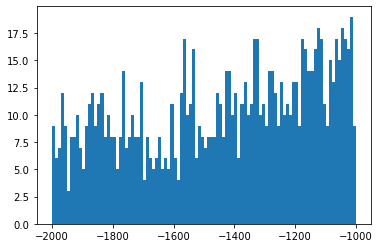

In [74]:

plt.hist(log_weights, bins=100, range=(-2000, -1000))

In [60]:
M = torch.max(log_weights)

In [61]:
m = torch.min(log_weights)

In [62]:
nrm_wghts = torch.exp(log_weights-M)/torch.sum(torch.exp(log_weights-M))

In [63]:
torch.nonzero(nrm_wghts).size()

torch.Size([1633, 1])

In [52]:
print(M)
print(m)

tensor(-10.1860)
tensor(-1.2095e+08)


In [65]:
print(torch.mean(nrm_wghts))
print(torch.std(nrm_wghts))

tensor(1.0000e-04)
tensor(0.0018)


In [67]:
import numpy as np
print(np.percentile(nrm_wghts.numpy(), 25))
print(np.percentile(nrm_wghts.numpy(), 50))
print(np.percentile(nrm_wghts.numpy(), 75))

0.0
0.0
0.0


In [71]:

M=np.max(log_weights)
m=np.min(log_weights)
nrm_wghts = np.exp(log_weights-M)/np.sum(np.exp(log_weights-M))
np.nonzero(nrm_wghts)[0].shape

(1633,)